# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[117495.50135958  95611.25879778 123396.80896711 163945.61903468
  92681.20263534  92681.69654331 166962.85594269 128287.52178985
  85865.50347172 119257.05562057  86034.4775969   85969.93480342
 108170.57813688  53738.68354952  57126.84793488  83317.25550298
  71981.73815777 110738.61693473  74472.65917597  63227.95366503
 160920.31283036  92933.55858926 102216.11620354  62973.06639424
  83802.88617593 103666.06970946  68824.92112422 112969.63603961
  82286.50855935  90966.24299436  82257.98971196 182437.27830573
  99562.84804397  70940.73323924 130603.02513683  67282.02216372
 107014.65789057  52935.55780

Omni_P_RQi ================== 0.10789674406088197
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 92681.20263533981, 'S': 10000, 'W': 10000, 'P': 0.10789674406088197, 'dP': 0}, 'j': {'R': 94899.45833203912, 'S': 10000, 'W': 10000, 'P': 0.1053746794319045}, 'k': {'R': 94899.45833203912, 'S': 10000, 'W': 10000, 'P': 0.1053746794319045}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10789616907073449
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 92681.69654331479, 'S': 10000, 'W': 10000, 'P': 0.10789616907073449, 'dP': 0}, 'j': {'R': 114014.10895731255, 'S': 10000, 'W': 10000, 'P': 0.08770844320455155}, 'k': {'R': 114014.10895731255, 'S': 10000, 'W': 10000, 'P': 0.08770844320455155}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10789616907073449
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'

config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 85969.9348034171, 'S': 10000, 'W': 10000, 'P': 0.11631973460101455, 'dP': 0}, 'j': {'R': 99143.07131612096, 'S': 10000, 'W': 10000, 'P': 0.10086433542203538}, 'k': {'R': 99143.07131612096, 'S': 10000, 'W': 10000, 'P': 0.10086433542203538}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09244657995029254
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 108170.5781368752, 'S': 10000, 'W': 10000, 'P': 0.09244657995029254, 'dP': 0}, 'j': {'R': 101974.26537911767, 'S': 10000, 'W': 10000, 'P': 0.09806395724276337}, 'k': {'R': 101974.26537911767, 'S': 10000, 'W': 10000, 'P': 0.09806395724276337}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09244657995029254
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 108170.5781368752, 'S': 10000, 'W': 10000, 'P': 

Omni_P_RQi ================== 0.1581578941013587
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 63227.95366503361, 'S': 10000, 'W': 10000, 'P': 0.1581578941013587, 'dP': 0}, 'j': {'R': 127643.63366130134, 'S': 10000, 'W': 10000, 'P': 0.07834311601105551}, 'k': {'R': 127643.63366130134, 'S': 10000, 'W': 10000, 'P': 0.07834311601105551}}}
config_param a value =============  1
Omni_P_RQi ================== 0.1581578941013587
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 63227.95366503361, 'S': 10000, 'W': 10000, 'P': 0.1581578941013587, 'dP': 0}, 'j': {'R': 127643.63366130134, 'S': 10000, 'W': 10000, 'P': 0.07834311601105551}, 'k': {'R': 127643.63366130134, 'S': 10000, 'W': 10000, 'P': 0.07834311601105551}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.06214255878648488
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

config_param a value =============  1
Omni_P_RQi ================== 0.07656790483622376
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 130603.0251368334, 'S': 10000, 'W': 10000, 'P': 0.07656790483622376, 'dP': 0}, 'j': {'R': 74197.58905611216, 'S': 10000, 'W': 10000, 'P': 0.13477526867399248}, 'k': {'R': 74197.58905611216, 'S': 10000, 'W': 10000, 'P': 0.13477526867399248}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.14862811310378346
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 67282.02216371568, 'S': 10000, 'W': 10000, 'P': 0.14862811310378346, 'dP': 0}, 'j': {'R': 165383.6300138332, 'S': 10000, 'W': 10000, 'P': 0.06046547653575852}, 'k': {'R': 165383.6300138332, 'S': 10000, 'W': 10000, 'P': 0.06046547653575852}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.14862811310378346
Initial Q HDX: 20000
config_init_state  

Omni_P_RQi ================== 0.11026717576809712
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90688.81949992987, 'S': 10000, 'W': 10000, 'P': 0.11026717576809712, 'dP': 0}, 'j': {'R': 106176.31014313601, 'S': 10000, 'W': 10000, 'P': 0.09418296780627455}, 'k': {'R': 106176.31014313601, 'S': 10000, 'W': 10000, 'P': 0.09418296780627455}}}
config_param a value =============  1
Omni_P_RQi ================== 0.11026717576809712
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90688.81949992987, 'S': 10000, 'W': 10000, 'P': 0.11026717576809712, 'dP': 0}, 'j': {'R': 106176.31014313601, 'S': 10000, 'W': 10000, 'P': 0.09418296780627455}, 'k': {'R': 106176.31014313601, 'S': 10000, 'W': 10000, 'P': 0.09418296780627455}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.16159413412186419
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.11331427344602592
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 88250.1356262344, 'S': 10000, 'W': 10000, 'P': 0.11331427344602592, 'dP': 0}, 'j': {'R': 111902.14637153111, 'S': 10000, 'W': 10000, 'P': 0.08936379081415088}, 'k': {'R': 111902.14637153111, 'S': 10000, 'W': 10000, 'P': 0.08936379081415088}}}
config_param a value =============  1
Omni_P_RQi ================== 0.11331427344602592
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 88250.1356262344, 'S': 10000, 'W': 10000, 'P': 0.11331427344602592, 'dP': 0}, 'j': {'R': 111902.14637153111, 'S': 10000, 'W': 10000, 'P': 0.08936379081415088}, 'k': {'R': 111902.14637153111, 'S': 10000, 'W': 10000, 'P': 0.08936379081415088}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.12457329089288877
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.08980534062886505
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 111351.95223329312, 'S': 10000, 'W': 10000, 'P': 0.08980534062886505, 'dP': 0}, 'j': {'R': 67930.2601865615, 'S': 10000, 'W': 10000, 'P': 0.14720979976429238}, 'k': {'R': 67930.2601865615, 'S': 10000, 'W': 10000, 'P': 0.14720979976429238}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.07285820950341836
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 137252.8925450854, 'S': 10000, 'W': 10000, 'P': 0.07285820950341836, 'dP': 0}, 'j': {'R': 123752.39939970698, 'S': 10000, 'W': 10000, 'P': 0.08080651404342531}, 'k': {'R': 123752.39939970698, 'S': 10000, 'W': 10000, 'P': 0.08080651404342531}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.07285820950341836
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset

Omni_P_RQi ================== 0.07219931704418876
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 138505.4652785651, 'S': 10000, 'W': 10000, 'P': 0.07219931704418876, 'dP': 0}, 'j': {'R': 185092.48488390775, 'S': 10000, 'W': 10000, 'P': 0.0540270449460556}, 'k': {'R': 185092.48488390775, 'S': 10000, 'W': 10000, 'P': 0.0540270449460556}}}
config_param a value =============  1
Omni_P_RQi ================== 0.07219931704418876
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 138505.4652785651, 'S': 10000, 'W': 10000, 'P': 0.07219931704418876, 'dP': 0}, 'j': {'R': 185092.48488390775, 'S': 10000, 'W': 10000, 'P': 0.0540270449460556}, 'k': {'R': 185092.48488390775, 'S': 10000, 'W': 10000, 'P': 0.0540270449460556}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.0889243243127533
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: 

Omni_P_RQi ================== 0.09721405797440938
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102865.78102348531, 'S': 10000, 'W': 10000, 'P': 0.09721405797440938, 'dP': 0}, 'j': {'R': 100422.92391840741, 'S': 10000, 'W': 10000, 'P': 0.09957885719524455}, 'k': {'R': 100422.92391840741, 'S': 10000, 'W': 10000, 'P': 0.09957885719524455}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09721405797440938
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102865.78102348531, 'S': 10000, 'W': 10000, 'P': 0.09721405797440938, 'dP': 0}, 'j': {'R': 100422.92391840741, 'S': 10000, 'W': 10000, 'P': 0.09957885719524455}, 'k': {'R': 100422.92391840741, 'S': 10000, 'W': 10000, 'P': 0.09957885719524455}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.11019216903914911
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.11768798561912017
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 84970.44067321815, 'S': 10000, 'W': 10000, 'P': 0.11768798561912017, 'dP': 0}, 'j': {'R': 126081.64059932392, 'S': 10000, 'W': 10000, 'P': 0.07931368875329833}, 'k': {'R': 126081.64059932392, 'S': 10000, 'W': 10000, 'P': 0.07931368875329833}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.11768798561912017
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 84970.44067321815, 'S': 10000, 'W': 10000, 'P': 0.11768798561912017, 'dP': 0}, 'j': {'R': 126081.64059932392, 'S': 10000, 'W': 10000, 'P': 0.07931368875329833}, 'k': {'R': 126081.64059932392, 'S': 10000, 'W': 10000, 'P': 0.07931368875329833}}}
config_param a value =============  1
Omni_P_RQi ================== 0.11768798561912017
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

config_param a value =============  0.5
Omni_P_RQi ================== 0.11122186327436423
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 89910.3800781669, 'S': 10000, 'W': 10000, 'P': 0.11122186327436423, 'dP': 0}, 'j': {'R': 66740.52171809219, 'S': 10000, 'W': 10000, 'P': 0.1498340100222677}, 'k': {'R': 66740.52171809219, 'S': 10000, 'W': 10000, 'P': 0.1498340100222677}}}
config_param a value =============  1
Omni_P_RQi ================== 0.11122186327436423
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 89910.3800781669, 'S': 10000, 'W': 10000, 'P': 0.11122186327436423, 'dP': 0}, 'j': {'R': 66740.52171809219, 'S': 10000, 'W': 10000, 'P': 0.1498340100222677}, 'k': {'R': 66740.52171809219, 'S': 10000, 'W': 10000, 'P': 0.1498340100222677}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.11357298698019432
Initial Q HDX: 20000.0
config_init_state  <class

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

 -6431.522167705846
H_agent r out =  103029.78025943998
**********
Q ADDED INTO POOL: 1000 to existing amount 22792.78360504654
**********
**********
 q_sold =  1000
q_sold = 4597.228522036122H_chosen_agentq_sold =  
 addliq - Sq delta S1000

q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 6431.522167705846 from reserve 79929.23859147911
**********
 1000q_sold =  
H_chosen_agent 4597.228522036122q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 77094.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 104400.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91282.57 110000.00 1360

POOL ADD LIQUIDITY Timestep ===  10 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 100516.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta W  6542.553952026663
q_sold = 
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111087.39 110000.00 136000.00 170000.00 150000.00 0.00 144832.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91923.64 110000.00 134000.00 170000.00 150000.00 0.00 79502.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -5062.6375514046085
H_agent r out =  79502.05994393658
**********
Q ADDED INTO POOL: 1000 to existing amount 32313.368954197085
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5

  1000
1000
q_sold = 
H_agent r out =  161098.6017787933
**********
Q ADDED INTO POOL: 1000 to existing amount 30647.36276846384
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3364.5067223861024 from reserve 55138.67482218052
********** 1000
H_chosen_agentq_sold = q_sold =  1000
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111087.39 110000.00 134000.00 170000.00 150000.00 0.00 156340.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91282.57 110000.00 132000.00 170000.00 150000.00 0.00 77543.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3643.5714441007267
H_agent r out =  77543.1960034385
**********
Q ADDED INTO POOL: 1000 to existing amount 33242.428731499735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3643.5714441007267 from reserve 59442.654

H_chosen_agent 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108616.67 110000.00 133000.00 170000.00 150000.00 0.00 167916.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5151.041270611892
H_agent r out =  167916.43551001363
**********
Q ADDED INTO POOL: 1000 to existing amount 31973.88427173732
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5151.041270611892 from reserve 78097.67344729889
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 90911.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2610.516445945024
H_agent r out =  90911.37595101644
**********
Q ADDED INTO POOL: 1000 to existing amount 29200.49063150937
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2610.516445945024 from reserve 41076.415014469276
**********
********** 
q_sold

**********
POOL RESERVE ONE REMOVING ASSET j in amount 4716.072565807084 from reserve 95322.56374813206
**********delta_Ri =  3640.9124869040375

H_agent r out =  170199.0639552659
**********
Q ADDED INTO POOL: 1000 to existing amount 32542.92114718752
**********
 H_agent r out = 
q_sold =  1000
********** 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111087.39 110000.00 130000.00 170000.00 150000.00 0.00 172404.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 2680.0335542585835 from reserve 49038.21264570792181678.30283205377

**********
Q ADDED INTO POOL: 1000 to existing amount 34736.355439275074
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3640.9124869040375 from reserve 65335.80612525874
**********
delta_Ri =  3143.7582058410117
H_agent r out =  172404.51355825353
**********
Q ADDED INTO POOL: 1000 to existing amount 33202.536930072405
**********
****

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3964.468263292597 from reserve 87243.85555259229
**********

q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 37796.23467531183
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1775.750505133114 from reserve 40531.7273967406
**********
q_sold = H_chosen_agent41693.106282261295H_chosen_agentq_sold = q_sold =  q_sold =   1000
  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108616.67 110000.00 128000.00 170000.00 150000.00 0.00 188785.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 80016.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00

q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 181097.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91923.64 110000.00 118000.00 170000.00 150000.00 0.00 37076.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1323.1666986184034
H_agent r out =  37076.401719340116
**********
Q ADDED INTO POOL: 1000 to existing amount 45981.06106664606
**********
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00  -111.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108616.67 110000.00 126000.00 170000.00 150

q_sold =  1000

 q_sold = q_sold = q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1286.5938993344505 from reserve 37238.94762200705
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 75220.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1768.3646860908284
  H_agent r out =  50033.04840607598
**********
Q ADDED INTO POOL: 1000 to existing amount 40054.26769639683
**********
**********
1000POOL RESERVE ONE REMOVING ASSET j in amount 1768.3646860908284 from reserve 40932.506738115124
**********

1000 
q_sold =  delta_Ri =  q_sold = -1554.2780668450669
H_agent r out =  75220.29843833976
**********
q_sold = 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88659.95 110000.00 119000.00 170000.00 150000.00 0.00 51286.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1312.90801332

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 70887.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1432.0235257905197
H_agent r out =  70887.21966678087
**********
Q ADDED INTO POOL: 1000 to existing amount 34434.40715582798
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1432.0235257905197 from reserve 30052.258730233712
**********


q_sold = delta_Ri =  1936.8312470825779
H_agent r out =  198835.07232420298
**********
Q ADDED INTO POOL: 1000 to existing amount 37896.90226410384
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1936.8312470825779 from reserve 43777.429172155615
**********
q_sold =  1000
delta_Ri =  -1197.7307401010796
H_agent r out =  28136.724336094736
**********
Q ADDED INTO POOL: 1000 to existing amount 47350.3999822634
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1197.7307401010796 fro

q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 196249.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1992.0223225084342
H_agent r out =  196249.118479352
**********
Q ADDED INTO POOL: 1000 to existing amount 35306.020360598974
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1992.0223225084342 from reserve 41988.15812162184
**********
 q_sold = q_sold =  1000
1000 1000
H_chosen_agent q_sold =  1000
H_chosen_agent q_sold = 
  1000
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108616.67 110000.00 117000.00 170000.00 150000.00 0.00 213996.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91282.57 110000.00 114000.00 17

delta_Ri =  -1485.983193534425
H_agent r out =  36441.84326882998
**********
Q ADDED INTO POOL: 1000 to existing amount 42031.325727320385
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1485.983193534425 from reserve 37341.301600869134
**********
q_sold = q_sold =  
delta_Ri = 
q_sold = 1000 1214.983926018011
H_agent r out =  219725.55593489693
********** 1000
H_chosen_agentH_chosen_agent
 q_sold =   Q ADDED INTO POOL: 1000 to existing amount 47416.44622710426
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1214.983926018011 from reserve 37288.553022415595
**********
1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88659.95 110000.00 113000.00 170000.00 150000.00 0.00 42683.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2011.832531571824
H_agent r out =  42683.722978966034
**********
Q ADDED INTO POOL: 1000 to existing amount 36433.70922461098
**********
**********
POOL RESERV

 q_sold =  delta_Ri = 1000   1000-1989.6171350243621q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 203545.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 1000

H_agent r out =  -27997.653883014784
**********
Q ADDED INTO POOL: 1000 to existing amount 42763.7221876647
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1989.6171350243621 from reserve 61458.65656493681
**********
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91923.64 110000.00 102000.00 170000.00 150000.00 0.00 17065.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 1000q_sold =  1000q_sold =  -1134.9944933639708
H_agent r out =  17065.532557466762
**********
q_sold =  1000


delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 48059.999177962716 1530.4080140316003
H_agent r out = 
q_sold =   1000
H_chose

delta_Ri =  **********
q_sold =  1000

 
POOL RESERVE ONE REMOVING ASSET j in amount 1407.578765332125 from reserve 35161.497239846714   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88659.95 110000.00 109000.00 170000.00 150000.00 0.00 35545.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
**********
delta_Ri = q_sold =  1000
H_chosen_agent q_sold = 
 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91282.57 110000.00 109000.00 170000.00 150000.00 0.00 30415.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -1059.9421387847722
H_agent r out =  14867.33229935452
**********
Q ADDED INTO POOL: 1000 to existing amount 49097.750450674976
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1059.9421387847722 from reserve 33586.618060414905
**********delta_Ri =  -1651.0756849864588
H_agent r out =  35545.57171313556
**********
Q ADDED INTO POOL: 1

q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent  1000
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 1221.6425602070392 from reserve 33741.697753507586
**********
q_sold =  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88659.95 110000.00 105000.00 170000.00 150000.00 0.00 29687.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1198.8213367944975
H_agent r out =  29687.51283416501
**********
Q ADDED INTO POOL: 1000 to existing amount 42596.393469463284
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1198.8213367944975 from reserve 33159.671963891305
q_sold =  1000
q_sold =  q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 -40214.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1611.6068166

0 130000.00 180000.00 160000.00  
q_sold =  1000 q_sold =  1000

delta_Ri =  1422.3327093914666
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 52475.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1325.78056352046
H_agent r out =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 -45066.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1619.8339005006537
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111087.39 110000.00 105000.00 170000.00 150000.00 0.00 218505.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1121.8691073688854
H_agent r out =  218505.28188925047
**********
Q ADDED INTO POOL: 1000 to existing amount 44773.302856619324
**********
**********
POOL

   10001000  H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91923.64 110000.00 92000.00 170000.00 150000.00 0.00  6780.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000



delta_Ri =  -1255.3431381038254
H_agent r out =  6780.247160385845
**********
Q ADDED INTO POOL: 1000 to existing amount 36106.79964868651
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1255.3431381038254 from reserve 36499.53292144623
**********
 delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 49852.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1183.8674680661536
H_agent r out =  49852.341756881506
**********
Q ADDED INTO POOL: 1000 to existing amount 36264.97618434968
**********q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_

q_sold =  1000

q_sold =  1000
H_chosen_agentq_sold =  1000
H_chosen_agent **********
delta_Ri =  -1578.8588900811835
H_agent r out =  -51775.29322762471
**********
Q ADDED INTO POOL: 1000 to existing amount 46489.40617112426
delta_Ri =  -1156.1804594140467

q_sold =  1000

H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111087.39 110000.00 102000.00 170000.00 150000.00 0.00 221854.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1381.668934205377147499.104312548196
**********
Q ADDED INTO POOL: 1000 to existing amount 36505.35312133973
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1156.1804594140467 from reserve 26664.143376001033
**********
q_sold =  q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1227.2485679208858 from reserve 32704.062153363317   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88659.95 110000.00 95000.00 170000.00 150000.0

H_chosen_agent H_chosen_agentdelta_Ri = q_sold =  1000
q_sold =  H_chosen_agentq_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88659.95 110000.00 91000.00 170000.00 150000.00 0.00 17112.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -830.9880122282824
 1000
      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 43985.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000845.937166418257
H_agent r out =  239036.34007352896
**********
Q ADDED INTO POOL: 1000 to existing amount 53325.23986986466
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 845.937166418257 from reserve 30977.768883783534
**********
H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91282.57 110000.00 95000.00 170000.00 150000.00 0.00 14460.53 130000.00   

        q_j       s

H_chosen_agent H_chosen_agentaddliq - Sq delta Sq 4877.5460727133195
addliq - Sq delta S 4877.5460727133195
POOL ADD LIQUIDITY Timestep ===  10 delta W  5689.569430918516
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 -59552.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1266.16425996233q_sold =  1000

1000    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91282.57 110000.00 93000.00 170000.00 150000.00 0.00 12136.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1112.46941411022
H_agent r out =  12136.659256811157
**********
Q ADDED INTO POOL: 1000 to existing amount 35844.93657490978
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1112.46941411022 from reserve 32036.117588850306
**********
H_agent r out =  228437.4305383068
**********
Q ADDED INTO POOL: 1000 to existing amount 35506.91112764389


delta_Ri =  1000 -10959.607957796343
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10959.607957796343 from reserve 119257.05562057192
**********
q_sold = q_sold =  1000
1000
q_sold = addliq - Sq delta Sqq_sold =  1000
H_chosen_agent  
1000 5190.129912583696
addliq - Sq delta S 5190.129912583696
POOL ADD LIQUIDITY Timestep ===  10 delta W  6334.604642991913
q_sold =  1000
q_sold =  1000

 H_chosen_agentq_sold =  1000
H_chosen_agent q_sold =  1000
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 38787.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84579.56 110000.00 135000.00 170000.00 150000.00 0.00 96983.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3800.24

q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4210.993360102018 from reserve 62261.34848812897
**********
q_sold =  1000
 1000

 H_chosen_agentq_sold =   1000

H_chosen_agent1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84579.56 110000.00 133000.00 170000.00 150000.00 0.00 89611.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
H_agent r out = 
delta_Ri =  -3122.011371998439
H_agent r out =  89611.67255247638
**********
Q ADDED INTO POOL: 1000 to existing amount 29985.70357273193
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3122.011371998439 from reserve 49684.95766348557
********** 176274.7612965737
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89040.39 110000.00 136000.00 170000.00 150000.00 0.00 95996.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5629.596898200676
H_agent r out =  95996.68336476713


delta_Ri = H_chosen_agentH_chosen_agent   1000q_sold = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89040.39 110000.00 132000.00 170000.00 150000.00 0.00 75747.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3915.619407636939
H_agent r out =  75747.88696382135
**********
Q ADDED INTO POOL: 1000 to existing amount 31389.860156744882
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3915.619407636939 from reserve 63360.38846017998
**********
-4326.221545739841q_sold =  1000
q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91213.42 110000.00 128000.00 170000.00 150000.00 0.00 69521.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2211.8421018508957
H_agent r out =  69521.82729518454
**********
Q ADDED INTO POOL: 1000 to existing amount 36671.909717697075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in 

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 162412.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3364.4843886674307
H_agent r out =  162412.29529660137
**********
Q ADDED INTO POOL: 1000 to existing amount 31496.75576187639
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3364.4843886674307 from reserve 57487.163035437756
**********

1000q_sold = 1000Q ADDED INTO POOL: 1000 to existing amount 35985.70357273193
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1615.6288087045552 from reserve 35436.164789917995
**********

 q_sold = 
H_chosen_agent q_sold = H_chosen_agent1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91213.42 110000.00 125000.00 170000.00 150000.00 0.00 63219.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
  
delta_Ri =  -1814.7082570990065
H_agent

0 130000.00 180000.00 160000.00  
delta_Ri =  -1316.7939265588093
H_agent r out =  70837.28475292228
**********
Q ADDED INTO POOL: 1000 to existing amount 38280.11350325468
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1316.7939265588093 from reserve 31910.569863931487
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 194663.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

q_sold = 
 
q_sold = 1000delta_Ri = delta_Ri =  -3968.329295401926 2442.5830138107244
H_agent r out =  194663.04260595044
**********

Q ADDED INTO POOL: 1000 to existing amount 36099.08385764864
**********
**********

delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 2442.5830138107244 from reserve 52056.243155109914q_sold = H_agent r out =  71920.32154883984
**********
Q ADDED INTO POOL: 1000 to existing amount 31650.05968143335
********** q_sold =  1000
H_chosen

q_sold = H_chosen_agentH_chosen_agent  1000
1000q_sold =  1000
1000 q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84579.56 110000.00 122000.00 170000.00 150000.00 0.00 68308.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1442.964037055405
H_agent r out =  68308.17654054963
**********
Q ADDED INTO POOL: 1000 to existing amount 37183.20466361305
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1442.964037055405 from reserve 33381.461651558835
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 67951.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent q_sold =  1000
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87933.50 110000.00 129000.00 170000.00 150000.00 0.00 62724.75 130000.00   

        q_j       s

q_sold =  
Q ADDED INTO POOL: 1000 to existing amount 41768.4398629842
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1393.168466724157 from reserve 35351.73069906847
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 57738.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1374.0036838633084
H_agent r out =  65458.43724807638
**********
Q ADDED INTO POOL: 1000 to existing amount 37724.50525464236
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1374.0036838633084 from reserve 32531.722359085597
**********

delta_Ri =  -2904.132424658356
H_agent r out =  57738.22740992676
**********
Q ADDED INTO POOL: 1000 to existing amount 34480.69871072136
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2904.132424658356 from reserve 58752.33636723931
**********
 q_sold = q_sold =  1000
1000 q_sold = 1000


H_chosen_agent  -1108.5715070888446H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 52204.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87933.50 110000.00 124000.00 170000.00 150000.00 0.00 49618.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000



delta_Ri =  -1946.6332588870864
H_agent r out =  49618.42096376075
delta_Ri = 1000H_agent r out =  48241.245768556466
**********
Q ADDED INTO POOL: 1000 to existing amount 44768.4398629842
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1108.5715070888446 from reserve 31478.522369530267
**********
 **********q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 38429.356870983H_chosen_agent
-2392.0365423666594 H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out

1000q_sold =  1000
1000

q_sold =  1000
q_sold =  1000

q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 166941.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  2494.4606317453995
H_agent r out = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 214496.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1000
H_chosen_agent 
q_sold =  q_sold = 1000166941.83252416528
q_sold = 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 41326.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
1000
delta_Ri =  -1822.9275618161005
H_agent r out = 
  q_sold = ********** 1000
413

0 130000.00 180000.00 160000.00  1000

  H_chosen_agentq_sold = 
delta_Ri = 10001000delta_Ri = 
 1000
H_chosen_agent delta_Ri =  1669.6823147900102
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84579.56 110000.00 110000.00 170000.00 150000.00 0.00 53381.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1139.2224289119438
H_agent r out =  53381.65230149228
**********
Q ADDED INTO POOL: 1000 to existing amount 39898.194441092724
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1139.2224289119438 from reserve 29454.9374125015
**********
q_sold =  1000
delta_Ri =  -1833.3079335213788
H_chosen_agentH_agent r out =  29311.147499046678
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 197877.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1578.6995012664706
H_agent r out =  175350.2096

Q ADDED INTO POOL: 1000 to existing amount 42052.077699461246
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1247.373197094906 from reserve 34552.72177566956
**********
 **********q_sold = 
  POOL RESERVE ONE REMOVING ASSET j in amount 1682.5832167445103 from reserve 41090.34106188394
**********
q_sold = 1000-1364.402125263752

 q_sold = H_agent r out = 1000
q_sold =  1000q_sold =  q_sold = 38720.00028946551
**********
Q ADDED INTO POOL: 1000 to existing amount 42012.55334159213
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1364.402125263752 from reserve 34957.27689043932
**********
 q_sold = 10001000 q_sold = 
 1000

 
1000
H_chosen_agent  q_sold = H_chosen_agent 10001000H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87933.50 110000.00 115000.00 170000.00 150000.00 0.00 33843.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1574.8425542496595
H_agent r out =  33843

********** 
delta_Ri =  -1342.1181670413168
H_agent r out =  33419.42557397982
**********
Q ADDED INTO POOL: 1000 to existing amount 42212.55620325028
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1342.1181670413168 from reserve 34656.702174953636
**********
Q ADDED INTO POOL: 1000 to existing amount 41196.601590918384delta_Ri =  -1276.3189662761386
H_agent r out =  26686.430681887574
**********
Q ADDED INTO POOL: 1000 to existing amount 43681.32142069946
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84579.56 110000.00 104000.00 170000.00 150000.00 0.00 47005.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1116.746895317049
H_agent r out =  47005.88360946397
**********
Q ADDED INTO POOL: 1000 to existing amount 40081.67058052966
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1116.746895317049 from reserve 29079.168720473193
**********
q_sold = 
**********
**********
POOL RESERVE

q_sold = 
delta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 185776.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   10001000
 delta_Ri = **********
delta_Ri =  1357.554833032525
H_agent r out =  185776.01317851536
**********
Q ADDED INTO POOL: 1000 to existing amount 34947.00014855994
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1357.554833032525 from reserve 29389.025884937444
**********

H_agent r out = 1000 
1291.664642215277

 225338.04764910118
**********
Q ADDED INTO POOL: 1000 to existing amount 37937.02618701833
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2045.817811083917 from reserve 47381.23811195909
**********
**********H_chosen_agent

-1062.4898166162095H_chosen_agentH_agent r out = POOL RESERVE ONE REMOVING ASSET j in amount 960.2415460984133 from reserve 26928.358111380232 q_sold = 
**********
 q_sold =      

q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agentq_sold = q_sold =  1000
H_chosen_agent  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 188743.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89040.39 110000.00 104000.00 170000.00 150000.00 0.00 13001.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = q_sold =  1000
q_sold =  1000
H_chosen_agent  q_sold =  1000
q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 19911.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1165.5581289161153
H_agent r out =  19911.100753784973
**********
Q ADDED INTO POOL: 1000 to existing amount 45849.99641909562
**********
**********
POOL RE


**********
**********
Q ADDED INTO POOL: 1000 to existing amount 34557.23689077521
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1405.1974921090705 from reserve 29869.624428200397
**********
-867.0514276487946 q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91213.42 110000.00 96000.00 170000.00 150000.00 0.00 25167.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out =  18158.83187606518
**********
Q ADDED INTO POOL: 1000 to existing amount 49647.48206084597
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 867.0514276487946 from reserve 29989.13476127581
**********

1000q_sold = q_sold =  1000
delta_Ri =  -1176.381001526622
H_agent r out =  25167.10188549004
**********
Q ADDED INTO POOL: 1000 to existing amount 43924.18040504113
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1176.381001526622 from reserve 32404.378486463862
**********
q_sold =  1000
 q_sold =

 **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1430.9415014620404 from reserve 32807.04712665065
**********
q_sold = 1000
delta_Ri = 1000********** q_sold = 
delta_Ri =  -896.840924158908
H_agent r out =  15644.509986684088
**********
Q ADDED INTO POOL: 1000 to existing amount 49041.1066784938
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 896.840924158908 from reserve 30474.81287189472
**********

-915.0485511824072  
q_sold = q_sold = 1000Q ADDED INTO POOL: 1000 to existing amount 45924.18040504113 1000
H_chosen_agent 

1000 1000


H_agent r out =  15653.060972028266
********************q_sold =  1000

H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87933.50 110000.00 98000.00 170000.00 150000.00 0.00 14747.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
delta_Ri =  -845.5266189616833
H_agent r out =  14747.66906252518
    m   r_i_out    r_i_in     

H_chosen_agentq_sold = H_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 220099.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87933.50 110000.00 93000.00 170000.00 150000.00 0.00 10754.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 

delta_Ri = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 197821.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84579.56 110000.00 92000.00 170000.00 150000.00 0.00 33536.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  

-1805.4933863201002q_sold = 
q_sold =  1000
H_agent r out =  31754.291989455425
delta_Ri = q_sold = H_chosen_agent  ********** 1000
H_chosen_agent  
Q ADDED INTO POOL: 1000 to existing amount 29527.836956291518
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1805.4933863201002 from reserve 36827.57710046465
**********
937.40917532873241000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 94295.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91213.42 110000.00 89000.00 170000.00 150000.00 0.00 17639.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -6071.2228621582235
H_agent r out =  94295.7397527789
**********
Q ADDED INTO POOL: 1000 to existing amount 22793.468224077402
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6071.2

  1000
1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  8457.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -746.279620692012
H_agent r out =  8457.292378127651
**********
Q ADDED INTO POOL: 1000 to existing amount 53625.28647782982
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 746.279620692012 from reserve 29471.4013354402
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 110778.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********

154273.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta_Ri =  -3830.5410817843654
H_agent r out =  110778.85019552485
**********
Q ADDED INTO POOL: 1000 to existing amount 21363.509275527966
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 

  1194.0321108332878q_sold =  q_sold =  1000
H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115242.11 110000.00 136000.00 170000.00 150000.00 0.00 140148.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5831.761301637088
H_agent r out =  140148.0404081465
**********
Q ADDED INTO POOL: 1000 to existing amount 25796.469885356764
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5831.761301637088 from reserve 68925.24470286266
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 94510.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold =  1000

q_sold = 
H_chosen_agentH_agent r out =  1000  delta_Ri =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87933.50 110000.00 86000.00 170000.00 150000.00 0.00  6224.8

0 130000.00 180000.00 160000.00    q_sold = -940.9144935977665
H_agent r out =  5288.223314798465
**********
Q ADDED INTO POOL: 1000 to existing amount 39272.79974631825
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 940.9144935977665 from reserve 31118.526200009095
**********
q_sold =  1000

delta_Ri =  -5218.265997763719
H_agent r out =  89036.67731664327
**********
Q ADDED INTO POOL: 1000 to existing amount 26601.936524524273
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5218.265997763719 from reserve 69508.83644636956
**********
 q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 111280.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7405.551344770963
H_agent r out =  111280.43200966802
**********
Q ADDED INTO POOL: 1000 to existing amount 20766.78221219048
**********
**********
POOL RESERVE ONE REMOVING ASSE

**********
 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1250.7185830663138 from reserve 25979.863316493673
**********
delta_Ri = q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 138161.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7313.09769081286q_sold =  1000
q_sold =  1000
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 87000.00 170000.00 150000.00 0.00   501.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 74925.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 

0 130000.00 180000.00 160000.00  10   

delta_Ri =  -3821.9278202636515
H_agent r out =  100471.40030837856
**********
Q ADDED INTO POOL: 1000 to existing amount 28572.119662819932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3821.9278202636515 from reserve 50636.439371831366
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 76429.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 1000 delta_Ri =  -1217.6340782195018
H_agent r out =  83950.47520436575
**********
Q ADDED INTO POOL: 1000 to existing amount 35937.34917040919
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1217.6340782195018 from reserve 25593.464002584496

delta_Ri =  -4140.601102471323
H_agent r out =  76429.24875090964
**********
Q ADDED INTO POOL: 1000 to existing amount 29836.274914397138
**********
**********
POOL RESERVE ONE REMOVING ASSE

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115242.11 110000.00 122000.00 170000.00 150000.00 0.00 185617.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  1609.626389419432
H_agent r out =  185617.63056575533
**********
Q ADDED INTO POOL: 1000 to existing amount 35927.92960951499
**********
-13239.4789668107021000
q_sold =  1000
H_agent r out =  q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1609.626389419432 from reserve 35455.654545253856
**********
1000

 q_sold =  1000
H_chosen_agentq_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent 87423.41298631034   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 41580.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2425.85020063561
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  

q_sold =   1000H_chosen_agent1000
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 167668.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 1220.9248298884556 from reserve 30790.566653296082
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84295.76 110000.00 135000.00 170000.00 150000.00 0.00 62671.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -1909.459344421473q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 75913.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115242.11 110000.00 117

 176776.23219624
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115242.11 110000.00 114000.00 170000.00 150000.00 0.00 196522.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 29810.865181359943
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3866.7827711704567 from reserve 65054.070688970605
**********
q_sold =  1000
q_sold = 
q_sold =   1000
H_chosen_agent delta_Ri =  1450.1350383337222
H_agent r out =  196522.11346745037
**********
Q ADDED INTO POOL: 1000 to existing amount 37031.338712455276
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84295.76 110000.00 130000.00 170000.00 150000.00 0.00 23207.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  1000
H_chosen_agent 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  

**********delta_Ri =   POOL RESERVE ONE REMOVING ASSET j in amount 910.8742259271825 from reserve 21909.742921779693Q ADDED INTO POOL: 1000 to existing amount 37812.40199913247

********************
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1760.384670485133 from reserve 41528.81769054394
**********
q_sold =  1000
-1780.1426219417733
1000
q_sold =  1000
q_sold =  1000
H_agent r out =  68973.4443840743
**********
Q ADDED INTO POOL: 1000 to existing amount 34430.51925881443
**********
q_sold =  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1780.1426219417733 from reserve 34138.48344752708
**********
q_sold =  1000
q_sold =  1000q_sold =  1000
q_sold = 1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 22671.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1606.160004580924
H_agent r out =  22671.750161250995
****

q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3863.850051592077 from reserve 84686.21053103654
**********
q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent q_sold =  1000
 1000
q_sold =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 35787.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
1000

  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 39737.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
delta_Ri =  -2029.680372112667
H_agent r out =  39737.306206988535
**********
Q ADDED INTO POOL: 1000 to existing amount 36226.57384843036 1000
delta_Ri =  -1038.9732729834514
H_agent r out =  35787.06804009561
**********
Q ADDED INTO POOL: 1000 to existing amount 42360.657835118305
**********
**********
POOL RES

q_sold = delta_Ri = 
H_chosen_agentdelta_Ri =  -1384.7431691396055
H_agent r out =  14591.51705495298
**********
Q ADDED INTO POOL: 1000 to existing amount 42982.57759966587
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1384.7431691396055 from reserve 39310.802816013354
**********
q_sold =  1000
H_chosen_agent   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 32668.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent1000
q_sold =  1000
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 64099.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1363.0190880513458
H_agent r out =  64099.20632314091
**********-1240.5492667429248 -1102.6267795803449
H_agent r out =  32668.708485147585
**********
Q ADDED INTO POOL: 1000 to ex

 Q ADDED INTO POOL: 1000 to existing amount 38143.19318023963
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1234.40858664595 from reserve 28297.06940819763
**********
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 35517.22759816812
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2108.2146950186957 from reserve 47573.97035425241
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 60109.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1270.918284160654
H_agent r out =  60109.23047433817
**********
Q ADDED INTO POOL: 1000 to existing amount 35183.194622769595
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1270.918284160654 from reserve 25752.219272556904
**********
q_sold = 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 1

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89202.28 110000.00 108000.00 170000.00 150000.00 0.00 49382.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1171.7790588824844
H_agent r out =  49382.24786865109
**********
Q ADDED INTO POOL: 1000 to existing amount 38723.87925173361
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1171.7790588824844 from reserve 27547.286932103867
**********
q_sold =  1000
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 22277.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 84295.76 110000.00 116000.00 170000.00 150000.00 0.00 -25612.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2294.3145092570267
H_agent r out =  -25612.409701069606
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 110819.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =  1000
H_chosen_agent delta_Ri = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 229912.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1424.0817729478779
H_agent r out =  229912.4485230012
**********
Q ADDED INTO POOL: 1000 to existing amount 40257.40398968279
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1424.0817729478779 from reserve 38917.85436220943
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 51584.05 130000.00   

        q_j       s_j  
0 180000.00 160000.0

H_chosen_agentq_sold = H_agent r out = 1000   q_sold = Q ADDED INTO POOL: 1000 to existing amount 25473.090567187726
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1380.3118367180543 from reserve 26691.501909554278
**********

H_chosen_agent 96896.36500548474
**********
Q ADDED INTO POOL: 1000 to existing amount 25981.534599621296
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 234236.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1402.3898507053968
H_agent r out =  234236.29211038147
**********
Q ADDED INTO POOL: 1000 to existing amount 40448.40409801722
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1402.3898507053968 from reserve 38594.01077482917
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89202.28 110000.00 104000.00 170000.00 150000.00 0.00 44678.48

0 130000.00 180000.00 160000.00  q_sold =  1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 84295.76 110000.00 107000.00 170000.00 150000.00 0.00 -42980.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 

delta_Ri =  -1631.233438347389
H_agent r out =  -42980.42366419421
**********
Q ADDED INTO POOL: 1000 to existing amount 47357.308640017145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1631.233438347389 from reserve 54475.886783757356
**********
q_sold = 1000

 1000
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 85853.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  155423.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9245.285975613664 delta S  5423
POOL REMOVE LIQUIDITY share fraction of pool = 0.2190481955115338
delta_Ri =  1411.043285

q_sold = 
q_sold = q_sold =  1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5175.340611409777 from reserve 54642.98879821878
**********
1000 1000 1000
H_chosen_agent


 H_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 13228.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00       m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  7175.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000

q_sold =  1000

H_chosen_agent delta_Ri =  -1230.0602554098116
H_agent r out =  13228.171039375853
**********
Q ADDED INTO POOL: 1000 to existing amount 33163.685395634966
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1230.0602554098116 from reserve 32700.33016910216
**********
   m   r_i_out    r_i_in         h    

1000

**********1000 
H_chosen_agentH_chosen_agent1000    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89202.28 110000.00 95000.00 170000.00 150000.00 0.00 33418.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
 1000
**********
 

Q ADDED INTO POOL: 1000 to existing amount 21887.180418808064delta_Ri = q_sold = 
q_sold =  1000
**********
**********
  -1256.6341363450185
H_agent r out =  33418.947441558106
**********
Q ADDED INTO POOL: 1000 to existing amount 30707.907920337166
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1256.6341363450185 from reserve 28583.986505010893
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91282.52 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1000POOL RESERVE ONE REMOVING ASSET j in amount 4210.953306089625 from reserve 49021.911792972816q_sold

q_sold =  2616.059789066244
H_agent r out =  140423.92852961473
**********
Q ADDED INTO POOL: 1000 to existing amount 31935.22693384693
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2616.059789066244 from reserve 38219.060268604044
**********
 
q_sold = 1000
H_chosen_agent  1000 H_chosen_agent
q_sold = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91006.97 110000.00 137000.00 170000.00 150000.00 0.00 104995.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91282.52 110000.00 137000.00 170000.00 150000.00 0.00 100390.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88210.50 110000.00 136000.00 170000.00 150000.00 0.00 94928.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 
delta_Ri =  -5917.6869

**********delta_Ri =  H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 3246.007608183749 from reserve 54809.4419512136 1000
 
1000
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 61196.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1921.8279911521565
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107998.67 110000.00 128000.00 170000.00 150000.00 0.00 153026.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-3599.289033056097 61196.822567118514
**********
Q ADDED INTO POOL: 1000 to existing amount 32432.444074441497
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1921.8279911521565 from reserve 39270.10767812769
**********

q_sold = 
delta_Ri =  1391.2812873576634
H_agent r out =  153026.52029427618
**********
Q ADDED INTO POOL: 1000 to existing amount 37

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111472.27 110000.00 128000.00 170000.00 150000.00 0.00 171884.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 q_sold = 
q_sold =  q_sold =  1000
55674.07234269942
**********
Q ADDED INTO POOL: 1000 to existing amount 33761.616030156496
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1687.6371285526861 from reserve 36747.3574537086
**********
1000  q_sold = 
delta_Ri =  1000
1000 H_chosen_agent
2267.1467845318007 1000
H_chosen_agent
H_chosen_agent H_agent r out =  171884.87505015128
**********
Q ADDED INTO POOL: 1000 to existing amount 35244.5963474355
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2267.1467845318007 from reserve 45587.28407957502
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 43056.38   

     r_j_in       q_j       

q_sold = q_sold =  
 1000
 1000
H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107998.67 110000.00 120000.00 170000.00 150000.00 0.00 164424.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 163345.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91282.52 110000.00 123000.00 170000.00 150000.00 0.00 40229.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2300.4069836259946
H_agent r out =  40229.5443571921
**********
Q ADDED INTO POOL: 1000 to existing amount 39185.329841961175
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2300.4069836259946 from reserve 51243.65331450465
**********
 10

 
q_sold =  1000
 delta_Ri =  1087.6798853634702
H_agent r out =  168403.57093211444
**********
Q ADDED INTO POOL: 1000 to existing amount 39558.90174702008
**********
q_sold =  1000
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET j in amount 1087.6798853634702 from reserve 24239.417866104326
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91282.52 110000.00 120000.00 170000.00 150000.00 0.00 33815.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1849.1044644402202
H_agent r out =  33814.99862890683
**********
Q ADDED INTO POOL: 1000 to existing amount 41687.573203424654
**********
********************q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 34527.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 1849.1044644402

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 208856.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
1000
H_chosen_agent q_sold = 
q_sold = q_sold =  1000
H_chosen_agent delta_Ri =  4905.147216669306
H_agent r out =  208856.22863595083
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91282.52 110000.00 114000.00 170000.00 150000.00 0.00 24516.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1249.392600037083
H_agent r out =  24516.81036172255
**********
Q ADDED INTO POOL: 1000 to existing amount 46931.23541849151
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1249.392600037083 from reserve 37530.91931903511
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 26407.91   

     r_j_in    

0 180000.00 160000.00   

delta_Ri =  720.7562186811465
H_agent r out =  176010.39998688016
**********
Q ADDED INTO POOL: 1000 to existing amount 44487.74883292723
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 720.7562186811465 from reserve 19632.58881133859
**********
1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 37033.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1544.7670260609927
H_agent r out =  37033.44140417899
**********
Q ADDED INTO POOL: 1000 to existing amount 34705.72988572326
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1544.7670260609927 from reserve 35106.72651518818
**********
1000q_sold = 
 delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111472.27 110000.00 115000.00 170000.00 150000.00 0.00 196641.15   

     r_j_in       q_j       s_j  
0 

0 180000.00 160000.00   1000
q_sold = 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107998.67 110000.00 105000.00 170000.00 150000.00 0.00 179005.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  
33372.121819897606
**********
Q ADDED INTO POOL: 1000 to existing amount 39446.58379891653
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1791.0893345154623 from reserve 44202.42470510824
**********
 1000
-1655.82871951241651000q_sold = delta_Ri = 


   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 21208.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1295.3375460663858
H_agent r out =  19148.91632040028
**********
Q ADDED INTO POOL: 1000 to existing amount 46354.85166535505
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1295.3375460663858 from 

q_sold = ********** q_sold = q_sold = 
q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 41576.54382458496
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1394.8181876839712 from reserve 34696.20118533492
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107998.67 110000.00 103000.00 170000.00 150000.00 0.00 180333.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91282.52 110000.00 107000.00 170000.00 150000.00 0.00 15510.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1255.1356000336377
H_agent r out =  15510.142168941053
**********
Q ADDED INTO POOL: 1000 to existing amount 46788.74667456123
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1255.1356000336377 from reserve 37524.251126253606
**********

230614.9403163112 1000

**********

q_sold =  1000
10001000
H_agent r out = 
 24775.935155534462
**********
Q ADDED INTO POOL: 1000 to existing amount 40914.78515144213
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1590.585459271718 from reserve 41606.238040745106
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 107998.67 110000.00 98000.00 170000.00 150000.00 0.00 183907.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  733.5457447700285q_sold =  1000
q_sold =  1000
q_sold = 
H_chosen_agentq_sold = q_sold =  q_sold =    1000
1000
H_agent r out = H_chosen_agentq_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 25484.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
delta_Ri =  -891.9853962067529
H_agent r out =  25484.798455146534
**********
Q ADDED INTO POOL: 1000 to existing amount 

1000H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111472.27 110000.00 102000.00 170000.00 150000.00 0.00 211381.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88210.50 110000.00 107000.00 170000.00 150000.00 0.00 16311.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00  891.7045178956857q_sold = q_sold = delta_Ri = 
delta_Ri =  -1788.1189120723004
H_agent r out =  16311.632399734213
**********
Q ADDED INTO POOL: 1000 to existing amount 39453.6992029881
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1788.1189120723004 from reserve 44141.935284944855
**********
  
q_sold = H_chosen_agentH_agent r out =  187905.40779935088
**********
Q ADDED INTO POOL: 1000 to existing amount 41639.95272111101
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 891.7045178956

**********q_sold =  1000
q_sold = 
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88210.50 110000.00 105000.00 170000.00 150000.00 0.00 12718.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91006.97 110000.00 102000.00 170000.00 150000.00 0.00 31053.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1147.3838589553925
H_agent r out =  31053.748100823927
**********
Q ADDED INTO POOL: 1000 to existing amount 43967.71794093849
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1147.3838589553925 from reserve 31291.02470179768
**********
q_sold =  1000

delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 43506.41446245585 
q_sold =  1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1884.938111323488 from reserve 59300.252927970214
*****

delta_Ri =  -989.830098113495
H_agent r out =  27777.840004316564
**********
Q ADDED INTO POOL: 1000 to existing amount 46005.15802372576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 989.830098113495 from reserve 29015.116605290317
**********
 1000
q_sold = q_sold = 
 H_chosen_agentH_agent r out =  264809.616974161
**********
Q ADDED INTO POOL: 1000 to existing amount 45506.41446245585
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1662.7611182053215 from reserve 55646.69347379062
**********
q_sold = 10001000 1000
  
1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88210.50 110000.00 102000.00 170000.00 150000.00 0.00  8090.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1467.5191711556276
H_agent r out =  8090.512186779337
**********
Q ADDED INTO POOL: 1000 to existing amount 41952.88483936751
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1467.519171155627

H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 98736.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   1000

-706.9730376707458
**********
Q ADDED INTO POOL: 1000 to existing amount 38089.13976051895
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1120.763907969657 from reserve 35307.135919641805
**********
q_sold =  q_sold = delta_Ri = 1000 1000
H_chosen_agent q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 104996.11 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  21249.998720735985
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20866.779985465088
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 21249.998720735985 from reserve 225454.13679694067
***

q_sold =  1000q_sold = 
 q_sold = 1000
 10001000

H_chosen_agentaddliq - Sq delta SqH_chosen_agent
delta_Ri =  
 1408.4317445407564
H_agent r out =  222937.56197763022
**********
Q ADDED INTO POOL: 1000 to existing amount 33534.55934165452
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1408.4317445407564 from reserve 35534.59715209611
**********
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91006.97 110000.00 94000.00 170000.00 150000.00 0.00 23128.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 
q_sold =  1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 274697.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000 1000
delta_Ri = 

delta_Ri =  1612.5990744574824
H_agent r out =  274697.1572042949
**********
Q ADDED INTO POOL: 1000 to existing amount 45995.5754315588

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 97860.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =   1000

delta_Ri = 
 delta_Ri = 1000
-1685.755777878754q_sold = H_chosen_agent 
H_agent r out =  83042.51002736317
**********
Q ADDED INTO POOL: 1000 to existing amount 32867.91772013507
**********  1000
H_chosen_agent q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 280729.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10468.663282890506
 
delta_Ri =  1333.2249894374604
H_agent r out =  280729.99387571483
**********
Q ADDED INTO POOL: 1000 to existing amount 49326.96640552019
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1333.2249894374604 from reserve 49726.31657223671
**********
   m   r_i_out    r_i_in 

  217449.77879260693q_sold = q_sold =  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 38562.8699095112
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7944.085233107014 from reserve 135004.35800433377
**********
-2003.296995680811    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 285810.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1125.7745450504628
H_agent r out =  285810.69640684745
**********
Q ADDED INTO POOL: 1000 to existing amount 52567.23593730937
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1125.7745450504628 from reserve 45645.61404110407
**********
q_sold =  q_sold =  1000
 delta W H_agent r out = q_sold = 1000
 1000
1000H_chosen_agent 
  79847.37679484895H_chosen_agentH_chosen_agent  8453.570557137487q_sold =  1000


**********
Q ADDED INTO POOL: 1000 to existing amount 31398.91356110896
**********
**

 1000q_sold = H_chosen_agent 
4146.343964783744     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 104996.11 110000.00 130000.00 170000.00 150000.00 0.00 232452.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  136674.59801021992
**********H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 22333.586467094345
74275.67410559709**********
delta_Ri =  6522.176519241914
H_agent r out =  232452.24725390042
**********
Q ADDED INTO POOL: 1000 to existing amount 40262.53839956981
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6522.176519241914 from reserve 122001.88954304026
**********
1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4146.343964783744 from reserve 54756.38265104661
**********

H_chosen_agentq_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 140820.94   

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 154052.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2535.364798283025
H_agent r out =  154052.78414009066
**********
Q ADDED INTO POOL: 1000 to existing amount 30292.783634492363
**********q_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93229.52 110000.00 129000.00 170000.00 150000.00 0.00 61152.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agentq_sold =  1000
q_sold =  1000
H_chosen_agentaddliq - Sq delta Sq 7242.024080269318
addliq - Sq delta S 7242.024080269318
POOL ADD LIQUIDITY Timestep ===  10 delta W  8132.642645022201
 
delta_Ri =  -3364.77193190817
H_agent r out =  61152.988476625185
**********
Q ADDED INTO POOL: 1000 to existing amount 36061.77582176028
**********
**********
POOL RESERVE ON

 q_sold =  1000
q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent  q_sold = 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 62068.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1809.4561167108952
H_agent r out =  62068.09752812864
**********
Q ADDED INTO POOL: 1000 to existing amount 32197.515552579134
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1809.4561167108952 from reserve 31711.086326347417
**********
H_chosen_agent 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93229.52 110000.00 125000.00 170000.00 150000.00 0.00 49215.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000

delta_Ri =  -2432.40920375779
H_agent r out =  49215.1427572225
**********
Q ADDED INTO POOL: 1000 to existing amount 38988.887879516886
**********
********** q_sold = H_cho

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93156.03 110000.00 131000.00 170000.00 150000.00 0.00 49142.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5015.144204615231
H_agent r out =  49142.07923771014
**********
Q ADDED INTO POOL: 1000 to existing amount 35639.24512842865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5015.144204615231 from reserve 87053.44657699493
**********
q_sold =  1000
delta_Ri = 
delta_Ri =  -1901.9039634602361
H_agent r out =  42400.38111110687
**********
Q ADDED INTO POOL: 1000 to existing amount 41554.22914774433
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1901.9039634602361 from reserve 43279.985607844654
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 25996.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

q_sold = q_sold = 1000 1000

q_sold =   1000
1000H_chosen_agentq_sold = q_sold =  q_sold = 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 46300.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 55403.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     1000
1000
H_chosen_agent 
H_chosen_agent
delta_Ri =  -1525.9635878081845
H_agent r out =  55403.91032306339
**********
Q ADDED INTO POOL: 1000 to existing amount 33691.74815849614
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1525.9635878081845 from reserve 29046.899121282175
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 104996.11 110000.00 121000.00 170000.00 150000.00 0.00 280243.17 

0 180000.00 160000.00   1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 43088.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1623.8481065027693
delta_Ri =  -1497.5143487482032
H_agent r out =  43088.07817970132
**********
Q ADDED INTO POOL: 1000 to existing amount 42748.20646049906
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1497.5143487482032 from reserve 38035.11571194907
**********
q_sold = 1000q_sold =  1000

delta_Ri =  4032.5773297915885
H_agent r out =  284185.6673780705
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93156.03 110000.00 124000.00 170000.00 150000.00 0.00 22418.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 45152.56219879891
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4032.577329791

  1000
-6418.402433282464
H_agent r out =  81429.06226307782
**********
Q ADDED INTO POOL: 1000 to existing amount 23731.620572047912
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6418.402433282464 from reserve 92702.97359806206
**********
q_sold =  q_sold = q_sold =  1000
H_chosen_agent-1340.3930486465829q_sold = 
 q_sold = H_agent r out =  1000
q_sold =    q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 104996.11 110000.00 119000.00 170000.00 150000.00 0.00 288218.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  4201.054839037177
H_agent r out =  288218.2447078621
**********
Q ADDED INTO POOL: 1000 to existing amount 44675.998145370024
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4201.054839037177 from reserve 97235.89208907861
**********
1000
1000
1000
H_chosen_agent H_chosen_agent 47522.30707005746
**********
Q ADDED INTO POOL: 1000 to existing amount 34911.463

H_agent r out =   q_sold =  1000
1000 H_chosen_agent1000
14284.423408189492
**********
Q ADDED INTO POOL: 1000 to existing amount 42542.491648050476
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2515.7311723164553 from reserve 61195.7907474743
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 34168.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00  7328.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 44776.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1366.1293040802

 **********
Q ADDED INTO POOL: 1000 to existing amount 30939.723003199084
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3808.8083659044114 from reserve 70772.07868935128
**********
q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 38979.23681498455
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1571.6767189570091 from reserve 39595.23379426829
**********
154579.01000q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 104996.11 110000.00 114000.00 170000.00 150000.00 0.00 306339.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 42087.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1199.0847868909389
H_agent r out =  42087.33308217566 1000
H_chosen_agent 
delta_Ri =  

q_sold = q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 104996.11 110000.00 113000.00 170000.00 150000.00 0.00 309282.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  7164.419654359217
q_sold =  1000

delta_Ri =  3093.6189263849947
H_agent r out =  309282.7992193667
**********
Q ADDED INTO POOL: 1000 to existing amount 48396.556248851295
**********
**********
 POOL RESERVE ONE REMOVING ASSET j in amount 3093.6189263849947 from reserve 83171.3375775741000 **********1000
**********


q_sold =  1000
q_sold =  H_chosen_agent 1000
q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 45183.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.

 q_sold =  1000
H_chosen_agentq_sold =  1000
1000 q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91913.82 110000.00 137000.00 170000.00 150000.00 0.00 102109.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -7159.18557216634
H_agent r out =  102109.12337640845
**********
Q ADDED INTO POOL: 1000 to existing amount 22414.623202710063
**********  1000
H_chosen_agent 
q_sold =  1000
q_sold =  1000
**********H_chosen_agent 1000
POOL RESERVE ONE REMOVING ASSET j in amount 7159.18557216634 from reserve 86252.1946925294
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 36920.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
addliq - Sq delta Sq 6031.9628264895855
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 104996.11 110000.00 107000.00 170000.0

0 130000.00 180000.00 160000.00  q_sold =  q_sold =  
10001000
  
1000delta_Ri =  1369.7420955953378q_sold = q_sold = 1000H_chosen_agent 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93229.52 110000.00 103000.00 170000.00 150000.00 0.00 12566.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1000

delta_Ri =  -1453.0426631925986
H_agent r out =  12566.021779210587
**********
Q ADDED INTO POOL: 1000 to existing amount 44561.13450006423
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1453.0426631925986 from reserve 37445.62627594837
**********

H_agent r out =   q_sold = 1000
 H_chosen_agentq_sold =  1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91913.82 110000.00 134000.00 170000.00 150000.00 0.00 82136.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  194730.87835471943
 
delta_Ri =  -5400.072704101335
H_agent r out =  82136.00542318879
********

 q_sold =  1000q_sold = 
1000 1000
H_chosen_agentq_sold =  1000
q_sold = q_sold =  1000 
 q_sold = 
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 23297.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 q_sold = 1000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00 17064.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1193.4604792506564
H_agent r out =  17064.528407409627
**********
Q ADDED INTO POOL: 1000 to existing amount 30457.870062466045
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1193.4604792506564 from reserve 34011.56593965738
**********
q_sold =  1000
H_chosen_agent 
q_sold =  1000
delta_Ri =  -2140.793439283168
H_agent r out =  23297.262211583897
**********
Q ADDED INTO POOL: 100

1000

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91913.82 110000.00 127000.00 170000.00 150000.00 0.00 52610.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  q_sold = H_chosen_agent 1000
q_sold =  1000
-2789.842131047297H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 17211.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1753.8362162634228
H_agent r out =  17211.186425662163
**********
Q ADDED INTO POOL: 1000 to existing amount 39412.32971808332
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1753.8362162634228 from reserve 47485.097760646415
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 98845.96   

     r_j

delta_Ri = q_sold = 1000
 1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1461.4078417553012 from reserve 31667.118680325464
**********
q_sold =  H_chosen_agent1000
 H_chosen_agent-1324.5539906691763
H_agent r out = H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19762.136152090334
********** q_sold = q_sold =  1000

q_sold =  1000
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 9372.867150924805 from reserve 99879.60449673777H_chosen_agent  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 100873.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7353.4220481152
H_agent r out =  100873.90812084591
**********
Q ADDED INTO POOL: 1000 to existing amount 21771.462083336333
  10896.184671444904
**********
Q ADDED INTO POOL: 1000 to existing amount 43412.32971808332
**********
**********
POOL RESE

q_sold = H_agent r out = q_sold = q_sold =  delta_Ri = 196282.9260399728q_sold =  137130.01630158408 
 1000
1000**********q_sold =  
 1000

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 205857.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold = -5634.59969513376 1000
**********
Q ADDED INTO POOL: 1000 to existing amount 21762.136152090334
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6527.109532031079 from reserve 82749.58819515367
**********
q_sold =  1000

H_chosen_agent1000delta_Ri =  1191.59395600349
H_agent r out = 
 
 205857.6832318012
**********
Q ADDED INTO POOL: 1000 to existing amount 30548.46855803405
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1191.59395600349 from reserve 28573.297429465387
**********
Q ADDED INTO POOL: 1000 to existing amount 37997.28172944512
q_sold =  1000
1000
H_chosen_agent *****

H_chosen_agent H_chosen_agent 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 76295.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4527.600773388478
H_agent r out =  76295.27608658433
**********
Q ADDED INTO POOL: 1000 to existing amount 30922.326521415816
**********
********** 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110056.68 110000.00 121000.00 170000.00 150000.00 0.00 200397.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000POOL RESERVE ONE REMOVING ASSET j in amount 4527.600773388478 from reserve 71578.33197411579
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 209156.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1839.4194765559234
H_agent 

Q ADDED INTO POOL: 1000 to existing amount 33043.028718187765

 1000
H_chosen_agent H_chosen_agent**********q_sold = **********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91913.82 110000.00 117000.00 170000.00 150000.00 0.00 31040.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 

   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 93156.03 110000.00 97000.00 170000.00 150000.00 0.00 -29142.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1667.4863034895043
H_agent r out =  -29142.390169081864
**********
Q ADDED INTO POOL: 1000 to existing amount 35660.16670759172
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1667.4863034895043 from reserve 49768.977170202925
**********
**********delta_Ri =   -1728.6785497603469
H_agent r out =  31040.209453744286
**********
Q ADDED INTO POOL: 1000 to existing amount 41242.123557961146
**********
********


delta_Ri =   q_sold = q_sold = q_sold = Q ADDED INTO POOL: 1000 to existing amount 32735.8883976610521000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 -1561.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =   
1000
1000
 1000
1273.0574063405634
H_agent r out =  209849.8600973445
**********
Q ADDED INTO POOL: 1000 to existing amount 44167.98862099514
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1273.0574063405634 from reserve 36124.405281773135
**********
**********H_chosen_agentH_chosen_agentq_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3609.3921089004866 from reserve 63631.28255495269
**********
1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94052.89 110000.00 137000.00 170000.00 150000.00 0.00 98045.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00   100

delta_Ri = q_sold = 
 -3954.474488918154
H_agent r out =  55249.75696313676
**********
Q ADDED INTO POOL: 1000 to existing amount 31933.996481403563
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3954.474488918154 from reserve 66532.81285066823
**********
 H_agent r out = q_sold =  q_sold =  1000
181275.7406801222  1000

q_sold = 1000
96797.32161950477q_sold = ********** 
q_sold =  1000
********** 

Q ADDED INTO POOL: 1000 to existing amount 28201.055092715604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3342.2027287818946 from reserve 49228.302280771306
**********
1000q_sold = 
 1000
Q ADDED INTO POOL: 1000 to existing amount 36251.52359632817H_chosen_agentq_sold = 
1000**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2430.856378755558 from reserve 49603.86381661556
**********
 q_sold =  1000

q_sold =  H_chosen_agent1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110056.68 110000.00 108000.00 1

 delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 188180.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 -32528.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
q_sold = 
 delta_Ri =  1983.686027633605
H_agent r out =  188180.337222939
**********
Q ADDED INTO POOL: 1000 to existing amount 38366.79500648841
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1983.686027633605 from reserve 44699.267273798745
**********
q_sold =  1000
delta_Ri = 1000
 q_sold =  H_chosen_agent  1000
1000
1075.1151123592913
H_agent r out =  219859.23183290605
**********
Q ADDED INTO POOL: 1000 to existing amount 46583.73753846227
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 79451.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 1000
H_chosen_agent q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94052.89 110000.00 129000.00 170000.00 150000.00 0.00 49495.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4361.682038960292
H_agent r out =  49495.794832405525
**********
Q ADDED INTO POOL: 1000 to existing amount 37213.14303832712
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4361.682038960292 from reserve 75139.42849370686
**********
 H_chosen_agentq_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91913.82 110000.00 105000.00 170000.00 150000.00 0.00 14411.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1094.7904

q_sold = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 -43524.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000delta_Ri =  
delta_Ri =  -3307.655003109522
H_agent r out =  -43524.984404808325
**********
Q ADDED INTO POOL: 1000 to existing amount 44131.940902392475
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3307.655003109522 from reserve 86929.15239213238
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94052.89 110000.00 127000.00 170000.00 150000.00 0.00 41142.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
-950.83876327808951000 1000

H_chosen_agent
delta_Ri =  -3998.3227946959687
H_agent r out =  41142.6927841531
**********
Q ADDED INTO POOL: 1000 to existing amount 37937.65272735734
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3998.322

1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94052.89 110000.00 123000.00 170000.00 150000.00 0.00 27441.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold =  q_sold = delta_Ri =  -2644.321834590105
H_agent r out = H_chosen_agent
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91913.82 110000.00 97000.00 170000.00 150000.00 0.00  6792.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 87000.00 170000.00 150000.00 0.00 -14572.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -953.8778795064237
H_agent r out =  -14572.798262273947
**********
Q ADDED INTO POOL: 1000 to existing amount 41974.29532676547
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 953.8778795064237 from reserve 34701.11307271031
**********
1000
H_chosen_a

q_sold = q_sold = H_chosen_agentq_sold = 
  1000
 1000
 delta_Ri =  -2101.8551219526394
H_agent r out =  20008.532501693473
**********
Q ADDED INTO POOL: 1000 to existing amount 44539.29737498898
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2101.8551219526394 from reserve 51652.16616299482
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 -61418.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -2541.2155232859272
H_agent r out =  -61418.10372796681
**********
Q ADDED INTO POOL: 1000 to existing amount 47748.07076712547
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2541.2155232859272 from reserve 76036.0330689739
**********
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 202241.00   

     r_j_in       q_j

 q_sold =  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 114960.85 110000.00 136000.00 170000.00 150000.00 0.00 151297.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91913.82 110000.00 93000.00 170000.00 150000.00 0.00  3149.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 -70654.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
7480.979834764566H_chosen_agent
H_agent r out =  151297.7112257416
**********
Q ADDED INTO POOL: 1000 to existing amount 23724.978397729126
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7480.979834764566 from reserve 100976.20010924262
**********
 
delta_Ri = q_sold =  -2086.10956441

**********q_sold = H_chosen_agent 1000
 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 59186.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 17199.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
delta_Ri =  -2152.6362106065535
H_agent r out =  17199.749419615633
**********
Q ADDED INTO POOL: 1000 to existing amount 37614.51983370735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2152.6362106065535 from reserve 48482.80530714709
**********
**********  1000

POOL RESERVE ONE REMOVING ASSET j in amount 2016.8909052283439 from reserve 67632.64284232905
**********
H_chosen_agent1000 

delta_Ri =  -1080.4564459830547
H_agent r out =  59186.252348758884
**********
Q ADDED INTO POOL: 10

H_chosen_agent H_chosen_agentq_sold =  **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 -80925.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90059.23 110000.00 136000.00 170000.00 150000.00 0.00 95674.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 55962.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 946.3180040101463 from reserve 30628.835015702152
**********
addliq - Sq delta Sq 6014.201198515875
addliq - Sq delta S 6014.201198515874
POOL ADD LIQUIDITY Timestep ===  10 delta W  7053.337906869018
1000delta_Ri =  -1894.9468496149354
H_agent r out =  -80925.27476


delta_Ri =  -1874.4385887891171
H_agent r out =  3941.125242753218
**********
Q ADDED INTO POOL: 1000 to existing amount 45881.16682306333
**********
delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1874.4385887891171 from reserve 48584.75890405454
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
1000
 q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 215100.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1000
H_chosen_agentq_sold =  1000
q_sold = q_sold = -4512.958804643833
 1000
H_chosen_agent       m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 53915.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 9405

delta_Ri =  1000
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 114960.85 110000.00 124000.00 170000.00 150000.00 0.00 202683.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent-1452.5619690845467
H_agent r out = 
-88210.24601027067
 q_sold =  Q ADDED INTO POOL: 1000 to existing amount 33530.504543274044
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3899.6435292721185 from reserve 63221.54255797604
**********
q_sold = 
 q_sold =  1000
delta_Ri = -2978.8678227167247 **********q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00  1769.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   2262.40315787104151000
delta_Ri =  -1559.5588059116142
H_agent r out =  1769.841365719197
**********
Q ADDED INTO POOL: 1000 to existing amount 41406.34594992012
**********
**********
POOL RE

0 130000.00 180000.00 160000.00   q_sold =  q_sold = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 220357.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri = 

delta_Ri =  1004.6850272636418
H_agent r out =  207027.50873792957
**********
Q ADDED INTO POOL: 1000 to existing amount 40089.367646826446
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1922.2799944882167 from reserve 50246.40259705465
**********
 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107992.67 110000.00 130000.00 170000.00 150000.00 0.00 174498.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1562.737779607266 220357.89192369542
**********
Q ADDED INTO POOL: 1000 to existing amount 47168.66219219983
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1004.6850272636418 from reserve 31521.712573

q_sold = q_sold = q_sold = H_chosen_agent  1000
H_chosen_agent1000
q_sold =  H_chosen_agentq_sold =  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 114960.85 110000.00 120000.00 170000.00 150000.00 0.00 210803.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 94052.89 110000.00 102000.00 170000.00 150000.00 0.00 -10425.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -995.3425570267954

delta_Ri =  1865.5200313490416
H_agent r out =  210803.70137995193
**********
Q ADDED INTO POOL: 1000 to existing amount 40466.91768214054
**********
H_agent r out =  -10425.493950613834
 **********
Q ADDED INTO POOL: 1000 to existing amount 55326.15423235804
**********
**********
 1000
q_sold =  1000
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET j in amount 1865.5200313490416 from reserve 494

Q ADDED INTO POOL: 1000 to existing amount 40678.600956113005 H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1679.7160612693674 from reserve 42036.48017205312
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 94626.75 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -8841.326674914406
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8841.326674914406 from reserve 93947.03753224776
**********
q_sold =  1000
  1000**********q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 42527.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00   3112.3489944033327
H_agent r out =  189984.84336

q_sold = **********

H_agent r out =  1000
H_agent r out =  40681.174314958385
**********
Q ADDED INTO POOL: 1000 to existing amount 42477.06603899341
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 827.7235188303129 from reserve 24112.154976224945
**********
delta_Ri =    
120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19881.046566336132
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10251.671641874827 from reserve 110283.05588753146
**********
q_sold = -1403.7151106696692Q ADDED INTO POOL: 1000 to existing amount 36606.87895966267156851.0 1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2706.406387465387 from reserve 52261.38356937858
**********
1000
H_agent r out =  48397.14102994284
**********
Q ADDED INTO POOL: 1000 to existing amount 42972.20691413687
**********
q_sold = 
 1000
q_sold =  1000
H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 94052.89 11000

H_agent r out =  1712.8690154410372 
q_sold = H_agent r out = 4474  221950.9583549478
**********
Q ADDED INTO POOL: 1000 to existing amount 41571.88428694132
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1712.8690154410372 from reserve 47322.95298003641
**********
205997.86795428538q_sold = 
1000POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY share fraction of pool = 0.1888787019730705
 90 delta W  16239.425160817711 delta S  7784
POOL REMOVE LIQUIDITY share fraction of pool = 0.2759605495886579
POOL REMOVE LIQUIDITY share fraction of reserve = 0.7882521838746297
POOL REMOVE LIQUIDITY weight fraction of pool = 0.7882521838746297
**********POOL REMOVE LIQUIDITY share fraction of reserve = 0.5378241857719797q_sold = q_sold =  157784.0
Q ADDED INTO POOL: 1000 to existing amount 37326.01261694135
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2503.008712742162 from reserve 50145.20336183559
**********

1000q_sold = q_sold =   1000


  1000
P

delta_Ri =  1861.73278764885911000Q ADDED INTO POOL: 1000 to existing amount 42683.151440157766

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 163765.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4711.922870486154
H_agent r out =  163765.31848451594
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 90000.00 170000.00 150000.00 0.00 35560.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********


delta_Ri =  -1264.2065152356936
H_agent r out =  
q_sold =  1000Q ADDED INTO POOL: 1000 to existing amount 30595.996368573695********** q_sold = 


POOL RESERVE ONE REMOVING ASSET j in amount 1433.708895054037 from reserve 38774.11628908802
**********
 **********H_agent r out = 1000
35560.00297161033 215044.88302571612
**********
Q ADDED INTO POOL: 1000 to existing amount 4042

q_sold = q_sold =  1000

delta_Ri =  1961.4123437664393
H_agent r out =  216906.61581336497
**********
Q ADDED INTO POOL: 1000 to existing amount 39830.68302425302
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1961.4123437664393 from reserve 44236.45550275599
**********
q_sold =  1000

q_sold = H_chosen_agent q_sold =  1000
H_chosen_agent  q_sold =  1000
1000
 q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 172738.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3769.506944734019
H_agent r out =  172738.73528509837
**********
Q ADDED INTO POOL: 1000 to existing amount 32368.042710763595
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3769.506944734019 from reserve 65544.3206024331
**********
q_sold =  1000
1000q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107992.6

delta_Ri =  -1621.1305622333127
H_agent r out = 

 31282.286655700103
**********
Q ADDED INTO POOL: 1000 to existing amount 41098.82950342387
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1621.1305622333127 from reserve 41256.55203481778
**********
**********H_agent r out = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1404.1764333279525 from reserve 37313.871055791686
**********

 -2862.5555465497591000
H_agent r out =  71420.95867294475
**********
Q ADDED INTO POOL: 1000 to existing amount 37517.71147083501
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2862.555546549759 from reserve 54300.56316968253
**********
 q_sold =  1000
q_sold = 57286.67248453907
**********
Q ADDED INTO POOL: 1000 to existing amount 39114.4351592059
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2885.3696033895462 from reserve 52233.71001678685
**********
q_sold = 
  q_sold = H_agent r out =  10001000190692.9920891667
**********
Q ADDED INTO 


H_chosen_agentH_chosen_agent1000H_agent r out =  
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92995.23 110000.00 130000.00 170000.00 150000.00 0.00 46360.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -4168.207848418025
H_agent r out =  46360.61547296779
**********
Q ADDED INTO POOL: 1000 to existing amount 37304.94856545778
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4168.207848418025 from reserve 78271.98281225264
**********
44612.95973304646
H_chosen_agentq_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 201822.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2358.869400000002
H_agent r out =  201822.72306906185
**********
Q ADDED INTO POOL: 1000 to existing amount 36767.59129571218
**********
**********
POOL RESERVE ONE REMOVING ASSET j 

**********2226.8918401203837


q_sold =  1000
H_chosen_agent 
H_agent r out = POOL RESERVE ONE REMOVING ASSET j in amount 1775.4669464751842 from reserve 40676.8790463112q_sold =  delta_Ri =  
Q ADDED INTO POOL: 1000 to existing amount 47892.50627896691********** 1000206333.16699344345
**********

q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93384.95 110000.00 122000.00 170000.00 150000.00 0.00 54560.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 1000
Q ADDED INTO POOL: 1000 to existing amount 37378.8349154132961000H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90059.23 110000.00 101000.00 170000.00 150000.00 0.00 21167.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1249.5039966223096
H_agent r out =  21167.360073208074
**********
Q ADDED INTO POOL: 1000 to existing amount 44551.26985878032
**********
**********
POOL RESERVE ONE REMOV

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 212465.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri = 

delta_Ri =  1800.5645330809598
H_agent r out =  212465.68624681092
**********
Q ADDED INTO POOL: 1000 to existing amount 39826.66913862494 979.0291106933374
H_agent r out = q_sold =  236107.407145333
**********
Q ADDED INTO POOL: 1000 to existing amount 48936.63772130471
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 979.0291106933374 from reserve 31035.66417078797
**********

 1000
q_sold =  H_chosen_agent  H_chosen_agent1000
********** -1221.4563609903355
1000 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1800.5645330809598 from reserve 44817.3696407205
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92995.23 110000.00 125000.00 170000.00 150000.00 0.00 28146.77 13

delta_Ri = delta_Ri = q_sold =  q_sold =  3455.716267456041 q_sold = 1052.5669312604964-1353.5183712205717
H_agent r out =  31425.90915951642
**********
Q ADDED INTO POOL: 1000 to existing amount 47123.54921893196
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1353.5183712205717 from reserve 35372.9466917642
**********
1000 
 863.5538055894475
1000
1000
H_agent r out = 
H_chosen_agent
H_agent r out = H_chosen_agent H_agent r out =  q_sold =  238982.14805907334
**********
Q ADDED INTO POOL: 1000 to existing amount 39679.37755462645
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 863.5538055894475 from reserve 29160.923257047667
**********
q_sold =  1000
 248376.17567645898    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90059.23 110000.00 97000.00 170000.00 150000.00 0.00 16324.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1127.0869917113039
H_agent r out =  16324.016808856955
****

q_sold =  1000

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 114960.85 110000.00 89000.00 170000.00 150000.00 0.00 251688.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = q_sold =  1000
q_sold =  1000
 -1217.3381251214096
H_agent r out =  43239.7848846737
**********
Q ADDED INTO POOL: 1000 to existing amount 47318.943934366594
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1217.3381251214096 from reserve 35119.389381411485
**********
delta_Ri = q_sold =  1000
H_chosen_agent**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92995.23 110000.00 120000.00 170000.00 150000.00 0.00 14550.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 223945.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

0 180000.00 160000.00  
delta_Ri = q_sold = 1000  -5703.277508859424
H_agent r out =  96650.00715019532
**********
Q ADDED INTO POOL: 1000 to existing amount 22598.158528981054
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5703.277508859424 from reserve 77793.07846631628
**********
1000q_sold = 
 


 1000
q_sold =  1000
delta_Ri = q_sold = q_sold = q_sold =  1000
 1000
H_chosen_agentH_chosen_agent  delta_Ri =  972.6954484278725
H_agent r out =  253808.892813195
**********
Q ADDED INTO POOL: 1000 to existing amount 43963.21336213457
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 972.6954484278725 from reserve 35465.018521789236
**********
H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90059.23 110000.00 88000.00 170000.00 150000.00 0.00  7427.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -885.0281923796352
H_agent r out =  7427.002752618508
**********
Q ADDED INTO PO

H_chosen_agent1000
**********
Q ADDED INTO POOL: 1000 to existing amount 45963.21336213457
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 872.7913474170468 from reserve 33571.61069110405
**********

delta_Ri =   1209.1107646363182
H_agent r out =  230729.3713894736
**********
Q ADDED INTO POOL: 1000 to existing amount 45145.08424112812
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1209.1107646363182 from reserve 36553.6844980578
**********
H_chosen_agent q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 210708.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5054.56837123446
H_agent r out =  100

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94945.43 110000.00 138000.00 170000.00 150000.00 0.00 99064.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 85211.58 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold = H_agent r out =  215171.93215611237
**********
Q ADDED INTO POOL: 1000 to existing amount 41382.77990337032
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2127.2220000521897 from reserve 52471.70150518898
**********
 1000

 H_chosen_agent -4012.4608414832005

q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1767.0912795165434 from reserve 40255.90850572137delta_Ri =  -17494.11199045997
H_agent r out =  99064.90991871095
**********
Q ADDED INTO POOL: 1000 to existing amount 21945.58326888989
**********
**********
P

H_chosen_agent  Q ADDED INTO POOL: 1000 to existing amount 46778.64632327028delta_Ri = 
delta_Ri = **********1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 217299.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1657.1208074106694
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 85211.58 110000.00 138000.00 170000.00 150000.00 0.00 107741.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  
q_sold = 

1049.317527383511
H_agent r out =  238290.6239761532
**********
Q ADDED INTO POOL: 1000 to existing amount 47300.231583269604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1049.317527383511 from reserve 33992.43191137822
**********
q_sold = ********** 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93384.95 1

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 241255.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  876.3793426302886
H_agent r out = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 223841.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     -7002.634547958777
H_agent r out =  16427.068319164773
**********
Q ADDED INTO POOL: 1000 to existing amount 39660.04781576306
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7002.634547958777 from reserve 125881.20511610548
**********
q_sold =  1000
q_sold =  1000

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93384.95 110000.00 102000.00 170000.00 150000.00 0.00 29050.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_

 q_sold = q_sold =  1000
q_sold = 
73291.55466637954
**********
Q ADDED INTO POOL: 1000 to existing amount 28812.55277575564
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6137.397304013019 from reserve 91565.46600136378
**********
q_sold =  1000
q_sold =  1000
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93384.95 110000.00 100000.00 170000.00 150000.00 0.00 26842.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold = 
 1000
q_sold = 1000
q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 85211.58 110000.00 133000.00 170000.00 150000.00 0.00 67154.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94945.43 110000.00 128000.00 170000.00 150000.00 0.00 -2768.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00

H_chosen_agent 1000q_sold =  -1343.4969523625987-12802.039704789455
H_agent r out =  6045.006525148108
**********
Q ADDED INTO POOL: 1000 to existing amount 32704.87398150723
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1343.4969523625987 from reserve 34992.044057395906
**********
1781.5954039083763
q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 4725.467261066194 from reserve 80065.95050750542  
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 44116.04275140973
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4439.741613580859 from reserve 99652.09709215126
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 59626.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
10001000

H_agent r out = 
delta_Ri = q_sold =   1000
 -2595.616985276278
H_agent r out = H_chosen_agent    m  r_i_out    r_i_in        h       q_i    

0 130000.00 180000.00 160000.00  
q_sold = 246547.49022928823
**********
Q ADDED INTO POOL: 1000 to existing amount 39403.43894949748
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 803.6297118628992 from reserve 29735.565658243213
**********

delta_Ri = 
 1751.1667592721917
H_agent r out =  235203.4231044838
**********
Q ADDED INTO POOL: 1000 to existing amount 43795.280953172536
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1751.1667592721917 from reserve 47440.21055681751
**********
delta_Ri = H_agent r out = 
Q ADDED INTO POOL: 1000 to existing amount 47308.33202424585
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1721.8255921703412 from reserve 49601.08315923947
**********
 48916.386731406026
**********
Q ADDED INTO POOL: 1000 to existing amount 33316.54075294109
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3552.9887320619378 from reserve 69190.29806639027
**********
q_sold =  q_sold = 1000
  1000
q_sol

 q_sold = q_sold = 
1000q_sold = delta_Ri =  -3384.7073970623287
H_agent r out =  -32746.05984862205
**********
Q ADDED INTO POOL: 1000 to existing amount 47280.19148605996
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3384.7073970623287 from reserve 86708.07694831867
**********
 1000
H_chosen_agent 
5604.905514701867   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93384.95 110000.00 93000.00 170000.00 150000.00 0.00 19889.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =  1000
H_chosen_agent q_sold =  1000
1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 109688.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1000
H_chosen_agent 
delta_Ri =  -8881.630113610565
H_agent r out = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 85211.58 110000.00

0 130000.00 180000.00 160000.00   1000
addliq - Sq delta Sq 5000.8748447503685
addliq - Sq delta S 5000.874844750369
POOL ADD LIQUIDITY Timestep ===  10 delta W  5859.549762808639
q_sold = 
H_chosen_agentH_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93384.95 110000.00 92000.00 170000.00 150000.00 0.00 19009.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
 q_sold =  1000
H_chosen_agent  44255.65410994793
**********
Q ADDED INTO POOL: 1000 to existing amount 39923.0076054648
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1595.828788270308 from reserve 40398.725426068886
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 243086.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1349.8886678970687
H_agent r out =  243086.97298359114
**********
Q ADDED INTO P

H_chosen_agentq_sold = H_agent r out = q_sold =  248123.3096937641
**********
Q ADDED INTO POOL: 1000 to existing amount 49805.95834907046
**********  1000
 1000

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1162.8810993804093 from reserve 38520.32396753719
**********

 H_chosen_agent1000q_sold =  1000
H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92995.23 110000.00 100000.00 170000.00 150000.00 0.00 -18842.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 39746.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1480.885082853905
H_agent r out =  39746.70344813065
**********
Q ADDED INTO POOL: 1000 to existing amount 40862.3695135299
**********
**********
 POOL RESERVE ONE REMOVING ASSET j in amount 1480.885082853905 from reserve 38889.7747

0 130000.00 180000.00 160000.00   
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1074.727653743116 from reserve 37002.43298298195
**********
q_sold =  1000
 
H_chosen_agent
delta_Ri =  3053.825914432323
H_agent r out =  168650.03348478794
**********
Q ADDED INTO POOL: 1000 to existing amount 38670.1176291454
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3053.825914432323 from reserve 54297.00404745985
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1158.73971806675 from reserve 40534.2604786135
1000**********

q_sold =  1000
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93384.95 110000.00 88000.00 170000.00 150000.00 0.00 15212.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 
delta_Ri =  -894.8117896350716
H_agent r out =  15212.978265439298
**********
Q ADDED INTO POOL: 1000 to existing amount 38380.385911082165
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 894.81

157784.0
-23630.130368537735-759.542826142159
**********q_sold = POOL REMOVE LIQUIDITY Timestep === 

H_agent r out =  
90 q_sold = 11819.65113308773
**********
Q ADDED INTO POOL: 1000 to existing amount 41210.864092252545
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 759.542826142159 from reserve 27699.25562982551
**********
q_sold = Q ADDED INTO POOL: 1000 to existing amount 52809.96698032316q_sold =  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1202.8685423603033 from reserve 41281.23697074713
**********
 q_sold =  1000
delta W  1000  10001000

q_sold = q_sold = H_chosen_agent  1000
1000  15729.03130265593 delta S  7784
POOL REMOVE LIQUIDITY share fraction of pool = 0.2961572544190161
POOL REMOVE LIQUIDITY share fraction of reserve = 0.8984534302614042
POOL REMOVE LIQUIDITY weight fraction of pool = 0.8984534302614042

1000157784.0
q_sold = 

 1000
q_sold =  1000
H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent   m   r_i_out    r_i_i

H_chosen_agent H_chosen_agent 1000q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 42066.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2308.327061300856
H_agent r out =  42066.62206939459
**********
Q ADDED INTO POOL: 1000 to existing amount 37051.928257661006
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2308.327061300856 from reserve 51349.67795692605
**********q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00 257156.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1157.3418711352433
H_agent r out =  257156.65121576854
**********
Q ADDED INTO POOL: 1000 to existing amount 34058.229879590195
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1157.3418

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1282.4956002800393 from reserve 41207.842016537776
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2185.396730656755 from reserve 49932.37371162277
**********q_sold =  1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3859.5766691926474 from reserve 52284.34863605238
**********
 1000

q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 94945.43 110000.00 104000.00 170000.00 150000.00 0.00 -76841.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1965.9363838459287
H_agent r out =  -76841.48197849447
**********
Q ADDED INTO POOL: 1000 to existing amount 55021.52563024033
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1965.9363838459287 from reserve 65612.65481844626
**********
q_sold =  1000
q_sold =  q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000
 1000
H_agent r out =  -30228.142886113084
*

 q_sold = 1000

 H_chosen_agent1000
q_sold =  1000
q_sold =  
 1000
H_chosen_agent H_chosen_agentdelta_Ri =  -952.5223143211161
H_agent r out =  -32237.44415835162
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 85211.58 110000.00 105000.00 170000.00 150000.00 0.00  4312.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1126.3541070814463
H_agent r out =  4312.407668265369
**********
Q ADDED INTO POOL: 1000 to existing amount 48000.54332097153
**********
**********
q_sold =  1000
 q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105311.11 110000.00 121000.00 170000.00 150000.00 0.00 191374.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
Q ADDED INTO POOL: 1000 to existing amount 43435.787217249104H_chosen_agent 
1732.9577376016018   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0

q_sold =   q_sold =  1000
H_chosen_agent 
1000q_sold =  1000
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 94945.43 110000.00 100000.00 170000.00 150000.00 0.00 -84164.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  -1719.8907898326486
H_agent r out =  -84164.84015490775
**********
Q ADDED INTO POOL: 1000 to existing amount 57278.50258132318
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1719.8907898326486 from reserve 61289.29664203298
**********
1000q_sold =  1000
q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1052.3095763042038 from reserve 37282.22186776629
**********1000
 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94189.41 110000.00 135000.00 170000.00 150000.00 0.00 81464.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentq_sold = 
H_chosen_agent  

delta_Ri =  -6577.645115683598
H_agent r out =  81

 H_agent r out = Q ADDED INTO POOL: 1000 to existing amount 45562.50782786408
  20331.1805940902781000
q_sold =  1000
**********
Q ADDED INTO POOL: 1000 to existing amount 44940.90977734879
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1550.17439159845 from reserve 38309.872299019014
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94189.41 110000.00 132000.00 170000.00 150000.00 0.00 64163.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4658.076700166363
q_sold = **********
q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1102.3874408001464 from reserve 33474.251910211235
**********
  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105311.11 110000.00 117000.00 170000.00 150000.00 0.00 198187.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1429.3

0 180000.00 160000.00  q_sold = 
 1000
 H_agent r out =  16044.601891077757
**********
Q ADDED INTO POOL: 1000 to existing amount 45021.4728687946
**********
**********

1000
H_chosen_agent

delta_Ri = ********** 
POOL RESERVE ONE REMOVING ASSET j in amount 1553.7364496616492 from reserve 38330.373078972465
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1233.1411485574447 from reserve 37327.6577786092
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94189.41 110000.00 128000.00 170000.00 150000.00 0.00 48348.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -1608.3422035959036q_sold = q_sold =  

 1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 85211.58 110000.00 99000.00 170000.00 150000.00 0.00 -2448.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent H_agent r out =  77863.65807021174
**********
Q ADDED INTO POOL: 1

1000 H_agent r out = POOL RESERVE ONE REMOVING ASSET j in amount 897.0663004800356 from reserve 30154.584685362395
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94189.41 110000.00 126000.00 170000.00 150000.00 0.00 42430.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00   170550.4023157216
**********
Q ADDED INTO POOL: 1000 to existing amount 30575.56335343756
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6799.121428691759 from reserve 101360.96502356319
**********
q_sold = 

q_sold =  1000
 q_sold = q_sold = delta_Ri = 1000 H_chosen_agent -2650.3924387510883
H_agent r out =  42430.416082890806
**********
Q ADDED INTO POOL: 1000 to existing amount 41982.33835938208
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2650.3924387510883 from reserve 59074.04974419215
**********
1000 

 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 

1000H_chosen_agent 

delta_Ri =  6919.85014381424
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19893.256921981167
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6919.85014381424 from reserve 74439.70910160709
**********

q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94189.41 110000.00 124000.00 170000.00 150000.00 0.00 37272.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2296.680568023938
H_agent r out =  37272.774795897836
**********
Q ADDED INTO POOL: 1000 to existing amount 43591.446318981376
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2296.680568023938 from reserve 54916.40845719918
**********
 H_chosen_agentq_sold =   q_sold = 1000
q_sold =  1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 85211.58 110000.00 95000.00 170000.00 150000.00 0.00 -7271.51 130000.00   

        q_j   

0 130000.00 180000.00 160000.00  -975.2107973037187q_sold = 
delta_Ri =  4130.190517531731

H_agent r out =  -9395.512878888656
**********
Q ADDED INTO POOL: 1000 to existing amount 50521.86541084875
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 975.2107973037187 from reserve 35878.398456095594
**********
q_sold =  1000
  10001000H_agent r out = 

1000
 137491.91157256687
**********
Q ADDED INTO POOL: 1000 to existing amount 22893.256921981167
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4130.190517531731 from reserve 56947.79752904023
**********
q_sold =  q_sold = 1000q_sold =   1000
q_sold =  1000

q_sold =  1000
q_sold = 1000
H_chosen_agent q_sold =  1000
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 90000.00 170000.00 150000.00 0.00  9879.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent1000

q_sold = q_sold =  1000
q_sold =  delta_Ri = H

delta_Ri = H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105311.11 110000.00 105000.00 170000.00 150000.00 0.00 214814.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2516.8353384870447 9052.396585013708
**********
Q ADDED INTO POOL: 1000 to existing amount 35044.33091465593
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 952.8463082507769 from reserve 31195.467901134656
**********

delta_Ri =  1102.434614680804
H_agent r out =  214814.47645632492
**********
Q ADDED INTO POOL: 1000 to existing amount 49975.72307836055
q_sold = q_sold =  1000
q_sold =  1000

  **********1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94189.41 110000.00 119000.00 170000.00 150000.00 0.00 27368.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  

0 130000.00 180000.00 160000.00  q_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 1432.862568285402 from reserve 43211.46835221759 1000


1000**********
 delta_Ri = 
delta_Ri =   3211.9798078064864
H_agent r out =  210964.43018083807
**********
Q ADDED INTO POOL: 1000 to existing amount 37087.87153618761
**********
q_sold = 962.9569619349871
H_agent r out =  
216946.06658619578
**********
Q ADDED INTO POOL: 1000 to existing amount 51975.72307836055
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 962.9569619349871 from reserve 30000.970946051933
**********
q_sold = 1000**********
POOL RESERVE ONE REMOVING ASSET j in amount 3211.9798078064864 from reserve 68946.9371584467
**********

q_sold =  1000
 q_sold = q_sold = q_sold =  1000
 1000
H_chosen_agent  1000 H_chosen_agentH_chosen_agent q_sold =  1000
 10001000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 158259.39   

     r_j_

H_chosen_agentq_sold =  1000
H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105311.11 110000.00 100000.00 170000.00 150000.00 0.00 219968.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  962.8254868396764
H_agent r out =  219968.68167042153
**********
Q ADDED INTO POOL: 1000 to existing amount 51956.56415486963q_sold =  -1234.232085192944
H_agent r out =  2165.8672411781736
**********
Q ADDED INTO POOL: 1000 to existing amount 34143.668995141925
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1234.232085192944 from reserve 37448.923128709604
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89584.12 110000.00 115000.00 170000.00 150000.00 0.00 59255.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri = q_sold = ********** 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 962.8254868396764 

0 180000.00 160000.00   
q_sold = 
 1000
1000delta_Ri =  -1233.8156997066963
H_agent r out =  56424.10632456742
**********
Q ADDED INTO POOL: 1000 to existing amount 39221.50631383197
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1233.8156997066963 from reserve 28855.086985833972
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 100639.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 54956.56415486963
delta_Ri =  -4816.929517746849
H_agent r out =  100639.36316960386
**********
Q ADDED INTO POOL: 1000 to existing amount 27222.58442571712
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4816.929517746849 from reserve 61079.07227121096
**********

q_sold =  1000
q_sold =  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 798.446878858165

q_sold =  q_sold =  821.9885491965744
H_agent r out =  224291.49084460537
**********
Q ADDED INTO POOL: 1000 to existing amount 54456.080904482296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 821.9885491965744 from reserve 27655.546687642363
**********
 1000q_sold = 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92117.64 110000.00 138000.00 170000.00 150000.00 0.00 108614.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -4416.663169309488 
delta_Ri =  -9422.873400405766
H_agent r out =  108614.21612156088
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9422.873400405766 from reserve 109598.39696816866
**********



1000 
1000
H_agent r out = 1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 84580.33   

     r_j_in       q_j    

H_agent r out = 1000 -5729.228529356609
H_agent r out =  77493.20095586318
**********
Q ADDED INTO POOL: 1000 to existing amount 32375.261323138762
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5729.228529356609 from reserve 84477.38180247096
**********
 74665.94816954056
********** 

Q ADDED INTO POOL: 1000 to existing amount 33739.067044103846
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2034.5217408549036 from reserve 39105.657271147626
**********
10253.62065146003q_sold =  1000
1000q_sold = 
 1000
H_chosen_agent
H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 53009.698595700225
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1164.889247908169 from reserve 38897.2543127614
**********
 q_sold =  1000
H_chosen_agent q_sold = q_sold =  1000
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 238516.54   

     r_j_in       q_j

q_sold = q_sold = q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4193.236279859676 from reserve 71884.30826617479
**********
   1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 105311.11 110000.00 91000.00 170000.00 150000.00 0.00 227583.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold =  1000
H_chosen_agent delta_Ri = q_sold = -1149.56817968674861000
 861.6767088442723
H_agent r out =  227583.47308017671
**********
Q ADDED INTO POOL: 1000 to existing amount 36706.61212553005
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 861.6767088442723 from reserve 28363.56445207103
**********
q_sold =  1000
1000q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89584.12 110000.00 104000.00 170000.00 150000.00 0.00 45163.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in

 1000
  1000
H_chosen_agent q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 105311.11 110000.00 87000.00 170000.00 150000.00 0.00 230742.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  737.2373305776589
H_agent r out =  230742.085203221
**********
Q ADDED INTO POOL: 1000 to existing amount 39330.48551982982
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 737.2373305776589 from reserve 26204.952329026743
**********
1000 q_sold = 
 1000
 q_sold = 1000q_sold = q_sold = H_chosen_agentq_sold = 
 1000
   q_sold = 10001000
q_sold =  1000

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92117.64 110000.00 126000.00 170000.00 150000.00 0.00 44721.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 1000    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 105311.11 110000.00 86000.00 17000

 q_sold = H_chosen_agent  10001237.0614184913811
H_agent r out =  186802.539273572
**********
Q ADDED INTO POOL: 1000 to existing amount 38891.739388131464
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1248.475021377647 from reserve 30637.16982803509
**********
1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109637.89 110000.00 137000.00 170000.00 150000.00 0.00 154657.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  13234.2725117401
H_agent r out =  154657.6042999262
**********
Q ADDED INTO POOL: 1000 to existing amount 23000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 13234.2725117401 from reserve 168946.28996891217
**********
q_sold = 
H_chosen_agentH_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90606.44 110000.00 116000.00 170000.00 150000.00 0.00 -5592.17 130000.00   

        q_j       s_j  
0 180000.00 160000.0

q_sold =  190265.13478741326
********** 1000
154535.0

1000q_sold =  1000
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 40047.479813242346q_sold = 
 q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92117.64 110000.00 122000.00 170000.00 150000.00 0.00 34307.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1135.1580186161434 from reserve 29174.574314193833
**********
q_sold =  1000

delta_Ri =  -2346.7566229251074
H_agent r out =  34307.69743546937
**********
Q ADDED INTO POOL: 1000 to existing amount 40313.38072353398
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2346.7566229251074 from reserve 53291.87828207715
**********
POOL REMOVE LIQUIDITY Timestep === q_sold = H_chosen_agent 90 delta W  7487.861370484964 delta S  4535
POOL REMOVE LIQUIDITY share fraction of pool = 0.18484871854158783
POOL REMOVE LIQUIDITY share fracti

0 180000.00 160000.00  1000255142.8136801637q_sold =  1000
q_sold = Q ADDED INTO POOL: 1000 to existing amount 42313.38072353398

 1000
H_chosen_agent

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1974.4677364557188 from reserve 48796.56441308104
**********
q_sold =  1000
H_chosen_agentq_sold =   1000
**********delta_Ri =  -1056.115778323678
H_agent r out =  -1637.8924744241958
**********
Q ADDED INTO POOL: 1000 to existing amount 54649.17501988203
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1056.115778323678 from reserve 37005.741186877174
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 51051.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109637.89 110000.00 132000.00 170000.00 150000.00 0.00 205255.99   

     r_j_in       q_j   

delta_Ri = **********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold = 

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94189.41 110000.00 93000.00 170000.00 150000.00 0.00 -4907.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000

q_sold =  1000
H_chosen_agent delta_Ri =  -6324.943621345214
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6324.943621345214 from reserve 68824.9211242237
**********
 -1574.7561221138346
H_agent r out =  22483.147821079117
**********
Q ADDED INTO POOL: 1000 to existing amount 45195.65493992634
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1574.7561221138346 from r

 q_sold =  1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 261210.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 1000
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90606.44 110000.00 109000.00 170000.00 150000.00 0.00 -19142.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2569.407577812123
H_agent r out =  -19142.467868522075
**********
Q ADDED INTO POOL: 1000 to existing amount 41095.62904069343
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2569.407577812123 from reserve 64527.99606703622
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94189.41 110000.00 91000.00 170000.00 150000.00 0.00 -6932.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -984.5044903

q_sold = 

delta_Ri =  -1286.4572850312682
H_agent r out =  41207.79757953031
********** delta_Ri =  4065.1473362095167
H_agent r out =  243683.38616920492
**********
Q ADDED INTO POOL: 1000 to existing amount 38676.41711445535
**********
**********
1000
POOL RESERVE ONE REMOVING ASSET j in amount 4065.1473362095167 from reserve 91920.50809963349
**********
q_sold = 
 Q ADDED INTO POOL: 1000 to existing amount 38328.589471587184
**********q_sold =  1000

 1000q_sold =  1000
q_sold = 1000**********q_sold = addliq - Sq delta Sq 


 1000
1000
H_chosen_agent q_sold =  1000
H_chosen_agent H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 1286.4572850312682 from reserve 30647.506681137376
**********
 7993.49742417575
addliq - Sq delta S 7993.49742417575q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 201398.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

H_chosen_agent H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 46284.93619145605 **********

-4690.584293509454   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 205348.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90606.44 110000.00 104000.00 170000.00 150000.00 0.00 -30699.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
q_sold = ********** 1000
q_sold =  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1449.211517416726 from reserve 41583.85138981824
**********
H_chosen_agent1215.4525471447555delta_Ri =   q_sold =  -2081.0834949938676
H_agent r out =  -30699.942109543914
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109637.89 110000.00 120000.00 170000.00 150000.00 0.00 261304.60   

     r_j_in       q_j 

 q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 94189.41 110000.00 84000.00 170000.00 150000.00 0.00 -13660.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
1000

q_sold = delta_Ri = delta_Ri =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109637.89 110000.00 117000.00 170000.00 150000.00 0.00 269654.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2654.034420058567
H_agent r out =  269654.39326808864
**********
Q ADDED INTO POOL: 1000 to existing amount 43902.36895753717
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2654.034420058567 from reserve 73949.50100074985
**********
1000q_sold =  1000
q_sold =  -1224.0834610050947
H_agent r out =  7161.841098858759
**********
Q ADDED INTO POOL: 1000 to existing amount 48748.98222520206
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1224.0834610050

 
delta_Ri =  -840.4851842059504
H_agent r out =  32203.179332835807
**********
Q ADDED INTO POOL: 1000 to existing amount 43813.49675129294
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 840.4851842059504 from reserve 24642.88843444288
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92260.27 110000.00 137000.00 170000.00 150000.00 0.00 102235.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000
q_sold = 1000 1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93675.06 110000.00 130000.00 170000.00 150000.00 0.00 80041.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 
delta_Ri =  -2513.5377843158726
H_agent r out =  80041.2898055158
**********
Q ADDED INTO POOL: 1000 to existing amount 36279.65888774744
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2513.5377843158726 f

 89548.58194790306
**********
Q ADDED INTO POOL: 1000 to existing amount 24650.464192842952
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5235.645609237536 from reserve 74836.07618031176
**********
q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 4220.30290130474 from reserve 57974.07169168343H_chosen_agentq_sold =  
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 128075.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000q_sold = 
 
**********q_sold = 1000


q_sold = delta_Ri =  6849.899519275808
H_agent r out = H_chosen_agentq_sold =  1000
q_sold =   128075.96806402957
**********
Q ADDED INTO POOL: 1000 to existing amount 20635.795748194512
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6849.899519275808 from reserve 78847.08517945123
**********
 1000
1000  
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_

H_chosen_agentH_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2175.623425795569 from reserve 66803.18238641151
**********
 q_sold =  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 145571.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

q_sold =  1000
q_sold = H_chosen_agentq_sold =  
q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92117.64 110000.00 97000.00 170000.00 150000.00 0.00 -1693.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1000  1000

H_chosen_agent addliq - Sq delta Sq   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92260.27 110000.00 132000.00 170000.00 150000.00 0.00 75520.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00    7952.6921719478005
addliq - Sq delta S 7952.6921719478005
POOL ADD LIQUIDITY Timeste

 q_sold = q_sold =   1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 85132.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2433.804048406524
H_agent r out =  85132.02829515799
**********
Q ADDED INTO POOL: 1000 to existing amount 32162.032367665215
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2433.804048406524 from reserve 43571.737396765064
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 149927.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000q_sold = 
delta_Ri =  3927.197252720441
H_agent r out =  149927.1785176934
**********
Q ADDED INTO POOL: 1000 to existing amount 29544.8474889535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3927.197252720441 from reserve 58995.8747257873

 1000
63385.28592425805
**********
Q ADDED INTO POOL: 1000 to existing amount 39718.05503068806
**********
**********
1000

POOL RESERVE ONE REMOVING ASSET j in amount 1725.6803688027562 from reserve 35889.82596653596 POOL RESERVE ONE REMOVING ASSET j in amount 2918.081633595644 from reserve 55262.439831149866delta_Ri = 
**********

H_chosen_agent1000     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109637.89 110000.00 105000.00 170000.00 150000.00 0.00 297654.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2575.8837696512956

H_agent r out =  163436.42503431046
**********
Q ADDED INTO POOL: 1000 to existing amount 32932.05531066097
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2575.8837696512956 from reserve 47486.6282091703

delta_Ri =  1816.5952961793785
H_agent r out = q_sold =  ********** **********1000297654.39935116266

q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 49569.34316198004
****

q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94076.86 110000.00 130000.00 170000.00 150000.00 0.00 84958.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2786.553372948078
H_agent r out =  84958.65765468252
**********H_chosen_agent -6389.6215600570595
**********
Q ADDED INTO POOL: 1000 to existing amount 38745.48810978875
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1073.102631662618 from reserve 35594.5592865507
**********

q_sold =  
Q ADDED INTO POOL: 1000 to existing amount 35248.59959416626 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93675.06 110000.00 118000.00 170000.00 150000.00 0.00 58492.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri = 1000delta_Ri =  -1552.8819025632126
H_agent r out =  58492.879808921476
**********
Q ADDED INTO POOL: 1000 to existing amount 40803.93531573901
**********
**********
POOL 

q_sold =    H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92117.64 110000.00 90000.00 170000.00 150000.00 0.00 -8472.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 1000 
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93675.06 110000.00 116000.00 170000.00 150000.00 0.00 55346.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 68773.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 
delta_Ri =  -1192.166989963172
H_agent r out =  -8472.98802671914
**********
Q ADDED INTO POOL: 1000 to existing amount 37042.212030768
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1192.166989963172 from reserve 37511.19281988862
**********
1000 delta_Ri =  -19

0 130000.00 180000.00 160000.00  
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent q_sold =  1000


 1000

q_sold =  1000
H_chosen_agent delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92260.27 110000.00 123000.00 170000.00 150000.00 0.00 50045.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 178461.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109637.89 110000.00 98000.00 170000.00 150000.00 0.00 308439.16   

     r_j_in       q_j       s_j  
0 130000.00 

H_chosen_agent
 q_sold = q_sold = q_sold = q_sold = q_sold =  1000
H_chosen_agent  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94076.86 110000.00 119000.00 170000.00 150000.00 0.00 64286.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109637.89 110000.00 95000.00 170000.00 150000.00 0.00 313045.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92260.27 110000.00 120000.00 170000.00 150000.00 0.00 43934.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93675.06 110000.00 111000.00 170000.00 150000.00 0.00 49025.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  1405.6110270299641
H_agen

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109637.89 110000.00 92000.00 170000.00 150000.00 0.00 317152.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri =  q_sold =  1000
 
delta_Ri = 1000q_sold =  1000
 -1225.668353810958
H_agent r out =  46607.659167583835
**********
Q ADDED INTO POOL: 1000 to existing amount 43457.01438286221
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1225.668353810958 from reserve 30112.199209861737
**********
q_sold = 
-2192.73664206926971349.034180865226q_sold =  1000
 

H_agent r out = 1000H_agent r out = 
q_sold =    H_chosen_agent87729.15389321341
**********
Q ADDED INTO POOL: 1000 to existing amount 34464.43066228425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2192.7366420692697 from reserve 37180.323774580465
**********
317152.4011947513q_sold = q_sold =  1000
H_chosen_agent  1000H_chosen_agentq_sold =    m   r_i_out    r_i_in        

q_sold = -1741.0246424243562**********
 
 H_agent r out =  83589.10314073526
**********
Q ADDED INTO POOL: 1000 to existing amount 36464.43066228425
**********
**********
-1311.9541318983067
H_agent r out =  54310.312421235656
**********
Q ADDED INTO POOL: 1000 to existing amount 38403.63841351525
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1311.9541318983067 from reserve 31750.021522842722
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1741.0246424243562 from reserve 33040.27302210231delta_Ri = 
q_sold = 
**********
 1000
1000**********
POOL RESERVE ONE REMOVING ASSET j in amount 1106.6453722371402 from reserve 26199.739304101713
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 178731.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  3842.6064121380205
H_agent r out =  178731.37263846197
**********
Q ADDED INTO POO

delta_Ri = q_sold =  1000
H_chosen_agent q_sold =  -1237.1849656724098
H_agent r out =  50372.17542655001
**********
Q ADDED INTO POOL: 1000 to existing amount 39102.71604339116
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1237.1849656724098 from reserve 30811.884528157083
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92440.57 110000.00 126000.00 170000.00 150000.00 0.00 78489.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1436.4290132653016
H_agent r out =  78489.46201512124
**********
Q ADDED INTO POOL: 1000 to existing amount 38312.92901031261q_sold =  1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1436.4290132653016 from reserve 29940.631896488296
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94076.86 110000.00 107000.00 170000.00 150000.00 0.00 49828.65 130000.00   

        q_j       s_j  

q_sold = q_sold =  1000
H_chosen_agent  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92260.27 110000.00 112000.00 170000.00 150000.00 0.00 30526.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1792.6305007756805
H_agent r out =  30526.08505996537
**********
Q ADDED INTO POOL: 1000 to existing amount 41618.679802611514
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1792.6305007756805 from reserve 42813.57929237407
**********
H_chosen_agent q_sold =  1000
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 195960.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

q_sold =  1000

H_chosen_agent q_sold =  1000
delta_Ri =  1425.1977839166439
H_agent r out = H_chosen_agent q_sold =   q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j

H_chosen_agentdelta_Ri =  q_sold =  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94076.86 110000.00 103000.00 170000.00 150000.00 0.00 45950.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = -7162.9445147426295delta_Ri = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 201112.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  1184.6555318552587
H_agent r out = delta_Ri = 1000 q_sold =  1000
2541.743186349458
H_agent r out =  202999.9229370935
**********
Q ADDED INTO POOL: 1000 to existing amount 36943.95336662103
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2541.743186349458 from reserve 55984.25790951437
**********
 -2029.1023556465154
H_agent r out =  45950.90427421461
**********

H_agent r out =  34181.4417833384
**********
Q ADDED INTO POOL: 1

delta_Ri =  H_chosen_agent q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 210151.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93675.06 110000.00 95000.00 170000.00 150000.00 0.00 29971.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  2023.30715413961981000
q_sold =  1000
-1227.1761445627126
H_agent r out =  39233.18624064985
**********
Q ADDED INTO POOL: 1000 to existing amount 39191.92981216438
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1227.1761445627126 from reserve 30672.89534225691
**********
H_chosen_agent 

delta_Ri =  -1020.034755833915H_chosen_agentq_sold = 
H_agent r out =  210151.2004515889
**********
Q ADDED INTO POOL: 1000 to existing amount 39533.957406127505
**********
**********


    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94076.86 110000.00 97000.00 170000.00 150000.00 0.00 36034.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1422.4444749207655
H_agent r out =  36034.576351867225
**********
Q ADDED INTO POOL: 1000 to existing amount 29296.71324737112
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1422.4444749207655 from reserve 29477.417420921618
**********
q_sold =  1000
 -889.1275371204143
H_agent r out =  27122.88645184801
**********
Q ADDED INTO POOL: 1000 to existing amount 35067.83096679049
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 889.1275371204143 from reserve 25627.426494125913
**********
q_sold =  1000

 1000
H_chosen_agent -1495.5723722955538q_sold = 
H_agent r out =  20681.595764090212
**********
Q ADDED INTO POOL: 1000 to existing amount 43786.70908164487
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q

H_agent r out =   1000 1000q_sold = 221893.93183465826
**********
Q ADDED INTO POOL: 1000 to existing amount 46023.291555865195
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1255.0585793174603 from reserve 39090.24901194966
**********

q_sold = q_sold = 
  1000
1000
 q_sold =  1000
H_chosen_agentq_sold =  H_chosen_agentq_sold =  q_sold =  1000
1000
H_chosen_agent  10001000q_sold =  1000

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 32298.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 223148.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1149.0085485538175
H_agent r out =  32298.962191381142
**********
Q ADDED INTO POOL: 1000 to existing amount 30877.62597133207
**********
**********


-1281.46653311578   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92440.57 110000.00 112000.00 170000.00 150000.00 0.00 60396.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentq_sold = 

delta_Ri =  -999.6156189488008
H_agent r out = H_agent r out =  30012.525265582106
**********
Q ADDED INTO POOL: 1000 to existing amount 29546.08143336153
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1281.46653311578 from reserve 31452.23436718917
**********
q_sold = q_sold =  1000
  q_sold =  1000
H_chosen_agent  1000
 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 227454.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000H_chosen_agent
60396.44030117688
**********
Q ADDED INTO POOL: 1000 to existing amount 42293.13259432248
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 999.615618

0 130000.00 180000.00 160000.00  q_sold =  1000
**********

delta_Ri =  3621.5438279398118
H_agent r out =  141422.93646104832
**********
Q ADDED INTO POOL: 1000 to existing amount 30355.434150109693
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3621.5438279398118 from reserve 49019.904608006065
q_sold = 
**********
q_sold =   10001000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90385.73 110000.00 137000.00 170000.00 150000.00 0.00 92881.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
H_chosen_agent  
1000
delta_Ri = q_sold =  -10331.81498157654
H_agent r out = addliq - Sq delta Sq 3769.487217735523
addliq - Sq delta S 3769.487217735523
POOL ADD LIQUIDITY Timestep ===  10 delta W  4348.5122688802785
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 215369.21   

     r_j_in       q_j       s_j  
0 130000.00 180

H_chosen_agent 
delta_Ri =  -1322.9109126155895
H_agent r out =  9217.289134180832
**********
Q ADDED INTO POOL: 1000 to existing amount 45321.31514113483
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1322.9109126155895 from reserve 36504.783366589545
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00 218133.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 2718.3207546845642 from reserve 42276.992358283671000
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 -33383.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2840.3915878210328
H_agent r out =  -33383.667311015
**********
Q ADDED INTO POOL: 1000 to existing amount 40838.84718711074
**********
**********

q_sol

 H_chosen_agentq_sold =  1000
1000
q_sold =  1000
 
**********
Q ADDED INTO POOL: 1000 to existing amount 35440.730339035064
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4365.866756978594 from reserve 83542.59559609141
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92260.27 110000.00 95000.00 170000.00 150000.00 0.00  6449.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 161828.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
1000
delta_Ri =  -1644.1141858308572
q_sold = 
H_chosen_agentH_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 67258.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

q_sold = H_chosen_agent 1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 98490.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 H_chosen_agent 
q_sold =  1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 63531.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1889.551534999784
H_agent r out =  63531.312157262364
**********
Q ADDED INTO POOL: 1000 to existing amount 34641.92358585197
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1889.551534999784 from reserve 39740.185614245405
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90385.73 110000.00 126000.00 170000.00 150000.00 0.00 24921.38 130000.00   

        q_j       s_j  
0 180000.00 

0 130000.00 180000.00 160000.00   
delta_Ri =  -3787.339413676017
H_agent r out =  83277.40768926225
**********
Q ADDED INTO POOL: 1000 to existing amount 29765.92300592477
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3787.339413676017 from reserve 58200.460932743066
**********

1000
H_chosen_agent
 q_sold = delta_Ri = delta_Ri = 1000q_sold =   -1828.7548438554973
H_agent r out =  59832.85201550849
 1000
H_chosen_agent  **********
Q ADDED INTO POOL: 1000 to existing amount 34958.30975767251
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1828.7548438554973 from reserve 39041.72547249153
**********

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 79490.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent H_chosen_agent765.2566603852895   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10000

0 130000.00 180000.00 160000.00   1000
q_sold = 1000
H_chosen_agent  56157.19961722713
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90385.73 110000.00 117000.00 170000.00 150000.00 0.00  2115.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1000 

delta_Ri = 
delta_Ri =  6362.0413628214665
H_agent r out =  146137.09134773212
**********
Q ADDED INTO POOL: 1000 to existing amount 28155.825411754045
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6362.0413628214665 from reserve 83150.40288467662
**********
H_chosen_agent  1000-1212.163256462507delta_Ri = 
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 172083.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =   37961.586269437976
**********
Q ADDED INTO POOL: 1000 to existing amount 30248.978720857376
**********
**********


0 130000.00 180000.00 160000.00  H_chosen_agent   1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 158378.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5069.3027705388395
H_agent r out =  158378.51517465428
**********
Q ADDED INTO POOL: 1000 to existing amount 29652.32741902082
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5069.3027705388395 from reserve 73908.97905775445
67873.509888925621000
**********

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 51532.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9617.200321802256
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19945.37367114857
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9617.200321802256 

q_sold =  1000
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 182648.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agentH_chosen_agent
delta_Ri =  1300.6898254303396
H_agent r out =  182648.51726248924
**********
Q ADDED INTO POOL: 1000 to existing amount 38896.66637129945
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1300.6898254303396 from reserve 28794.32380656516
**********
  q_sold =  1000
q_sold = H_agent r out =  1000
H_chosen_agent  61414.16122938149
**********
Q ADDED INTO POOL: 1000 to existing amount 35621.79028980432
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1942.1146766149393 from reserve 41337.2144728623
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 49036.85   

     r_j_in       q_

0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  932.2049333556121
H_agent r out =  247383.64447985453
**********
Q ADDED INTO POOL: 1000 to existing amount 37703.42115058712
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 932.2049333556121 from reserve 33600.53636675339
**********
  1000
q_sold =  1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 178360.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

addliq - Sq delta Sqdelta_Ri =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent 
delta_Ri =  3267.4257920262344
H_agent r out =  178360.21947319878
**********
Q ADDED INTO POOL: 1000 to existing amount 33080.92652588944
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.0

 q_sold =  -6473.5539929376371000
 1000
q_sold =  1000

 H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6473.553992937637 from reserve 68824.9211242237
**********
q_sold = 1000q_sold = delta_Ri =  
q_sold =   1000
1000q_sold = 
 q_sold = 1000
q_sold =  1000
 -4187.353656890873 1000
H_chosen_agentH_chosen_agent q_sold = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 93526.45 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
 H_agent r out = q_sold =  1000
1000

delta_Ri =  -6823.379861319764
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 44423.89   

     r_j_in       q


1000
1000q_sold = 194975.08890552705 
 1000
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 38975.73584947574
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1281.3357843162044 from reserve 28467.752163527377
**********
q_sold =  1000
q_sold = 
-1361.3520897797694**********delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET j in amount 3965.660318540595 from reserve 70866.02341368589
**********

 1000
 -2687.3671240911017
Q ADDED INTO POOL: 1000 to existing amount 37898.95674379987

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1572.7839631553172 from reserve 37087.41200287627
**********
q_sold =  1000
H_chosen_agent H_agent r out = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 55916.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 H_agent r out =  57444.92371903162
**********
Q ADDED INTO POOL: 1000 to

H_chosen_agent  q_sold =  87345.70786697362H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 47564.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 q_sold = 
 1000q_sold = delta_Ri =  -2512.898842067133
H_agent r out =  47564.54862778976
**********
Q ADDED INTO POOL: 1000 to existing amount 32223.004066602163
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2512.898842067133 from reserve 50815.00284231159
**********
-3158.224464134835201767.37223654366q_sold = 
  1000
H_chosen_agent**********

1000 **********H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 36653.755583428414
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2243.175593615497 from reserve 48520.12199586506
**********
q_sold = 

H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 1030

q_sold = **********
 1000
H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1892.2306548920087 from reserve 43955.58973058563
**********
 Q ADDED INTO POOL: 1000 to existing amount 38289.11126996123
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1335.7257067075318 from reserve 32976.33703453556
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 201172.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold = q_sold = 
 1000
 1000
H_chosen_agent  1000q_sold = q_sold = H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93526.45 110000.00 129000.00 170000.00 150000.00 0.00 79863.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
 1000
delta_Ri =  H_chosen_agentH_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out

H_chosen_agent q_sold =  1000
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93526.45 110000.00 127000.00 170000.00 150000.00 0.00 75853.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 204210.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 208177.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  26912.648195565296

delta_Ri =  -1810.2513479426432
H_agent r out =  75853.83935749588
**********
Q ADDED INTO POOL: 1000 to existing amount 39278.37041455975
**********
Q ADDED INTO POOL: 1000 to existing amount 40514.18474588596
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1119.0155586125977 fr

**********
Q ADDED INTO POOL: 1000 to existing amount 43270.10634971476
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1033.496003956233 from reserve 29959.768222663806
**********
 1000q_sold =  1000

H_chosen_agentq_sold =  1000
 q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 205072.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93526.45 110000.00 125000.00 170000.00 150000.00 0.00 72405.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1489.7770022720274
H_agent r out =  72405.27611808987
**********
Q ADDED INTO POOL: 1000 to existing amount 41278.37041455975
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1489.7770022720274 from reserve 32909.81616036779
**********1000delta_Ri =  943.1879295201165




154844.0**********delta_Ri = q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 2492.380422789145 from reserve 55867.902645199225
**********
q_sold =  1000

q_sold = q_sold =  1000
H_chosen_agent 
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 90385.73 110000.00 88000.00 170000.00 150000.00 0.00 -34491.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -995.2419671099906
H_agent r out =  -34491.04729900394
**********
Q ADDED INTO POOL: 1000 to existing amount 44575.193681921584 q_sold =  1000
delta_Ri =  1000

q_sold =  1000
q_sold =  1000
-1147.9734992580668
H_agent r out =  68307.41253173289
**********
Q ADDED INTO POOL: 1000 to existing amount 44278.37041455975
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1147.9734992580668 from reserve 28811.952574010797
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0

   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 90385.73 110000.00 86000.00 170000.00 150000.00 0.00 -36533.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1028.457827038733
H_agent r out =  207987.1221239597
**********
Q ADDED INTO POOL: 1000 to existing amount 28613.78820833532
**********
delta_Ri = 
POOL RESERVE ONE REMOVING ASSET j in amount 1806.4865333435503 from reserve 47426.36238777167
**********
H_chosen_agentH_agent r out = 
********** 23083.911302079585
**********
Q ADDED INTO POOL: 1000 to existing amount 45220.20255660174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 904.9070800171288 from reserve 28006.964545560393
 q_sold = delta_Ri =  -1045.0058223700278 
-1265.2148040518373
H_agent r out =  19770.377260684494
**********
Q ADDED INTO POOL: 1000 to existing amount 31793.667153792663
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1265.2148040518373 from reserve 31979.250717667535

**********H_chosen_agent
delta_Ri = **********  POOL RESERVE ONE REMOVING ASSET j in amount 1097.3220434150212 from reserve 33201.54274428556   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109503.09 110000.00 138000.00 170000.00 150000.00 0.00 135221.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
-3614.4676845390672
H_agent r out =  105093.01122651488
**********
Q ADDED INTO POOL: 1000 to existing amount 22619.845329881635
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3614.4676845390672 from reserve 49535.8522955693
**********

delta_Ri =  12743.797189666127
H_agent r out =  135221.97229673126
**********
Q ADDED INTO POOL: 1000 to existing amount 21739.01394619694
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 12743.797189666127 from reserve 146448.49163882705
**********


**********q_sold =  1000
q_sold =  1000
**********q_sold =  1000


POOL RESERVE ONE REMOVING ASSET j in a

q_sold = q_sold =  1000
 1000
H_chosen_agentH_chosen_agent1000H_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 92876.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent q_sold = 
delta_Ri =  H_chosen_agent delta_Ri =  6171.144208766504
H_agent r out =  183225.07037888156
**********-2559.666765976501   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 229547.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1524.8463084591033
H_agent r out =  229547.83517653268
H_chosen_agent  
H_agent r out =  92876.92817528216
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

H_chosen_agentq_sold = q_sold =  1000

H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109503.09 110000.00 130000.00 170000.00 150000.00 0.00 200128.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    232484.59962834866
**********
Q ADDED INTO POOL: 1000 to existing amount 42338.117013831376
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1382.5620070729392 from reserve 37802.89460406008
**********
q_sold = q_sold = q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 86048.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1798.7288608761717
H_agent r out =  86048.35708440952
**********
Q ADDED INTO POOL: 1000 to existing amount 35825.61121637235
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1798.7288608761717 from reserve 34491.19815346394
*******

-726.7614470577297q_sold =  1000
 H_agent r out = 
q_sold = H_agent r out =  9661.92991759712
**********
Q ADDED INTO POOL: 1000 to existing amount 49000.00010953515
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 726.7614470577297 from reserve 26912.38413211897
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 233867.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  1422.9388652581072
H_agent r out =  233867.1616354216
**********
Q ADDED INTO POOL: 1000 to existing amount 31793.01673885812
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1422.9388652581072 from reserve 38420.33259698714
**********
 10001000
q_sold =  1000
168702.17686389593q_sold = 

 q_sold =  -4020.141370639098
H_agent r out =  104829.25178314644
**********
Q ADDED INTO POOL: 1000 to existing amount 30283.19596297634
**********
**********


H_chosen_agent -1950.054337314224delta_Ri =  
H_agent r out =  80467.07119271634
**********
Q ADDED INTO POOL: 1000 to existing amount 35072.81016119277
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1950.054337314224 from reserve 35909.91226177076
**********
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  q_sold = 2775.7651040851124
H_agent r out =  221952.85677971636
**********
Q ADDED INTO POOL: 1000 to existing amount 40176.40608472455
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2775.7651040851124 from reserve 66717.60715584196
**********
 
q_sold = 5134.501809903504 delta S  2725
POOL REMOVE LIQUIDITY share fraction of pool = 0.12211555074112543
POOL REMOVE LIQUIDITY share fraction of reserve = 0.4056902711824697
POOL REMOVE LIQUIDITY weight fraction of pool = 0.4056902711824697
  **********q_sold =  1000
H_chosen_agent 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97000.00 170000.00 15

delta_Ri = 10001000

delta_Ri =  2504.9738631585114
H_agent r out =  227361.6427081711
**********
Q ADDED INTO POOL: 1000 to existing amount 41407.798790758025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2504.9738631585114 from reserve 63308.82122738722
**********
 

-1384.259302461487q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent 
q_sold =  1000
H_agent r out =  -9444.84485658581
**********
Q ADDED INTO POOL: 1000 to existing amount 33590.866805015045
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1384.259302461487 from reserve 41539.33599002197
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 178286.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
H_chosen_agentdelta_Ri =  1360.37176664392021000 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109503.09 1100

0 130000.00 180000.00 160000.00  1000
1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 109785.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

q_sold =  1000
delta_Ri =  2057.3444051312263
H_agent r out =  234397.45773436993
**********
Q ADDED INTO POOL: 1000 to existing amount 43961.2866113132
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2057.3444051312263 from reserve 57273.00620118837
**********

H_chosen_agent
delta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 182064.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00  4323.55 130000.00   

        q_j       s_j  
0 1

0 130000.00 180000.00 160000.00  delta_Ri = 10001000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 63482.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1193.7606672565803
H_agent r out =  63482.40073684566
**********
Q ADDED INTO POOL: 1000 to existing amount 40005.40968646763
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1193.7606672565803 from reserve 27925.2418059001
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92262.95 110000.00 128000.00 170000.00 150000.00 0.00 82483.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1999.256942564245
H_agent r out =  82483.85237910313
**********
Q ADDED INTO POOL: 1000 to existing amount 35230.83361752184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1999.256942564245 from 

 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92262.95 110000.00 125000.00 170000.00 150000.00 0.00 77102.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000

 q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agentdelta_Ri =  -1442.823235188987
H_agent r out =  77102.89554748643
**********
Q ADDED INTO POOL: 1000 to existing amount 38230.83361752184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1442.823235188987 from reserve 29554.065428853508
**********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 58243.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -863.6588644981134
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 186843.82   

     r_j_in       q_j     

0 130000.00 180000.00 160000.00  157317.0

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 55130.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL REMOVE LIQUIDITY Timestep === delta_Ri =  8888.142956993057
H_agent r out =  130822.88429045957
**********
Q ADDED INTO POOL: 1000 to existing amount 24681.451494785317
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8888.142956993057 from reserve 98427.56992406228
**********
q_sold = 
H_agent r out = delta_Ri = q_sold =     40512.00549060132
**********
Q ADDED INTO POOL: 1000 to existing amount 32277.873175594446
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8109.216426723686 from reserve 130115.89975943972
**********
 q_sold = H_agent r out =  71779.77484078344
**********
Q ADDED INTO POOL: 1000 to existing amount 30889.283349258618
**********
**********
POOL RESERVE ONE REMOVING ASSET j in

 q_sold = q_sold = q_sold =  1000
H_chosen_agent  1000
1000
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90249.35 110000.00 130000.00 170000.00 150000.00 0.00 18552.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
 1000
 delta_Ri =  -5973.162977312259
H_agent r out =  18552.816507929485
**********
Q ADDED INTO POOL: 1000 to existing amount 34832.97857123602
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92262.95 110000.00 117000.00 170000.00 150000.00 0.00 67162.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
delta_Ri =  -933.8425646155506
H_agent r out =  67162.84112862092
**********
Q ADDED INTO POOL: 1000 to existing amount 43021.67444730544
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 933.8425646155506 from reserve 23614.01100998798
**********
 q_sold =  1000
**********1000


**********
POOL RESERVE ONE REMOVING ASSET j in amoun

1000 
delta_Ri =  -933.1821974805542
H_agent r out =  64110.62226337218
**********
Q ADDED INTO POOL: 1000 to existing amount 42983.70028253455
**********
delta_Ri =  -624.7353902017084
Q ADDED INTO POOL: 1000 to existing amount 35250.08288830491
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2587.6825282372474 from reserve 52674.81420692046
**********
 1000
H_chosen_agent 1000**********
POOL RESERVE ONE REMOVING ASSET j in amount 933.1821974805542 from reserve 23561.79214473924
**********q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93526.45 110000.00 91000.00 170000.00 150000.00 0.00 28342.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent 
delta_Ri =  -1191.1752820344332
H_agent r out =  28342.799545009195
**********
Q ADDED INTO POOL: 1000 to existing amount 32827.7046485459
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1191.1752820344332 from res

0 130000.00 180000.00 160000.00   1000q_sold = 
 -596.9328598672444
H_agent r out =  47192.51477936396
**********
Q ADDED INTO POOL: 1000 to existing amount 49444.733230284306
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 596.9328598672444 from reserve 19635.355848418392
**********

 q_sold =  1000
delta_Ri =  1727.8911134103043
H_agent r out =  201092.95697669015
**********
Q ADDED INTO POOL: 1000 to existing amount 35518.10113629273
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1727.8911134103043 from reserve 38115.91648029285
**********
q_sold =  1000
H_chosen_agent1000 1000q_sold = 
H_chosen_agentq_sold =  1000
H_chosen_agent  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92262.95 110000.00 111000.00 170000.00 150000.00 0.00 60625.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1235.5397479485457
H_agent r out =  60625.806560970195
**********
Q ADDED INTO POOL: 1000 to exi

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agentH_chosen_agent -2448.085212088627
H_agent r out =    36883.51532996655
**********
Q ADDED INTO POOL: 1000 to existing amount 35791.58554977988
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2448.085212088627 from reserve 51171.009562375264
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 44662.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -688.538876796307
H_agent r out =  44662.115309955676
**********
Q ADDED INTO POOL: 1000 to existing amount 47215.1768173689
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 688.538876796307 from reserve 21104.9563790101
**********
1000q_sold =  1000

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109503.09 110000.00 99000.00 170000.00 150000.00 0.00 266645.65   

     r_j_in    

POOL REMOVE LIQUIDITY Timestep === 
q_sold = 
H_agent r out =  156253.61893298963
**********
Q ADDED INTO POOL: 1000 to existing amount 34312.90181255092
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3236.2571272891746 from reserve 49250.92110928829
**********
 
 90Q ADDED INTO POOL: 1000 to existing amount 36369.00886963576154387.0q_sold = 

q_sold = q_sold = 1000POOL REMOVE LIQUIDITY Timestep ===  1000
  
  1000
delta W 100090**********q_sold =  delta W  6486.2607116535855 delta S  4387
POOL REMOVE LIQUIDITY share fraction of pool = 0.18475593156609132
POOL REMOVE LIQUIDITY share fraction of reserve = 0.4548372567458391
POOL REMOVE LIQUIDITY weight fraction of pool = 0.4548372567458391


154387.0**********
POOL RESERVE ONE REMOVING ASSET j in amount 2314.3049318175804 from reserve 49722.92435028664
**********
 
1000
q_sold = q_sold =  1000
H_chosen_agentq_sold = q_sold =    1000
 1000
q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  

q_sold = q_sold =  1000

POOL REMOVE LIQUIDITY weight fraction of pool = 0.5652878169643462
154915.0
q_sold = 
  q_sold = 1000
H_chosen_agent  1000
**********
Q ADDED INTO POOL: 1000 to existing amount 33518.380628701154
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2611.4046291087648 from reserve 52185.893530847374
**********
1000q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109503.09 110000.00 95000.00 170000.00 150000.00 0.00 272282.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116961.29 110000.00 123000.00 170000.00 150000.00 0.00 199675.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  1480.1156778141124
H_agent r out =  272282.2511467055
**********
Q ADDED INTO POOL: 100

H_agent r out = 1000 202037.7989479245
**********
Q ADDED INTO POOL: 1000 to existing amount 35076.91669998814
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2237.083345066165 from reserve 48212.655266597314
**********
q_sold =  q_sold = 
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 214630.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1595.652198971707
H_agent r out =  214630.93726767416
**********
H_chosen_agent 1000q_sold = q_sold = q_sold = 
q_sold =  1000
H_chosen_agent  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92262.95 110000.00 100000.00 170000.00 150000.00 0.00 45803.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1272.3178618344448
H_agent r out =  45803.152374894
**********
Q ADDED INTO POOL: 1000 to existing amount 39165.6541109293
*****

H_chosen_agentq_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent  1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 113337.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5514.300051386043
H_agent r out =  113337.75937266636
**********
Q ADDED INTO POOL: 1000 to existing amount 20900.18682189947
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5514.300051386043 from reserve 64172.81401687055
********************
POOL RESERVE ONE REMOVING ASSET j in amount 1233.70445157669 from reserve 36109.65471701364
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116961.29 110000.00 117000.00 170000.00 150000.00 0.00 211621.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1523.0058465361244
H_agent r out =  211621.84155984875
**********
Q ADDED INTO POOL: 1000 

1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 99211.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5272.349862821017
H_agent r out =  99211.50614836036
**********
Q ADDED INTO POOL: 1000 to existing amount 26387.676389922985
**********
**********
q_sold =  -52330.49111530531
**********
Q ADDED INTO POOL: 1000 to existing amount 51268.43190260046
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1632.5812948623586 from reserve 57273.403153533116
**********

 1000
q_sold = q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 5272.349862821017 from reserve 68420.37960534338
**********
H_chosen_agent q_sold =    1000
H_chosen_agent q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106398.69 110000.00 118000.00 170000.00 150000.00 0.00 184118.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

**********delta_Ri = delta_Ri = q_sold = q_sold =  
 1000
q_sold =   1000
H_chosen_agent -912.3510011839737Q ADDED INTO POOL: 1000 to existing amount 53639.545646268656
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1429.2270969345814 from reserve 53533.291016695046
**********

-3728.093597653004q_sold =  1000
 1000
q_sold = 
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 12180.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1621.0425020959758
H_agent r out =  12180.660865272273
**********
Q ADDED INTO POOL: 1000 to existing amount 40432.98604298207
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1621.0425020959758 from reserve 41468.15509768099
**********
 q_sold =  1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106398.69 110000.00 116000.00 17

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116961.29 110000.00 108000.00 170000.00 150000.00 0.00 223203.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1066.7812677006336
H_agent r out =  223203.4913602375
**********
Q ADDED INTO POOL: 1000 to existing amount 44461.546602746464
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1066.7812677006336 from reserve 33046.96285428427
**********

  -2890.9668936593052
H_agent r out =  78009.97755281461
**********
Q ADDED INTO POOL: 1000 to existing amount 30725.93870872462
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2890.9668936593052 from reserve 50218.85100979761
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 81242.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = q_sold = 
delta_Ri =  -2576.0


**********
q_sold =  1000
q_sold =  1000
H_chosen_agent H_agent r out =  70236.42580080187
**********
Q ADDED INTO POOL: 1000 to existing amount 33725.93870872462
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2080.5312395034352 from reserve 42445.299257784856
**********
POOL REMOVE LIQUIDITY Timestep ===  90 delta W q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 76268.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2244.7162905476443
H_agent r out =  76268.44679851749
 1000
addliq - Sq delta Sq 4698.932278885939
addliq - Sq delta S 4698.932278885939
POOL ADD LIQUIDITY Timestep ===  10 delta W  5933.081381777565
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116961.29 110000.00 104000.00 170000.00 150000.00 0.00 227385.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta


H_agent r out =  -63.94982684164495
**********
Q ADDED INTO POOL: 1000 to existing amount 34668.58537455794
**********1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 68485.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1756.4933607349324

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1103.6225438461986 from reserve 34223.54440556707
**********
 834.6903917286029   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106398.69 110000.00 110000.00 170000.00 150000.00 0.00 198352.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1702.148766434461
H_agent r out =  198352.33283556267
**********
Q ADDED INTO POOL: 1000 to existing amount 39708.41538874224
H_agent r out =  230081.82394952077
**********
Q ADDED INTO POOL: 1000 to existing amount 48415.89794051144
**********
**********
POOL RESERVE 

0 130000.00 180000.00 160000.00  q_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 1536.946290491492 from reserve 32974.52230089241
**********
 POOL REMOVE LIQUIDITY Timestep === q_sold = 
 90 delta W  11572.439335594383 delta S  4846
POOL REMOVE LIQUIDITY share fraction of pool = 0.1974341502069992
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6865336022346944
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6865336022346944
 q_sold = 1000
154846.01000 1000

delta_Ri = 
1000 -6752.565602233827
H_agent r out =  111823.36254941882
**********
Q ADDED INTO POOL: 1000 to existing amount 21883.09739273779
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6752.565602233827 from reserve 77746.41579289961
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 64380.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -1906.

0 130000.00 180000.00 160000.00  q_sold = 1000 1000


 H_chosen_agent q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91443.87 110000.00 134000.00 170000.00 150000.00 0.00 90405.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106398.69 110000.00 104000.00 170000.00 150000.00 0.00 207596.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3626.812051908236
H_agent r out =  90405.08760562455
**********
Q ADDED INTO POOL: 1000 to existing amount 25883.09739273779
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3626.812051908236 from reserve 56328.14084910535
**********
delta_Ri = 
POOL RESERVE ONE REMOVING ASSET j in amount 1932.3235691541242 from reserve 40858.700850713234
**********
 -1162.6167991507186
H_agent r out =  59746.66127876483
**********
Q ADDED INTO POOL: 1000 t

q_sold =  1000
157317.0 1000

1000q_sold = 
H_chosen_agentq_sold =   q_sold = 1000q_sold =  1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 55181.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1623.8656921218728
H_agent r out =  55181.35344535134
**********
Q ADDED INTO POOL: 1000 to existing amount 36327.9485846992
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1623.8656921218728 from reserve 37390.22690233434
**********

1000H_chosen_agent
H_chosen_agent H_chosen_agentq_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 53557.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91443.87 110000.00 130000.00 17

1000 q_sold = 1000 1000

q_sold = 
 1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 170179.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1396.1789092557551
H_agent r out =  170179.96716218072
**********
Q ADDED INTO POOL: 1000 to existing amount 35994.69308460594
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1396.1789092557551 from reserve 29271.202719186313
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 106398.69 110000.00 98000.00 170000.00 150000.00 0.00 215151.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1197.1362958250713
H_agent r out =  215151.27332766497
**********
Q ADDED INTO POOL: 1000 to existing amount 32064.42995877035
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1197.1362958250713 f

delta_Ri =  -1299.4282134998864
H_agent r out =  48236.16120449351
**********
Q ADDED INTO POOL: 1000 to existing amount 37311.090635815126
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1299.4282134998864 from reserve 30071.215848697688
**********
delta_Ri = q_sold = q_sold =  -2147.538053907394
H_agent r out =  67952.03845915721
**********
Q ADDED INTO POOL: 1000 to existing amount 37004.69460812806
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2147.538053907394 from reserve 42875.091702637976
**********
q_sold =  1000
  q_sold = addliq - Sq delta Sq1000
 2536.947300429934
addliq - Sq delta S 2536.947300429934
POOL ADD LIQUIDITY Timestep ===  10 delta W  2710.857973397474
1000
 1000
q_sold =  1000
H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 174454.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 39449.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1171.3284837847834
H_agent r out =  39449.504968313006
**********
Q ADDED INTO POOL: 1000 to existing amount 40301.74723316507
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1171.3284837847834 from reserve 31658.378425296007
**********

q_sold = delta_Ri =  -858.0016549555731
H_agent r out =  41493.66126811472
q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 42512.786651266804
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 858.0016549555731 from reserve 24328.7159123189
**********
 
1000
 1000
H_chosen_agentq_sold =  1000
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 178650.65   

    

0 130000.00 180000.00 160000.00  q_sold =  1000

q_sold = q_sold =  1000
q_sold = delta_Ri =  1000
 1000
H_chosen_agentH_chosen_agentq_sold =    1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 30198.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2725.6039638325q_sold = 
H_agent r out =  56667.455924492075
**********
Q ADDED INTO POOL: 1000 to existing amount 31486.62537895281
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2725.6039638325 from reserve 53917.91013901392
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 189128.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

delta_Ri =  1232.8927494279105
H_agent r out =  189128.63245234612

**********
Q ADDED INTO POOL: 1000 to existing amount 37183.98538131721
**********
*******

0 180000.00 160000.00   1000
delta_Ri =  -1238.9532163196088
H_agent r out = 

delta_Ri =  -1378.6430303850052
H_agent r out =  44089.89574483953
**********
Q ADDED INTO POOL: 1000 to existing amount 41698.62985936727
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1378.6430303850052 from reserve 34012.9489883203
**********
q_sold =  Q ADDED INTO POOL: 1000 to existing amount 39579.055845509226358.05516066084
**********
Q ADDED INTO POOL: 1000 to existing amount 39564.69648516151
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1238.9532163196088 from reserve 32566.92861764385
**********


 q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 997.7077709166628 from reserve 24512.582621814076
**********
1000
q_sold =  1000
 H_chosen_agent1000
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 33756.77 130000.00   

        q_j 

delta_Ri =  -1040.1322545907549
H_agent r out =  21652.209193994917
**********
Q ADDED INTO POOL: 1000 to existing amount 34390.551597347374
41963.71078220905**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1040.1322545907549 from reserve 29861.08265097793
**********

q_sold =  **********
Q ADDED INTO POOL: 1000 to existing amount 37281.206958607065
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1608.513715537871 from reserve 41214.16499673089
**********
1000q_sold = q_sold =  1000
q_sold = 
  1000
1000q_sold =  1000

q_sold =  1000
q_sold = q_sold = q_sold =  1000
H_chosen_agent  1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91443.87 110000.00 109000.00 170000.00 150000.00 0.00 38659.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent
1000 delta_Ri = H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00

 delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91443.87 110000.00 103000.00 170000.00 150000.00 0.00 30549.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1430.2845744233377
H_agent r out =  30549.613118704936
**********
Q ADDED INTO POOL: 1000 to existing amount 41130.65201618324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1430.2845744233377 from reserve 34472.6663621857
**********
 q_sold = 930.0252063246114
H_agent r out =  200797.07303040035
**********
Q ADDED INTO POOL: 1000 to existing amount 30081.706717955552
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 930.0252063246114 from reserve 23654.096850966685
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 32995.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
1000delta_Ri =  -1

q_sold = q_sold = q_sold =   1000
 1000
H_chosen_agent1000 q_sold = 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91443.87 110000.00 93000.00 170000.00 150000.00 0.00 18427.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1046.9077029680798
H_agent r out =  18427.52013999476
**********1000
q_sold =  1000

H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 35261.77020266906
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1046.9077029680798 from reserve 29350.573383475526
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 168211.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   2272.1970613830176
H_agent r out =  168211.38985914667
**********
Q ADDED INTO POOL: 1000 to existing amount 31930.038126951156
**********
**********
POOL RESERVE ONE REMOVING ASSET 

q_sold =  
1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00  7817.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1167.0155402091054
H_agent r out =  7817.169101114734
**********
Q ADDED INTO POOL: 1000 to existing amount 36578.95101420828
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1167.0155402091054 from reserve 35067.623315636585
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00  6650.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1155.8908821435443
H_agent r out =  6650.153560905628
**********
Q ADDED INTO POOL: 1000 to existing amount 36723.057533925916
**********
********** 
POOL RESERVE ONE REMOVING ASSET j in amount 1155.890882143544

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 213254.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1077.1744872632228
H_agent r out =  213254.75558831845
**********
Q ADDED INTO POOL: 1000 to existing amount 31464.608112367154
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1077.1744872632228 from reserve 27580.299055885724
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 214331.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1071.5739577661993
H_agent r out =  214331.93007558168
**********
Q ADDED INTO POOL: 1000 to existing amount 31526.20360684687
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1071.5739577661993 fro

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 64282.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1774.2551809121749
H_agent r out =  64282.274607149826
**********
Q ADDED INTO POOL: 1000 to existing amount 34250.68588656287
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1774.2551809121749 from reserve 36117.329251354015
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 62508.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1607.4195983370446
H_agent r out =  62508.01942623765
**********
Q ADDED INTO POOL: 1000 to existing amount 35250.68588656287
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1607.4195983370446 from re

q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 36710.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -899.3430595147834
H_agent r out =  36710.81567195849
**********
Q ADDED INTO POOL: 1000 to existing amount 42239.14030516182
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 899.3430595147834 from reserve 25545.87031616266
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 35811.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1287.3486634966066
H_agent r out =  35811.47261244371
**********
Q ADDED INTO POOL: 1000 to existing amount 37671.399972471016
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 128

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93327.44 110000.00 128000.00 170000.00 150000.00 0.00 52529.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2873.745893793349
H_agent r out =  52529.793180025954
**********
Q ADDED INTO POOL: 1000 to existing amount 39163.09665788928
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2873.745893793349 from reserve 58146.774520416875
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93327.44 110000.00 127000.00 170000.00 150000.00 0.00 49656.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2602.7132122884
H_agent r out =  49656.047286232606
**********
Q ADDED INTO POOL: 1000 to existing amount 40163.09665788928
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2602.7132122884 from reserve 55273.02862662353
**

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93327.44 110000.00 103000.00 170000.00 150000.00 0.00 10648.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1087.488448611931
H_agent r out =  10648.864608582106
**********
Q ADDED INTO POOL: 1000 to existing amount 51329.99164108619
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1087.488448611931 from reserve 35265.845948973016
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93327.44 110000.00 102000.00 170000.00 150000.00 0.00  9561.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1341.601565427072
H_agent r out =  9561.376159970174
**********
Q ADDED INTO POOL: 1000 to existing amount 48110.05889434374
**********
**********
POOL RESERVE ONE 

q_sold =  1000



 q_sold =  1000
q_sold = 
**********
q_sold =  1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  11021.47250766257
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19775.308306101488
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 11021.47250766257 from reserve 117616.98134039092
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 113182.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5662.136441299137
 1000
H_chosen_agent H_agent r out =  113182.20242199805
**********
Q ADDED INTO POOL: 1000 to existing amount 20923.941363745344
**********
delta_Ri = **********
 

10
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4535.307202404232 from reserve 53883.698684020106
********** delta W  6853.217789081986
4490.1138407101835
H_agent r out =  97747.78575156124
**********
Q ADDED INTO POOL: 1000 to existing amount 22603.914394901953
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8961.43931937643 from reserve 111968.66174635578
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6227.163709692211 from reserve 99494.74830185203
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 147578.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4532.955279896607
H_agent r out =  147578.00132631612
**********
Q ADDED INTO POOL: 1000 to existing amount 23467.71008352654
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4532.955279896607 from reserve 65495.977700050826
**********
q_sold

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 165481.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 85782.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3192.959893772158
H_agent r out =  85782.80106993018
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88046.42 110000.00 135000.00 170000.00 150000.00 0.00 84047.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
10001000
delta_Ri =  -6589.3048042935325
H_agent r out =  84047.6893680271
**********
Q ADDED INTO POOL: 1000 to existing amount 28168.868493037364
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00

0 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 30168.868493037364q_sold = 1000 

**********
**********delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 75556.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

**********1000
 -2725.3854766367076
H_agent r out =  95923.02595327486
**********
Q ADDED INTO POOL: 1000 to existing amount 31586.585447706235
**********

POOL RESERVE ONE REMOVING ASSET j in amount 4893.117470939047 from reserve 73474.21564019872delta_Ri = **********H_chosen_agent
delta_Ri =  -1758.349284018864
H_agent r out =  75556.83566438564
**********
Q ADDED INTO POOL: 1000 to existing amount 34947.37208901038
**********POOL RESERVE ONE REMOVING ASSET j in amount 2807.4889434677625 from reserve 46787.4302322702 
 q_sold =  1000

-5650.362392369621
H_agent r out =  67631.57030740977
********************

**********
q_sold = q_sold =  100

q_sold = q_sold = **********
 1000
delta_Ri = 1000
 q_sold = H_chosen_agent 
 10002914.6298829766497
H_agent r out =  193660.7343636112
**********
Q ADDED INTO POOL: 1000 to existing amount 36169.46899707321
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2914.6298829766497 from reserve 58956.24697677977
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88046.42 110000.00 128000.00 170000.00 150000.00 0.00 51726.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -2928.751012393511
H_agent r out =  51726.98732539526
**********
Q ADDED INTO POOL: 1000 to existing amount 34392.07342191301
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2928.751012393511 from reserve 56389.56477687034
**********q_sold = 

 q_sold =  q_sold = q_sold = 1000 1000 H_chosen_agent10001000q_sold =  1000
  1000


H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  

  

H_chosen_agent1000
H_agent r out =  43674.58102104081
**********
Q ADDED INTO POOL: 1000 to existing amount 36567.022597358584
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2348.35074645938 from reserve 50337.15847251589
**********
H_agent r out = 
H_chosen_agentq_sold =       m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 68864.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 201790.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -1780.9516559765905
H_agent r out =  68864.74702041992
**********
Q ADDED INTO POOL: 1000 to existing amount 33557.80465119156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1780.9516559765905 from reserve 37062.33607653209
*********

0 180000.00 160000.00   
**********delta_Ri =  -2968.2711425387115
H_agent r out =  36948.824506362624
**********
Q ADDED INTO POOL: 1000 to existing amount 40723.62199563346
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2968.2711425387115 from reserve 63169.700501157145
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 182734.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 40526.46306299899
**********q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 65375.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1830.1446919965963
H_agent r out =  65375.49786627625
**********
Q ADDED INTO POOL: 1000 to existing amount 33280.011738118345
delta_Ri =  1777.2910167143673
H

H_chosen_agent   delta_Ri = 1000
1000
H_chosen_agent 1000 H_chosen_agent   
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88046.42 110000.00 120000.00 170000.00 150000.00 0.00 33554.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1665.333643149444
H_agent r out =  33554.503669540056
**********
q_sold = -2264.0843904619487
H_agent r out =  28811.813956562415
**********
Q ADDED INTO POOL: 1000 to existing amount 43723.62199563346
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2264.0843904619487 from reserve 55032.68995135694
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 238039.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 17000

q_sold = H_chosen_agent q_sold = H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91148.68 110000.00 118000.00 170000.00 150000.00 0.00 64792.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00     1000
1000
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94028.57 110000.00 119000.00 170000.00 150000.00 0.00 20112.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000 
delta_Ri =  -1826.3554943062416
H_agent r out = 
q_sold = 1000 delta_Ri =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 245071.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 56072.01   

     r_j_in       q_j    

POOL RESERVE ONE REMOVING ASSET j in amount 1608.8364655386467 from reserve 38264.155876827135
**********
 H_agent r out =  60383.729802672555H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94028.57 110000.00 115000.00 170000.00 150000.00 0.00 13077.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 37617.713352198516
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1352.7802797337758 from reserve 28730.198996365627
**********
1000
delta_Ri =  -1612.1604882241418
H_agent r out =  13077.67210543466
**********
Q ADDED INTO POOL: 1000 to existing amount 48103.92052107213
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1612.1604882241418 from reserve 46298.54810022919
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 22

H_chosen_agent q_sold = q_sold =  1000
H_chosen_agent1000 1000
H_chosen_agent
 q_sold =   q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 47757.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000 
delta_Ri =  -908.0393246089374
H_agent r out =  47757.34462611284
**********
Q ADDED INTO POOL: 1000 to existing amount 42798.130918634866
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 908.0393246089374 from reserve 26308.03335748555
**********

1000
1000q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 196418.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1995.536716506139
H_agent r out =  196418.65961507842
**********
Q ADDED INTO POOL: 1000 to existing amount 39523.066299473445
**********
**********
POOL RESERVE O

q_sold = H_chosen_agent 1000
H_chosen_agent delta_Ri = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88046.42 110000.00 105000.00 170000.00 150000.00 0.00 13267.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1361.7810309055303
H_agent r out =  13267.58461574374
**********
Q ADDED INTO POOL: 1000 to existing amount 42970.07313635694
**********  q_sold = q_sold = 1620.0350572573218    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 44216.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1088.381001654343
H_agent r out =  44216.11423352293
**********
Q ADDED INTO POOL: 1000 to existing amount 40261.674485406984
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1088.381001654343 from reserve 28766.802964895644
**********
 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1

POOL RESERVE ONE REMOVING ASSET j in amount 1569.6089835870382 from reserve 37694.03148349152

 
delta_Ri = -1191.5312474933687delta_Ri = q_sold =  1000
 q_sold = 1000
 1000
H_chosen_agent H_chosen_agent **********
1219.5556378029178   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 40820.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out = 

 H_agent r out =   235891.25099191544
**********
Q ADDED INTO POOL: 1000 to existing amount 46824.59068479376
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1219.5556378029178 from reserve 37725.730348475576
**********
-1309.3890947635978q_sold = 
H_agent r out = 40977.04400708597-1088.005263354759  10497.032217415572
**********
Q ADDED INTO POOL: 1000 to existing amount 43495.018090183825
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1309.3890947635978 from reserve 37159.60966889065
**********

q_sold = q_sold =  1000
 1000q_sold =  1000
H_chosen_agent 
delta_Ri = q_sold = q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94028.57 110000.00 102000.00 170000.00 150000.00 0.00 -3406.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000 
1000q_sold = q_sold = 

 1000
H_chosen_agent q_sold =  877.7904418014932  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 210393.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  265228.8393067486
**********
Q ADDED INTO POOL: 1000 to existing amount 55397.71263954855
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 877.7904418014932 from reserve 36621.515971896144
**********

delta_Ri =  -971.3305333827584
H_agent r out =  -3406.6713352860334
**********
Q ADDED INTO POOL: 1000 to existing amount 56211.80492663421
**********

q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 36004.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 1000
delta_Ri =  -924.1279426975444
H_agent r out =  -5297.922239954185
**********
Q ADDED INTO POOL: 1000 to existing amount 57126.40279545914
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 924.1279426975444 from reserve 34922.95375484033
**********
q_sold = q_sold =  1000
H_chosen_agent q_sold =  -1117.3773412521082
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 35130.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88046.42 110000.00 98000.00 170000.00 150000.00 0.00  3996.29 130000.00   

        q_j       s_j  
0 180000.00

  q_sold =  32891.39465781282H_chosen_agent 10001000


H_chosen_agent
delta_Ri = 1000   -1005.2539959925234
H_agent r out =  32955.55730559005
**********
Q ADDED INTO POOL: 1000 to existing amount 41191.40811938101
**********
********************
POOL RESERVE ONE REMOVING ASSET j in amount 1005.2539959925234 from reserve 27506.246036962766
**********
q_sold = q_sold = 
 1000

Q ADDED INTO POOL: 1000 to existing amount 41841.10118445828
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 894.8927192389912 from reserve 26088.983713924998
**********
q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91148.68 110000.00 103000.00 170000.00 150000.00 0.00 44284.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 241523.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q

 770.82623381194791108.0072609548058
 H_agent r out =  272572.4450787668
**********
Q ADDED INTO POOL: 1000 to existing amount 58140.54845928923
**********1000
H_chosen_agentq_sold = 
 1000
H_agent r out =  242642.19122364384
**********
Q ADDED INTO POOL: 1000 to existing amount 35403.601991864474
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1108.0072609548058 from reserve 35974.79011674717
**********

H_chosen_agent 1000********************
POOL RESERVE ONE REMOVING ASSET j in amount 770.8262338119479 from reserve 34277.91019987796
**********

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88046.42 110000.00 93000.00 170000.00 150000.00 0.00 -2612.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 q_sold =  1000
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 1360.1303504400685 from reserve 34999.1839522899
delta_Ri =  -1173.074072787579
H_agent r out =  -2612.3381331251185
**********
Q ADDED INTO POO

 1000
 q_sold =  1000
 q_sold = 6899.013924783737 delta S  3842
POOL REMOVE LIQUIDITY share fraction of pool = 0.16385525517793217
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5037854562288595
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5037854562288595
153842.0
 1000
q_sold =  1000
H_chosen_agentaddliq - Sq delta Sq 4071.485973157218
addliq - Sq delta S 4071.485973157218
POOL ADD LIQUIDITY Timestep ===  10 delta W  4771.341258864429
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109949.21 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold = H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91148.68 110000.00 98000.00 170000.00 150000.00 0.00 37018.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 
delta_Ri =  -1230.0610577308057
H_agent r out =  37018.5681322726
*********

0 180000.00 160000.00  1000
 
delta_Ri = q_sold = H_chosen_agentq_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -10355.928164708073
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19704.959756451688
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10355.928164708073 from reserve 108176.31014313601
**********
1000 1000

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111815.34 110000.00 133000.00 170000.00 150000.00 0.00 163906.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -659.4316565649082
H_agent r out =  -14771.507183039037
**********
Q ADDED INTO POOL: 1000 to existing amount 63966.724579970956
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 659.431656

q_sold = q_sold = H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 100582.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109949.21 110000.00 135000.00 170000.00 150000.00 0.00 144310.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4466.649049227871
H_agent r out =  144310.02412367106
**********
Q ADDED INTO POOL: 1000 to existing amount 29430.97909904951
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4466.649049227871 from reserve 60240.6646077017
**********

  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93671.57 110000.00 137000.00 170000.00 150000.00 0.00 90722.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  100

 1000
H_chosen_agent delta_Ri = **********
 q_sold =  H_chosen_agent -6120.267569113446   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 228635.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  900.9855730815335q_sold =  1000


delta_Ri =  H_chosen_agent H_agent r out =  85847.78827385801
**********
Q ADDED INTO POOL: 1000 to existing amount 28066.713515959058
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6120.267569113446 from reserve 82024.09841699402
**********
q_sold =  1000

H_agent r out =  228635.18197597112
**********
Q ADDED INTO POOL: 1000 to existing amount 34426.7954480896
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 900.9855730815335 from reserve 28438.79705039588
**********
q_sold =  1000
-8666.899921184955
H_agent r out =  69293.728409496
**********
Q ADDED INTO POOL: 1000 to existing amount 33456.77802952843
*****

H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6492.299439329294
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19758.999946131924
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6492.299439329294 from reserve 68063.53371721627
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93671.57 110000.00 133000.00 170000.00 150000.00 0.00 53114.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 65597.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  

1000delta_Ri =  -3882.3042613706925
H_agent r out =  57096.130616109585
delta_Ri = 
 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109949.21 110000.00 126000.00 170000.00 150000.00 0.00 170222.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93671.57 110000.00 129000.00 170000.00 150000.00 0.00 29884.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -4630.458527676905
delta_Ri =  -4448.583472637082
H_agent r out =  29884.322605771744
**********
Q ADDED INTO POOL: 1000 to existing amount 38790.892104107785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4448.583472637082 from reserve 86267.95261960496
**********
q_sold = 
H_agent r out =  107977.10269061859
**********
Q ADDED INTO POOL: 1000 to existing amount 21584.528670002426
**********
**********
POOL RESERVE ONE REMOVING ASSET

H_chosen_agent 
delta_Ri =  1529.2419418831953
H_agent r out =  203863.73249149034
**********
Q ADDED INTO POOL: 1000 to existing amount 41637.903444016076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1529.2419418831953 from reserve 40798.84495998471
**********
delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 52235.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -3208.535313280909
H_agent r out =  96029.36697808743
**********
Q ADDED INTO POOL: 1000 to existing amount 28559.87772078824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3208.535313280909 from reserve 47092.90069530371
**********

 q_sold = delta W  9098.04114735126
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 41635.19   

     r_j_in       q_j       s_j  
0 130000.00 1

delta_Ri =  -2679.431507139129
H_agent r out =  40221.009466128235
**********
Q ADDED INTO POOL: 1000 to existing amount 37012.420869307985
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2679.431507139129 from reserve 56837.990806519156
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109949.21 110000.00 117000.00 170000.00 150000.00 0.00 181467.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  



delta_Ri =  938.4371476846536
H_agent r out =  181467.54566418665
**********
Q ADDED INTO POOL: 1000 to existing amount 44710.71335401228
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 938.4371476846536 from reserve 27083.143067186153
**********
delta_Ri =  -3237.129558488863
H_agent r out =  80169.66160645644
**********
**********delta_Ri =  -2089.579185822184
H_agent r out =  44962.65433446668
**********
Q ADDED INTO POOL: 1000 to existing amount 37192.9976668494
**********
**********

POO

0 180000.00 160000.00   q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 77961.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1519.3952968990657
 delta_Ri =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent 10001000

H_agent r out =  -2397.5765868782746
H_agent r out =  -3564.2318733110296
**********
Q ADDED INTO POOL: 1000 to existing amount 45581.80272209733
**********
H_chosen_agent 35872.013874872195
**********
Q ADDED INTO POOL: 1000 to existing amount 40983.01723815529
**********
q_sold = q_sold =  1000
H_chosen_agent  

delta_Ri =  -2477.0625262295544
H_agent r out =  77961.24631709026
**********
Q ADDED INTO POOL: 1000 to existing amount 30437.217072608404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2477.0625262295544 from reserve 41024.78003430654
**********1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_

0 130000.00 180000.00 160000.00  delta_Ri = ********** -2129.19500206761
 H_chosen_agent

 delta_Ri = H_agent r out = q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 38678.88859944254delta_Ri =  -2309.6002307275044
H_agent r out =  2458.712710428452
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 32944.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1308.809847073418
H_agent r out =  32944.40662445917
**********
Q ADDED INTO POOL: 1000 to existing amount 42983.01723815529
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1308.809847073418 from reserve 37120.71676759517
**********
 -8256.446005570775 Q ADDED INTO POOL: 1000 to existing amount 39682.40461325725 
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2309.6002307275044 from reserve 60309.06798907313
**********
**********
Q ADDED INTO POOL: 1000 t

0 130000.00 180000.00 160000.00  10001000

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 16141.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

q_sold = delta_Ri =  
 -1115.2179578146845q_sold = delta_Ri =  -1532.1889021735271
H_agent r out =  16141.442761398494
**********
Q ADDED INTO POOL: 1000 to existing amount 43655.875363943225
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1532.1889021735271 from reserve 42758.42410178943
**********
H_chosen_agent
q_sold =  H_agent r out = 1000 1000
q_sold =  1000
q_sold = 1000   H_chosen_agent q_sold = 
28023.93769268553
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 93671.57 110000.00 113000.00 170000.00 150000.00 0.00 -16454.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in    

 1000delta_Ri = q_sold = 1000

q_sold = 1000
 -1457.8818176631498
H_agent r out =  50661.46027252861
**********
Q ADDED INTO POOL: 1000 to existing amount 43185.89042065744
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1457.8818176631498 from reserve 36735.439298895595
**********
q_sold =   1000
 H_chosen_agent1000q_sold = q_sold =  
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 59349.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  -1986.581866172385
H_agent r out =  59349.05800274784
**********
Q ADDED INTO POOL: 1000 to existing amount 32198.60608371427
**********
1000q_sold =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111815.34 110000.00 102000.00 170000.00 150000.00 0.00 224801.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1126.946837567092

H

 1000-1887.56022423817631000**********q_sold = 

Q ADDED INTO POOL: 1000 to existing amount 45635.590415988496
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1518.781979772408 from reserve 48754.175787005755
**********
 
H_chosen_agent q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109949.21 110000.00 97000.00 170000.00 150000.00 0.00 201531.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = q_sold =  1000 

10006898.255165845374
**********
Q ADDED INTO POOL: 1000 to existing amount 40940.67547155713
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1887.5602242381763 from reserve 47515.23650623632
**********
q_sold =  1000
q_sold = q_sold =  1000
q_sold =  
 1000
 H_chosen_agent delta_Ri = 1000 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 93671.57 110000.00 105000.00 170000.00 150000.00 0.00 -31835.75   

     r_j_in       q_j       s_j  
0


delta_Ri =  -1695.4071099144137
H_agent r out =  46361.73450089131
**********
Q ADDED INTO POOL: 1000 to existing amount 33580.21833826476
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1695.4071099144137 from reserve 33425.268218107594
**********
q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109949.21 110000.00 91000.00 170000.00 150000.00 0.00 206860.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 18658.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1129.6533292361903
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 41453.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1443.3088961124001
H_agent r out

H_chosen_agent q_sold =  1000
1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 40045.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 -4029.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1513.1890250607235
H_agent r out =  -4029.2076479371563
**********
Q ADDED INTO POOL: 1000 to existing amount 32144.3251342847
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1513.1890250607235 from reserve 42587.77369245378
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 -33732.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

q_sold = 


H_agent r out =  -8396.498808993236
**********
Q ADDED INTO POOL: 1000 to existing amount 33753.41647141304
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1351.5365364039167 from reserve 40220.482531397705
**********
 delta_Ri = H_agent r out =  34810.67187971991
**********
Q ADDED INTO POOL: 1000 to existing amount 45978.099929204174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1174.047600443742 from reserve 32884.65090608689
**********
q_sold =  H_chosen_agent1000q_sold = -1942.2848050326452
H_agent r out =  -42191.75768253769
**********
Q ADDED INTO POOL: 1000 to existing amount 34081.11340292253
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1942.2848050326452 from reserve 56191.87233129552
**********
 delta_Ri = q_sold =  
q_sold = 1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109949.21 110000.00 87000.00 170000.00 150000.00 0.00 210787.09   

     r_j_in       q_j       s_j 

H_agent r out =  -5140.111132231044
H_agent r out =  114414.92212073128
**********
Q ADDED INTO POOL: 1000 to existing amount 21414.72795612019
delta_Ri = 1000 238947.99378038783

**********
Q ADDED INTO POOL: 1000 to existing amount 38884.43810941697
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1119.6200472605417 from reserve 34714.58367108717
**********
 **********
 **********1000q_sold = 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90165.46 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000


-1076.2734414545787H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s

1000H_agent r out = H_chosen_agentq_sold =  **********q_sold = q_sold =  1000
29172.207057734493
H_chosen_agent  
 q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 6192.295764348666 from reserve 84468.946173781921000q_sold =  
**********

1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90165.46 110000.00 136000.00 170000.00 150000.00 0.00 100216.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5236.623666628538
H_agent r out =  100216.41298866243
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 47382.13286196188    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90940.71 110000.00 135000.00 170000.00 150000.00 0.00 101072.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 28402.554988649696
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5236.623666628538 from reserve 65767.10172

Q ADDED INTO POOL: 1000 to existing amount 31993.818056444812q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3097.005152139681 from reserve 50165.5288674591
**********
 
 5766.455621709478q_sold = 1000
1000H_chosen_agent q_sold = 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 67135.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********10001000



delta_Ri =  -2967.8048360039375
H_agent r out =  67135.66873673761
**********
Q ADDED INTO POOL: 1000 to existing amount 32336.67982307227
**********
**********q_sold = q_sold = Q ADDED INTO POOL: 1000 to existing amount 37137.55866603653H_chosen_agent 
 1000POOL RESERVE ONE REMOVING ASSET j in amount 2967.8048360039375 from reserve 57798.2461882127   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 26059.71   

     r_j

delta_Ri = q_sold = 
   -1929.0402480744638
H_agent r out =  52736.48369766752
**********
Q ADDED INTO POOL: 1000 to existing amount 36875.94643734253
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1929.0402480744638 from reserve 46399.06114914261
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2040.9896510856545 from reserve 40520.501995437626133052.82652246224
**********
Q ADDED INTO POOL: 1000 to existing amount 25628.598161625072
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5068.037168349301 from reserve 60010.70719475402
**********

**********
1000q_sold = 
q_sold = q_sold =  1000
 1000
H_chosen_agentq_sold =  q_sold = q_sold = H_chosen_agent 1000
1000 1000

q_sold = q_sold =  1000
H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 87000.00 170000.00 150000.00 0.00  2313.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent  

0 130000.00 180000.00 160000.00  159270.0
POOL REMOVE LIQUIDITY Timestep === 3227.9430508038663  90 delta W  16456.12677291953 delta S  9270
POOL REMOVE LIQUIDITY share fraction of pool = 0.3333107528624822
POOL REMOVE LIQUIDITY share fraction of reserve = 0.870132882121214
POOL REMOVE LIQUIDITY weight fraction of pool = 0.8701328821212139

10001000q_sold = 

159270.0delta_Ri =  -1724.8024311969532H_chosen_agentH_agent r out =  227643.7071569624

H_agent r out =  47167.40000795967
**********
Q ADDED INTO POOL: 1000 to existing amount 38224.890818759144
********** 1000

 **********
POOL RESERVE ONE REMOVING ASSET j in amount 1724.8024311969532 from reserve 43829.97745943476
**********
H_chosen_agentq_sold =   1000


q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 146051.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********

Q ADDED INTO POOL: 1000 to existing amo

q_sold = q_sold =  1000
 1000
q_sold = H_chosen_agent   1000q_sold = q_sold = 
 1000
H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 236546.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold =  1000
1000
 1000
H_chosen_agentq_sold =  1000
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 149213.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri = 

 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 1

1000

H_chosen_agentdelta_Ri =  -985.7927784794696
H_agent r out =  17136.677531906018
**********
Q ADDED INTO POOL: 1000 to existing amount 31908.868903095823
**********
********** delta_Ri = q_sold = 2153.3376324647334
 
POOL RESERVE ONE REMOVING ASSET j in amount 985.7927784794696 from reserve 30210.656558273004
**********
H_agent r out =  241373.74087278952
**********
Q ADDED INTO POOL: 1000 to existing amount 44127.750692185095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2153.3376324647334 from reserve 60009.889141043765
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 65044.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1343.9634105610978
H_agent r out =  61708.86652294399
**********

delta_Ri =  -1578.8116755890235
H_agent r out =  65044.68257262642
**********
Q ADDED INTO POOL: 1000 to existing amount 34728.506241230556
**********
***

1000
 POOL RESERVE ONE REMOVING ASSET j in amount 1911.17851375111 from reserve 36229.93291180204
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 57685.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1211.9865432343922
H_agent r out =  57685.29207017898
**********
Q ADDED INTO POOL: 1000 to existing amount 37688.69451648034
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1211.9865432343922 from reserve 29882.88112629119
**********
delta_Ri = 1000q_sold = H_chosen_agent********** q_sold =   

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 245741.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000Q ADDED INTO POOL: 1000 to existing amount 19695.873778924753
**********
**********
POOL RESERVE ONE REMOVING ASSET j

q_sold = q_sold =  H_agent r out =  49503.260589710495
**********
Q ADDED INTO POOL: 1000 to existing amount 42134.80965295726
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1137.07187548936 from reserve 30053.94932108323
**********

 1000 
100052069.49505620728H_chosen_agent
q_sold = H_chosen_agent 
 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 163765.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  4746.393445818504
H_agent r out =  163765.45893897602
**********
Q ADDED INTO POOL: 1000 to existing amount 29792.401520899963
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4746.393445818504 from reserve 72410.85120415999
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 40350.3828781903
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1030.52966840719 from reserve 

1000

delta_Ri =  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 179730.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3024.3593359048195
H_agent r out =  179730.708127654
**********
Q ADDED INTO POOL: 1000 to existing amount 33503.45530600208
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3024.3593359048195 from reserve 57445.602015482
**********
 q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1435.0651752949398 from reserve 31278.409364532155
**********
 **********1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 73380.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = -1179.422558841169
H_agent r out =  53220.115059109325
**********
Q ADDED INTO POOL: 1000 to existing amount 37974.39545502431
*********

H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 41974.39545502431
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 870.6884076457912 from reserve 25206.97062989922
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90940.71 110000.00 108000.00 170000.00 150000.00 0.00 47528.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1162.9119635808534
H_agent r out =  47528.94794227804
**********
Q ADDED INTO POOL: 1000 to existing amount 38912.016475944794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1162.9119635808534 from reserve 25875.41713597118
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 35503.45530600208
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2461.1295592316505 from reserve 51700.27432392451
**********
1000q_sold =  1000
q_sold =  1000
q_sold =  H_chosen_agentq_sold =  1000
   m   r_i_out    r_i_in         h   

1000q_sold = q_sold = q_sold = delta_Ri =  1000


**********
POOL RESERVE ONE REMOVING ASSET j in amount 879.8480571475295 from reserve 26384.168300843845
**********
  1000
 1000
H_chosen_agent-4607.027007482799  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90940.71 110000.00 104000.00 170000.00 150000.00 0.00 43430.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -829.2739305614004
H_agent r out =  43430.53428425765
**********
Q ADDED INTO POOL: 1000 to existing amount 42912.016475944794
**********

**********q_sold =  1000
H_agent r out =  56975.220462561076
**********
Q ADDED INTO POOL: 1000 to existing amount 33657.94469290927
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4607.027007482799 from reserve 78196.0964573556
**********
q_sold = H_chosen_agent H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150

1167.344345130282q_sold =  1000


H_chosen_agentH_chosen_agentq_sold =  1000
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90940.71 110000.00 99000.00 170000.00 150000.00 0.00 39486.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 195970.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 273129.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1405.8304336496526
H_agent r out =  273129.92601135117
**********
Q ADDED INTO POOL: 1000 to existing amount 50559.33881019279
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1405.8304336496526 from

1000q_sold = 1000

 q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00  6334.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

H_chosen_agent1000 delta_Ri = q_sold =  1000
q_sold = 
q_sold =  -1103.5880827844219
H_agent r out =  6334.205212122053
**********
Q ADDED INTO POOL: 1000 to existing amount 36906.21183345568
**********
H_chosen_agent********** 1000
q_sold =  1000
H_chosen_agent q_sold =  1000

H_chosen_agent  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 200684.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2178.082147735717
H_agent r out =  200684.73770548793
**********
Q ADDED INTO POOL: 1000 to existing amount 36753.06086338768
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2178.082147735717 f

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00  4133.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  1290.4809931032528


delta_Ri =  -898.9032249228765
H_agent r out =  38286.193585395325
**********
Q ADDED INTO POOL: 1000 to existing amount 41374.76214312605
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 898.9032249228765 from reserve 25483.782641507543
**********
Q ADDED INTO POOL: 1000 to existing amount 36475.84145845642H_agent r out =  281202.01812446915
**********
Q ADDED INTO POOL: 1000 to existing amount 52017.06554731831
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1290.4809931032528 from reserve 46181.61188936417
**********q_sold = ********** 1000
**********
delta_Ri = 

**********
POOL RESERVE ONE REMOVING ASSET j in amount 979.0775011625507 from reserve 25652.04848920354
**********

q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90056.15 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -15315.411801462555
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20682.475486572595
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 15315.411801462555 from reserve 157850.35527864468
**********
q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90165.46 110000.00 93000.00 170000.00 150000.00 0.00 29049.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -829.8775218275058
H_agent r out =  29049.480890692135
**********
Q ADDED INTO POOL: 1000 to existing amount 46524.393337899644
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 829.8775218275058 from reserve 25600.1

H_chosen_agentq_sold =  1000
**********addliq - Sq delta Sq  1000
1000

 POOL RESERVE ONE REMOVING ASSET j in amount 1108.3105822429864 from reserve 42826.09560875422q_sold = q_sold =  q_sold = 5246.254928187672

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90056.15 110000.00 137000.00 170000.00 150000.00 0.00 92084.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  addliq - Sq delta S**********1000
H_chosen_agent 1000
 
 1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90165.46 110000.00 90000.00 170000.00 150000.00 0.00 26653.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 196060.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  933.5081458180667
H_agent r out =  196060.91059141597
**********

q_sold = q_sold = q_sold =  1000 1000
q_sold =  1000q_sold =  1000
H_chosen_agent  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108954.52 110000.00 131000.00 170000.00 150000.00 0.00 149463.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00  8760.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
10001000

H_chosen_agent q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93816.85 110000.00 137000.00 170000.00 150000.00 0.00 92137.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -10814.697441971251
H_agent r out =  92137.88102899547
**********
Q ADDED INTO POOL: 1000 to existing amount 22913.302524517145
**********
**********
POOL RESERVE ONE REMOVING ASSET j 

q_sold =  1000
H_chosen_agentq_sold =  q_sold =  1000
q_sold = 
154646.0q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90056.15 110000.00 127000.00 170000.00 150000.00 0.00 28857.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 delta_Ri = q_sold =  1000
H_chosen_agent   958.5807222859344
H_agent r out =  230287.80949387464
**********
Q ADDED INTO POOL: 1000 to existing amount 47709.40707990324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 958.5807222859344 from reserve 31888.500649261405
**********
1000H_chosen_agent 
POOL REMOVE LIQUIDITY Timestep ===   100090 delta W  8298.575697383425    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 103541.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7062.462214149637
H_agent r out =  103541.08973773531
**********
Q ADDED INTO POOL: 1000 to 

 q_sold = -3188.177041771811
delta_Ri =  760.8691163418248
H_agent r out =  204535.23040303937
**********
Q ADDED INTO POOL: 1000 to existing amount 34908.57374971298
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 760.8691163418248 from reserve 22528.30331417691
**********
q_sold =  **********
q_sold = H_chosen_agent1000 1000
H_agent r out = 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00   879.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********1000

H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 2085.927800543305 from reserve 35643.323321077245
**********
1000Q ADDED INTO POOL: 1000 to existing amount 32709.08193084504 22128.91039890654
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112142.23 110000.00 136000.00 170000.00 150000.00 0.00 138714.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

q_sold = q_sold =  1000
 q_sold = q_sold =  q_sold =  1000
q_sold =  1000
 q_sold =  1000
H_chosen_agentq_sold =  10001000    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 76335.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3966.082134937078
H_agent r out =  76335.10987712715
**********
Q ADDED INTO POOL: 1000 to existing amount 33528.101912159356
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3966.082134937078 from reserve 60409.088903494136
**********
10001000

H_chosen_agent 

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112142.23 110000.00 134000.00 170000.00 150000.00 0.00 148388.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00

q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 -9155.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
984.6287471375476delta_Ri =  2991.3086586835116
H_agent r out =  159305.54707833496
**********
Q ADDED INTO POOL: 1000 to existing amount 30902.322640172984
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2991.3086586835116 from reserve 47892.041977777175
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3132.523909284376 from reserve 47144.31312069157
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108954.52 110000.00 121000.00 170000.00 150000.00 0.00 168224.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1927.0241002412863
H_agent r out =  168224.05018914028
**********
Q ADDED INTO POOL: 1000 to existing amount 342

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93816.85 110000.00 122000.00 170000.00 150000.00 0.00  5741.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -1876.0813886625826
H_agent r out =  -1508.2525499168328
**********
Q ADDED INTO POOL: 1000 to existing amount 44517.17942323883
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1876.0813886625826 from reserve 53342.10272872785
**********
q_sold =  1000
  1000

H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108954.52 110000.00 115000.00 170000.00 150000.00 0.00 178248.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 48345.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -219

0 180000.00 160000.00  
delta_Ri =  -2616.532162862697
H_agent r out =  -2728.574735408967
**********
Q ADDED INTO POOL: 1000 to existing amount 44560.461232930764
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2616.532162862697 from reserve 66655.05527842425
**********

  delta_Ri = q_sold =  1000
14003.331033497992 1927.0136621661027   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90056.15 110000.00 112000.00 170000.00 150000.00 0.00 -7027.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 
H_agent r out =  176034.76021972415
**********
Q ADDED INTO POOL: 1000 to existing amount 34669.598478031505
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1927.0136621661027 from reserve 38162.82883638798
**********
 delta S  7753
POOL REMOVE LIQUIDITY share fraction of pool = 0.29426822688192333
POOL REMOVE LIQUIDITY share fraction of reserve = 0.808958638360963
POOL REMOVE LIQUIDITY weight fracti

******************** 
H_chosen_agent q_sold = 
-1368.515253672158

H_agent r out =  70774.91449990745
**********
Q ADDED INTO POOL: 1000 to existing amount 36093.61521115631
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1368.515253672158 from reserve 30838.448217123732
**********
q_sold =  1000q_sold =  1000
q_sold = q_sold = 
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108954.52 110000.00 108000.00 170000.00 150000.00 0.00 187842.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent  
delta_Ri =  1773.7515177131918
1000
q_sold = H_agent r out =  1000
  187842.04261080193
**********
Q ADDED INTO POOL: 1000 to existing amount 34865.489651977136
**********
H_chosen_agent 1000**********H_chosen_agent q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 101813.01   

     r

**********q_sold =  1000
H_chosen_agent
delta_Ri = q_sold =  addliq - Sq delta Sq 4404.811505485612
addliq - Sq delta S 4404.8115054856125
POOL ADD LIQUIDITY Timestep ===  10 delta W  5393.670528653987
 q_sold = q_sold =  1000
 q_sold = q_sold =   1000
1000 H_chosen_agent -1345.07148089566481000
H_agent r out =  28398.74207239185
**********
Q ADDED INTO POOL: 1000 to existing amount 43894.63072994399
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1345.0714808956648 from reserve 34472.72109875885
**********
1000
q_sold = 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90056.15 110000.00 104000.00 170000.00 150000.00 0.00 -21538.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 63507.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

H_chosen_agent
 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90056.15 110000.00 101000.00 170000.00 150000.00 0.00 -25799.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
155218.0

delta_Ri =  -1352.8468525349522
H_agent r out =  -25799.671199747598
**********
Q ADDED INTO POOL: 1000 to existing amount 49376.261736818466
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1352.8468525349522 from reserve 45050.68407889709
**********
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  7677.368413013133 delta S  5218
POOL REMOVE LIQUIDITY share fraction of pool = 0.20668412066829192
POOL REMOVE LIQUIDITY share fraction of reserve = 0.443888825076447
POOL REMOVE LIQUIDITY weight fraction of pool = 0.443888825076447
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112142.23 110000.00 115000.00 170000.00 150000.00 0.00 190295.49   

     r_j_in       q_j       s_j  
0 1300

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 53574.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 40011.71115204421
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1174.343195721326 from reserve 29564.64266423555
**********

q_sold =  
  1000
delta_Ri =  -1353.7171356164615
H_agent r out =  53574.095952997646
**********
Q ADDED INTO POOL: 1000 to existing amount 36190.807668662834
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1353.7171356164615 from reserve 30637.629670213915
**********
1000H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 93816.85 110000.00 101000.00 170000.00 150000.00 0.00 -36546.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold =  1000delta_Ri = 
q_sold =  1000
H_

1000H_chosen_agentH_chosen_agent  H_chosen_agent q_sold =  1000

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 1000
159270.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 48570.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1028.0807446615827
H_agent r out =  48570.46536947372
**********
Q ADDED INTO POOL: 1000 to existing amount 39440.78318887673
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1028.0807446615827 from reserve 26633.999086689997
**********
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  13243.942078140273 delta S  9270
POOL REMOVE LIQUIDITY share fraction of pool = 0.32362323395430487
POOL REMOVE LIQUIDITY share fraction of reserve

1000

q_sold = delta_Ri =  delta_Ri = H_chosen_agent 1000
 -1485.0718602422146
H_agent r out =  -33677.41582988203
**********
Q ADDED INTO POOL: 1000 to existing amount 38090.63825777109
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1485.0718602422146 from reserve 47172.939448762656
**********
-955.027566168136H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 50022.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112142.23 110000.00 107000.00 170000.00 150000.00 0.00 199969.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  999.8279214382596
H_agent r out = 
 46590.95978393795
**********
Q ADDED INTO POOL: 1000 to existing amount 40390.448684258714
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 955.027566168136 fr

q_sold = **********
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 46364.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
 1000
delta_Ri =  -1807.518675769708
H_agent r out = 

  2626.769645234696q_sold = H_chosen_agent
46364.250186859914H_agent r out = 807.8782254295197
H_agent r out =  202763.5007008953
**********
Q ADDED INTO POOL: 1000 to existing amount 45059.62509376823
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 807.8782254295197 from reserve 24434.088355216885
**********
**********  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 42960.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
**********
Q ADDED INTO POOL: 1000 to existing amount 38967.96573590856
**********
-839.2321210570454
H_chosen_agent  208244.

0 180000.00 160000.00   1000
H_chosen_agent 
delta_Ri =  -796.9649505486033
H_agent r out =  41339.26759805659
**********
Q ADDED INTO POOL: 1000 to existing amount 42877.40646533079
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94179.35 110000.00 131000.00 170000.00 150000.00 0.00 65931.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 93816.85 110000.00 91000.00 170000.00 150000.00 0.00 -46842.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106041.05 110000.00 120000.00 170000.00 150000.00 0.00 215478.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2031.6776642537945
H_agent r out =  215478.36523165426**********
**********
POOL

delta_Ri =  -721.178373112367
H_agent r out =  -51599.062919445234
**********
Q ADDED INTO POOL: 1000 to existing amount 50571.4495510655q_sold =  
 957.6018980190798
H_agent r out =  208615.08444937613
**********
Q ADDED INTO POOL: 1000 to existing amount 42584.17563763356
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 957.6018980190798 from reserve 26582.504606736045
**********


**********1000
q_sold =  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 721.178373112367 from reserve 34784.56709438798
**********
1000q_sold =  1000

H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107359.86 110000.00 134000.00 170000.00 150000.00 0.00 164937.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6025.876556422522
H_agent r out =  164937.6630362682
 1000
H_chosen_agentq_sold =   q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    

 q_sold = H_agent r out = q_sold =  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 87198.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3151.9175703227784
H_agent r out = 
 
  1000 q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94179.35 110000.00 124000.00 170000.00 150000.00 0.00 37155.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3516.364550156196
H_agent r out =  37155.01735037656
**********
Q ADDED INTO POOL: 1000 to existing amount 37813.39721925508
**********1000
H_chosen_agent 

**********
POOL RESERVE ONE REMOVING ASSET j in amount 3516.364550156196 from reserve 61956.64363651208
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 4817.509268975887 from reserve 80096.0624094962487198.8936875194   m   r_i_out    r_i_in        h       

-5947.323115409881
q_sold = 

**********delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET j in amount 2817.8143662057378 from reserve 55302.17326742355
**********
q_sold =  1000
 H_agent r out =  83933.43561213205POOL RESERVE ONE REMOVING ASSET j in amount 687.4683744908881 from reserve 22483.13834070588 1721.1328682182107
H_agent r out =  231737.83553963449
**********
Q ADDED INTO POOL: 1000 to existing amount 47133.838165033405
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1721.1328682182107 from reserve 47483.04045515997
**********

Q ADDED INTO POOL: 1000 to existing amount 29991.990600825047

**********
**********q_sold = 1000q_sold = 
 1000
q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 24715.191246141996
**********
**********
 1000
H_chosen_agent

H_chosen_agent  q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 5947.323115409881 from reserve 85395.01509192456
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94179.35 110000.00 118000.00 170000.00 150000.00 0.00 20552.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2082.5519966998486
H_agent r out =  20552.729060404792
**********
Q ADDED INTO POOL: 1000 to existing amount 42917.2659375184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2082.5519966998486 from reserve 47354.35534654031
**********
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 19278.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -968.9313901757167
H_agent r out =  19278.45714923835
**********
Q ADDED INTO POOL: 1000 to existing amount 47768.21299581302
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 968.9313901757167 from reserve 32454.76729237435
**********
q_sold = q_sold =  1000

 q_sold =  

H_chosen_agent 
 H_agent r out =  110033.19192470357
**********
Q ADDED INTO POOL: 1000 to existing amount 20910.68809232177
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8277.404760048525 from reserve 98503.70565350709
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2794.397328358183 from reserve 60552.87961766757
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 71855.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1946.0895777401336
H_agent r out =  71855.56531237681
**********
Q ADDED INTO POOL: 1000 to existing amount 33555.891996541206
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1946.0895777401336 from reserve 36786.73909425472
**********

1000q_sold = q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 

 delta_Ri = 1000
 q_sold = q_sold =  1000
1000q_sold =  1000
**********1454.5624166034745q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 60832.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 
H_agent r out =  253647.01670914795
**********
Q ADDED INTO POOL: 1000 to existing amount 35790.01067464258
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1454.5624166034745 from reserve 43573.859285646471000
q_sold =  1000
q_sold =  1000
q_sold = q_sold =  1000

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00 12012.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -682.6975236569648H_chosen_agent delta_Ri =  -1201.811859005179
H_agent r out =  60832.269901129075
**********
Q ADDED INTO POOL:

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107359.86 110000.00 115000.00 170000.00 150000.00 0.00 229202.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89484.34 110000.00 125000.00 170000.00 150000.00 0.00 43533.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 7550.4374615039 from reserve 80274.02927484873 

delta_Ri =  -2632.236776846514
H_agent r out =  43533.916076211295
**********
Q ADDED INTO POOL: 1000 to existing amount 37061.00641742949
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2632.236776846514 from reserve 55995.4955560038
**********

H_chosen_agent delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 58806.12   

     r_j_in       q_j      

POOL REMOVE LIQUIDITY Timestep === **********
POOL RESERVE ONE REMOVING ASSET j in amount 1839.690609123884 from reserve 44292.51632821825
**********
q_sold =  1000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 53377.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2476.4888789814727
H_agent r out =  53377.19915423438
**********q_sold =  1000
q_sold =  1000
**********
Q ADDED INTO POOL: 1000 to existing amount 22820.975270778425
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105245.80 110000.00 133000.00 170000.00 150000.00 0.00 162396.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4261.04904517569
H_agent r out =  162396.0566573288
**********
Q ADDED INTO POOL: 1000 to existing amount 37396.182914035686
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amou

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107359.86 110000.00 109000.00 170000.00 150000.00 0.00 238027.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1170.3148149995307
H_agent r out =  238027.37168665728
**********
Q ADDED INTO POOL: 1000 to existing amount 51046.372730237024
**********
1000 **********
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1170.3148149995307 from reserve 38860.69105572195
**********
q_sold = H_agent r out =   
delta_Ri = 1000
 1000
 33664.41580885538
**********
Q ADDED INTO POOL: 1000 to existing amount 39865.6348360206
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2039.6981567226421 from reserve 49125.995288647886
**********
 
q_sold = 7562.882776907542q_sold =  1000
H_chosen_agent 1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105245.80 110000.00 130000.00 170000.00 150000.00 0.00

H_agent r out =  5442.81613907376
**********
Q ADDED INTO POOL: 1000 to existing amount 39033.75166346811
**********
Q ADDED INTO POOL: 1000 to existing amount 33538.77502813231 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105245.80 110000.00 128000.00 170000.00 150000.00 0.00 179505.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2647.085814274354
H_agent r out =  179505.886032929
**********
Q ADDED INTO POOL: 1000 to existing amount 41636.384183677226
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2647.085814274354 from reserve 54613.96046091683H_chosen_agent 
**********q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3380.6563581286396 from reserve 52711.96042776286
**********
q_sold =  1000
********** 1000 1000
q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 1

**********
H_agent r out =  184554.6586820877
**********
Q ADDED INTO POOL: 1000 to existing amount 43636.384183677226
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2188.953985389311 from reserve 49565.18781175812
**********
q_sold =   q_sold = 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92449.56 110000.00 130000.00 170000.00 150000.00 0.00 78531.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 130205.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  -2350.4534585659208
H_agent r out =  78531.45814755915
**********
Q ADDED INTO POOL: 1000 to existing amount 36538.77502813231
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2350.4534585659208 from reserve 43724.68244851433
**********

 H_chosen_agent q_sol

H_chosen_agentq_sold =  1000
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 36134.17440114102
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2169.6429025899765 from reserve 49376.701272692735
**********
q_sold =  1000
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92449.56 110000.00 124000.00 170000.00 150000.00 0.00 67032.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1458.2494437958858
H_agent r out =  67032.01014054459
**********
Q ADDED INTO POOL: 1000 to existing amount 41392.275200857715
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1458.2494437958858 from reserve 34225.23444149977
**********
H_agent r out =  247748.38022560123
**********
Q ADDED INTO POOL: 1000 to existing amount 53405.01857605287
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1015.9616250040348 from reserve 36139.68251677801
**********
q_sold =  1000
q_sold =

0 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105245.80 110000.00 120000.00 170000.00 150000.00 0.00 195595.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1474.6815573982094
H_agent r out =  195595.68791229275
**********
Q ADDED INTO POOL: 1000 to existing amount 48448.91608306276
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1474.6815573982094 from reserve 40524.15858155306
**********

q_sold =  1000**********

 1000
 **********
H_chosen_agent
POOL RESERVE ONE REMOVING ASSET j in amount 4137.168570002528 from reserve 68093.68949084097
**********
q_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92449.56 110000.00 122000.00 170000.00 150000.00 0.00 64234.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1312.9363030676868
H_agent r out =  64234.83417872783
******

POOL RESERVE ONE REMOVING ASSET j in amount 1356.1929887368108 from reserve 38809.15481799154 q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 107359.86 110000.00 93000.00 170000.00 150000.00 0.00 254505.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000



   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 181762.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 37576.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  2754.4960582851118
q_sold = 
delta_Ri =  -951.0602559603096
H_agent r out =  37576.0714953183
**********
Q ADDED INTO POOL: 1000 to existing amount 41408.15523120547
*

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 38237.1833370955
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1808.6688279232096 from reserve 44994.34402247125
**********
**********
H_chosen_agent
POOL RESERVE ONE REMOVING ASSET j in amount 1089.1080013555008 from reserve 34715.69493190881
**********
 q_sold =  1000
q_sold = 1000 Q ADDED INTO POOL: 1000 to existing amount 42149.90006552788
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1674.9397592364091 from reserve 44175.67570919968
**********
1000    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 34276.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1318.5425603053318
H_agent r out =  34276.49080490423
**********
Q ADDED INTO POOL: 1000 to existing amount 28665.429495239456
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1318.5425603053318 from rese

POOL ADD LIQUIDITY Timestep ===  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00  8281.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1635.8049012436109
H_agent r out =  8281.849633943391

H_chosen_agent 10 delta W **********
POOL RESERVE ONE REMOVING ASSET j in amount 1689.6226549360988 from reserve 43179.26489597742
**********

1000
q_sold =  1000
 q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 191536.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent 6159.332209780826********** H_agent r out =  113688.35257934389
**********
Q ADDED INTO POOL: 1000 to existing amount 20777.30392281868
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5209.591002186164 from reserve 59829.69

q_sold =  q_sold = delta_Ri =  -99.57784051584099 1346.8818501361602
 H_chosen_agentq_sold = 1000
**********
Q ADDED INTO POOL: 1000 to existing amount 43196.05206320511
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1544.768465894292 from reserve 42362.001639276685
**********

 1000
q_sold =  1000

POOL RESERVE ONE REMOVING ASSET j in amount 2094.7670398989644 from reserve 47998.395963707271000 H_chosen_agent
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 99452.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =   
q_sold =  1000
H_chosen_agent delta_Ri =  -3940.232951243056
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00  4982.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92449.56 110000.00 102000.00 170000.00 150000.00 0.00 46095.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89484.34 110000.00 97000.00 170000.00 150000.00 0.00 -6054.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1273.6260877160016
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105245.80 110000.00 103000.00 170000.00 150000.00 0.00 216330.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1035.853538191337
H_agent r out =  216330.41346925608
**********
Q ADDED INTO POOL: 1000 to existing amount 53567.896992424015
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1035.853538191337 from reserve 33789.433024589765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2266.25771445

 q_sold = H_chosen_agentq_sold = 
 q_sold =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 205637.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1706.0200659717173
H_agent r out =  205637.64713684446
**********
Q ADDED INTO POOL: 1000 to existing amount 38448.827273978495
**********
1000 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 45289.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3465.485811900439
H_agent r out =  45289.6048109761
**********
Q ADDED INTO POOL: 1000 to existing amount 34799.9044669484
**********
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91699.34 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

   

**********
 11390.041363384289POOL RESERVE ONE REMOVING ASSET j in amount 849.1896000311817 from reserve 25759.819268309773

addliq - Sq delta SqH_agent r out =  6163.698270365577
addliq - Sq delta S 6163.698270365577
POOL ADD LIQUIDITY Timestep ===  10  
q_sold =  1000
1000**********delta W  
120000.0H_chosen_agent 6879.344367321854
 
210453.53178699155
q_sold = q_sold =  1000
H_chosen_agent **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 76903.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1665.0195571847248
H_agent r out =  76903.038409375
**********
Q ADDED INTO POOL: 1000 to existing amount 32623.133660833806
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1665.0195571847248 from reserve 33044.381356827245
**********
q_sold =  1000
H_chosen_agent q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out 

0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91699.34 110000.00 131000.00 170000.00 150000.00 0.00 65253.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 34213.6358575174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1418.524890737365 from reserve 30414.89849625233
**********
delta_Ri =  -3617.063246165395
H_agent r out =  65253.570409141845
**********
Q ADDED INTO POOL: 1000 to existing amount 34990.07870170481
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3617.063246165395 from reserve 64155.71678067297
**********

q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 214697.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  1336.6268404609186
H_ag


delta_Ri =  1471.463747373922
H_agent r out =  218680.01895666402
**********
Q ADDED INTO POOL: 1000 to existing amount 44129.21997657028
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1471.463747373922 from reserve 40121.60732947146
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1167.6318074041365 from reserve 27522.809523966742
**********
q_sold = delta_Ri = q_sold = q_sold = q_sold =  1000
q_sold = q_sold =    1000
 1000
 1000
 10001000q_sold = q_sold =  -2188.0801140945327q_sold = 

q_sold = 1000q_sold = 
  
1000
H_chosen_agent 1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 220151.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
H_chosen_agent H_agent r out =  25035.559911092845
**********
Q ADDED INTO POOL: 1000 to existing amount 39728.825888444255
**********
**********
POOL RESERVE ONE REMOVING ASSET j 

delta_Ri = q_sold = delta_Ri = H_chosen_agent
H_chosen_agent     814.9419963703883
H_agent r out =  231255.6269033803
**********
Q ADDED INTO POOL: 1000 to existing amount 57579.947859440406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 814.9419963703883 from reserve 29864.219590465564
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 221423.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -990.94564005019211000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 64162.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -915.7448494915875q_sold = 
delta_Ri =  1221.7461155695191
H_agent r out =  221423.8136627428
**********
Q ADDED INTO POOL: 1000 to existing amount 42911.33590312923
**********
**********
 1000
POOL RESERVE ONE REMOVING 

 
q_sold = POOL REMOVE LIQUIDITY Timestep ===    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91699.34 110000.00 125000.00 170000.00 150000.00 0.00 47220.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00   90 delta W  17038.072150007614 delta S  8707
POOL REMOVE LIQUIDITY share fraction of pool = 0.31024163154520995
POOL REMOVE LIQUIDITY share fraction of reserve = 0.7834785459587937
POOL REMOVE LIQUIDITY weight fraction of pool = 0.7834785459587937
q_sold = 
H_agent r out =  227585.2819157673
158707.0
  delta_Ri = 1000
**********1000 
Q ADDED INTO POOL: 1000 to existing amount 49571.03287721083
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1014.8665635190965 from reserve 33216.34437036816
**********
-2510.735156448895
H_agent r out = 
 q_sold =  1000
q_sold = q_sold =  1000
47220.44721707187q_sold = q_sold =   q_sold =  1000

q_sold =  H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 38400.751034

q_sold = H_chosen_agent 4326.378131906009
H_agent r out =   
  1000
957.1303276395308
H_agent r out =  236689.04940640865
**********
Q ADDED INTO POOL: 1000 to existing amount 37653.932508496524
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 957.1303276395308 from reserve 32430.797087437168
**********
H_chosen_agent**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91699.34 110000.00 120000.00 170000.00 150000.00 0.00 36366.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
189809.77830377268q_sold = q_sold =  1000
delta_Ri =  
**********
Q ADDED INTO POOL: 1000 to existing amount 32465.604426018257
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4326.378131906009 from reserve 72651.80117601986
**********

1000
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 232883.51   

     r_j_in       q_j  

901000
q_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 1554.5667796692196 from reserve 41588.02327574487H_agent r out =  232429.7730956057
**********
Q ADDED INTO POOL: 1000 to existing amount 47445.21817627255
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 914.1917980356952 from reserve 31400.459994686556
**********
delta W  
 14834.37606375454 delta S  7951
POOL REMOVE LIQUIDITY share fraction of pool = 0.29765513857142145
POOL REMOVE LIQUIDITY share fraction of reserve = 0.839779548007906
POOL REMOVE LIQUIDITY weight fraction of pool = 0.839779548007906

1000q_sold = 157951.0Q ADDED INTO POOL: 1000 to existing amount 45755.75924462101 1000
q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1398.70703282084 from reserve 42954.885406756504
**********
 **********

H_chosen_agent1000
H_chosen_agent
q_sold =    H_chosen_agent1000
H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 1379.3159077175553 from reserve 39111.6511861051
**********
 

delta_Ri = H_agent r out = 1000 81287.06147315203
**********
Q ADDED INTO POOL: 1000 to existing amount 32927.14648458458
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4902.082189075151 from reserve 75406.9079669979
**********
q_sold = q_sold = 
 q_sold =   q_sold = 1000
 1000 
1000-5687.0277124347291000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 76384.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 


delta_Ri =  -4300.489258688802
H_agent r out =  76384.97928407688
**********
Q ADDED INTO POOL: 1000 to

0 180000.00 160000.00  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94312.97 110000.00 134000.00 170000.00 150000.00 0.00 81757.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =  1000
q_sold =  1000
2368.547253860186 
 
H_chosen_agent delta_Ri =  -1100.776624624475
H_agent r out =  20926.24964615891
**********
Q ADDED INTO POOL: 1000 to existing amount 48858.79551722995
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1100.776624624475 from reserve 34828.396017690044
**********
-1221.01810473151681000q_sold =  1000
delta_Ri =  -4858.285229546024
H_agent r out =  81757.17943060579
**********
Q ADDED INTO POOL: 1000 to existing amount 35320.33691695176
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4858.285229546024 from reserve 74558.8057167413
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110394.05 110000.00 116000.00 170000.00 150000.00 0.00 229785.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2407.340670051132
H_agent r out =  229785.81593281103
**********
Q ADDED INTO POOL: 1000 to existing amount 37934.36322795197
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2407.340670051132 from reserve 53675.76354698147
**********
2523.538087661575 q_sold =  1000
1000

q_sold = 
q_sold = delta_Ri =  -4085.7705110340085
H_agent r out =  72394.8368670898
**********
Q ADDED INTO POOL: 1000 to existing amount 36649.287391368074
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4085.7705110340085 from reserve 68196.46315322533
**********
q_sold =  1000
 1000
H_chosen_agent H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91699.34 110000.00 107000.00 

0 180000.00 160000.00  q_sold =  1000
q_sold = H_chosen_agent 1000
 
H_chosen_agent q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110394.05 110000.00 114000.00 170000.00 150000.00 0.00 234478.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 -13712.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88791.74 110000.00 135000.00 170000.00 150000.00 0.00 87535.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

-1018.8570025154386
delta_Ri =  -5356.297619759433
H_agent r out =  87535.52075688799
**********
Q ADDED INTO POOL: 1000 to existing amount 24709.932594157715
**********
**********
POOL RESERVE ONE REMOVING ASSE

H_chosen_agentq_sold =  1000
 1000
-17169.661034939356
1000
H_chosen_agentq_sold =   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 39969.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94312.97 110000.00 126000.00 170000.00 150000.00 0.00 51811.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2554.966556492703
H_agent r out =  51811.85274344646
**********
Q ADDED INTO POOL: 1000 to existing amount 40898.99098315275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2554.966556492703 from reserve 53613.47902958198
**********
q_sold =  1000
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107463.12 110000.00 125000.00 170000.00 150000.00 0.00 175975.84   

     r_j_in       q_j       s_j  
0 1300

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107463.12 110000.00 121000.00 170000.00 150000.00 0.00 184456.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent 
delta_Ri =  1752.8634067659425
H_agent r out =  184456.36276573964
**********
Q ADDED INTO POOL: 1000 to existing amount 39315.609605234524
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1752.8634067659425 from reserve 37736.861535215605
**********

delta_Ri =  -3326.871580720862
H_agent r out =  69406.8020966541
**********
Q ADDED INTO POOL: 1000 to existing amount 33476.73220275673
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3326.871580720862 from reserve 61237.03518694632
**********
1000

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94312.97 110000.00 122000.00 170000.00 150000.00 0.00 42471.67 130000.00   

        q_j       s

H_chosen_agent  H_chosen_agent139725.30873266148
**********
Q ADDED INTO POOL: 1000 to existing amount 24351.765792581642
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3426.4256225420986 from reserve 48416.03421479078
**********
1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91699.34 110000.00 100000.00 170000.00 150000.00 0.00 11747.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 
delta_Ri =  -1505.3758600370231
H_agent r out =  11747.852305143664
**********
Q ADDED INTO POOL: 1000 to existing amount 44231.31027763212
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1505.3758600370231 from reserve 40649.998676674804
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91900.44 110000.00 136000.00 170000.00 150000.00 0.00 103802.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_i

q_sold = delta_Ri =  -3113.8732356035866
H_chosen_agentq_sold =  1000
H_agent r out =  96383.74395381226
**********
Q ADDED INTO POOL: 1000 to existing amount 32308.59057136451
**********
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88791.74 110000.00 124000.00 170000.00 150000.00 0.00 51425.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107463.12 110000.00 115000.00 170000.00 150000.00 0.00 193642.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

H_chosen_agent q_sold =  1000
delta_Ri = -1624.0680443024128 
1000delta_Ri = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89725.74 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1235.2921982830167
H_agent r out =

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 113102.88 110000.00 129000.00 170000.00 150000.00 0.00 155912.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =  1000
 
q_sold = delta_Ri =  -2523.9896476398717
H_agent r out =  87564.77570425383
**********
Q ADDED INTO POOL: 1000 to existing amount 33869.61767778784
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2523.9896476398717 from reserve 41495.94948613174
**********
delta_Ri = addliq - Sq delta Sq    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94312.97 110000.00 113000.00 170000.00 150000.00 0.00 27074.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00    10001958.6286505012067
H_agent r out =  155912.76458950512
**********
Q ADDED INTO POOL: 1000 to existing amount 33027.76466658607
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1958.6286505012067 from reserve 36228.5

q_sold =  1000
q_sold =  1000
q_sold = delta_Ri =  -1296.434857249565
H_agent r out =  719.5493665553586
**********
Q ADDED INTO POOL: 1000 to existing amount 36088.053231976395
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1296.434857249565 from reserve 37621.695738086506
**********

q_sold =  q_sold = 1000
q_sold = q_sold = H_chosen_agent  delta_Ri =  1000
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94312.97 110000.00 111000.00 170000.00 150000.00 0.00 24314.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = -1287.0785801642481000 1000


delta_Ri =  -1447.3038986733325
H_agent r out = H_chosen_agent
1000 H_chosen_agentH_agent r out =   41924.047452723935
**********
Q ADDED INTO POOL: 1000 to existing amount 44317.45058293569
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1287.078580164248 from reserve 37754.28054301616
**********
24314.391832263354  q_sold = 
**********
Q ADDED IN

q_sold = H_chosen_agentq_sold = 
 q_sold =   1000
H_chosen_agent  1000
  H_chosen_agentH_chosen_agent-1447.2782265413941000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88791.74 110000.00 114000.00 170000.00 150000.00 0.00 37254.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  21306.81808268751
**********
Q ADDED INTO POOL: 1000 to existing amount 47575.48458989528
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1447.278226541394 from reserve 40108.44436882304
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91900.44 110000.00 123000.00 170000.00 150000.00 0.00 72669.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
de

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94312.97 110000.00 106000.00 170000.00 150000.00 0.00 17056.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1291.9000735034786
H_agent r out =  17056.87326730192
**********
Q ADDED INTO POOL: 1000 to existing amount 49156.602784054085
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1291.9000735034786 from reserve 37858.49955343745
**********
q_sold = q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88791.74 110000.00 113000.00 170000.00 150000.00 0.00 36262.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1243.053173082577
H_agent r out =  36262.69259534434
**********
Q ADDED INTO POOL: 1000 to existing amount 44821.32056255033
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1243.053173082577 from reserve 37092.92568563657
**********
q_sold =   1000

 1000
 6120

1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88791.74 110000.00 110000.00 170000.00 150000.00 0.00 32644.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00  6227.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1138.4094886154835
H_agent r out =  32644.79962624296
**********
Q ADDED INTO POOL: 1000 to existing amount 46135.57133663157
**********
**********
delta_Ri =  -1150.5996368703723
H_agent r out =  66722.59168380764
**********
Q ADDED INTO POOL: 1000 to existing amount 41440.55901019641
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1150.5996368703723 from reserve 27653.765465685563
**********

**********delta_Ri = 

q_sold = delta_Ri = q_sold =  -1241.4488165635103
H_agent r out =  6227.434965531906
 1000
H_chosen_agentq_sold =    100

q_sold = delta_Ri = 
 1000
delta_Ri = H_agent r out =  171264.94396590343
**********
Q ADDED INTO POOL: 1000 to existing amount 34206.1840938269
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3960.5464317625238 from reserve 67637.20240562763
**********
  H_chosen_agent -1059.505720618454
H_agent r out =  30376.715674956788
**********
Q ADDED INTO POOL: 1000 to existing amount 47253.352849073206
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1059.505720618454 from reserve 34206.94876524901
**********
-1133.9155865259188q_sold = 1000
H_agent r out =  2549.10218662046
**********
Q ADDED INTO POOL: 1000 to existing amount 48867.266368919605
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1133.9155865259188 from reserve 35668.948680466325
**********
q_sold =   1000

 q_sold = q_sold =  1000H_chosen_agent1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91900.44 110000.00 114000.00 170000.00 1500

H_chosen_agent  q_sold = 
q_sold =  1000
delta_Ri = 1000
q_sold =  delta_Ri =  666.3797511682345
H_agent r out =  211184.05186040766
**********
Q ADDED INTO POOL: 1000 to existing amount 52258.520975703395
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 666.3797511682345 from reserve 23009.17244054759
**********
1523.3876539722319   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91900.44 110000.00 110000.00 170000.00 150000.00 0.00 59236.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out =  179446.83701844144
**********
Q ADDED INTO POOL: 1000 to existing amount 35321.600776467174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1523.3876539722319 from reserve 31694.505929010797
**********
  1000

q_sold = H_chosen_agentq_sold = q_sold = delta_Ri =  -681.1599974008043
H_agent r out =  59236.54342326268
**********
Q ADDED INTO POOL: 1000 to existing amount 48467.3110419887
**********
*****

q_sold =  
1000
H_chosen_agent H_agent r out = 
1000q_sold = H_chosen_agent
  1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89725.74 110000.00 118000.00 170000.00 150000.00 0.00 18113.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1862.0755142355126
H_agent r out =  18113.79559821686
**********
Q ADDED INTO POOL: 1000 to existing amount 41014.810925935744
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1862.0755142355126 from reserve 47575.3750780094
**********
q_sold =  1000

H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 -4136.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94312.97 110000.00 90000.00 170000.00 150000.00 0.00   448.17 130000.00   

        q_j       s_j  
0 180000.00 1

H_chosen_agent H_chosen_agentq_sold = q_sold =  1000
H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94312.97 110000.00 86000.00 170000.00 150000.00 0.00 -2414.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000

delta_Ri =  -677.942611251409
H_agent r out =  -2414.411757628424
 **********H_chosen_agent  
 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91900.44 110000.00 102000.00 170000.00 150000.00 0.00 53882.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 43387.14066913467q_sold = 
 1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108204.66 110000.00 124000.00 170000.00 150000.00 0.00 193887.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent22917.250707888812   m   r_i_out    r_i_in         h       q_i       s_i  s_q 

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88791.74 110000.00 98000.00 170000.00 150000.00 0.00 19484.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  602.3618369480675
delta_Ri = 
H_agent r out =  217327.77058296336
**********
Q ADDED INTO POOL: 1000 to existing amount 41894.647867240565
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 602.3618369480675 from reserve 21865.45371799192
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92554.03 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 113102.88 110000.00 106000.00 170000.00 150000.00 0.00 191001.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000
H_chosen_agent q_sold =  1000-1005.697618728939
H_agen

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89725.74 110000.00 110000.00 170000.00 150000.00 0.00  4546.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1527.1289827293701
H_agent r out =  4546.21241032367
**********
Q ADDED INTO POOL: 1000 to existing amount 43610.10574871233
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1527.1289827293701 from reserve 43007.791890116205
**********
H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 27543.11006090084
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5865.698962243036 from reserve 81164.0291860239
**********
q_sold =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91900.44 110000.00 95000.00 170000.00 150000.00 0.00 49680.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j

 1000
 648.1684903043601
H_agent r out =  195654.50982763752
**********
Q ADDED INTO POOL: 1000 to existing amount 46074.33462318786
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 648.1684903043601 from reserve 20486.833119814746
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 6685.6931672575 from reserve 94357.06300404268
 1000
q_sold =  1000
H_chosen_agent 
**********
H_chosen_agent q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92622.89 110000.00 137000.00 170000.00 150000.00 0.00 106008.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = delta_Ri = q_sold =  1000

delta_Ri =  -5402.936400930663
H_agent r out =  1000
H_chosen_agent q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 67417.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =    m  r_i_out

q_sold = q_sold =  q_sold = H_chosen_agent   1000
 1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 113102.88 110000.00 97000.00 170000.00 150000.00 0.00 197992.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1000q_sold = 
delta_Ri =  757.7979007026297
H_agent r out =  197992.02503391806
**********
Q ADDED INTO POOL: 1000 to existing amount 43704.41201990713
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 757.7979007026297 from reserve 22149.317913534192
**********
q_sold =  1000
 
 1000
1000H_chosen_agent H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89725.74 110000.00 105000.00 170000.00 150000.00 0.00 -2679.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92554.03 110000.00 132000.

**********
delta_Ri =  -2665.6947107084293
H_agent r out =  54557.304515649674
**********
Q ADDED INTO POOL: 1000 to existing amount 33951.33051105579
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2665.6947107084293 from reserve 54027.818244453185
**********
 H_agent r out = 1000q_sold =  -4482.46189270055
**********

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91900.44 110000.00 83000.00 170000.00 150000.00 0.00 41796.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 33840.89626597796
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1371.1599183602639 from reserve 39270.2712868521**********
 q_sold = delta_Ri = 1000
**********

 q_sold = -605.1399554890992
H_agent r out =   1000

 1000
H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET j in amount 1811.2378900917065 from reserve 46979.117587091976
**********
q_sold =  1000
  q_sold =    m  r_i_out    r_i_in 

H_agent r out = 9050.723951301294q_sold = q_sold =  
**********
Q ADDED INTO POOL: 1000 to existing amount 39903.34172554493
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 976.3400669532882 from reserve 32880.95704159352
**********
 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1486.6888561103003 from reserve 40899.11136849183
**********
10001000 q_sold = 43060.323665050935q_sold = 
 
 
**********
Q ADDED INTO POOL: 1000 to existing amount 38359.74610781513
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3146.6842869527886 from reserve 63948.386407430204
**********
 1000
1000q_sold = 1000 1000
H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89725.74 110000.00 101000.00 170000.00 150000.00 0.00 -9526.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  1000
H_chosen_agent 
delta_Ri =  -1587.2809476489938
H_agent r out =  -9526.243736279217
**********
Q AD


delta_Ri = **********H_agent r out = q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 43967.93636496339
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1554.6807336984998 from reserve 41814.16199805421
**********
 1000
q_sold =  1000
 915.4506875346946
H_agent r out =  203790.07128373245
**********
Q ADDED INTO POOL: 1000 to existing amount 35091.300204214145
**********

delta_Ri =  -2146.1283068588255
H_agent r out =  44842.41134108961
**********
Q ADDED INTO POOL: 1000 to existing amount 36189.063276909386
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2146.1283068588255 from reserve 48312.92506989312
**********
 q_sold = q_sold =  1000
H_chosen_agent 120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6229.407172794212 from reserve 66931.1737818779
**********
 q_sold = **********1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108204.66 110000.00 105000.00 170000.00 150000.00 0.00 224428.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

q_sold = 
addliq - Sq delta S 7312.5518579038735
POOL ADD LIQUIDITY Timestep ===  10 delta W  8554.487305084587

q_sold = q_sold = delta_Ri =  2802.7086240049102
 
  H_chosen_agent10001000
1000 delta_Ri = H_chosen_agent  H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 113102.88 110000.00 89000.00 170000.00 150000.00 0.00 205554.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 37268.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1531.6987256567008
 
142670.52414881394
**********
Q ADDED INTO POOL: 1000 to existing amount 

 q_sold = H_chosen_agentq_sold =   1000
1000q_sold =  1000
H_chosen_agent 
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92554.03 110000.00 117000.00 170000.00 150000.00 0.00 20662.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108005.89 110000.00 131000.00 170000.00 150000.00 0.00 150355.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 35656.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri =  -1692.3869745566994
H_agent r out =  20662.13827725008
**********
Q ADDED INTO POOL: 1000 to existing amount 45524.8723455515
 -1801.4454510995356
H_agent r out =  35656.53358847285
**********
Q ADDED INTO POOL: 1000 to existi


H_chosen_agentdelta_Ri = q_sold = 1000 1000
q_sold =  1000
H_chosen_agent   1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 86855.75 110000.00 132000.00 170000.00 150000.00 0.00 70844.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4333.862127225537
H_agent r out =  70844.74072027403
**********
Q ADDED INTO POOL: 1000 to existing amount 30825.90199519288
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4333.862127225537 from reserve 69824.83784291007
**********
q_sold = 
 H_chosen_agentq_sold = -2004.2288924818486
H_agent r out =  53541.457589697464
**********
Q ADDED INTO POOL: 1000 to existing amount 37982.083472510836
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2004.2288924818486 from reserve 40734.68189065265
**********
 H_chosen_agent1000
 H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00

H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2211.2188767898815 from reserve 49384.833854503304
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108204.66 110000.00 96000.00 170000.00 150000.00 0.00 237248.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 86855.75 110000.00 130000.00 170000.00 150000.00 0.00 62684.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  1402.6248259088381
H_agent r out =  237248.919214489
**********
Q ADDED INTO POOL: 1000 to existing amount 35396.03660444165
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1402.6248259088381 from reserve 39653.227157041976
**********

delta_Ri =  -3403.409930528649
H_agent r out =  62684.36391747535
**********
Q ADDED INTO POOL: 1000 to existing amount 32825.90199519288

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1405.3598199119524 from reserve 30955.689982124866
**********
q_sold =  q_sold = 1000 
q_sold = 1000
 1000
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92622.89 110000.00 116000.00 170000.00 150000.00 0.00 43730.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 q_sold =  1000
 1000
q_sold =  1000
H_chosen_agentq_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108005.89 110000.00 123000.00 170000.00 150000.00 0.00 165380.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1282.9892203636186
H_agent r out = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 77615.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
q_sold =   q_sold =

0 180000.00 160000.00   40395.5263248367  
**********
Q ADDED INTO POOL: 1000 to existing amount 41383.72033254174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1456.0318680047656 from reserve 34588.75062579189
**********
 
delta_Ri =  -2595.7446022878908
H_agent r out =  50641.74936563309
**********
Q ADDED INTO POOL: 1000 to existing amount 35357.28172403763
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2595.7446022878908 from reserve 53621.84648826913
**********
q_sold =  1162.3240186963867q_sold = 1000
 1000
 1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 31714.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1525.2241419283691
H_agent r out =  31714.26269029473
**********
Q ADDED INTO POOL: 1000 to existing amount 44502.61765004509
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1525.224141928369

q_sold = q_sold = delta_Ri = delta_Ri =  -1664.1294490598304
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92554.03 110000.00 102000.00 170000.00 150000.00 0.00 -2335.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1300.204293396756
H_agent r out =  -2335.0170987874994
**********
Q ADDED INTO POOL: 1000 to existing amount 49201.66155777048
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1300.204293396756 from reserve 40553.045643591766
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92622.89 110000.00 110000.00 170000.00 150000.00 0.00 35002.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1000
 1000
 q_sold =  1000


delta_Ri =  -1188.8162682742777
H_agent r out =  35002.75746305159
**********
Q ADDED INTO POOL: 1000 to existing amount 43850.87059150554
**********
**********
POOL RESERVE ONE REMOVING ASSET j i

**********POOL RESERVE ONE REMOVING ASSET j in amount 2462.53454687096 from reserve 52088.07882086591 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108005.89 110000.00 113000.00 170000.00 150000.00 0.00 175704.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1235.2828207908894 from reserve 36616.64005178698
**********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92622.89 110000.00 108000.00 170000.00 150000.00 0.00 32712.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  5539.37379313604q_sold = delta_Ri = 
delta_Ri =  -1484.2341442346187
H_agent r out =  32712.68679946374
**********
Q ADDED INTO POOL: 1000 to existing amount 41147.91288624707
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1484.2341442346187 from reserve 34905.91110041893
**********

156355.0q_sold =   871.0455771361

delta_Ri = 1000  1000
 delta_Ri = q_sold = q_sold = -4681.822624773998-1145.3591143270294 
 
 q_sold = 
-1382.9984507640697delta_Ri = H_chosen_agent
 10001000 H_agent r out = 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 11717.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -1278.7950973041634

1000 H_agent r out = H_agent r out = 

75392.04426402983  -14135.41710917715
**********
Q ADDED INTO POOL: 1000 to existing amount 36923.67602695946
**********
delta_Ri = H_agent r out = 19106.92608642112**********  
H_chosen_agent
-1442.97992788051826155.675113494464    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 86855.75 110000.00 118000.00 170000.00 150000.00 0.00 31003.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1849.5250013322602
H_agent r out =  31003.005854523628

**********
Q ADDED INTO POOL: 1000 to exist


1000154460.0 q_sold = 1000
 1000
1000

H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 86855.75 110000.00 112000.00 170000.00 150000.00 0.00 21178.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  7661.628622514732 delta S  4460
POOL REMOVE LIQUIDITY share fraction of pool = 0.18763913649791417
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5346135866697989
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5346135866697989

H_chosen_agentdelta_Ri =  -1411.5973559078125
H_agent r out =  21178.49799533486
**********
Q ADDED INTO POOL: 1000 to existing amount 42423.258429188594
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1411.5973559078125 from reserve 39158.59511797091
**********
 q_sold = 154460.0 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 62711.62 

H_chosen_agent 1000 delta_Ri =  -893.8091750161865
H_agent r out =  51313.42310555521
**********
Q ADDED INTO POOL: 1000 to existing amount 39788.552049617174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 893.8091750161865 from reserve 24454.766053007454
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87157.49 110000.00 136000.00 170000.00 150000.00 0.00 93061.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 1000
delta_Ri =  -6770.197124505685
H_agent r out =  93061.7678386715
**********
Q ADDED INTO POOL: 1000 to existing amount 27646.427194068572
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6770.197124505685 from reserve 89041.86496130754
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 86855.75 110000.00 108000.00 170000.00 150000.00 0.00 15826.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold = q_sold =  1000
  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 48680.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = delta_Ri =  1160.3348138534093
H_agent r out =  193081.45892509486
**********
Q ADDED INTO POOL: 1000 to existing amount 41259.35347518115
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1160.3348138534093 from reserve 27849.71485678312
**********

1000
**********  **********
Q ADDED INTO POOL: 1000 to existing amount 35920.79916718809
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2530.2747916204817 from reserve 54209.93342280437
**********

delta_Ri = 
q_sold = 1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 94400.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

4604.540501695587q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 49541.66705787222
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1059.7954749819446 from reserve 33724.386995541456
**********
 1000
H_chosen_agent 
q_sold = delta_Ri = -1139.1206362669204 -2191.154313403515
H_agent r out =  42473.785928766105
**********
Q ADDED INTO POOL: 1000 to existing amount 37473.78376157581
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2191.154313403515 from reserve 50375.9323002972
**********
 q_sold =  1000
1000

Q ADDED INTO POOL: 1000 to existing amount 21889.028255769845H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87157.49 110000.00 130000.00 170000.00 150000.00 0.00 63455.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 4

 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87157.49 110000.00 127000.00 170000.00 150000.00 0.00 54276.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 44567.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 q_sold = 


   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00  1555.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = delta_Ri = addliq - Sq delta Sqdelta_Ri =  1000
1000

delta_Ri =  -935.1691213219776
H_agent r out =  1555.7156542121695
**********
Q ADDED INTO POOL: 1000 to existing amount 35411.85755511517H_chosen_agent -772.3826573168393
H_agent r out = H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out   

H_chosen_agent
1000q_sold = q_sold =  1000
q_sold =  1000
delta_Ri = **********H_chosen_agent
  1000
q_sold =    -836.114832604614   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 90000.00 170000.00 150000.00 0.00  -318.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 1000
H_agent r out =  1000
delta_Ri = 
Q ADDED INTO POOL: 1000 to existing amount 29708.039147216754   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 68111.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 -943.4536480813806
H_agent r out = 

1951.1407135243328
**********
Q ADDED INTO POOL: 1000 to existing amount 50466.8410777162
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 836.114832604614 from reserve 29931.23783616039
**********
delta_Ri =  H_chosen_agent **********-4189.448570594034
H_agent r out = -318.884092


delta_Ri = H_chosen_agent
delta_Ri =  1247.8606433366235
H_agent r out =  203061.89111527576
**********
Q ADDED INTO POOL: 1000 to existing amount 30965.256299413275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1247.8606433366235 from reserve 28869.28266660224
**********
 q_sold =  q_sold =   1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2617.65709366564261000

H_agent r out = 
 46680.43602179165
**********
Q ADDED INTO POOL: 1000 to existing amount 35288.27966459996
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2617.6570936656426 from reserve 54660.53314442769
**********
-7162.9760054131375
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7162.9760054131375 

q_sold = q_sold =   1000
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108409.22 110000.00 137000.00 170000.00 150000.00 0.00 139852.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 
1000
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 38488.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agentPOOL REMOVE LIQUIDITY Timestep === 1000
 90 delta W  8138.730088370575 delta S  3552
POOL REMOVE LIQUIDITY share fraction of pool = 0.15079395347314783
POOL REMOVE LIQUIDITY share fraction of reserve = 0.530406083568861
POOL REMOVE LIQUIDITY weight fraction of pool = 0.530406083568861
153552.0

H_chosen_agent
delta_Ri =   q_sold = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110328.35 110000.00 130000.00 170000.00 150000.00 0.00 175888.95   

     r_j_in      

 1000
H_chosen_agent q_sold =  1000
 1000
H_chosen_agentq_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92837.02 110000.00 133000.00 170000.00 150000.00 0.00 49052.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -6958.881204947345
H_agent r out =  49052.38455794603
**********
Q ADDED INTO POOL: 1000 to existing amount 34777.63613742171
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6958.881204947345 from reserve 114290.63929480867
**********
q_sold =  1000
q_sold =  1000
  1000
H_chosen_agentq_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87157.49 110000.00 114000.00 170000.00 150000.00 0.00 28406.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000

delta_Ri =  -1306.445649458839
H_agent r out =  28406.212431432865
**********H_chosen_agent    m   r_i_out    r_i_in      

H_chosen_agent  q_sold =  1000
H_chosen_agent 189206.4215997327
**********
Q ADDED INTO POOL: 1000 to existing amount 35414.32961444732
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2852.168278898421 from reserve 56264.09212907082
**********

delta_Ri =  -1329.4399511676227
H_agent r out =  25746.330005658292
**********
Q ADDED INTO POOL: 1000 to existing amount 43476.42045992039
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1329.4399511676227 from reserve 38726.42712829432
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108409.22 110000.00 132000.00 170000.00 150000.00 0.00 169017.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92837.02 110000.00 130000.00 170000.00 150000.00 0.00 30337.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  4362.899386762627


1000

q_sold = 
delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108409.22 110000.00 130000.00 170000.00 150000.00 0.00 177705.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3946.8736785167043
H_agent r out =  177705.4204719072
**********
Q ADDED INTO POOL: 1000 to existing amount 34419.46215652163
 1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3946.8736785167043 from reserve 68920.66451134665
**********
 q_sold = q_sold =  1000
1000 1000
H_chosen_agent  -1267.7194580852754   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 15571.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

q_sold =  1000
q_sold = q_sold = H_chosen_agentq_sold = H_chosen_agent 1000
 q_sold = 1000   1000
 
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110328.35 110000.00 119000.00 170000.00 150000.00 0.00 204957.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1000H_chosen_agentq_sold =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89766.86 110000.00 134000.00 170000.00 150000.00 0.00 95427.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  1804.1501218546118
H_agent r out =  204957.49454497002
**********
Q ADDED INTO POOL: 1000 to existing amount 40332.63797751729
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1804.1501218546118 from reserve 44513.01918383358
**********
 
 
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 12577.88   

q_sold = 


delta_Ri =  1631.8007749570957
H_agent r out =  210193.59093694825
**********
Q ADDED INTO POOL: 1000 to existing amount 41562.32812301357
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1631.8007749570957 from reserve 42276.922791855344
**********
q_sold =  1000
H_chosen_agent 1000
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 28192.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold = 
delta_Ri =  -1975.2825465167548
H_agent r out =  28192.49896071816
**********
Q ADDED INTO POOL: 1000 to existing amount 36593.54311149933
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1975.2825465167548 from reserve 46022.73205101037
**********
   10001000

q_sold = 1000H_chosen_agentH_chosen_agent   q_sold = q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 11

0 130000.00 180000.00 160000.00    1000

delta_Ri =  -1429.01210531788
H_agent r out = 1000
 21193.523206134796
**********
Q ADDED INTO POOL: 1000 to existing amount 40593.54311149933
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1429.01210531788 from reserve 39023.756296427004
**********
-846.15629944257461000H_chosen_agentH_chosen_agentq_sold = 
 1000
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110328.35 110000.00 113000.00 170000.00 150000.00 0.00 215174.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = q_sold =  7185.9248493053365
**********

delta_Ri =  1635.6587840527902
H_agent r out =  215174.07046695144
**********
Q ADDED INTO POOL: 1000 to existing amount 41513.38077259439
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1635.6587840527902 from reserve 42296.44326185214
**********
 Q ADDED INTO POOL: 1000 to existing amount 51142.296862917494   m   r_i_out    r_i_

q_sold = 

q_sold = delta_Ri =  7908.814953012186  
1000
delta_Ri = **********1000
H_chosen_agent1000

Q ADDED INTO POOL: 1000 to existing amount 43352.050948695614q_sold =  1441.9976537918888 
H_agent r out = q_sold =  -3491.497077293937 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 190041.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
H_agent r out =  -12254.527515808702
**********
Q ADDED INTO POOL: 1000 to existing amount 41242.21532011541
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3491.497077293937 from reserve 79983.72722105394
**********
q_sold =  1000

 1000 218467.30730506236
**********
Q ADDED INTO POOL: 1000 to existing amount 45439.77777606802
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1441.9976537918888 from reserve 41158.77767819145
**********


delta_Ri = 1000q_sold =  2874.6138353695

 2645.9689816432583
H_agent r out = 
**********
Q ADDED INTO POOL: 1000 to existing amount 42540.502340159735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1236.9645377035274 from reserve 36192.232347640354
**********
H_chosen_agent 
-1495.71455484657
H_agent r out =  64461.84056019335
**********
Q ADDED INTO POOL: 1000 to existing amount 37174.40048793678
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1495.71455484657 from reserve 32392.100746754866
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92837.02 110000.00 118000.00 170000.00 150000.00 0.00 -19198.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3164.540237852769
H_agent r out =  -19198.27473121891
**********
Q ADDED INTO POOL: 1000 to existing amount 42359.9685039311
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3164.540237852769 from reserve 76039.98000564372
**********
q_sold =  1000
 q_

0 130000.00 180000.00 160000.00  
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89766.86 110000.00 117000.00 170000.00 150000.00 0.00 60355.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  delta_Ri = 
 
delta_Ri =  -1227.264228209821   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 203490.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2275.720729727858
H_agent r out =  203490.9834114074
**********
Q ADDED INTO POOL: 1000 to existing amount 34832.78548663591
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2275.720729727858 from reserve 50489.113711228616
**********
 -1254.103893726044
H_agent r out =  2672.173533311372
**********
Q ADDED INTO POOL: 1000 to existing amount 37491.81871909878
**********
**********q_sold =  1000
q_sold =  1000
**********
**********
POOL R

delta_Ri =  2006.0259623083632
H_agent r out =  227052.2529856995
**********
Q ADDED INTO POOL: 1000 to existing amount 41130.748509690384
**********
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92837.02 110000.00 110000.00 170000.00 150000.00 0.00 -41360.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1251.9868808500116
H_agent r out =  56644.616596953485
**********

Q ADDED INTO POOL: 1000 to existing amount 39123.94559790823q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1251.9868808500116 from reserve 29574.876783515
**********
 q_sold = 
delta_Ri =  -2183.897470300823
H_agent r out =  -41360.51399917721
**********
Q ADDED INTO POOL: 1000 to existing amount 47112.01521514666
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2183.897470300823 from reserve 62877.74073768543
**********
q_sold = H_chosen_agent 1000
1000
H_chosen_agent 
POOL RESERVE ONE REMOVING 

q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 105348.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5831.826934020918
H_agent r out =  105348.17737690444
**********
Q ADDED INTO POOL: 1000 to existing amount 21231.127897133418
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5831.826934020918 from reserve 69652.83222877153
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 218390.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00  2510.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00  addliq - Sq delta Sqq_sold =  1000
100

POOL RESERVE ONE REMOVING ASSET j in amount 4637.161477197645 from reserve 61731.95890477863q_sold =  1000
**********

 q_sold = H_chosen_agentq_sold =  1000
q_sold =     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 92837.02 110000.00 99000.00 170000.00 150000.00 0.00 -62978.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1462.1127472230344
H_agent r out =  -62978.26242989776
q_sold = 100000.0  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108409.22 110000.00 102000.00 170000.00 150000.00 0.00 239299.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 224006.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1832.8331236449267
H_agent r out =  239299.96387297165

q_sold = delta_Ri =  1000 
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 137946.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent  1000
q_sold =  1000
q_sold =  1000 q_sold = 
delta_Ri =  14807.89614555423
H_agent r out =  137946.96853723834
**********
Q ADDED INTO POOL: 1000 to existing amount 20603.99335644371
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 14807.89614555423 from reserve 170291.286199624277288.709193995302H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89766.86 110000.00 100000.00 170000.00 150000.00 0.00 39032.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1000
q_sold =  1000

delta_Ri =  -1204.840204475278
H_agent r out =  39032.204470996476
**********
 1000

q_sold =  q_sold =  1000
H_c

H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 230954.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1241.4880135415553**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 69100.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2352.3149977064004
H_agent r out =  69100.48879869726
**********
Q ADDED INTO POOL: 1000 to existing amount 31374.63077140647
**********   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89766.86 110000.00 97000.00 170000.00 150000.00 0.00 35228.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1216.7344116211018
H_agent r out =  35228.313316045715
**********
Q ADDED INTO POOL: 1000 t

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91687.69 110000.00 137000.00 170000.00 150000.00 0.00 99872.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108753.33 110000.00 131000.00 170000.00 150000.00 0.00 180570.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_agent r out =  201758.83202266452
**********
Q ADDED INTO POOL: 1000 to existing amount 32091.47115054971
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6906.431683358039 from reserve 114479.42271419808
**********


delta_Ri =  delta_Ri = **********q_sold =  1000
232196.40781078435

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1646.2709127635949 from reserve 34616.57904129009
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 43436.29407840546
********** 
**********
POOL RESERVE ONE REMOVING ASSET j in

q_sold =  q_sold =  1000
1000 1000 
H_agent r out = q_sold = 
60228.592066824031000 1000


**********
Q ADDED INTO POOL: 1000 to existing amount 40010.5709162943
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1423.3337136117693 from reserve 32107.22454316385
**********
H_chosen_agentq_sold = q_sold =  1000
H_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91687.69 110000.00 133000.00 170000.00 150000.00 0.00 74818.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 237400.56074441597
**********
Q ADDED INTO POOL: 1000 to existing amount 42740.957326126445
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1214.097470801804 from reserve 36579.53637822004
**********
q_sold = q_sold =  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 230925.97   

     r_j_in       q_j       s_j  
0 130000.00 18

 153590.0    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 249156.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2795.4481696377047
H_agent r out =  249156.91550045862
**********
Q ADDED INTO POOL: 1000 to existing amount 41246.53932092861
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2795.4481696377047 from reserve 72081.33923640396
**********
-1249.7422845191638-1952.0448185143273
q_sold = 
 H_agent r out = POOL REMOVE LIQUIDITY Timestep ===  90 delta W  6680.622508983971 delta S  3590
POOL REMOVE LIQUIDITY share fraction of pool = 0.15515024508044403
POOL REMOVE LIQUIDITY share fraction of reserve = 0.49647757112912044
POOL REMOVE LIQUIDITY weight fraction of pool = 0.496477571129120441000q_sold =  1000
 
q_sold = H_agent r out =  55013.2846316272
**********
Q ADDED INTO POOL: 1000 to existing amount 33059.3340482103
**********
**********
P

q_sold =  delta_Ri =    -2224.2915927482213
H_agent r out =  51172.25950671017
**********
Q ADDED INTO POOL: 1000 to existing amount 40062.095936461104
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2224.2915927482213 from reserve 51798.34448996402
**********
q_sold = delta_Ri = 1000 1000
q_sold = 
H_chosen_agent 1000q_sold =  1000
1000 1000


q_sold = q_sold =  1000
 1000
 q_sold =  1000
H_chosen_agentH_chosen_agent1205.1921376802673q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 43385.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 81569.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0

q_sold = 
q_sold = delta_Ri = delta_Ri =  2283.9002982929082
H_agent r out =  214415.51973018932
**********
Q ADDED INTO POOL: 1000 to existing amount 40599.92642660354
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2283.9002982929082 from reserve 54692.86167345458
**********
  1000 1000
H_chosen_agent q_sold =  
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91687.69 110000.00 122000.00 170000.00 150000.00 0.00 43293.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  10002373.3556872007225
H_agent r out =  266970.7389476387
**********
Q ADDED INTO POOL: 1000 to existing amount 43373.29543071636
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2373.3556872007225 from reserve 66267.51578922386
**********
q_sold = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 245853.04   

     r_j_in   

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91949.03 110000.00 111000.00 170000.00 150000.00 0.00 46319.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1360.8877115573605
H_agent r out =  46319.78597993816
**********
Q ADDED INTO POOL: 1000 to existing amount 40376.89261989079
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1360.8877115573605 from reserve 31198.418456277992
**********
q_sold = H_chosen_agent 
delta_Ri =  -10647.823012025558
H_agent r out =  107134.0931328258
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10647.823012025558 from reserve 123845.91023673586
**********
q_sold =  1000

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91687.69 110000.00 120000.00 170000.00 150000.00 0.00 40053.73 130000.00   

        q_j  

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 40309.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3286.3340339195897
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 277965.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1970.4530744824826**********
POOL RESERVE ONE REMOVING ASSET j in amount 1204.3096784674503 from reserve 29285.056749769625
**********H_agent r out =  40309.00051143253q_sold =  1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2074.474753387693 from reserve 52053.955464339844
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87755.59 110000.00 135000.00 170000.00 150000.00 0.00 79741.46 130000.00   



q_sold = q_sold =   q_sold = q_sold = delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 11424.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1979.3886508696237
H_agent r out =  281844.8677335608
**********
Q ADDED INTO POOL: 1000 to existing amount 45952.69231123612
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1979.3886508696237 from reserve 60393.38700330186
**********
 ********** 
 q_sold = 1000
1000

delta_Ri =  -2028.9756218407929
H_agent r out =  10001000 1000

 H_chosen_agent
11424.968709521609
**********
Q ADDED INTO POOL: 1000 to existing amount 43005.71183507622
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2028.9756218407929 from reserve 55080.145043180404
**********
 q_sold = q_sold =   q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91687.69 110000.00 11600

 26010.465866755392q_sold = -1291.4901714069968
**********
Q ADDED INTO POOL: 1000 to existing amount 35869.91857699517
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2336.445820464471 from reserve 53762.86526646238
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 44521.220990277056
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1672.6119355634512 from reserve 46643.90030170966
**********

q_sold =  H_agent r out = q_sold =  29320.28980019574
**********
Q ADDED INTO POOL: 1000 to existing amount 37393.41310452399
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1291.4901714069968 from reserve 31624.944652062833
**********
 1000 10001000q_sold =  1000


q_sold =  1000
H_chosen_agent q_sold = H_chosen_agent 1000
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 287417.14   

     r_j_in       q_j       s_j 

q_sold =  

 1000
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91949.03 110000.00 100000.00 170000.00 150000.00 0.00 33667.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 
q_sold = 1000  1000

 delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 26677.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1876.2751362890126-925.5121237224619

q_sold = H_agent r out =  5275.763565261883
**********
Q ADDED INTO POOL: 1000 to existing amount 44062.6630497515
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1876.2751362890126 from reserve 52930.93989892068
**********
-3412.673630224117delta_Ri = q_sold =  1000
  
H_chosen_agent H_agent r out =  33667.7460559752
**********
Q ADDED INTO POOL: 1000 to existing amount 45043.28076036894
**********
**********
POOL RESERVE ONE 

q_sold = delta_Ri =   delta_Ri = -2809.8170897530285
 
 -1202.1283921507322
H_agent r out = q_sold = 1000Q ADDED INTO POOL: 1000 to existing amount 43713.26814096422
**********
1000
H_agent r out =  1000 

1000********** 24136.373169884835
**********
Q ADDED INTO POOL: 1000 to existing amount 38226.977771601865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1202.1283921507322 from reserve 30441.02802175193
**********
38493.89574699325q_sold = 
H_chosen_agentq_sold =   POOL RESERVE ONE REMOVING ASSET j in amount 1772.5992974672913 from reserve 47993.792835830456
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 17434.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold = 
**********
 1000
H_chosen_agent q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 37154.81106826732
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2809.81

0 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 1877.757143456737 from reserve 48022.11504737179q_sold =  1000

**********
q_sold = 
H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91687.69 110000.00 104000.00 170000.00 150000.00 0.00 18576.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =   
delta_Ri =  -982.459337714102
H_agent r out =  18576.778065736093
**********
Q ADDED INTO POOL: 1000 to existing amount 51515.544240800744
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 982.459337714102 from reserve 34202.86304898994
**********
 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 11391.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2239.3111285416257q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j

0 180000.00 160000.00  1000  1446.2772065459912
H_agent r out =  301675.51433875266
**********
Q ADDED INTO POOL: 1000 to existing amount 38331.19372291072
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1446.2772065459912 from reserve 51562.740398109985
**********

1000
delta_Ri = delta_Ri = delta_Ri = 
  q_sold = -2302.5698540876883
H_agent r out =  28441.557870752487
**********
 Q ADDED INTO POOL: 1000 to existing amount 39397.714140475
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2302.5698540876883 from reserve 56153.37497466253
**********
q_sold =  1000
-1042.0448250245702-1165.8556312624498
H_agent r out =  19634.989229404175
**********
Q ADDED INTO POOL: 1000 to existing amount 32507.92372462628
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1165.8556312624498 from reserve 29939.644081271268
**********

q_sold = q_sold = q_sold =  1000
H_agent r out =  H_chosen_agent  H_chosen_agent1000 q_sold = 1000   m   r_i_out    r_i_

H_chosen_agentq_sold =  1000q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00   883.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agent 
delta_Ri =  -1422.1604540511198
H_agent r out =  883.1843792398677
**********
Q ADDED INTO POOL: 1000 to existing amount 42122.42266522051
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1422.1604540511198 from reserve 41635.583778946864
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 133803.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 -13162.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_s

1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87755.59 110000.00 115000.00 170000.00 150000.00 0.00 12977.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent delta_Ri =  -1311.2563739318373
H_agent r out =  -4837.031806608314
**********
Q ADDED INTO POOL: 1000 to existing amount 43284.62746680976
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1311.2563739318373 from reserve 39915.367593098694
**********

delta_Ri =  -1041.5120846457849
H_agent r out =  8600.10023454721
**********
Q ADDED INTO POOL: 1000 to existing amount 50529.150123976186
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1041.5120846457849 from reserve 35226.18521780106
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 -17695.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sol

delta_Ri = q_sold = q_sold = q_sold = q_sold =     
1204.3230319424747
H_agent r out =  255664.45076431512
**********
Q ADDED INTO POOL: 1000 to existing amount 38560.37810610255
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1204.3230319424747 from reserve 39443.93063932871
**********
1000q_sold =  ********** 1000

100010001000


Q ADDED INTO POOL: 1000 to existing amount 49802.169669942785

q_sold = **********q_sold =  1000
 1000
q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1286.4582231655731 from reserve 43717.28806360824
**********
H_chosen_agent q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 157924.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2849.32899630582
H_agent r out =  157924.79334215386
**********
Q ADDED INTO POOL: 1000 to existing amount 29771.739930434942
**********
**********
POOL R

q_sold = q_sold = 
delta_Ri =  -1541.6092223781493
H_agent r out =  3947.0750863828353
**********
Q ADDED INTO POOL: 1000 to existing amount 44617.08897253353
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1541.6092223781493 from reserve 45658.892190292885
**********
1000
 
1000
delta_Ri = q_sold = q_sold =   1000
1000
1000 H_chosen_agent  2626.549994991526
H_agent r out =  166966.67814174693
**********
Q ADDED INTO POOL: 1000 to existing amount 30429.760474866365
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2626.549994991526 from reserve 46337.976710120194
**********
q_sold = 1000
H_chosen_agent
 1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91687.69 110000.00 87000.00 170000.00 150000.00 0.00  1405.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -1084.0722754677467
H_agent r out =   1405.4479968391854   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_

H_chosen_agent   1000
1000
q_sold =  1000

delta_Ri = 1000 -773.9117094586596
H_agent r out =  -4247.466271180091
**********
Q ADDED INTO POOL: 1000 to existing amount 44274.38479658232
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 773.9117094586596 from reserve 30378.618712073756
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 175178.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2838.294226001916
H_agent r out =  175178.8270179465
**********
Q ADDED INTO POOL: 1000 to existing amount 29748.422016943576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2838.294226001916 from reserve 48125.827833920644
**********
q_sold =  1000
H_chosen_agent H_chosen_agentq_sold =      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00 -28080.84   

     r

q_sold = q_sold =  1000
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 67178.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 q_sold = 
 1000

2209.504711061259q_sold =  delta_Ri =  -5599.062001000841
H_agent r out =  67178.54155937769
**********1000 1000

Q ADDED INTO POOL: 1000 to existing amount 29809.066333767893
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5599.062001000841 from reserve 87286.92296302159
**********


H_chosen_agent1000addliq - Sq delta Sqq_sold = 
 3303.5394672747257
addliq - Sq delta S 3303.5394672747257
POOL ADD LIQUIDITY Timestep ===  10 delta W  4417.9396787635305
H_chosen_agentH_agent r out = q_sold =  1000
 H_chosen_agent 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87755.59 110000.00 103000.00 170000.00 150000.00 0.00 -8333.67 130000.00   

        q_j       s_j  
0 180000.00 

1000delta_Ri =  
q_sold =  1000
  H_chosen_agentq_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 56540.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -4845.128681136352
q_sold = delta_Ri = 
1000  1000
H_agent r out =  100615.95184767895
**********
Q ADDED INTO POOL: 1000 to existing amount 25787.47251665258
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4845.128681136352 from reserve 58546.21203424045
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 87755.59 110000.00 101000.00 170000.00 150000.00 0.00 -11688.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1508.6868168857368
H_agent r out =  -11688.636948125355
**********
Q ADDED INTO POOL: 1000 to existing amount 44841.615595444586
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 150

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107957.87 110000.00 116000.00 170000.00 150000.00 0.00 186862.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = 
q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 1655.3893417324318 from reserve 36456.912796173456delta_Ri =  -4031.0372164793375
H_agent r out =  91205.88654955772
**********
Q ADDED INTO POOL: 1000 to existing amount 26880.694083360708
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4031.0372164793375 from reserve 53136.14673611922
**********
delta_Ri = 
q_sold =  1000
**********
q_sold =    q_sold =  1000
1151.6303809816197 1000q_sold =  1000
1000
H_agent r out = -3655.374160292484
H_agent r out =  91055.35854682581
**********
Q ADDED INTO POOL: 1000 to existing amount 31077.102560703184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3655.374160292484 from reserve 53669.56915614811
**********
 
18

Q ADDED INTO POOL: 1000 to existing amount 34654.883820441231000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 84211.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  -2805.6340950880926
H_agent r out =  84211.57370077788
**********
Q ADDED INTO POOL: 1000 to existing amount 33077.102560703184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2805.6340950880926 from reserve 46825.784310100185
**********
q_sold =  1000
H_chosen_agent q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112760.47 110000.00 124000.00 170000.00 150000.00 0.00 199688.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3197.760338334509 from reserve 65512.97489962769
**********

delta_Ri =  2316.7632413501506
H_agent r out

H_chosen_agentq_sold = 1000 1000
 1000
1000q_sold =  1000


   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 26086.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =  1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 66767.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1977.8753696461235
H_agent r out =  66767.5309263823
**********
Q ADDED INTO POOL: 1000 to existing amount 32232.921239321513
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1977.8753696461235 from reserve 36697.79111294381
**********

delta_Ri =  -2284.8966003418886
H_agent r out =  26086.133057534476
**********
Q ADDED INTO POOL: 1000 to existing amount 38293.561194189584
**********
q_sold =    m   r_i_out    r_i_in    

q_sold =  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 21374.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2475.619584718186
H_agent r out =  21374.243293295294
**********
Q ADDED INTO POOL: 1000 to existing amount 37364.02680094698
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2475.619584718186 from reserve 57482.62469693923
**********
 q_sold =  1000 1000
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112760.47 110000.00 115000.00 170000.00 150000.00 0.00 218362.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107957.87 110000.00 106000.00 170000.00 150000.00 0.00 199004.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  995.83957989032

H_agent r out =  delta_Ri = H_chosen_agent -1416.473150795787    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112760.47 110000.00 112000.00 170000.00 150000.00 0.00 223043.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
 
delta_Ri =  1461.5097526288566
H_agent r out =  223043.3881177327
**********
Q ADDED INTO POOL: 1000 to existing amount 43814.7307352879
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1461.5097526288566 from reserve 42709.01128197419
**********
q_sold =  1000
 -2162.1170079366784
q_sold =  1000

H_agent r out =  16546.203018336775
**********
Q ADDED INTO POOL: 1000 to existing amount 38948.204009253255
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2162.1170079366784 from reserve 53654.58442198071
**********
q_sold =  1000
H_agent r out = 213065.12462035124
 q_sold =  1000
53910.39972171362   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 93001

q_sold = POOL REMOVE LIQUIDITY weight fraction of pool = 0.4428164020711465q_sold = 
153709.0
 1000 q_sold = 203789.40752068118 

1000**********1000q_sold = 

 
1000q_sold = q_sold = 
H_chosen_agentq_sold =  1000
  1000
H_chosen_agentq_sold =  1000
 H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112760.47 110000.00 107000.00 170000.00 150000.00 0.00 230445.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 42197.41636186651H_chosen_agent1000q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1168.1833223009776 from reserve 29089.22495565857
**********
 q_sold = q_sold =  1000
H_chosen_agent      m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 93001.46 110000.00 99000.00 170000.00 150000.00 0.00 -63672.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       

0 130000.00 180000.00 160000.00   1000
delta_Ri =  -11152.958023646093
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19804.91304118235
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 11152.958023646093 from reserve 117626.08498325384
**********

5903.609755770402q_sold = 
H_agent r out =  176048.62634679096
**********
Q ADDED INTO POOL: 1000 to existing amount 28469.3921254114
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5903.609755770402 from reserve 91663.19075711913
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent  q_sold = q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent q_sold =  1000
 1000
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 1390

  q_sold = 1000 
H_chosen_agent10001000
q_sold = 
 q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 -5060.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000
q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 43649.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -911.3892975085822
H_agent r out =  43649.15250110007
**********
Q ADDED INTO POOL: 1000 to existing amount 40626.38611506945
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 911.3892975085822 from reserve 24579.412687661566
**********
q_sold =  1000
addliq - Sq delta Sq 4415.161919988187q_sold = q_sold =  1000
 delta_Ri =  -1740.899415194924
H_agent r out =  -5060.000325268644
********

 q_sold =  211753.7179493296 1000 1000
q_sold = 
 1000
1000H_chosen_agent
delta_Ri =  -3641.20441606995
H_agent r out =  61092.85009245029
**********
Q ADDED INTO POOL: 1000 to existing amount 32709.462851863198
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3641.20441606995 from reserve 65718.93507570412
**********
q_sold =  1000
H_chosen_agent 
**********
Q ADDED INTO POOL: 1000 to existing amount 33187.069333470004
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1171.854726908127 from reserve 29124.91452701013
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 57451.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  H_chosen_agent
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87566.53 110000.00 133000.00 170000.00 150000.00 0.00 86457.03 130000.00   

        q_j       s

0 130000.00 180000.00 160000.00  
q_sold = 
delta_Ri =  -1808.1518496787915
 H_agent r out =  38271.391308201906
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 40155.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1367.4086762682211
H_agent r out =  40155.94814086878
**********
Q ADDED INTO POOL: 1000 to existing amount 35671.13427806524
**********
1000q_sold =  1000
H_chosen_agent q_sold =  1000


q_sold =  1000
H_chosen_agent q_sold =  1000
delta_Ri =  1069.3857391397112
H_agent r out =  214084.29684596523
**********
Q ADDED INTO POOL: 1000 to existing amount 34319.857507389526
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1069.3857391397112 from reserve 27794.335630374484
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 51260.38   

    

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 216518.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000 1000
q_sold =  
delta_Ri = H_chosen_agent 1000
H_chosen_agent q_sold = 
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 102208.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 43057.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
2433.4027486002137
H_agent r out =  216518.87232587102
**********
Q ADDED INTO POOL: 1000 to existing amount 36804.367982516735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2433.4027486002137 from reserve 58192.94477803906
**********
delta_Ri

H_chosen_agent q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 218952.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 
q_sold = 
q_sold =  1000
H_chosen_agent delta_Ri = 1000

Q ADDED INTO POOL: 1000 to existing amount 38743.76733283948
H_agent r out =  30656.8258085511
**********
Q ADDED INTO POOL: 1000 to existing amount 37567.507580824764
**********q_sold =  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1664.1543305792784 from reserve 35271.03641787343
**********
H_chosen_agent2317.5602819819546   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87566.53 110000.00 125000.00 170000.00 150000.00 0.00 62435.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000

 **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1221.795059350115 from reserve 38928.18378888292
**********
 H_agent r 

   1000

1000
q_sold =  q_sold = 1000

  -14076.6647091553410001000Q ADDED INTO POOL: 1000 to existing amount 37726.85793864038q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 31331.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1051.2021599107713
H_agent r out =  31331.90976477314
**********
Q ADDED INTO POOL: 1000 to existing amount 31580.47994820535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1051.2021599107713 from reserve 26262.16995133464
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 30280.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  


delta_Ri =  -970.2251579470501
H_agent r out = 
q_sold = **********
 q_sold = 
 **********
POOL RESERVE ONE REMOVING ASSE

**********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET j in amount 1115.9216472795333 from reserve 27024.26237942702
**********
 q_sold = q_sold =  q_sold = 1000 q_sold =  1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 22300.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 1000
q_sold =  1000
H_chosen_agent 1000H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93431.92 110000.00 134000.00 170000.00 150000.00 0.00 68697.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00   delta_Ri =   -1456.6902501527986
H_agent r out =  22300.05105216505
**********
Q ADDED INTO POOL: 1000 to existing amount 28607.176387526095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1456.6902501527986 from reserve 32914.26166148738
**********
1000



delta_Ri = q_sold =  H_chosen_agentH_chosen

H_chosen_agent H_chosen_agent q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106305.47 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7312.717456033659
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20870.719975075095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7312.717456033659 from reserve 77614.21060932228
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 136273.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 237095.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to

 1000

H_agent r out =  35946.03475948579
**********
Q ADDED INTO POOL: 1000 to existing amount 40495.387426040696
**********
**********
addliq - Sq delta Sq 8114.275962811697
addliq - Sq delta S 8114.275962811697
POOL ADD LIQUIDITY Timestep ===  10 delta W  8940.652142033909
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 242545.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000POOL RESERVE ONE REMOVING ASSET j in amount 1202.6669158140226 from reserve 31250.68961135288
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 68633.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2162.9050526421647
H_agent r out =  68633.56085106537
**********
Q ADDED INTO POOL: 1000 to existing amount 33418.32739571651
**********
**********
POOL RESERVE ONE REMOVING

 **********q_sold = 
**********
q_sold =  1000
 q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 244159.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 1850.5616129177195 from reserve 37406.60632398122
**********

**********
 1000
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 31717.98061412155 
H_chosen_agent
**********delta_Ri = q_sold =   
q_sold =  10001000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87566.53 110000.00 109000.00 170000.00 150000.00 0.00 33319.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent q_sold =  1000
q_sold = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106305.47 110000.00 136000.00 170000.00 150000.00 0.00 139760.95   

     r_j_in       q_j       s_j  
0 130000.00 180000

1000
H_chosen_agent 1000
q_sold = 
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93431.92 110000.00 121000.00 170000.00 150000.00 0.00 14092.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
q_sold =  1000
H_chosen_agent  1000
delta_Ri = 153709.0
POOL REMOVE LIQUIDITY Timestep ===  90 1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 28011.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00   645.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1090.1577157911147
H_agent r out =  645.4673754826595
**********
Q ADDED INTO POOL: 1000 to existing amount 46981.82394555454
*********

q_sold = H_chosen_agent 1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 23120.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2265.4443885663923
H_agent r out =  23120.81712532445
**********
Q ADDED INTO POOL: 1000 to existing amount 36324.990683400756
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2265.4443885663923 from reserve 53873.21652503142
**********
1000 1000

q_sold = q_sold =  1000
 1000
q_sold = H_chosen_agentq_sold =  1000
H_chosen_agent  1000
H_chosen_agent q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 166150.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2049.2245768728503
H_agent r out =  166150.8169039352
**********
Q ADDED INTO POOL: 1000 to existing amount 31978.06236409979
**********
**


Q ADDED INTO POOL: 1000 to existing amount 32282.918684516928
**********H_chosen_agent
 

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1976.0380079331144 from reserve 37036.61430782252
**********
H_chosen_agentH_agent r out = q_sold =  1809.417472927401
**********
Q ADDED INTO POOL: 1000 to existing amount 46571.72811514475
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1906.1194487606645 from reserve 52464.59380658622
**********
delta_Ri =  1472.237839087675
H_agent r out =  259769.1365870775
**********
Q ADDED INTO POOL: 1000 to existing amount 43389.34333860425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1472.237839087675 from reserve 44942.68051683253
**********
 q_sold = q_sold = q_sold =  1000
  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 46654.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold =  

 100

H_agent r out = q_sold = q_sold =  1000 1000

q_sold = 1000 1000
 
 -1869.041084387761000

q_sold = ********** 1000
q_sold = H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 177248.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  Q ADDED INTO POOL: 1000 to existing amount 47426.53608380366
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1789.446576002537 from reserve 50786.135249271065
**********

q_sold = H_chosen_agent q_sold = delta_Ri =  1000q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 114438.86 110000.00 138000.00 170000.00 150000.00 0.00 131190.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
 1000

 
1642.8839538837303
H_agent r out =  177248.66137657987
**********
Q ADDED INTO POOL: 1000 to existing amount 34030.555688210145
**********
**********
POOL 

0 180000.00 160000.00   
delta_Ri =  1319.034326315667
H_agent r out = q_sold = q_sold = 

 1675.3224819486913 1000
  1000
delta_Ri =  -1391.376956912515
H_agent r out =  3303.6050189239695
**********
Q ADDED INTO POOL: 1000 to existing amount 42729.612435012496
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1391.376956912515 from reserve 42056.00441863094
**********
H_chosen_agent1000delta_Ri = 
H_chosen_agent181827.31720383264
H_chosen_agent  H_agent r out =  185624.43976638684
**********
Q ADDED INTO POOL: 1000 to existing amount 40665.1869878424
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 40423.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   ********** 
POOL RESERVE ONE REMOVING ASSET j in amount 1675.3224819486913 from reserve 35989.77084293538
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \


1000  H_chosen_agent1000 
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00  -857.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 185707.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1316.5565044559312
H_agent r out =  -857.2337954242312
**********

H_chosen_agent 
q_sold = Q ADDED INTO POOL: 1000 to existing amount 43561.19217643892
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1316.5565044559312 from reserve 40895.16560428274
 1000
delta_Ri = q_sold = **********H_chosen_agentH_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106305.47 110000.00 119000.00 170000.00 150000.00 0.00 190221.31   

     r_j_in       q_j       s_j  
0 130000.00 

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 188264.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 1371.417454962654 from reserve 32050.52985558697delta_Ri = 
**********
q_sold = 
delta_Ri =  1372.6318609255775
H_agent r out =  188264.94874674716
**********
Q ADDED INTO POOL: 1000 to existing amount 35859.16855323499
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1372.6318609255775 from reserve 30665.311439814304
**********
  1000
 -8966.157887909401
H_agent r out =  96968.21074387623
**********
Q ADDED INTO POOL: 1000 to existing amount 22895.261226134015
**********q_sold =  1000
H_chosen_agent q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106305.47 110000.00 117000.00 170000.00 150000.00 0.00 192683.40   

     r_j_in       q_j       s_j  

H_chosen_agentq_sold =  q_sold = 1000 H_chosen_agent 1000 q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88036.68 110000.00 133000.00 170000.00 150000.00 0.00 67951.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
1000

q_sold =  1000
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 194370.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1114.8778348177814
H_agent r out =  194370.80708694187
**********
Q ADDED INTO POOL: 1000 to existing amount 38226.33214495932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1114.8778348177814 from reserve 27559.453099619615
**********
q_sold =  1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 195485.68   

     r_j_i

2867.414524377555 **********
q_sold = q_sold = q_sold =  1000

 1000
q_sold = delta_Ri =  -1429.713092200315
H_agent r out =  -10029.189436073751
**********
Q ADDED INTO POOL: 1000 to existing amount 35542.73798674162
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1429.713092200315 from reserve 42723.20996363321
**********
 
1000
H_chosen_agent q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 29712.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000H_agent r out = q_sold =  1000
H_chosen_agent 1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106305.47 110000.00 111000.00 170000.00 150000.00 0.00 198938.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   195449.92658333151
**********
Q ADDED INTO POOL: 1000 to existing amount 34306.86212436827
**********
**********

del

H_chosen_agent  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 25875.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1178.421190820758
H_agent r out =  25875.169252628206
**********
Q ADDED INTO POOL: 1000 to existing amount 30468.04226681631
********** 
1000
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1178.421190820758 from reserve 29753.80172896805
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106305.47 110000.00 108000.00 170000.00 150000.00 0.00 201682.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 114438.86 110000.00 123000.00 170000.00 150000.00 0.00 203455.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2403.847601

0 130000.00 180000.00 160000.00  
 q_sold = q_sold = 
delta_Ri = 1408.516567844602 
 1000

delta_Ri =  792.2945389820018
H_agent r out =  205082.61048110976
**********
Q ADDED INTO POOL: 1000 to existing amount 50100.641523064834
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 792.2945389820018 from reserve 24531.60012821251delta_Ri = q_sold = H_agent r out =  
**********
 -2739.9568516057984
H_agent r out = 1000q_sold = 1000
   36605.61906923823
**********
Q ADDED INTO POOL: 1000 to existing amount 37457.08274903962
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2739.9568516057984 from reserve 62317.436173148286
**********
217058.67265693427
H_chosen_agent-10193.67597721271
**********
Q ADDED INTO POOL: 1000 to existing amount 42674.05198933438
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1408.516567844602 from reserve 40278.97836515699
**********
q_sold =  
 1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j

H_chosen_agent q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91144.26 110000.00 135000.00 170000.00 150000.00 0.00 81325.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -6821.3031294876655
H_agent r out =  81325.95905154313
delta_Ri =  -2606.937372893776
H_agent r out =  25027.004787960555
**********
Q ADDED INTO POOL: 1000 to existing amount 38007.601234543814
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2606.937372893776 from reserve 60738.82189187062
**********
q_sold =  1000
H_chosen_agent H_chosen_agent 
**********
Q ADDED INTO POOL: 1000 to existing amount 44215.57218304876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1264.49464546298 from reserve 38117.1941391734
**********q_sold =  1000
q_sold =  1000
H_chosen_agent 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88036.68 110000.00 120000.00 170000.0

 q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 106305.47 110000.00 98000.00 170000.00 150000.00 0.00 209774.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91144.26 110000.00 130000.00 170000.00 150000.00 0.00 52873.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = delta_Ri =  1000 

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 163856.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7763.830669513492
H_agent r out =  163856.42045589414
**********
Q ADDED INTO POOL: 1000 to existing amount 30105.349799787044
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7763.830669513492 from reserve 108798.75587776469
**********
q_sold = 689

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 184467.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88036.68 110000.00 112000.00 170000.00 150000.00 0.00  6609.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
q_sold = 
q_sold = delta_Ri =  1000
 q_sold =  
 1000
delta_Ri =  -1595.1280966908748
H_agent r out =  6609.02404243068
**********
Q ADDED INTO POOL: 1000 to existing amount 44331.22573771991
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1595.1280966908748 from reserve 47320.84114634073
**********
10005513.678376536245H_chosen_agent
q_sold = 
q_sold = H_agent r out =     184467.52444116285
**********
Q ADDED INTO POOL: 1000 to existing amount 32609.78927074527
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5513.67837

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 211143.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 93767.20 110000.00 138000.00 170000.00 150000.00 0.00 112947.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3530.703995359752
H_agent r out =  211143.40885717206
**********
Q ADDED INTO POOL: 1000 to existing amount 36581.862734367794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3530.703995359752 from reserve 72511.76747648677
**********
q_sold =  1000
H_chosen_agent 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88036.68 110000.00 105000.00 170000.00 150000.00 0.00 -3533.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00  


delta_Ri =  -1271.1991176686572
H_agent r out 

0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91144.26 110000.00 117000.00 170000.00 150000.00 0.00 16490.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1767.5781323329518
H_agent r out =  16490.68380511676
**********
Q ADDED INTO POOL: 1000 to existing amount 43724.573014511756
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1767.5781323329518 from reserve 47599.065208760665
**********
q_sold =   1000
q_sold = 
-1229.1619437554102
H_agent r out =  -7244.647007505964
**********
Q ADDED INTO POOL: 1000 to existing amount 48379.65528351323
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1229.1619437554102 from reserve 41467.17009640409
**********
q_sold =  1000
delta_Ri = q_sold =  1000
q_sold =  1000
H_chosen_agent 1000
  q_sold = -4018.188951421852
H_agent r out =  97643.8899129593
**********
Q ADDED INTO POOL: 1000 to existing amount 24334.075310

q_sold =  
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93767.20 110000.00 132000.00 170000.00 150000.00 0.00 86557.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000 
delta_Ri =  -3012.4164902674315
H_agent r out =  86557.81542956339
**********
Q ADDED INTO POOL: 1000 to existing amount 35420.713622842326
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3012.4164902674315 from reserve 49172.026038885684
**********

q_sold = 1000 1000

q_sold = q_sold =  1000
 q_sold =  1000
q_sold = H_chosen_agent1000H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93767.20 110000.00 131000.00 170000.00 150000.00 0.00 83545.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 88036.68 110000.00 97000.00 170000.00 150000.00 0.00 -13154.18 130000.00   

        q_j       

q_sold = H_chosen_agentH_chosen_agentq_sold =     m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 88036.68 110000.00 93000.00 170000.00 150000.00 0.00 -17387.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -1051.6948686453688
H_agent r out =  -17387.823363437452
**********
Q ADDED INTO POOL: 1000 to existing amount 51071.120546669685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1051.6948686453688 from reserve 38323.99374047259
**********
    q_sold = 1000
 1000
1000
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 242501.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1852.8636967071218
H_agent r out =  242501.83399801343
**********
Q ADDED INTO POOL: 1000 to existing amount 44153.47555040598
**********
**********
POOL RESERVE ONE REMOVING ASSE

 1000
 1000
H_chosen_agent q_sold = q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 81089.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 248172.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1878.2352013790105
H_agent r out =  248172.11299642138
**********
Q ADDED INTO POOL: 1000 to existing amount 43949.666532797106
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1878.2352013790105 from reserve 52483.0633372374
********** 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93767.20 110000.00 122000.00 170000.00 150000.00 0.00 65089.86 130000.00   

        q_j  

0 130000.00 180000.00 160000.00  q_sold = 
  1000
1000
H_chosen_agentH_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 109245.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93767.20 110000.00 118000.00 170000.00 150000.00 0.00 60243.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
delta_Ri = 
delta_Ri =  -1135.0002439852653
H_agent r out =  60242.996029194706
**********
Q ADDED INTO POOL: 1000 to existing amount 45313.41172901647
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1135.0002439852653 from reserve 29857.20663851702
**********

H_chosen_agent delta_Ri =  -8900.997249577787
H_agent r out =  109245.9933173595
**********
Q ADDED INTO POOL: 1000 to existing amount 20935.868804241778
-3527.981551629529
H_agent r out =  67713


1000delta_Ri = 
q_sold = H_chosen_agent 1000
 H_chosen_agentq_sold = -968.7137724593235 
H_agent r out =  54928.627201076066
 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 260573.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 47425.43560550942
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 968.7137724593235 from reserve 27542.837810398385
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91144.26 110000.00 99000.00 170000.00 150000.00 0.00 -8069.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1085.9216078433624
H_agent r out =  -8069.3052720887545
**********
Q ADDED INTO POOL: 1000 to existing amount 50890.60054804344
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1085.9216078433624 from 

delta_Ri =  -858.21895514734
H_agent r out =  -15258.130382824862
**********
Q ADDED INTO POOL: 1000 to existing amount 55053.175059596135
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 858.21895514734 from reserve 32850.25102081905
**********
 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93767.20 110000.00 106000.00 170000.00 150000.00 0.00 49057.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 

  q_sold =  1000
1000
q_sold = 1000H_agent r out = delta_Ri = 
  1000
 40915.550273921035H_chosen_agentq_sold =  -659.8543852594607

H_agent r out =  49057.437663165176
**********
Q ADDED INTO POOL: 1000 to existing amount 53317.28288496406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 659.8543852594607 from reserve 22671.64827248751
**********
********** 1000
155254.0

Q ADDED INTO POOL: 1000 to existing amount 37186.25145273996
**********
**********
POOL RESERVE ONE REMOVING ASSE

q_sold = q_sold =  1000
q_sold =  H_chosen_agent1000
 1000
 H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93767.20 110000.00 98000.00 170000.00 150000.00 0.00 44399.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 29139.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -515.6926083265693
H_agent r out = 
delta_Ri =  -1458.7490672098515
H_agent r out =  29139.059252423373
**********
Q ADDED INTO POOL: 1000 to existing amount 40538.09156002206
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1458.7490672098515 from reserve 41476.710274514706
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 37171.67   

     r_j_in       q_j      

delta_Ri = q_sold =   q_sold = -1535.5193304906766
H_agent r out =  22386.256421946557
**********
Q ADDED INTO POOL: 1000 to existing amount 39617.39056986103
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1535.5193304906766 from reserve 41723.90744403789
**********
 q_sold = 10001000
 1000

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 93767.20 110000.00 90000.00 170000.00 150000.00 0.00 40058.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -549.9662598983545
H_agent r out =  40058.69617268384
**********
Q ADDED INTO POOL: 1000 to existing amount 56532.38199955483
**********
**********q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 20850.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -1426.4128831828398
H_agent r out =  2085


 1000
q_sold =  1000
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 15501.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1405.726988635639
H_agent r out =  15501.288329484656
**********
Q ADDED INTO POOL: 1000 to existing amount 40783.088472095056
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1405.726988635639 from reserve 39838.93935157599
**********
q_sold =  1000
 q_sold =  1000
q_sold =  1000
q_sold = q_sold =  1000
 1000
1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 14095.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1448.706843687233
H_agent r out =   1000
14095.561340849017
**********
Q ADDED INTO POOL: 1000 to e

153198.0q_sold = 
 1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 88000.00 170000.00 150000.00 0.00  -317.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -871.830537845701
H_agent r out =  -317.89775891458737
**********
Q ADDED INTO POOL: 1000 to existing amount 41516.19011021001
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 871.830537845701 from reserve 32019.753263176768
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 87000.00 170000.00 150000.00 0.00 -1189.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -825.5583772497066
H_agent r out =  -1189.7282967602882
**********
Q ADDED INTO POOL: 1000 to existing amount 42516.19011021001
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 825.5583772497066 from 

q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90811.47 110000.00 123000.00 170000.00 150000.00 0.00 34779.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2511.038958513656
H_agent r out =  34779.27296017701
**********
Q ADDED INTO POOL: 1000 to existing amount 39414.77797421808
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2511.038958513656 from reserve 57361.7497107785
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90811.47 110000.00 122000.00 170000.00 150000.00 0.00 32268.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2384.005812330964
H_agent r out =  32268.234001663357
**********
Q ADDED INTO POOL: 1000 to existing amount 39996.70481896359
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2384.

q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90811.47 110000.00 101000.00 170000.00 150000.00 0.00 -9836.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1426.712349229172
H_agent r out =  -9836.285365263217
**********
Q ADDED INTO POOL: 1000 to existing amount 46516.458071922425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1426.712349229172 from reserve 42746.19138533828
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90811.47 110000.00 100000.00 170000.00 150000.00 0.00 -11263.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1399.4540983329016
H_agent r out =  -11262.997714492389
**********
Q ADDED INTO POOL: 1000 to existing amount 46794.59912228953
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amoun

q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 159592.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7299.183296247374
H_agent r out =  159592.37146357138
**********
Q ADDED INTO POOL: 1000 to existing amount 27874.695035122353
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7299.183296247374 from reserve 99990.10528703012
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 166891.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6302.239382425455
H_agent r out =  166891.55475981877
**********
Q ADDED INTO POOL: 1000 to existing amount 28874.695035122353
**********
**********
POOL RESERVE ONE REMOVIN

q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 244124.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1573.9129488386131
H_agent r out =  244124.70850736726
**********
Q ADDED INTO POOL: 1000 to existing amount 42967.19931546193
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1573.9129488386131 from reserve 45457.768243234306
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 245698.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1535.351718991946
H_agent r out =  245698.62145620587
**********
Q ADDED INTO POOL: 1000 to existing amount 43317.416547779016
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1535.351718991946 from 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89666.29 110000.00 135000.00 170000.00 150000.00 0.00 98131.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000


delta_Ri =  -3801.7884961419672
H_agent r out =  98131.44655876893
**********
Q ADDED INTO POOL: 1000 to existing amount 24562.08562108802
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3801.7884961419672 from reserve 55052.89164200242
**********
H_chosen_agent 1000
q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115449.39 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  H_chosen_agent H_chosen_agent 
delta_Ri =  -8651.099189156954
H_agent r out =  97521.73233640523
**********
Q ADDED INTO POOL: 1000 to existing amount 22833.08074389787
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8651.099189156954 from r

q_sold =   addliq - Sq delta Sqq_sold = 1000
 1000
H_chosen_agentq_sold = 1000 q_sold = 
  1000
H_chosen_agent  addliq - Sq delta Sq6200.423788197881addliq - Sq delta Sq   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115449.39 110000.00 136000.00 170000.00 150000.00 0.00 147424.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
addliq - Sq delta S 6200.423788197881
POOL ADD LIQUIDITY Timestep ===  10 delta W  7476.237651804389
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89666.29 110000.00 133000.00 170000.00 150000.00 0.00 90479.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1000

delta_Ri =  -3345.9349390440802
H_agent r out =  90479.19872834464
**********
Q ADDED INTO POOL: 1000 to existing amount 30891.482916756984
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3345.9349390440802 from reserve 51400.643811578106
**********
q_sold = q_sold =  

q_sold =  1000
q_sold =  1000H_chosen_agentq_sold =  q_sold =  1000
delta_Ri =  -4388.564710435914q_sold =  1000
H_chosen_agent  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115449.39 110000.00 133000.00 170000.00 150000.00 0.00 164698.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4346.800931738871
H_agent r out =  164698.86339084205
**********
1000q_sold =  1000
H_chosen_agent 
H_agent r out =  79827.9983304748
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 71895.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2798.186734201467
H_agent r out =  71895.96277233187
**********
Q ADDED INTO POOL: 1000 to existing amount 31949.52922701986
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2798.186734201467 from reserve 51239.7988372943
**********
q_sold =  1000
q_

0 180000.00 160000.00  
delta_Ri =  -3468.306659118206
H_agent r out =  52088.46424162513
**********


delta_Ri =  2629.0929789036068
H_agent r out =  163289.12945087938
**********
Q ADDED INTO POOL: 1000 to existing amount 35234.262224936654
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2629.0929789036068 from reserve 46008.14703188779
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89666.29 110000.00 126000.00 170000.00 150000.00 0.00 72873.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentH_agent r out = 
Q ADDED INTO POOL: 1000 to existing amount 36103.268228282475  66589.78869113607
**********
Q ADDED INTO POOL: 1000 to existing amount 33527.22093311497
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2359.141609051793 from reserve 46933.6247560985
**********
q_sold =  1000
H_chosen_agent delta_Ri = q_sold = 
   m  r_i_out    r_i_in         h       q_i  

0 180000.00 160000.00  
delta_Ri =  -2356.4719092994355
H_agent r out =  47108.22355141246
**********
Q ADDED INTO POOL: 1000 to existing amount 46187.623249876444
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2356.4719092994355 from reserve 51505.06740800128
**********
 H_chosen_agentq_sold = 
q_sold =  delta_Ri = 1000delta_Ri =  2427.5585606158056
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89666.29 110000.00 121000.00 170000.00 150000.00 0.00 64647.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -3050.493461926659
H_agent r out =  60242.69109714575
**********
Q ADDED INTO POOL: 1000 to existing amount 34518.59039357402
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3050.493461926659 from reserve 55665.61501555316
**********
 
 1000
171193.638435537
**********
Q ADDED INTO POOL: 1000 to existing amount 35897.87433780237
**********
**********
POOL RESERVE ONE REMOVING ASSE

q_sold = -2383.7997884469696
H_agent r out =  51609.02121585985
**********
Q ADDED INTO POOL: 1000 to existing amount 36832.189005203516
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2383.7997884469696 from reserve 49031.94513426726
**********
 
1000
q_sold =  1000
q_sold =  1000
delta_Ri = H_chosen_agentq_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115449.39 110000.00 127000.00 170000.00 150000.00 0.00 185749.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 1000
 
-2437.2298900356927
H_agent r out =  36774.99319819003
**********
Q ADDED INTO POOL: 1000 to existing amount 39805.04563194605
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2437.2298900356927 from reserve 57357.46994879152
**********
delta_Ri =  q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90324.62 110000.00 124000.00 170000.00 150000.00 0.00 492


 H_chosen_agent delta_Ri =  -2216.042715790027
H_agent r out =  54982.074545273
**********
Q ADDED INTO POOL: 1000 to existing amount 34084.76657770458
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2216.042715790027 from reserve 45325.91061023543
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 96073.47 110000.00 119000.00 170000.00 150000.00 0.00 35620.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
delta_Ri =  -1972.8950499315172
H_agent r out =  35620.25103002211
**********
Q ADDED INTO POOL: 1000 to existing amount 48145.99687860902
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1972.8950499315172 from reserve 47017.09488661093
**********
q_sold =  1000
q_sold = 10001000
1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89666.29 110000.00 114000.00 170000.00 150000.00 0.00 56242.15 130000.00   

        q_j 



delta_Ri = H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107540.56 110000.00 120000.00 170000.00 150000.00 0.00 184321.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1913.7027083579242
H_agent r out =  184321.46572358796
**********
Q ADDED INTO POOL: 1000 to existing amount 38082.437427524754
 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89666.29 110000.00 112000.00 170000.00 150000.00 0.00 53970.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1913.7027083579242 from reserve 38975.810759179214
**********
q_sold =  1000
 -1411.7068186976269
H_agent r out =  40105.838970878365
**********
Q ADDED INTO POOL: 1000 to existing amount 42832.189005203516
delta_Ri =  -1011.9577131848679
H_agent r out =  53970.07343483731
**********
Q ADDED INT


q_sold = 
H_agent r out =  1000q_sold = 
delta_Ri =  -1736.2353861501492
H_agent r out =  44609.236984711686
**********
Q ADDED INTO POOL: 1000 to existing amount 36635.71185211144
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1736.2353861501492 from reserve 39953.073049674116
**********
Q ADDED INTO POOL: 1000 to existing amount 40323.59072444471
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1542.0461975126361 from reserve 34882.49615726944
**********

 q_sold = q_sold =  1000
 1000
 q_sold =  1000
1000q_sold = 
H_chosen_agentH_chosen_agent   42125.25770629145   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115449.39 110000.00 120000.00 170000.00 150000.00 0.00 203263.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 46056.8952516255
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1104.1400433304516 from reserve 32653.64

1000
delta_Ri =  -1259.202499296553
H_agent r out =  25855.32889108895
**********
Q ADDED INTO POOL: 1000 to existing amount 44261.54164924928
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1259.202499296553 from reserve 35278.252809496356
**********
1000
q_sold = q_sold =  q_sold =  1000
1000 q_sold = q_sold =   H_chosen_agent1000
1000 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91022.41 110000.00 110000.00 170000.00 150000.00 0.00  8293.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  




H_chosen_agentdelta_Ri = H_chosen_agent q_sold = q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 96073.47 110000.00 107000.00 170000.00 150000.00 0.00 17658.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1371.4960402120762
H_agent r out =  17658.071482723393
**********
Q ADDED INTO POOL: 1000 to exi

H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90324.62 110000.00 106000.00 170000.00 150000.00 0.00 22193.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1146.637307726302
H_agent r out =  22193.120774861192
**********
Q ADDED INTO POOL: 1000 to existing amount 45559.67145740416
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1146.637307726302 from reserve 33616.044693268595
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 96073.47 110000.00 105000.00 170000.00 150000.00 0.00 14799.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91022.41 110000.00 107000.00 170000.00 150000.00 0.00  3696.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =  1000
 1000

 1000
H_chosen_agentdelta_Ri =  -

0 180000.00 160000.00  q_sold = 
delta_Ri =  -995.0176343897641
H_agent r out =  18846.206844256478
**********
Q ADDED INTO POOL: 1000 to existing amount 47664.39368256627
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 995.0176343897641 from reserve 31269.130762663874
**********

q_sold =  1000
 q_sold =  q_sold = 1000
**********  
POOL RESERVE ONE REMOVING ASSET j in amount 1163.3748821304523 from reserve 39386.93640779744
**********
 H_chosen_agent1000100010001000

q_sold = 
 1000

q_sold =  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89666.29 110000.00 101000.00 170000.00 150000.00 0.00 42736.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = q_sold =  1000
H_chosen_agent H_chosen_agent q_sold =  delta_Ri =  q_sold =  1000
q_sold =  1000
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107540.56 110000.00 106000.00 170000.00 150000.00 0.00 205729


q_sold = 
H_agent r out =  221188.43939220466
**********
Q ADDED INTO POOL: 1000 to existing amount 41597.44383917069
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1458.965820851613 from reserve 40521.49903559394
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 956.9572507381035 from reserve 27092.27253614305
**********
q_sold =  1000

 delta_Ri =  1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1345.3770653258748 from reserve 42392.64226235801
**********
1000q_sold =  1000q_sold = 
 1000

q_sold = q_sold = H_chosen_agent  1000
 -986.1017255803811
H_agent r out =  15671.409770325236
**********
Q ADDED INTO POOL: 1000 to existing amount 47771.08120897429
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 986.1017255803811 from reserve 31094.333688732637
**********
 H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 96073.47 110000.00 98000.00 170000.00 150000.00 0.0

q_sold = delta_Ri = 

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1573.0726018451849 from reserve 37739.52477227458
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115449.39 110000.00 106000.00 170000.00 150000.00 0.00 226933.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = delta_Ri =  1352.6159480284493  1000
q_sold = 1000
q_sold =   1000
H_chosen_agent
 delta_Ri =  1479.414757479651
H_agent r out =  
1000
  1000-715.3334419203704H_agent r out = 
 215783.233077364
**********
Q ADDED INTO POOL: 1000 to existing amount 31862.755428104243
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1352.6159480284493 from reserve 32514.04340540311
**********
226933.57942683925

**********
Q ADDED INTO POOL: 1000 to existing amount 41386.6875920233
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1479.414757479651 from reserve 40776.35900095935
**********
H_chosen_agent  

q_sold = delta_Ri =  -1171.4439430983841
H_agent r out = -1044.3229031402852 1000
 H_chosen_agentq_sold =   
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90702.92 110000.00 94000.00 170000.00 150000.00 0.00 25139.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = H_agent r out = 9433.508350643577 -1554.1387202375633

 1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1345.426703900504 from reserve 38851.181987926466
**********


delta_Ri =  1000**********
Q ADDED INTO POOL: 1000 to existing amount 35891.8235184249
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1171.4439430983841 from reserve 33856.43226905098
**********
H_agent r out = q_sold =  q_sold = 28450.38591164998
  -746.798403424967317127.713932591352 q_sold = 1000

q_sold =  1000
H_agent r out =  25139.250586998853
**********
Q ADDED INTO POOL: 1000 to existing amount 52181.888975627
**********
**********
POOL RESERVE ONE REMOVING ASSET

q_sold = 
delta_Ri =  -770.2176763447624-1219.443924119219

 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 15573.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 87718.26 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  7101.58524487529
**********
Q ADDED INTO POOL: 1000 to existing amount 35302.899900286975
**********
H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1219.443924119219 from reserve 34524.509163282695
**********
  
delta_Ri =  -1760.433755380912
H_agent r out =  15573.57521235379
**********H_agent r out = q_sold =  1000
H_chosen_agent delta_Ri =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 1400

q_sold =   1000
q_sold =  1000
H_chosen_agent  1000
H_chosen_agent
q_sold =  1000
delta_Ri =  -10876.272516899857
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 88507.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90702.92 110000.00 85000.00 170000.00 150000.00 0.00 18210.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -699.7172342631284
H_agent r out =  18210.018028982886
**********
Q ADDED INTO POOL: 1000 to existing amount 53255.01953680597
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 115449.39 110000.00 97000.00 170000.00 150000.00 0.00 238398.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1116.1076936260713

**********
POOL RESERVE ONE REMOVING ASSET j in amount

addliq - Sq delta S   1000H_chosen_agent-9768.5467716539573924.412520973827q_sold = 
q_sold =   1000
 1000


POOL ADD LIQUIDITY Timestep === 155007.0 10 delta W  4368.0972790988735
H_chosen_agentH_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 115449.39 110000.00 94000.00 170000.00 150000.00 0.00 241666.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
q_sold = 
63723.81294535799POOL REMOVE LIQUIDITY Timestep === delta_Ri =  q_sold =   1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 85251.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1037.2877212670544
H_agent r out =  241666.49459120657
**********
Q ADDED INTO POOL: 1000 to existing amount 40523.13585564857
**********

1000
delta_Ri =  -2985.4979792746085
H_agent r out =  85251.77378345685
**********
Q ADDED INTO POOL: 1000 to existing amount 31612.


Q ADDED INTO POOL: 1000 to existing amount 32880.352740189075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2562.1283956750763 from reserve 45806.49437271575
**********
 q_sold =  q_sold = delta_Ri = q_sold =  1000
1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 153570.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4222.146461425705
H_agent r out =  153570.970233148
**********
Q ADDED INTO POOL: 1000 to existing amount 28629.249773918393
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4222.146461425705 from reserve 63772.865831814466
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent 1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 76947.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-

H_chosen_agent 3989.926254692311-9468.949509728101**********
POOL RESERVE ONE REMOVING ASSET j in amount 2140.4467027240717 from reserve 41765.24282478216
**********
q_sold =  1000


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 173790.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2486.0990981611076
H_agent r out =  173790.41399944384
**********
Q ADDED INTO POOL: 1000 to existing amount 33022.96482926418
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2486.0990981611076 from reserve 48553.422065518556
**********
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 14690.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000
q_sold =  1000
q_sold = 
  1000
H_agent r out =  109376.23298538187
**********
Q ADDED INT

 q_sold =  q_sold = 1000q_sold =  1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 99907.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
 
delta_Ri = q_sold =  1000
 -8110.461709677794
H_agent r out =  99907.28347565376
**********
Q ADDED INTO POOL: 1000 to existing amount 24216.329163028382
**********
H_chosen_agent q_sold =  1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8110.461709677794 from reserve 98617.22190345234
**********
q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00   839.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3783.4057154131947
H_agent r out =  839.3942098351354
**********
Q ADDED INTO POOL: 1000 to existing amount 35014.19746272918
**********
**********
POOL RESERVE ONE REMOVING A

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 58660.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 143682.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
H_agent r out =  27696.767485497938
**********
Q ADDED INTO POOL: 1000 to existing amount 37402.208565928944
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2611.334971661635 from reserve 58496.572843736336
**********
 
H_chosen_agent delta_Ri = delta_Ri = 
q_sold =  1000
q_sold = delta_Ri =  -1345.3322178502067
H_agent r out =  58660.299580378494
**********
Q ADDED INTO POOL: 1000 to existing amount 39440.76702432856
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1345.3322178502067 from reserve 32957.57606314567
********

q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 -17958.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1000
H_chosen_agent 
**********
Q ADDED INTO POOL: 1000 to existing amount 38611.24431242257
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2342.981049897542 from reserve 55325.14544875917
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84504.26 110000.00 120000.00 170000.00 150000.00 0.00 47879.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1576.1715201217653
H_agent r out =  47879.671160536374
**********
Q ADDED INTO POOL: 1000 to existing amount 35995.73364827761
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1576.1715201217653 from reserve 34615.13741830298
**********
 1000
 
H_chosen_agent154919.61419148144
**********
Q ADDED I

q_sold =  q_sold =  delta_Ri =  -1212.77672523141310001000
H_agent r out =  43546.265890165225
**********
Q ADDED INTO POOL: 1000 to existing amount 38995.73364827761
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1212.776725231413 from reserve 30281.732147931827
**********
q_sold =  1000

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 3268.5915482494393 from reserve 57388.373174389584
**********
q_sold =  1000
q_sold =  1000

**********
POOL RESERVE ONE REMOVING ASSET j in amount 2447.0686847859274 from reserve 49955.19536905562
 1000
q_sold =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 170408.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = **********
q_sold =  1000
q_sold =  1000


 1000
q_sold = H_chosen_agent  1000
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 

q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 191684.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3297.8157989318006 from reserve 62058.579807994596
**********
H_chosen_agent
q_sold =  1000
delta_Ri =  1359.5835084990865
H_agent r out =  191684.38031703685
**********
Q ADDED INTO POOL: 1000 to existing amount 39685.979620188016
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1359.5835084990865 from reserve 35659.4557479255
**********
  q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87718.26 110000.00 116000.00 170000.00 150000.00 0.00 12225.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.0

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 184905.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2091.1822853163044
H_agent r out =  184905.4026768914
**********
Q ADDED INTO POOL: 1000 to existing amount 35878.448496828765
**********
H_agent r out =  194377.16696778566
**********
Q ADDED INTO POOL: 1000 to existing amount 40168.026020876394
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1309.0064815592639 from reserve 34966.6690971767
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2091.1822853163044 from reserve 45622.98806368138
**********
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1964.389345284069 from reserve 60046.504194879286
**********
q_sold =  1000
H_chosen_agent q_sold =    -1534.9233412423116
H_agent r out =  38287.780268868584
**********
Q ADDED INTO POOL: 1

q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 -38200.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1707.0727943054362
H_agent r out =  -38200.798485913896
**********
Q ADDED INTO POOL: 1000 to existing amount 45550.08719231006
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1707.0727943054362 from reserve 55891.68639799386
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1568.4318422553556 from reserve 45050.16921453964
**********
q_sold =  1000
H_chosen_agent 
H_chosen_agent delta_Ri =  1497.031402636207
H_agent r out =  216570.39138966112
**********
Q ADDED INTO POOL: 1000 to existing amount 42046.671430908245
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1497.031402636207 from reserve 38852.53252874635
**********
q_sold =  1000
H_chosen_agentq_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        

H_chosen_agent q_sold =  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1301.4627937007667 from reserve 31207.89735268678
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1065.785943213624 from reserve 31477.490473098384
**********

H_chosen_agent q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 -46443.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1406.8522857852092
H_agent r out =  -46443.67007374936
**********
Q ADDED INTO POOL: 1000 to existing amount 48805.62121239433
********** 1000

q_sold =  
q_sold =  1000
q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87718.26 110000.00 107000.00 170000.00 150000.00 0.00  -998.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 1406.8522857852092 from reserve 50648.81

q_sold =  q_sold =  delta_Ri =   1000
10001000
1000

1000
q_sold = H_chosen_agentH_chosen_agent  -996.3978298617285
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 24252.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold = q_sold =  1000
 38980.65046297778
**********
Q ADDED INTO POOL: 1000 to existing amount 43296.7377822871
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 996.3978298617285 from reserve 28277.92694574494
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109563.49 110000.00 106000.00 170000.00 150000.00 0.00 228122.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1313.7572008846878
H_agent r out =  228122.82584475292
**********
Q ADDED INTO POOL: 1000 to existing amount 43716.882846392145
**********
**********
POOL RESERVE ONE REMOVIN

q_sold = q_sold = q_sold =  1000
 1000H_chosen_agent
 
1000
q_sold = q_sold = H_chosen_agentq_sold =  1000
H_chosen_agent       m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 15743.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84504.26 110000.00 100000.00 170000.00 150000.00 0.00 22465.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87718.26 110000.00 102000.00 170000.00 150000.00 0.00 -7991.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1070.564299564618
H_agent r out =  22465.939169956575
**********
Q ADDED INTO POOL: 1000 to existing amount 34967.40574812163
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1070.

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 208902.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84504.26 110000.00 99000.00 170000.00 150000.00 0.00 21395.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87718.26 110000.00 101000.00 170000.00 150000.00 0.00 -9624.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -992.1931486464092
H_agent r out =  21395.374870391955
**********
Q ADDED INTO POOL: 1000 to existing amount 35967.40574812163
**********
**********
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 30833.66 13000

q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84504.26 110000.00 97000.00 170000.00 150000.00 0.00 19335.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out =  1000

delta_Ri =  -989.5707502130598
H_agent r out =  19335.48381892125
**********
Q ADDED INTO POOL: 1000 to existing amount 35979.32659213287
**********
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 989.5707502130598 from reserve 27070.950076687852
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 27284.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00   4097.272069195876
**********
Q ADDED INTO POOL: 1000 to existing amount 38197.21823341538
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1666.7682253220257 from reserve 43807.210496994456
**********
237682.4822904906H_chosen_agent 
**********
Q ADDED INTO 

0 130000.00 180000.00 160000.00   1000

q_sold =  1000
delta_Ri =  delta_Ri = q_sold =  -9243.808346645676 1000
q_sold = 
q_sold =  1000
H_chosen_agent  
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9243.808346645676 from reserve 100422.92391840741
**********
1000H_chosen_agentq_sold = 5914.490018201918    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00   738.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000
H_chosen_agent H_agent r out =  127133.64234438137
**********
Q ADDED INTO POOL: 1000 to existing amount 20939.575498422248
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5914.490018201918 from reserve 69601.82391338522
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 -6002.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8307.869235046885 delta S  4465
POOL REMOVE LIQUIDITY share fraction of pool = 0.1866294520747653
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5817932703229566
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5817932703229565
H_chosen_agent delta_Ri =  -6166.629398161977
H_agent r out =  95725.54352183857
**********
Q ADDED INTO POOL: 1000 to existing amount 29224.84937059251
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6166.629398161977 from reserve 81148.46744024598
**********


delta_Ri =  -1438.1139639426071
H_agent r out =  -6002.955203994089
**********
Q ADDED INTO POOL: 1000 to existing amount 35038.52218094349
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1438.11396

  H_agent r out = q_sold = q_sold =  96315.58945573747
**********
Q ADDED INTO POOL: 1000 to existing amount 29560.052369437573
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4081.7527181172163 from reserve 56237.034538970955
**********
      m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 87718.26 110000.00 93000.00 170000.00 150000.00 0.00 -19897.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
q_sold = 1000
 100000.0
q_sold =  1000
delta_Ri = 1000q_sold =  -1308.9134819800136
H_agent r out =  -19897.23438517481
**********
Q ADDED INTO POOL: 1000 to existing amount 38199.54539694695
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1308.9134819800136 from reserve 40902.5709730636
**********
 1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 193891.96   

     r_j_in       q_j    

q_sold = q_sold = q_sold =  1000
delta_Ri =  897.6626096652515
H_agent r out =  226560.5216654305
**********
Q ADDED INTO POOL: 1000 to existing amount 37116.295338250966
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 897.6626096652515 from reserve 28783.314399531857
**********
  1000
q_sold = 1000 q_sold = q_sold = 
1000q_sold =  1000
 1000

 q_sold = 1000q_sold =  q_sold = 1000 
 H_chosen_agent1000
H_chosen_agentq_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 164261.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
1000H_chosen_agent 1000q_sold = delta_Ri =  2075.70541945094
H_agent r out =  164261.97217657228
**********
Q ADDED INTO POOL: 1000 to existing amount 31638.291400774815
**********
********** 1000


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 88000.00 170000.00 150000.00 0.00 227458

0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent  
q_sold =  1000
delta_Ri =  1000
H_chosen_agent q_sold =   1000
4798.111906459542
H_agent r out =  177114.15573166963
**********
Q ADDED INTO POOL: 1000 to existing amount 29737.773808185986
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4798.111906459542 from reserve 80685.64962656879
**********
q_sold = 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90546.73 110000.00 126000.00 170000.00 150000.00 0.00 53967.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89423.49 110000.00 128000.00 170000.00 150000.00 0.00 73897.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2309.82833330626
H_agent r out =  73897.72851314982
**********
Q ADDED INTO POOL: 1000 to existing amount 33871.171516411036
**********
**********
POOL RESERVE ONE

H_chosen_agentq_sold = q_sold =  1000
H_chosen_agentdelta_Ri =   3681.9938269147256
H_agent r out =  238653.827538967
**********
Q ADDED INTO POOL: 1000 to existing amount 35336.31925184144
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3681.9938269147256 from reserve 83438.65734494082
**********
  q_sold =   1000
1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 95981.22 110000.00 133000.00 170000.00 150000.00 0.00 73783.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 92021.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4786.365403742985
H_agent r out =  73783.8473706406
**********
Q ADDED INTO POOL: 1000 to existing amount 39901.33454573854
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4786.365403742985 from reserve 731

q_sold = q_sold = 
 1000
 H_chosen_agentH_chosen_agentq_sold =  1000
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89423.49 110000.00 120000.00 170000.00 150000.00 0.00 60114.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 202360.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1211.2568798556417
H_agent r out =  60114.45729240917
**********
Q ADDED INTO POOL: 1000 to existing amount 40544.93936139374
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1211.2568798556417 from reserve 30035.90237564265
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 182144.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

0 180000.00 160000.00  209490.08047234933 q_sold = q_sold = 
**********
1000
 
H_chosen_agent delta_Ri =  -2526.311688532746
H_agent r out =  44831.42349288252
**********
Q ADDED INTO POOL: 1000 to existing amount 36271.96297979469
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2526.311688532746 from reserve 51254.34741128992
**********
H_chosen_agent1000
 Q ADDED INTO POOL: 1000 to existing amount 38308.16473294028   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 70841.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 110679.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2056.4931942172248 from reserve 52309.724885889
******

 q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 35823.347490673215
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1383.3817946884542 from reserve 32795.67144686058
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 95981.22 110000.00 125000.00 170000.00 150000.00 0.00 43711.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =  1000
q_sold = 
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89423.49 110000.00 115000.00 170000.00 150000.00 0.00 53290.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
1000
delta_Ri =  -1314.8088002885913
H_agent r out =  53290.789358893126
**********
Q ADDED INTO POOL: 1000 to existing amount 39489.1828917341
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1314.8088002885913 from reserve 31212.234442126595
**********
q_sold = delta_Ri = 
q_sold = 2061.45003

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 191999.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  1218.9117170153122
H_agent r out =  191999.7226172427
**********
**********
q_sold = Q ADDED INTO POOL: 1000 to existing amount 48129.69285037462 q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 37325.116984894565
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1218.9117170153122 from reserve 30735.74364052384
**********
q_sold =  1000
H_chosen_agent 
1000**********q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90546.73 110000.00 116000.00 170000.00 150000.00 0.00 32002.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1663.8400950502125
H_agent r out =  32002.913113932966
**********
Q ADDED INTO POOL: 1000 to existing amount 40843.170557377525
**

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 269677.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1827.6442641054837
H_agent r out =  269677.17980384274
**********
Q ADDED INTO POOL: 1000 to existing amount 44598.456636751536
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1827.6442641054837 from reserve 58415.30508006506
**********
q_sold =  1000

q_sold = 1000q_sold =  1000

 1000
H_chosen_agentq_sold = q_sold =  1000
H_chosen_agentq_sold =   1000
 H_chosen_agentq_sold = q_sold =   1000
 1000
H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90546.73 110000.00 111000.00 170000.00 150000.00 0.00 24838.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 95981.22 110000.00 120000.00 

**********
H_agent r out = q_sold =  **********
********************
 71300.33791690502q_sold = 
1000

**********
Q ADDED INTO POOL: 1000 to existing amount 31322.09070245599
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3388.1800316137355 from reserve 58828.72865747778
**********
 
1000q_sold = q_sold = 
 1000
 1000
POOL RESERVE ONE REMOVING ASSET j in amount 1295.623865233099 from reserve 31666.728968188345Q ADDED INTO POOL: 1000 to existing amount 44353.0974629639
q_sold = 
q_sold = ********** 1000
 1000
H_chosen_agent**********H_chosen_agent  
q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1270.2926045531083 from reserve 36116.68833504224
**********
q_sold =  1000
q_sold =  1000
q_sold = q_sold =  1000
q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 67912.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
1000   m  r_i_out  

0 130000.00 180000.00 160000.00  
delta_Ri =  995.8060095554195
H_agent r out =  203048.6192665035
**********
Q ADDED INTO POOL: 1000 to existing amount 39901.92715343423
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 995.8060095554195 from reserve 27686.846991263064
**********
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 42833.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 
q_sold = q_sold = 1000
 q_sold = delta_Ri =  -1692.1411175850126
q_sold = 1000  1000
H_chosen_agent  
1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90546.73 110000.00 107000.00 170000.00 150000.00 0.00 19736.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1723.782538246419
H_agent r out =  19736.30322016173
**********
Q ADDED INTO POOL: 1000 to existing amount 40406.1303551039
**********
********

-1399.551268261998
H_agent r out =  19396.792980468916
**********
Q ADDED INTO POOL: 1000 to existing amount 52295.7358905618
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1399.551268261998 from reserve 38793.63683705774
**********

 **********
POOL RESERVE ONE REMOVING ASSET j in amount 1192.4097944080795 from reserve 29499.666844303658
**********
H_agent r out =  13596.7977770196721000**********q_sold = 
 

Q ADDED INTO POOL: 1000 to existing amount 36765.601664141526
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2324.0176570488657 from reserve 55512.6634225274
**********
205040.9476377337

**********
Q ADDED INTO POOL: 1000 to existing amount 38927.18451576356
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1069.7031781606415 from reserve 28694.518620032846
**********
q_sold = **********q_sold = 1000 1000

 
H_chosen_agent 1000q_sold = Q ADDED INTO POOL: 1000 to existing amount 44406.1303551039
**********
**********
POOL RESE

q_sold = q_sold = 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89423.49 110000.00 98000.00 170000.00 150000.00 0.00 32176.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1165.0378217523346
H_agent r out =  32176.01202840508
**********
Q ADDED INTO POOL: 1000 to existing amount 40722.76698873713
**********
 
Q ADDED INTO POOL: 1000 to existing amount 39377.506300192865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1546.371467590449 from reserve 39416.34288156689
**********
 1000

H_agent r out =  284721.8596127057
**********
Q ADDED INTO POOL: 1000 to existing amount 43530.349298640474
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1954.3532082895495 from reserve 60370.62527120211
**********
H_chosen_agent**********q_sold = 1000
 POOL RESERVE ONE REMOVING ASSET j in amount 1165.0378217523346 from reserve 29097.45711163855    m   r_i_out    r_i_in        h       q_i       s_i  s_

q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 247868.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 1001.195366648299 from reserve 32054.705394290024
**********
q_sold =  1000
 POOL RESERVE ONE REMOVING ASSET j in amount 1072.5751227008982 from reserve 32736.00421860721delta_Ri =  1897.289434927326
H_agent r out =  288633.9690945691
**********
Q ADDED INTO POOL: 1000 to existing amount 43977.136985704885
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1897.289434927326 from reserve 59458.515789338686
**********

delta_Ri =  1602.6285330904652
H_agent r out =  247868.42129229705
**********
Q ADDED INTO POOL: 1000 to existing amount 41518.33602040773
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1602.6285330904652 from reserve 45931.3840659412
**********

**********1000**********


Q A

-1171.2841534956783
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 253670.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  9974.953560571872
**********
Q ADDED INTO POOL: 1000 to existing amount 54771.07722037979
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1171.2841534956783 from reserve 35371.797417160706
**********
q_sold = 
  1000
 delta_Ri =  1228.1629560172935
H_agent r out =  253670.54070478425
**********
1000
q_sold =  1000
H_chosen_agent 
delta_Ri =  -1110.599728390987
H_agent r out =  3378.45684916177
**********
Q ADDED INTO POOL: 1000 to existing amount 37041.533277003335
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1110.599728390987 from reserve 33801.38076756918
**********
Q ADDED INTO POOL: 1000 to existing amount 45518.336020407731000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in am

H_chosen_agent q_sold =  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  7792.347407742356 delta S  3800
POOL REMOVE LIQUIDITY share fraction of pool = 0.1637388511040158
POOL REMOVE LIQUIDITY share fraction of reserve = 0.568991819290259 1000

1000
q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 948.7301511759275 from reserve 30763.56751802352
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 127146.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = POOL REMOVE LIQUIDITY weight fraction of pool = 0.568991819290259
153800.0
H_chosen_agentdelta_Ri =  q_sold =   5911.138411906799
H_agent r out =  127146.56799962299
**********
Q ADDED INTO POOL: 1000 to existing amount 20779.50778093878
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5911.138411906799 from reserve 68774.8770836105
**********
1000 1000
 1000

q_sold =  

**********q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 7438.684666437626 from reserve 110847.51385085557
q_sold =  1000
 
**********
q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84859.99 110000.00 135000.00 170000.00 150000.00 0.00 96302.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********q_sold = q_sold = H_chosen_agent  1000

1000
********** 
POOL RESERVE ONE REMOVING ASSET j in amount 1061.488775056727 from reserve 33603.49976146
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 303724.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1110.4667832323348
H_agent r out =  303724.322494043
**********
Q ADDED INTO POOL: 1000 to existing amount 45603.44916120586
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1110.4667832323348 from reserve 4



1000
Q ADDED INTO POOL: 1000 to existing amount 38062.66867392416H_chosen_agent  
 q_sold = 1000
********** 1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 107981.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -10476.365330670373
H_agent r out =  107981.19206646124
**********
Q ADDED INTO POOL: 1000 to existing amount 20652.707260104635
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 44770.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -5412.383797698416
H_agent r out = POOL RESERVE ONE REMOVING ASSET j in amount 10476.365330670373 from reserve 121780.99742469966
********** q_sold =  1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1552.6091550063563 from reserve 38432.99840488012

q_sold =  

H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5149.634592952172 from reserve 91646.75458397994
**********

delta_Ri =  -2405.852363951513
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 17948.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
q_sold =  1000
 H_agent r out =  79193.95530866849
**********
Q ADDED INTO POOL: 1000 to existing amount 32025.76712111555
**********
**********

H_chosen_agent  1000

q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 34208.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 2405.852363951513 from reserve 43929.42156643507   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100

154465.0H_chosen_agentq_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87271.48 110000.00 137000.00 170000.00 150000.00 0.00 86818.38 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -12771.993554573197
H_agent r out =  86818.3798994014
**********
Q ADDED INTO POOL: 1000 to existing amount 26986.193672143745
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 12771.993554573197 from reserve 158910.86478330914
**********
 
1000
H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 95981.22 110000.00 94000.00 170000.00 150000.00 0.00 -2440.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 22936.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -758.1623208993834
H_agen

 1000
 
1000q_sold = q_sold = H_agent r out =  14979.428264515002
**********
Q ADDED INTO POOL: 1000 to existing amount 29591.367398896167
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1698.2786811355381 from reserve 40323.26432947746
**********
q_sold = q_sold =  1000

H_chosen_agent  1000 1000 q_sold = 
 1000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 38131.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
1000 1000
delta_Ri = 
q_sold = q_sold = H_chosen_agentq_sold =  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 20673.58 

0 180000.00 160000.00  q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 106540.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
delta_Ri =  -5128.601554425731
H_agent r out =  106540.86449244636
**********q_sold =  1000
H_chosen_agent 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 103972.31 110000.00 135000.00 170000.00 150000.00 0.00 151805.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 1000 to existing amount 21877.647618182935
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5128.601554425731 from reserve 64838.14097521353
**********
q_sold =  1000
H_chosen_agent  1000
-2277.6612338528957q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 1

q_sold = 

**********
q_sold =  1000
q_sold = q_sold =  1000
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 -8228.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84859.99 110000.00 120000.00 170000.00 150000.00 0.00 58216.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1627.8107901040594
H_agent r out =  58216.52055156291
**********
Q ADDED INTO POOL: 1000 to existing amount 35816.89100959721
**********
q_sold =  1000
H_chosen_agent q_sold =  1000
**********

delta_Ri =  -1837.4339749952137
H_agent r out =  -8228.567177475199
**********
Q ADDED INTO POOL: 1000 to existing amount 44036.83389408565
**********
1000
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 1627.8107901040594 from reserve 35951.9868093295   m   r_i_out 

Q ADDED INTO POOL: 1000 to existing amount 45543.525547187484   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 89000.00 170000.00 150000.00 0.00 14361.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -891.8169557039188
H_agent r out =  14361.280988902687
**********
Q ADDED INTO POOL: 1000 to existing amount 37623.08160021714
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 891.8169557039188 from reserve 29889.67172947545
**********


**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 972.0415886120608 from reserve 27079.32193724136
q_sold =  1000
q_sold = **********
q_sold =  1000
H_chosen_agent H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET j in amount 1687.8647248492132 from reserve 51717.8384175569
**********
q_sold =  1000
 q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent H_agent r out =  75410.68394548184
**********
Q ADDED INTO P


q_sold =  1000
H_chosen_agent H_chosen_agent delta_Ri =  -1040.1121792691654
H_agent r out =  47890.199446189916
**********
Q ADDED INTO POOL: 1000 to existing amount 41212.991875818094
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1040.1121792691654 from reserve 28625.665703956493
delta_Ri =  -1691.1661926786346
H_agent r out =  10945.35136776427
**********
Q ADDED INTO POOL: 1000 to existing amount 40926.16892583912
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1691.1661926786346 from reserve 47745.15672600268
**********
q_sold =  1000
**********
H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET j in amount 911.5016915602924 from reserve 26202.730653669227
**********
q_sold =  1000
H_chosen_agent q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 87271.48 110000.00 121000.00 170000.00 150000.00 0.00 -14634.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -28

q_sold =  1000
H_chosen_agent 
-20090.12466052096
**********
Q ADDED INTO POOL: 1000 to existing amount 42332.73070185946
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 103972.31 110000.00 122000.00 170000.00 150000.00 0.00 194186.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1687.6979094383203
H_agent r out =  194186.57572762188
**********
Q ADDED INTO POOL: 1000 to existing amount 50044.285323114884
H_chosen_agent **********  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1687.6979094383203 from reserve 43210.26812896688
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 70550.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1543.6985727273805
H_agent r out =  70550.69864688172
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2433

 -1089.4134533775598
H_agent r out =  44568.52466082362
**********
Q ADDED INTO POOL: 1000 to existing amount 40594.15699215715
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1089.4134533775598 from reserve 29303.990918590192
**********

delta_Ri = q_sold =  1000
q_sold =  1000
 q_sold =  1000
q_sold = q_sold =  q_sold = 1000
 -1914.8175910802781000
H_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 66296.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 196023.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 1000
q_sold =  1000
H_agent r out =  -28879.32142822695
**********
Q ADDED INTO POOL: 1000 to existing amount 45818.5608424453

 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 77917.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =   1000

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 84859.99 110000.00 105000.00 170000.00 150000.00 0.00 40582.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -1241.924123506498
H_agent r out =  40582.12950239281
**********
Q ADDED INTO POOL: 1000 to existing amount 38923.721419487636
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1241.924123506498 from reserve 31317.59576015938
**********
 q_sold =  1000
1000q_sold = delta_Ri =  -5371.791953227632
H_agent r out =  77917.87310575072
q_sold = 

q_sold = 1000**********
Q ADDED INTO POOL: 1000 to existing amount 26915.388462997154
**********
**********
POOL RESERVE ONE 

 delta_Ri =  1037.2477542538427
H_agent r out =  202020.04215018032
**********
Q ADDED INTO POOL: 1000 to existing amount 40354.641699533924
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1037.2477542538427 from reserve 27901.4029330532
**********
-4387.104988865127

H_agent r out =  63019.67901655386
**********
Q ADDED INTO POOL: 1000 to existing amount 28394.689826713307
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4387.104988865127 from reserve 70729.61744435245
**********
q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 49795.14772794547q_sold = q_sold = 
**********
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1269.7064815039787 from reserve 44680.326643068765
**********
  1000
q_sold =   1000
1000
H_chosen_agent1000q_sold = 
 1000
q_sold =   1000
H_chosen_agentH_chosen_agent H_chosen_agent  q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10

q_sold = q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 -7288.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    10001000   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 87271.48 110000.00 104000.00 170000.00 150000.00 0.00 -47319.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1163.8714895819046
H_agent r out =  -7288.5234933262755
**********



Q ADDED INTO POOL: 1000 to existing amount 46612.0590539084H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 50884.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1163.8714895


q_sold = H_agent r out = **********H_chosen_agent  212527.95052848957
**********
Q ADDED INTO POOL: 1000 to existing amount 51297.17580637303
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 41885.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2559.5759697083045
H_agent r out =  41885.80772875855
**********
Q ADDED INTO POOL: 1000 to existing amount 33196.6007676088
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2559.5759697083045 from reserve 53595.74615655713
**********
q_sold =  1000
H_chosen_agent**********q_sold =  1000
q_sold =  
Q ADDED INTO POOL: 1000 to existing amount 53484.6837843179

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1521.4411387375455 from reserve 40868.893328099206
**********
 ********** 1000

1000H_chosen_agent
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110

H_chosen_agent H_chosen_agent**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 -12058.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1156.8823740567486
H_agent r out =  -52428.44555502461
**********
Q ADDED INTO POOL: 1000 to existing amount 54668.47094237234
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1156.8823740567486 from reserve 46664.039328883126
**********

q_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 1508.8347246619546 from reserve 34617.13682369121
 q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 208756.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000delta_Ri = 
q_sold =   -1236.213291353262
H_agent r out =  -12058.35068944986
**********
Q ADDED INTO POOL: 1000

 H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 111389.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  -7137.577646972584
H_agent r out =  111389.16822688363
**********
Q ADDED INTO POOL: 1000 to existing amount 20795.811529128052
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7137.577646972584 from reserve 84157.2433208356
**********
q_sold =  1000
1000q_sold = 
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108437.13 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1000
H_chosen_agent delta_Ri =  -2119.9030979946065
H_agent r out =  30896.374900152754
**********
Q ADDED INTO POOL: 1000 to existing amount 35180.701147157735
**********
**********
POOL RESERVE ONE REMOVING ASSET 

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  10439.67616364891
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10439.67616364891 from reserve 112290.17532119917
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 49868.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  

10001000delta_Ri = 

q_sold = delta_Ri =  **********  1000
1363.0615251943577
**********q_sold =  1000
-958.2092388770186
H_agent r out =  49868.127418195676
**********
Q ADDED INTO POOL: 1000 to existing amount 43582.0101779272
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 958.20

q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 30667.64419818817
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3381.119512405411 from reserve 57137.385454717776
**********
q_sold = q_sold = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110439.68 110000.00 136000.00 170000.00 150000.00 0.00 137809.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   

101000
  1000delta W 
q_sold =  H_chosen_agentdelta_Ri =  4203.4257000181315
H_agent r out =  137809.15173151158
**********
Q ADDED INTO POOL: 1000 to existing amount 24000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4203.4257000181315 from reserve 57903.32578152461
**********
 6519.72581327769
 10001000 q_sold = 
H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 103972.31 110000.00 101000.00 170000.00 150000.00 0.00 226901.76   

     r_j_in       q_j

**********q_sold = 
 
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 13497.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  5009.233078639017
H_agent r out =  205463.12360248846
**********
Q ADDED INTO POOL: 1000 to existing amount 35062.007460928966
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5009.233078639017 from reserve 90825.63802992082
**********
q_sold = 
delta_Ri =  -1615.4862319953663
H_agent r out =  13497.050982027613
**********
Q ADDED INTO POOL: 1000 to existing amount 38371.43115881984
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1615.4862319953663 from reserve 42206.9894098262
**********
q_sold =  1000
 q_sold = Q ADDED INTO POOL: 1000 to existing amount 19938.43720976211310001000
q_sold = 
q_sold =  q_sold =  **********q_sold = 1000
q_sold =  1000
H_chosen_agent  1000

  H_chosen_agent10

delta_Ri =  2152.399077482579
H_agent r out = delta_Ri = q_sold =  3739.0753489322
H_agent r out =  219092.1589499335
**********
Q ADDED INTO POOL: 1000 to existing amount 37825.93130579164
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3739.0753489322 from reserve 78196.60268247577
**********
   160787.82399677223
**********
Q ADDED INTO POOL: 1000 to existing amount 34646.998499414956-4333.120811799799
H_agent r out =  61033.525045829694
**********
Q ADDED INTO POOL: 1000 to existing amount 33869.10701578641
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4333.120811799799 from reserve 73551.44823522826
**********

1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 103972.31 110000.00 96000.00 170000.00 150000.00 0.00 233988.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold =  1000
q_sold = 

q_sold = 
delta_Ri = q_sold =  1000
  1000
q_sold = H_chosen_agent 1000 1000
   m

q_sold =  1000POOL RESERVE ONE REMOVING ASSET j in amount 1993.9068217254328 from reserve 39309.10804233637   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00  4713.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1346.6788001127154
H_agent r out =  4713.398031203471
**********
Q ADDED INTO POOL: 1000 to existing amount 40772.15510457837
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1346.6788001127154 from reserve 38423.33645900206
**********


 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108437.13 110000.00 122000.00 170000.00 150000.00 0.00 235808.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 41524.15871129174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1104.0548170934103 from rese

q_sold =  q_sold =   1669.2369690682476
H_agent r out =  172832.7332236348
**********
Q ADDED INTO POOL: 1000 to existing amount 37112.9841740454
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1669.2369690682476 from reserve 35879.744289401366
**********
q_sold = 
  1000
H_agent r out =  90538.81545648555
**********
Q ADDED INTO POOL: 1000 to existing amount 27006.05242159448
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3366.545885458646 from reserve 50176.667045184615
**********
1000q_sold = 1000

 10001000q_sold = 

q_sold =   H_chosen_agent1000 1000q_sold = 
q_sold =  1000
q_sold = 
q_sold =  q_sold =  1000
 1000
H_chosen_agent 1000
1000
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91241.49 110000.00 124000.00 170000.00 150000.00 0.00 37614.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
delta_Ri =  -2385.87285785032
H_agent r out =  37614.205523372475
***

q_sold =  1000
H_chosen_agent q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 79339.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 1710.3845175394297 from reserve 43306.97389166687
**********
********** 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91241.49 110000.00 122000.00 170000.00 150000.00 0.00 33044.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2255.074665244397
H_agent r out =  33044.13319015384
**********
Q ADDED INTO POOL: 1000 to existing amount 40184.27849012319
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2255.074665244397 from reserve 52562.056379552414
**********


 q_sold = q_sold =  1000
q_sold =  1000
delta_Ri =  152990.0
1000**********addliq - Sq delta Sq

 q_sold =    m   r_i_o


delta_Ri =  -995.266523445414
H_agent r out =  30177.88437914793
**********
Q ADDED INTO POOL: 1000 to existing amount 32278.379121381047
**********q_sold = q_sold =  1000
H_agent r out =  1000
 22981.15079871156
**********
Q ADDED INTO POOL: 1000 to existing amount 43612.27547746418
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1701.2530164909674 from reserve 45499.073988110125
**********
q_sold =  1000
H_chosen_agentH_chosen_agent  q_sold = q_sold =  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 995.266523445414 from reserve 27475.160861915163
**********
1000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 40912.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1498.4134016083622
H_agent r out =  40912.1016661432
**********
Q ADDED INTO POOL: 1000 to existing amount 38841.58028247554
**********
**********

q_sold = 
H_agent r out =  149626.49510885993
**********
Q ADDED INTO POOL: 1000 to existing amount 22364.56894650077
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7573.081292816174 from reserve 100455.14549046395
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 19926.185058099287
**********
q_sold = addliq - Sq delta Sq
  1000
 **********
POOL RESERVE ONE REMOVING ASSET j in amount 10714.397743892907 from reserve 116603.55162645421 4920.359570576813
addliq - Sq delta S 4920.359570576813
POOL ADD LIQUIDITY Timestep ===  10 1000
delta_Ri =  -1437.3713756189645
H_agent r out =  18232.83610597635
**********
Q ADDED INTO POOL: 1000 to existing amount 45909.64796242342
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1437.3713756189645 from reserve 41750.759295374904
**********

1000delta W  5748.104021415844

q_sold = **********q_sold = q_sold =  1000

 **********
 q_sold = q_sold = 1000
H_chosen_agent  1000
H_chosen_agent q_sold = 1000 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91241.49 110000.00 109000.00 170000.00 150000.00 0.00 11796.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 65739.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 91207.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1092.6142937229274
H_agent r out =  11796.49050876615
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108437.13 110000.00 105000.00 170000.00 150000.00 0.00 272219.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =

0 130000.00 180000.00 160000.00   
delta_Ri = delta_Ri =  -1287.991967426491
H_agent r out =  26112.391531746023
**********
Q ADDED INTO POOL: 1000 to existing amount 40763.02062024864
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1287.991967426491 from reserve 34880.46662569796
**********
q_sold =  1000
1000 
q_sold = q_sold = 
 3836.5578155739741000
H_chosen_agentq_sold = 
  1000
 H_chosen_agent1000H_agent r out =  183469.77933227795
**********
Q ADDED INTO POOL: 1000 to existing amount 33268.03365606398
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3836.557815573974 from reserve 70611.86126704593
**********
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 24824.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  1000 1000
q_sold = q_sold =   -1195.9881057882196
1000
q_sold =  
 H_agent r out = 1000   m   r_i

**********q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 43438.72468607635
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1459.0445252997251 from reserve 36752.88666007764
**********

H_chosen_agent q_sold =  
Q ADDED INTO POOL: 1000 to existing amount 33496.24049018485   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110439.68 110000.00 105000.00 170000.00 150000.00 0.00 197742.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
**********
 H_chosen_agent10001000
 **********

1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 20182.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
q_sold =  1000

 H_chosen_agent
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 1591.9040785915004 from reserve 34166.803275823026
**********
 delta_Ri =  H_chosen_agent -1083.5388173111169
H_a

delta_Ri =  -889.345522950986
POOL RESERVE ONE REMOVING ASSET j in amount 4523.007727862101 from reserve 74460.4059308629
**********
 1000
H_agent r out =  17138.62841463218

q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8339.887733686746
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8339.887733686746 from reserve 90750.55049009151
**********
Q ADDED INTO POOL: 1000 to existing amount 45600.38302953866
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 838.7348232517292 from reserve 25180.625072675954
**********
q_sold =  1000
**********
Q ADDED INTO POOL: 1000 to existing amount 46154.04900393922H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_

q_sold = H_chosen_agent 1000

 1000
H_chosen_agent
  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110439.68 110000.00 101000.00 170000.00 150000.00 0.00 201431.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 15413.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 12792.060782263803 from reserve 148812.7480180801q_sold =   1000


delta_Ri =  -902.3120466935798
H_agent r out =  15413.151720702284
**********
Q ADDED INTO POOL: 1000 to existing amount 36366.029736310426
1000
q_sold =  1000
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 902.3120466935798 from reserve 29181.226814654234
**********
q_sold =  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_i

q_sold =  1000

**********
POOL RESERVE ONE REMOVING ASSET j in amount 2443.853758711121 from reserve 55999.16824562453
**********
q_sold = q_sold = H_agent r out = 1000q_sold =  202415.4263021431
**********
Q ADDED INTO POOL: 1000 to existing amount 42324.28261539178
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1058.5280481583006 from reserve 28297.05121089303
**********
   
1000
1000
1000
q_sold = H_chosen_agent  H_chosen_agent1000q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91660.11 110000.00 136000.00 170000.00 150000.00 0.00 80978.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91241.49 110000.00 97000.00 170000.00 150000.00 0.00 -4601.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1396.7134922522885
H_agent r out =  -4601.490184744216
**********
Q ADDED INTO POOL: 1000 to exist

H_chosen_agent  q_sold = H_chosen_agent1000     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110439.68 110000.00 97000.00 170000.00 150000.00 0.00 205587.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91660.11 110000.00 134000.00 170000.00 150000.00 0.00 63013.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  1047.438847577911
H_agent r out =  205587.93347858705
**********

delta_Ri =  -7337.917486217975
H_agent r out =  63013.60745609132q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 32001.39943562368
**********
36413.14126934102
**********
Q ADDED INTO POOL: 1000 to existing amount 33183.32206660792
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2872.835337986143 from reserve 59016.69289579523
**********
 q_sold =  1000
1000Q ADDED INTO POOL: 1000 to existing amount 42442.0793015543

q_sold =  q_sold = q_sold = H_agent r out =  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 43129.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  96691.09124463331
**********
Q ADDED INTO POOL: 1000 to existing amount 33257.03607567416
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 20005.65820278268 from reserve 225492.7110979547
**********
 q_sold =  1000
1000 
 H_chosen_agent1000
q_sold =  1000
H_chosen_agent 
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91660.11 110000.00 129000.00 170000.00 150000.00 0.00 33719.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4237.580410499
H_agent r out =  33719.24546128235
**********
Q ADDED INTO POOL: 1000 to existing amount 36607.07395767151
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4237.580410499 from reserve 84008.00

delta_Ri =  -2582.4574121878845
H_agent r out =  25278.48912225732
**********
Q ADDED INTO POOL: 1000 to existing amount 34269.87292110327
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2582.4574121878845 from reserve 55882.04074871154
**********
  H_agent r out =  231170.09977733524
**********
Q ADDED INTO POOL: 1000 to existing amount 44383.455280232076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1450.8131852278332 from reserve 42911.54082198868
**********
-2059.7614102037187 H_chosen_agent
H_agent r out =  41288.160276100134
**********
Q ADDED INTO POOL: 1000 to existing amount 30955.058371989304
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2059.7614102037187 from reserve 38926.011864799206
**********
877.317960722874710001000 q_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91660.11 110000.00 127000.00 170000.00 150000.00 0.00 25652.80 130000.00 

 1000
H_chosen_agent1000
H_chosen_agent q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91660.11 110000.00 124000.00 170000.00 150000.00 0.00 15039.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  q_sold =  -2991.162655011354
H_agent r out =  15039.151951655032
**********
Q ADDED INTO POOL: 1000 to existing amount 40262.25787190025
**********
 1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2991.162655011354 from reserve 70327.91358406428
**********
H_chosen_agent q_sold =  10001000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110439.68 110000.00 88000.00 170000.00 150000.00 0.00 213832.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  889.1816696579249
H_agent r out =  213832.64968756458
**********
Q ADDED INTO POOL: 1000 to existing amount 36410.7656119872
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 889

**********-1057.7208007466913
H_agent r out =  25989.746588232392
**********
Q ADDED INTO POOL: 1000 to existing amount 47541.90419495127
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1057.7208007466913 from reserve 30993.119887426226
**********
q_sold = 
 Q ADDED INTO POOL: 1000 to existing amount 36096.84853393388q_sold = q_sold =  10005360.93273192234 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 236693.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2185.9320472918394 from reserve 51327.48446378269
**********
q_sold =  1000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 35133.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1746

q_sold = delta_Ri = q_sold =  1000
1000
q_sold =  1000********** 1000
q_sold =  
-2080.808624536213

1000
 
H_agent r out =  11450.136377011568
**********
Q ADDED INTO POOL: 1000 to existing amount 36666.64174028337
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2080.808624536213 from reserve 50053.68800346579
**********
q_sold = q_sold = 1000
H_chosen_agent **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91660.11 110000.00 120000.00 170000.00 150000.00 0.00  3917.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
  
 POOL RESERVE ONE REMOVING ASSET j in amount 989.4048724554465 from reserve 29947.55443137118
**********
1000delta_Ri = 1000
H_chosen_agent -2657.3103091855587
H_agent r out =  3917.297667783063
**********
Q ADDED INTO POOL: 1000 to existing amount 41654.247328451944
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2657.3103091855587 from reserve 66206.0593001923

delta_Ri =  2536.6263671201323
H_agent r out =  194197.47598857444
**********
Q ADDED INTO POOL: 1000 to existing amount 38936.99870164959
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2536.6263671201323 from reserve 56320.44720082413
**********
q_sold = delta_Ri = 1000 1000
q_sold =  1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92765.23 110000.00 95000.00 170000.00 150000.00 0.00 21963.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -992.2335153222704
 H_chosen_agentH_chosen_agent q_sold = 
H_agent r out =  21963.910491963597
**********
Q ADDED INTO POOL: 1000 to existing amount 48440.19381135159
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 992.2335153222704 from reserve 29967.28379115743
**********
 H_chosen_agent -1635.8629631805031   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 95065.86 110000.00 124000.00 170000.00 150000.00 0.00 -36788.46

 Q ADDED INTO POOL: 1000 to existing amount 30457.3177231569461000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 244263.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91660.11 110000.00 114000.00 170000.00 150000.00 0.00 -10205.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1133.061393689193
H_agent r out =  244263.21387781177
**********
Q ADDED INTO POOL: 1000 to existing amount 48169.529811880326
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1133.061393689193 from reserve 37818.42672151211
**********
q_sold = q_sold = 
q_sold =  1000
 1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92765.23 110000.00 93000.00 170000.00 150000.00 0.00 19841.83 130000.00   

        q_j       

0 130000.00 180000.00 160000.00   
delta_Ri =  -1283.4322719994123
H_agent r out =  -3442.31350278261
**********
Q ADDED INTO POOL: 1000 to existing amount 43083.91017935728
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1283.4322719994123 from reserve 39161.2381236716
**********
1000 q_sold = q_sold = 1000
1000 1000
 H_chosen_agent

1000 
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 -4725.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent H_chosen_agent 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92765.23 110000.00 92000.00 170000.00 150000.00 0.00 18648.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108657.22 110000.00 122000.00 170000.00 150000.00 0.00 203459.48   

     r_j_in 

0 130000.00 180000.00 160000.00   1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 95065.86 110000.00 116000.00 170000.00 150000.00 0.00 -66250.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2843.164787698051
H_agent r out =  -66250.56190183102
**********
Q ADDED INTO POOL: 1000 to existing amount 50966.44866523169
q_sold =  1000
H_chosen_agent **********
q_sold =  1000


**********
POOL RESERVE ONE REMOVING ASSET j in amount 2843.164787698051 from reserve 82551.05795149038
**********
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108657.22 110000.00 120000.00 170000.00 150000.00 0.00 208294.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 108255.64   

     r_j_in       q_j       s_

q_sold = **********q_sold = Q ADDED INTO POOL: 1000 to existing amount 48127.40060357276
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1657.3645905677222 from reserve 52090.910266525236
**********
 
H_agent r out =  253419.035490242
**********
Q ADDED INTO POOL: 1000 to existing amount 41055.0724352336
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 846.764135592608 from reserve 32662.605109081807
**********
q_sold =  1000

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89680.64 110000.00 123000.00 170000.00 150000.00 0.00 62277.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1566.361373823179
H_agent r out =  62277.12246959425
**********
Q ADDED INTO POOL: 1000 to existing amount 37804.18373757796
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1566.361373823179 from reserve 34989.599982630454
**********
 1000
H_chosen_agent Q ADDED

delta_Ri = q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 75638.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5533.504252119658
H_agent r out =  75638.54658900358
**********
Q ADDED INTO POOL: 1000 to existing amount 29782.418091371095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5533.504252119658 from reserve 81592.14722219203
**********
q_sold =  1000

q_sold = delta_Ri =  -1338.1538495627365
H_agent r out =  -9523.661411087689
**********
Q ADDED INTO POOL: 1000 to existing amount 35336.18997762119
**********
  5365.978242132149
H_agent r out =  142469.31351860357
**********
Q ADDED INTO POOL: 1000 to existing amount 23744.47103484656
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5365.978242132149 from reserve 72534.05978059028
**********
1000 q_sold = **********

POOL RESERVE ONE REMOVING ASSET j in amount 


**********
POOL ADD LIQUIDITY Timestep ===  10 delta W  7883.402973610156
H_chosen_agentdelta_Ri = 1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108657.22 110000.00 115000.00 170000.00 150000.00 0.00 220126.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2470.711891046199
H_agent r out =  220126.72060509326
**********
 

q_sold =  1000
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 39152.03263151321-1036.7996580637043
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2470.711891046199 from reserve 55391.202584305305
**********
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89680.64 110000.00 117000.00 170000.00 150000.00 0.00 53943.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
 1000
H_chosen_agent 

POOL RESERVE ONE REMOVING ASSET j in amount 741.909359994594 from reserve 30546.536263127593
**********
delta_

q_sold = q_sold =  1000
1000 q_sold = q_sold =  q_sold = 1000
 1000

1000 1000

H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89534.96 110000.00 138000.00 170000.00 150000.00 0.00 110808.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold = 
H_chosen_agent  delta_Ri = q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92191.30 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107151.10 110000.00 130000.00 170000.00 150000.00 0.00 166287.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -7606.55758719775
H_agent r out =  110808.89479603902
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7606.557

q_sold = q_sold = H_chosen_agent1000
  
1000
 q_sold = 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92191.30 110000.00 135000.00 170000.00 150000.00 0.00 82674.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  -6146.250884963007
H_agent r out =  82674.30650313444
**********
Q ADDED INTO POOL: 1000 to existing amount 24843.673674672224
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6146.250884963007 from reserve 90755.94710245836
**********
 q_sold =  
10001000
q_sold =  H_chosen_agent 1000q_sold =  
1000
 1000
H_chosen_agentH_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89680.64 110000.00 111000.00 170000.00 150000.00 0.00 45500.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agent
 delta_Ri = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 


H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9690.193877398353 from reserve 103023.28983707634
**********
delta_Ri = delta_Ri = q_sold = q_sold =  -2156.0104577400284
H_agent r out =  34239.854329964015
**********
Q ADDED INTO POOL: 1000 to existing amount 38290.97073443077
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2156.0104577400284 from reserve 50193.45496315245
**********

H_chosen_agent  H_chosen_agent 1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107151.10 110000.00 124000.00 170000.00 150000.00 0.00 180561.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108657.22 110000.00 105000.00 170000.00 150000.00 0.00 240361.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2176.5745

H_chosen_agent delta_Ri = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89534.96 110000.00 129000.00 170000.00 150000.00 0.00 65178.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1461.2758123729675
 
-1565.7618573503826
H_agent r out =  -107879.21260987369
**********
Q ADDED INTO POOL: 1000 to existing amount 42340.3080722061

5553.023311628901 1000
H_chosen_agent 
POOL ADD LIQUIDITY Timestep ===  10 delta W  5892.87213013498
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108657.22 110000.00 101000.00 170000.00 150000.00 0.00 246031.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92191.30 110000.00 129000.00 170000.00 150000.00 0.00 54511.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri = 
delta_Ri =  1210.1174627531

q_sold = q_sold = H_chosen_agent  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89680.64 110000.00 103000.00 170000.00 150000.00 0.00 36860.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q    r_j_out  \
0  0 95065.86 110000.00 93000.00 170000.00 150000.00 0.00 -113693.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

 
delta_Ri =  -1426.9401460569272
H_agent r out =  -113693.82509774598
**********
Q ADDED INTO POOL: 1000 to existing amount 44152.19296529115
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1426.9401460569272 from reserve 58107.794755575414
**********
delta_Ri =  -846.8533765742736
H_agent r out =  36860.12104640218
**********
Q ADDED INTO POOL: 1000 to existing amount 45608.542130204645
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 846.8533765742736 from reserve 25572.59855943839
********

q_sold =   q_sold =  1000
q_sold = 1000
 1000
Q ADDED INTO POOL: 1000 to existing amount 36217.902051145444H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107151.10 110000.00 115000.00 170000.00 150000.00 0.00 195731.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 142475.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1000

delta_Ri =  18966.967545675845
H_agent r out =  142475.55096243866
**********
Q ADDED INTO POOL: 1000 to existing amount 20712.548321691185
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 18966.967545675845 from reserve 221326.06889088274
**********
q_sold = 
delta_Ri =  1402.0092526476176
H_agent r out =  195731.2416666206
**********
Q ADDED INTO POOL: 1000 to existing amount 43967.465349794904
********

H_agent r out =  36154.356947295935
**********
 200825.10849827982
**********
Q ADDED INTO POOL: 1000 to existing amount 40776.54380731456
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2343.6856625289474 from reserve 55235.99754661986
**********
Q ADDED INTO POOL: 1000 to existing amount 47120.68947140979
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1108.1133199548854 from reserve 32178.264800914112
**********
q_sold =  1000
H_chosen_agent 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92191.30 110000.00 122000.00 170000.00 150000.00 0.00 33810.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
addliq - Sq delta Sq q_sold = H_chosen_agentdelta_Ri =  -8557.443411753999
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8557.443411753999 from reserve 93117.88422134794
**********
H_chosen_a

q_sold = Q ADDED INTO POOL: 1000 to existing amount 40972.95873479258q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2303.2958435793594 from reserve 54740.10418745943
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89534.96 110000.00 119000.00 170000.00 150000.00 0.00 40291.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1811.7334610127725
H_agent r out =  40291.72649857371
**********
Q ADDED INTO POOL: 1000 to existing amount 38967.01633387917
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1811.7334610127725 from reserve 41955.47508613729
**********
q_sold =  1000
q_sold = q_sold =  1000
 q_sold =  1000
H_chosen_agent q_sold = 10001000H_chosen_agent 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 213532.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00


H_chosen_agent
q_sold =  1000
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90309.81 110000.00 128000.00 170000.00 150000.00 0.00 60720.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentq_sold = 23481.137260645057delta_Ri = 
delta_Ri =  -2754.3266763518805
H_agent r out =  60720.343450334934
**********
Q ADDED INTO POOL: 1000 to existing amount 34591.78091737629
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2754.3266763518805 from reserve 50488.41854428691
**********
 H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89680.64 110000.00 92000.00 170000.00 150000.00 0.00 28113.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -676.8436610941941
H_agent r out =  28113.201062965374

**********
Q ADDED INTO POOL: 1000 to existing amount 44972.95873479258
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1675.2

q_sold =  -815.9323768058573
H_agent r out =  27436.35740187118
**********
Q ADDED INTO POOL: 1000 to existing amount 36936.16308633256
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 815.9323768058573 from reserve 25148.8349149074
**********
q_sold =  1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6613.930546755944 from reserve 92569.84791728722
**********
q_sold = H_chosen_agent 1000
  q_sold =  1000
q_sold = q_sold =  1000
q_sold = 1000 1000
q_sold = q_sold =  H_chosen_agent 1000
H_chosen_agent1000
 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107151.10 110000.00 102000.00 170000.00 150000.00 0.00 210799.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89534.96 110000.00 114000.00 170000.00 150000.00 0.00 31965.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -154

-1311.3716666391229q_sold =  1000
delta_Ri = H_chosen_agent q_sold =  1000
 H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 268385.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = -1366.7164671667003   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90309.81 110000.00 123000.00 170000.00 150000.00 0.00 48426.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
H_agent r out =  27598.774874185783
**********
Q ADDED INTO POOL: 1000 to existing amount 42334.017999271346
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1366.7164671667003 from reserve 36262.52346174936
**********
q_sold = 
H_agent r out =  -198.6465703444619
**********
Q ADDED INTO POOL: 1000 to existing amount 44549.62347480732
 1000

10001000delta_Ri =  -2326.5227796779186
H_agent r out = 
1000
H_chosen_agent
 ******

q_sold = q_sold =  1000
H_chosen_agent  1000

delta_Ri =  -1251.5460305945498
H_agent r out =  -4137.465549790442
**********
Q ADDED INTO POOL: 1000 to existing amount 45210.94246080859
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1251.5460305945498 from reserve 37816.135083398
**********
q_sold =  1000
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90309.81 110000.00 119000.00 170000.00 150000.00 0.00 39300.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1943.2971029826188
H_agent r out =  39300.30581010253
**********
Q ADDED INTO POOL: 1000 to existing amount 37899.20705624931
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1943.2971029826188 from reserve 42068.38090405451
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 107151.10 110000.00 97000.00 170000.00 150000.00 0.00 215687.28   

     r_j_in       q_j       s_j  
0 1

q_sold =  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90309.81 110000.00 115000.00 170000.00 150000.00 0.00 32474.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1449.5093111062615
H_agent r out =  19592.769819053072
**********
Q ADDED INTO POOL: 1000 to existing amount 41506.118779000055
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1449.5093111062615 from reserve 37256.51840661665
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 295867.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  2683.022290545891
H_agent r out =  295867.71607922943
**********
Q ADDED INTO POOL: 1000 to existing amount 48349.148851477716
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2683.022290545891 from reserve 80933.90377409196
**********
q_sold 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89534.96 110000.00 103000.00 170000.00 150000.00 0.00 16649.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out = delta_Ri = q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 -9956.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00   POOL RESERVE ONE REMOVING ASSET j in amount 1595.5922882874452 from reserve 45399.026025218656 1000

delta_Ri =  -1074.2570472306174
H_agent r out =  -9956.991493368008
**********
Q ADDED INTO POOL: 1000 to existing amount 36357.551668329135
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1074.2570472306174 from reserve 34996.60913982043
**********

delta_Ri =  -1228.4650154350952
H_agent r out =  28503.77091037861
**********
Q ADDED INTO POOL: 1000 to existing amount 43322.17224215388
**********
********

delta_Ri =  -993.0014149611965
q_sold =  1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 313690.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92191.30 110000.00 103000.00 170000.00 150000.00 0.00   -45.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1640.4636262619456
H_agent r out =  -45.00720487272861
**********


H_chosen_agentH_agent r out = Q ADDED INTO POOL: 1000 to existing amount 45239.397319272066 24080.345863168084
**********
Q ADDED INTO POOL: 1000 to existing amount 46290.92303542144
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 993.0014149611965 from reserve 29848.420957120063
**********
delta_Ri =  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1640.4636262619456 from

POOL ADD LIQUIDITY Timestep === 
H_agent r out =  8546.502801653061
**********
Q ADDED INTO POOL: 1000 to existing amount 48250.02250816555
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 899.8856120703235 from reserve 29210.251389216643
**********
  q_sold = ********** 1000
 154453.0

POOL REMOVE LIQUIDITY Timestep === 
1000101000**********
POOL RESERVE ONE REMOVING ASSET j in amount 1724.1815836693086 from reserve 46509.39786132852
**********
H_agent r out = 
  -3351.4766178275704delta W 
 5778.272295595968

q_sold = q_sold =  1000
 1000
 H_chosen_agent********** H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 45415.66574306179
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1619.3056204595196 from reserve 45730.16398149634
**********
q_sold =  90   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90309.81 110000.00 104000.00 170000.00 150000.00 0.00 20107.70 130000.00   

        q_j       s_j  
0 180000

H_agent r out = q_sold =  delta_Ri =  -8545.031799404027
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19871.45216037397
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8545.031799404027 from reserve 93003.37329919385
**********
q_sold = delta_Ri = 17593.605344673844POOL RESERVE ONE REMOVING ASSET j in amount 2042.764470618299 from reserve 38133.360473920635 6055.86152615205
H_agent r out =  156884.05231991413
**********
Q ADDED INTO POOL: 1000 to existing amount 29137.55695869574
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6055.86152615205 from reserve 86069.54831327434
**********

**********

q_sold =  1000
 q_sold =  q_sold =  1000
H_chosen_agent1000
H_chosen_agent **********1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91442.56 110000.00 115000.00 170000.00 150000.00 0.00 13108.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = q_sold =   1000

 q_sold = q_sold =   1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 92191.30 110000.00 95000.00 170000.00 150000.00 0.00 -11830.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 98217.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -5242.687585637099
H_agent r out =  98217.57040854204
**********
Q ADDED INTO POOL: 1000 to existing amount 22718.141205773565
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5242.687585637099 from reserve 72220.94370773589
**********

 1000
1000q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90309.81 110000.00 98000.00 170000.00 150000.00 0.00 14927.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold =  1000
H_c

H_chosen_agent q_sold = q_sold =    1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 92191.30 110000.00 92000.00 170000.00 150000.00 0.00 -15203.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
q_sold =  1000
H_chosen_agent H_chosen_agent
q_sold = delta_Ri =  -998.9384576392339
H_agent r out =  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 138221.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   6873.329596618957q_sold = 
H_agent r out =  138221.52411512763
**********
Q ADDED INTO POOL: 1000 to existing amount 21422.4976013417
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6873.329596618957 from reserve 84442.22447243596
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 60838.0

H_agent r out =  **********1000 q_sold = 
6305.239560653966 334849.207233448
**********
Q ADDED INTO POOL: 1000 to existing amount 59847.13735008577
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1389.738657605923 from reserve 57952.41261987337
**********
1106.6921385983658

 POOL RESERVE ONE REMOVING ASSET j in amount 893.3573554760017 from reserve 28169.822424976897
**********
1000


**********
Q ADDED INTO POOL: 1000 to existing amount 49655.26402943509
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1135.378120358267 from reserve 37624.61532799694
**********
q_sold = q_sold = H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 42861.52614537751H_agent r out = 
   145094.85371174657 1000**********
1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 947.5115545181142 from reserve 34934.40669105298
**********

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 1

1000 
q_sold = 
1000H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91442.56 110000.00 103000.00 170000.00 150000.00 0.00 -2105.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agentq_sold =  1000
 
delta_Ri =  -951.8584865338029
H_agent r out =  -2105.126207263169
**********1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 157074.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5021.621471659689
H_agent r out = q_sold = 
 1000
 157074.02420762472q_sold = 
H_chosen_agentq_sold = Q ADDED INTO POOL: 1000 to existing amount 52655.26402943509q_sold =  
 1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 109032.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_

 1287.454077029964
H_agent r out =  343064.38759691606
**********
Q ADDED INTO POOL: 1000 to existing amount 61435.47268496141
**********
**********
q_sold = H_agent r out =  1000
 92317.72001890327
**********
Q ADDED INTO POOL: 1000 to existing amount 22638.952415267464
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6806.3719350279 from reserve 90921.27164535748
**********
q_sold = H_chosen_agent
 1000
q_sold =   POOL RESERVE ONE REMOVING ASSET j in amount 1287.454077029964 from reserve 55737.2322564053761000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 166717.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91442.56 110000.00 100000.00 170000.00 150000.00 0.00 -4810.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 



q_sold = delta_Ri = q_sold = ********** -828.364097305395
H_agent r out =  -6439.4243004034515
**********
Q ADDED INTO POOL: 1000 to existing amount 55215.69074123412
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 828.364097305395 from reserve 32078.498888995113
**********
q_sold =  1000

q_sold = q_sold =   q_sold =  1000
1000
H_chosen_agent q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 89000.00 170000.00 150000.00 0.00 345575.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000 
delta_Ri =  1214.126380664024
H_agent r out =  345575.9388735893
**********
Q ADDED INTO POOL: 1000 to existing amount 40729.14792342662
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1214.126380664024 from reserve 54225.68097973212
**********
q_sold =  1000

1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 1

 **********q_sold =  1000

q_sold =  1000
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91442.56 110000.00 94000.00 170000.00 150000.00 0.00 -9704.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold = 180703.8776134457
**********
Q ADDED INTO POOL: 1000 to existing amount 31810.195711213033
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3009.2819884305445 from reserve 54959.87097411794
**********

delta_Ri =  -866.2280143539625
H_agent r out =  -9704.584486595631
**********
Q ADDED INTO POOL: 1000 to existing amount 54374.921739464204
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 866.2280143539625 from reserve 32813.33870280293
**********
 q_sold =  1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 61520.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 56131.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2824.0032249912247
H_agent r out =  56131.238780720705
**********
Q ADDED INTO POOL: 1000 to existing amount 33379.09011974824
**********q_sold =  1000
H_chosen_agent delta_Ri = 
Q ADDED INTO POOL: 1000 to existing amount 33451.478616808985**********
Q ADDED INTO POOL: 1000 to existing amount 34122.11389555232
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2352.5847222315138 from reserve 48439.95800924548
**********

**********
POOL RESERVE ONE REMOVING ASSET j in amount 2824.0032249912247 from reserve 57734.790407174914
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109578.13 110000.00 127000.00 170000.00 150000.00 0.00 172428.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

0 130000.00 180000.00 160000.00  **********q_sold = 


 delta_Ri = H_chosen_agent1000 
 1000 q_sold =  1000
q_sold =  1000

q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 48326.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2210.484466898519
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 44340.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent -1115.9964596429015 q_sold = 
delta_Ri =  -2044.4380147978345
H_agent r out =  44340.11232623094
**********
Q ADDED INTO POOL: 1000 to existing amount 36971.54399831157
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2044.4380147978345 from reserve 44343.48562542477
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    

0 130000.00 180000.00 160000.00  
delta_Ri =  -1663.2766379982916
H_agent r out =  36911.303377008786
**********
Q ADDED INTO POOL: 1000 to existing amount 39260.55036195516
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 101568.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1898.7397566181048
H_agent r out =  198270.09255183215
**********
q_sold =  1000

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1663.2766379982916 from reserve 39914.67667620262
**********
q_sold =  1000
q_sold =  1000

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 36373.33969044752delta_Ri = q_sold = H_chosen_agentq_sold =   1000
 -4756.215786006996
H_agent r out =  101568.41615703108
**********
Q ADDED INTO POOL: 1000 to existing amount 22152.46567659758
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4756.215786006996 from reserve 61280.89367

 1000
q_sold =  1000
H_agent r out = q_sold = q_sold =  1000
q_sold = H_chosen_agent   q_sold = 229252.92321440807   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 34259.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
delta_Ri = 1000
q_sold = 1000q_sold =  
-1303.0622037126718
H_agent r out =  34259.18117425903 1000

**********
Q ADDED INTO POOL: 1000 to existing amount 30509.578816978228
1000
**********
Q ADDED INTO POOL: 1000 to existing amount 44414.97741834039
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1342.1755596767268 from reserve 39700.67741878041
**********

**********q_sold =   1000
H_chosen_agent q_sold =  1000
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 95179.13 110000.00 133000.00 170000.00 150000.00 0.00 25647.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000


delta_Ri =  -3411.6085374507425
H_agent r out =  85743.72968528983
**********
Q ADDED INTO POOL: 1000 to existing amount 28738.112859240122
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3411.6085374507425 from reserve 51456.20719832603
**********
q_sold =  1000
delta_Ri = q_sold = q_sold = H_chosen_agent   1000
 q_sold =  1000
1000
H_chosen_agent 
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1892.2402480991934 from reserve 46983.01672475897 q_sold =  1000

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109578.13 110000.00 115000.00 170000.00 150000.00 0.00 193639.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1164.1074154550181000 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 28495.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  
H_agent r out =  233024.

q_sold =  1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 34741.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 126932.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5719.068912725917
H_agent r out =  126932.884980965
**********
Q ADDED INTO POOL: 1000 to existing amount 20662.096655752975
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5719.068912725917 from reserve 65704.96660773408
**********
delta_Ri =  -5252.993994177289
H_agent r out =  -19337.8850473342
**********

q_sold =  1000
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 43471.46145418161
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5252.993994177289 from reserve 114463.

delta_Ri = q_sold =  1500.2879420628494
H_agent r out =  214241.54507124008delta_Ri = 
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109578.13 110000.00 109000.00 170000.00 150000.00 0.00 201535.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 75599.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  -3957.883917603572
H_agent r out =  75599.68562178357
**********
Q ADDED INTO POOL: 1000 to existing amount 27635.10469283053
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3957.883917603572 from reserve 55312.16313481977
**********
q_sold =  1000
1122.9555508219976H_chosen_agent 
q_sold =  1000
1000H_chosen_agent H_chosen_agent**********delta_Ri = 
q_sold =  1000
H_chosen_ag

q_sold =   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 19058.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 218562.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1439.5605677114518
H_agent r out =  19058.56553803761
**********
Q ADDED INTO POOL: 1000 to existing amount 40995.37918734439
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1439.5605677114518 from reserve 37061.938837231435
**********
q_sold =  1000


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 155314.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000delta_Ri = 


H_chosen_agent H_chos

16287.4395208223271000q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 41517.50452026417
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1381.3965395229793 from reserve 36290.81282001615
**********
 1000
q_sold =  

1000q_sold = H_chosen_agent 
 delta_Ri = q_sold = q_sold =  1000
 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 244603.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  841.5012243808143
H_agent r out =  244603.15579292452
**********
Q ADDED INTO POOL: 1000 to existing amount 39793.23882337798
**********
********** 1000
1345.7259089341287 
H_chosen_agent1000 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 14906.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  10

0 130000.00 180000.00 160000.00   q_sold = 1000q_sold =  1000
247157.4921833844
**********
Q ADDED INTO POOL: 1000 to existing amount 39276.13440624876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 865.4898054163061 from reserve 31796.108449804062
**********
H_chosen_agent
delta_Ri =  -1177.2883810466203
H_agent r out =  44921.5593437084
**********
Q ADDED INTO POOL: 1000 to existing amount 38796.9120682477
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1177.2883810466203 from reserve 29634.036856744613
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109578.13 110000.00 100000.00 170000.00 150000.00 0.00 213158.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agentq_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 13595.55   

     r_j_in       q_j       s_j  
0 130000.00 18000

POOL RESERVE ONE REMOVING ASSET j in amount 1234.1669589489338 from reserve 34724.77589147061
POOL RESERVE ONE REMOVING ASSET j in amount 2256.193846854463 from reserve 74494.12569478387
**********


 q_sold = **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109578.13 110000.00 98000.00 170000.00 150000.00 0.00 215668.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
********** q_sold = H_chosen_agent
  1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1193.1162183046395
H_agent r out =  215668.17913648844
**********
Q ADDED INTO POOL: 1000 to existing amount 43818.96890260673
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1193.1162183046395 from reserve 33099.89595746355
**********

delta_Ri =  1

q_sold = q_sold =  1000
1000 1000

addliq - Sq delta SqH_chosen_agent 
 q_sold =  1000
delta_Ri =  154806.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 95179.13 110000.00 108000.00 170000.00 150000.00 0.00 -80972.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2042.368126010409
H_agent r out =  -80972.44941766807
**********
Q ADDED INTO POOL: 1000 to existing amount 56274.15436872195
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2042.368126010409 from reserve 70829.17043565339
**********
q_sold =  1000
q_sold =  1000
q_sold = 5446.434200958465 1000
H_chosen_agent 

addliq - Sq delta S 5446.434200958464
POOL ADD LIQUIDITY Timestep ===  10 delta W  5778.37262664688
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 36656.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 1070.1948901

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 97143.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  -9044.18602506108
H_agent r out =  97143.16227447038
delta_Ri =  1036.9479800438737
H_agent r out =  226949.64766292128
**********
Q ADDED INTO POOL: 1000 to existing amount 37452.44456992165
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1036.9479800438737 from reserve 30818.427431030686
**********


**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00  6623.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 delta_Ri =  831.478415030541
H_agent r out =  238214.69535686693
**********
Q ADDED INTO POOL: 1000 to existing amount 27095.949685812622
**********
**********
POOL RESERVE ONE REMOVING ASSET 

q_sold =   1000
1000
q_sold = 

H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET j in amount 9152.601211840887 from reserve 98663.74858756359
**********
  q_sold = 1000
delta_Ri =  -94931.63243403284 -5696.202641175384
H_agent r out =  73872.13057663984
**********
Q ADDED INTO POOL: 1000 to existing amount 30095.949685812622
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5696.202641175384 from reserve 85953.77117596378
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 190607.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
  addliq - Sq delta Sq10001000
 6500.394454178955
addliq - Sq delta S 6500.394454178953
POOL ADD LIQUIDITY Timestep ===  10 delta W  7210.114059858997
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 28829.79 

 1121.2515179321101
H_agent r out =  194412.16461130662
**********delta_Ri = -4224.25869876167
H_agent r out =  94604.48200264997
**********
Q ADDED INTO POOL: 1000 to existing amount 31229.283888362523
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4224.25869876167 from reserve 57572.087281524095
**********
 
-5462.338495936935
H_agent r out =  96866.06186244213
**********
Q ADDED INTO POOL: 1000 to existing amount 22809.34033684867
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5462.338495936935 from reserve 75529.81045000572
**********
Q ADDED INTO POOL: 1000 to existing amount 37340.64835208164q_sold = q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q    r_j_out  \
0  0 95179.13 110000.00 98000.00 170000.00 150000.00 0.00 -100272.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1647.670672724382
H_agent r out =  -100272.3185897854
**********
Q ADDED INTO POOL: 1000 to existing amount 6013

0 130000.00 180000.00 160000.00  q_sold = delta_Ri =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q    r_j_out  \
0  0 95179.13 110000.00 96000.00 170000.00 150000.00 0.00 -103627.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 198625.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2888.6090195915513
H_agent r out =  75695.81128776266
**********
Q ADDED INTO POOL: 1000 to existing amount 32223.52069007841
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2888.6090195915513 from reserve 54359.55987532624
**********
  q_sold = 
-4811.513391555243
H_agent r out =  57582.30578037362

POOL RESERVE ONE REMOVING ASSET j in amount 3452.084254790331 from reserve 51762.575864527505
**********

**********-1021.3094216851163
H_agent r out =

0 130000.00 180000.00 160000.00  1000 1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 35421.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1863.014579147301
H_agent r out =  35421.11787043406
**********
Q ADDED INTO POOL: 1000 to existing amount 40130.61601556494
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1863.014579147301 from reserve 47374.7185036225
**********
q_sold = q_sold =  1000
 1000
H_chosen_agent 1000q_sold =  1000
H_chosen_agent 
q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110982.47 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  5692.092614636197
H_agent r out = q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92080.14 110000.00 

 q_sold = 1000H_chosen_agent q_sold = 
1000
 1000
1000H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 62014.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  11021.066383980287
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19840.90460541211
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 11021.066383980287 from reserve 117603.55162645421
**********

delta_Ri =  -1967.145513509716
H_agent r out =  62014.059945096895
**********
Q ADDED INTO POOL: 1000 to existing amount 36082.03941437576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1967.145513509716 from reserv

0 130000.00 180000.00 160000.00  q_sold = q_sold =  204168.5543861861
**********
Q ADDED INTO POOL: 1000 to existing amount 36196.376401127636
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1226.6735247019074 from reserve 29469.297202513008
**********
q_sold =  1000
q_sold =   q_sold = 1000

 1000

q_sold =  1000
H_chosen_agent H_chosen_agent delta_Ri = delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 29947.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000
 H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92080.14 110000.00 122000.00 170000.00 150000.00 0.00 59374.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2850.6253298341553
H_agent r out =  29947.026974268076
**********
Q ADDED INTO POOL: 1000 to existing amount 36044.575106145894
**********
**********
PO

21633.704964120472
**********
Q ADDED INTO POOL: 1000 to existing amount 42866.59999690721
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1511.0765324145975 from reserve 42587.305597308914
**********

q_sold = q_sold =  1000
H_agent r out =  151140.63363684606
**********
Q ADDED INTO POOL: 1000 to existing amount 32887.8125244178
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2056.6126460887144 from reserve 36017.423527343235
**********
delta_Ri = q_sold = q_sold =  -5878.443841085922
H_agent r out = q_sold =  1000
   1000
1000
H_chosen_agent H_chosen_agent H_chosen_agent1000q_sold = 
 98109.27899106688   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 207796.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent 

delta_Ri =  1095.9559768398308
H_agent r out =  207796.44450724218
**********
Q ADDED INTO POOL: 1000 to existing amo

 5033.887583482558
q_sold = q_sold = q_sold =  1000
H_chosen_agentH_agent r out =  166408.5755909941
********** q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 28355.449328895582
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5033.887583482558 from reserve 78194.97603546013
**********
 1000
H_chosen_agent  q_sold =  1000
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92080.14 110000.00 115000.00 170000.00 150000.00 0.00 48305.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
1000 1000H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 211921.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =  1000
H_chosen_agentdelta_Ri = 
delta_Ri =  867.5577448639402
H_agent r out =  211921.00307838543
**********
Q ADDED INTO POOL: 1000 to existing amount 35498.006505218116
*********

q_sold = H_chosen_agentq_sold =  1000
  H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 214352.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000
delta_Ri =  707.4949286610791
H_agent r out =  214352.73124852066
**********
Q ADDED INTO POOL: 1000 to existing amount 38498.006505218116
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 707.4949286610791 from reserve 22285.12034017841
**********
 1000q_sold = 


q_sold = H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92080.14 110000.00 113000.00 170000.00 150000.00 0.00 45457.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00  6047.10   

    

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90515.91 110000.00 129000.00 170000.00 150000.00 0.00 67354.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_agent r out =  13107.596607675529
**********
Q ADDED INTO POOL: 1000 to existing amount 45317.5238785246
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1274.4714015172112 from reserve 39061.19724086397
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 42834.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92510.90 110000.00 138000.00 170000.00 150000.00 0.00 109911.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8517.83268583537
H_agent r out =  109911.7716676451
**********
Q ADDED IN

q_sold =   -1120.431449011798
H_agent r out =  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110982.47 110000.00 119000.00 170000.00 150000.00 0.00 170590.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1603.9999564904715
H_agent r out =  170590.1509136757
**********
Q ADDED INTO POOL: 1000 to existing amount 35041.04465363132
delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1603.9999564904715 from reserve 31567.906250513566
**********
10001000 -3028.308631929142
H_agent r out =  60732.98543361141
**********
Q ADDED INTO POOL: 1000 to existing amount 33246.01687184494
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3028.308631929142 from reserve 52240.78920912576
**********
q_sold = 
 1000
q_sold = q_sold =  1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000

delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110982.47 110000.00 115000.00 170000.00 150000.00 0.00 176328.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1167.2018770990826
H_agent r out =  176328.54596597626
**********
Q ADDED INTO POOL: 1000 to existing amount 38327.36161161533
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1167.2018770990826 from reserve 26829.511198213007
**********
q_sold =  1000
delta_Ri = delta_Ri = H_chosen_agent -974.2542333749809
H_agent r out = -1170.8707171420388q_sold =   35593.91755475935
**********
Q ADDED INTO POOL: 1000 to existing amount 45393.66081173157
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 974.2542333749809 from reserve 31257.66614232294
**********
-2121.5583544535034 q_sold = 

H_agent r out =  50036.10898300257
**********
Q ADDED INTO POOL: 1000 to existing amount 36486.70805260908
**********
**********
POOL RESERVE

 q_sold = 1000 1000
H_chosen_agent
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 32723.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =  
delta_Ri =  -1044.8167719026042
H_agent r out =  32723.45246666058
**********
Q ADDED INTO POOL: 1000 to existing amount 44313.633835457025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1044.8167719026042 from reserve 32387.201054224177
**********
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 -6507.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000  q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110982.47 110000.00 113000.00 170000.00 150000.00 0.00 178826.87   

     r_j_in       q_j       s_j  
0 1300

q_sold =  q_sold = 155973.0q_sold =  q_sold =  1000
q_sold = 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8772.575482523313 delta S  5973
POOL REMOVE LIQUIDITY share fraction of pool = 0.22539287142792297
POOL REMOVE LIQUIDITY share fraction of reserve = 0.4817419294402398
POOL REMOVE LIQUIDITY weight fraction of pool = 0.4817419294402398
1000 1000
H_chosen_agent  
155973.01000
q_sold = 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110982.47 110000.00 110000.00 170000.00 150000.00 0.00 182249.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1011.3542490663042
H_agent r out =  182249.9032719459
**********
Q ADDED INTO POOL: 1000 to existing amount 39961.33019606365
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1011.3542490663042 from reserve 24908.153892243357
**********
H_chosen_agent 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.0

0 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 35532.08964188265delta_Ri =  1079.065405861624
H_agent r out =  184439.4478153959
**********
Q ADDED INTO POOL: 1000 to existing amount 39170.929936912406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1079.065405861624 from reserve 25718.609348793343
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 213770.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2335.5443393827154 from reserve 45685.04173260444
**********
q_sold =  1000
q_sold = delta_Ri = H_chosen_agent delta_Ri =  -940.5010776670588
H_agent r out =  536.3513558020057
**********
Q ADDED INTO POOL: 1000 to existing amount 50252.10478021188
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 940.5010776670588 from reserve 33489.9519

0 130000.00 180000.00 160000.00  q_sold =  1000
 1000
215325.5095118869
delta_Ri =  -1089.0956436148838
H_agent r out =  
-13457.18974300441
**********
Q ADDED INTO POOL: 1000 to existing amount 36738.64053377405
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1089.0956436148838 from reserve 36624.45085631952
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90515.91 110000.00 114000.00 170000.00 150000.00 0.00 31081.89 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********

delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 37770.3269464091 q_sold = 
q_sold =  1000
-1764.276985303567
********** q_sold = H_chosen_agentH_agent r out =  31081.885718351907
**********
Q ADDED INTO POOL: 1000 to existing amount 38385.0323721367
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1764.276985303567 from reserve 39589.68949386625
**********
    m  r_i_out    r_i_in         h       

155950.0
q_sold = 1000


 q_sold = delta_Ri = 1000
H_chosen_agent  1000q_sold = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92510.90 110000.00 123000.00 170000.00 150000.00 0.00 41182.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 89000.00 170000.00 150000.00 0.00 -18323.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000
delta_Ri =  -3167.8714324541243
H_agent r out = H_chosen_agent
delta_Ri =  -822.079996819896
H_agent r out =  -18323.64606119427
**********
Q ADDED INTO POOL: 1000 to existing amount 41738.64053377405
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 822.079996819896 from reserve 31757.99453812966
**********
  41182.39412099165
**********
Q ADDED INTO POOL: 1000 to existing amount 36427.253747118695
**********
**********
POOL RESERVE ONE REMOVIN


H_chosen_agent 1000
1000delta_Ri =  
 q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 20349.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =  5148.957749950385 1000
 
H_agent r out = 10001000
H_chosen_agentdelta_Ri =  -729.74175718441
H_agent r out =  20349.16765379877
**********
Q ADDED INTO POOL: 1000 to existing amount 50304.26563077173
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 729.74175718441 from reserve 27012.916241362367
**********
q_sold =  1000
 q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110982.47 110000.00 101000.00 170000.00 150000.00 0.00 193704.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  126211.66283534205
delta_Ri =  1419.1573954627877
H_agent r out =  193704.48164377638
**********
Q ADDED INTO POOL: 1000 to existing amount 36107.9

0 130000.00 180000.00 160000.00  **********10004247.537269787589q_sold = 





 1000
H_agent r out =  136009.93673799734
**********
Q ADDED INTO POOL: 1000 to existing amount 23118.27664047393
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4247.537269787589 from reserve 54730.58498009484
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3174.0663332648546 from reserve 50060.27256525208
delta_Ri = delta_Ri = 7102.880851692061 -729.9336514801856
H_agent r out =  -7425.037276049848
**********
Q ADDED INTO POOL: 1000 to existing amount 42760.61379060726
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 729.9336514801856 from reserve 29528.56335713859
**********
 1056.5614260591615
H_agent r out =  198828.2840577189
**********
Q ADDED INTO POOL: 1000 to existing amount 39309.85155644782
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1056.5614260591615 from reserve 25329.77310647033
**********
POOL RESERVE ONE REMOVING ASS

90q_sold = q_sold =  q_sold = 
 delta_Ri =  2038.8703421352407
H_agent r out =  225542.5161847287
**********
Q ADDED INTO POOL: 1000 to existing amount 36831.36684329619
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2038.8703421352407 from reserve 49061.035441725486
**********
delta W  1000
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90515.91 110000.00 105000.00 170000.00 150000.00 0.00 14193.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1000q_sold =  1000

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110982.47 110000.00 94000.00 170000.00 150000.00 0.00 201981.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  q_sold = delta_Ri =  2405.236220910607
H_agent r out =  159571.6910514182
**********
Q ADDED INTO POOL: 1000 to existing amount 32958.36160135169
**********
962.8263601068136
H_agent r out =  201981.11



H_chosen_agent delta_Ri =   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 229785.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2103.53087215456
H_agent r out =  229785.30270188334
**********
Q ADDED INTO POOL: 1000 to existing amount 36453.52987431595
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2103.53087215456 from reserve 49818.248924570886
**********
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 166973.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  975.3589934739665q_sold = 
delta_Ri =  2156.848743172091
H_agent r out =  166973.4238454775
**********
Q ADDED INTO POOL: 1000 to existing amount 33916.13680247221
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2156.848743172091 from reserv

H_chosen_agent delta_Ri = q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 96962.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_agent r out =  88927.75141411704
**********
Q ADDED INTO POOL: 1000 to existing amount 28839.754583701644
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5521.950716182506 from reserve 78710.0796512761
**********

delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92510.90 110000.00 114000.00 170000.00 150000.00 0.00 15851.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = -8909.299813518981
H_agent r out =  96962.72998668737
**********
Q ADDED INTO POOL: 1000 to existing amount 21745.877371245657
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8909.299813518981 from reserve 111008.83049995129
**********
   

q_sold = q_sold =  q_sold =  1000
q_sold = 
 1000
delta_Ri =  1562.5312211388007
H_agent r out =  176222.7328640952
**********
Q ADDED INTO POOL: 1000 to existing amount 37126.55025714833
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1562.5312211388007 from reserve 34744.87241477904
**********
H_agent r out =  q_sold =  88053.43017316838
**********
Q ADDED INTO POOL: 1000 to existing amount 25976.984643072945
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8037.135963961545 from reserve 105099.5306864323
**********
H_chosen_agent1000  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 78611.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

 1000

q_sold = q_sold = 1000
q_sold =  1000
 1000
H_chosen_agent 1000
q_sold = H_chosen_agent  1000
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_o

H_chosen_agentq_sold = q_sold =  1000
 delta_Ri = 1000
q_sold =  1000
H_chosen_agent  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 95714.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2588.0480992200078
H_agent r out =  95714.7912059237
**********
Q ADDED INTO POOL: 1000 to existing amount 28980.735590387732
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2588.0480992200078 from reserve 40872.84837011296
**********
1000q_sold = H_chosen_agentH_chosen_agent
  H_chosen_agentq_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 69675.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1435.3139443557027
H_agent r out =  3586.521211586174
**********
Q ADDED INTO POOL: 1000 to existing amount 44996.545738990506
**********

 delta_Ri = 
q_sold = H_chosen_agent1000
H_agent r out =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 90730.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 52852.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3066.6974733597253 
delta_Ri =  -3958.243778023497
H_agent r out =  52852.04734829119
**********
Q ADDED INTO POOL: 1000 to existing amount 31296.87137458608
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3958.243778023497 from reserve 72898.1478615551
**********

1000185101.08082505432
**********
Q ADDED INTO POOL: 1000 to existing amount 41415.32706008863
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1087.4016962922058 from reserve 28866.52445381993
**********


H_agent

  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 77999.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2007.5480290047315
H_agent r out =  77999.12598769381
**********
Q ADDED INTO POOL: 1000 to existing amount 33180.55498702686
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2007.5480290047315 from reserve 39058.269680248515
**********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108359.01 110000.00 122000.00 170000.00 150000.00 0.00 177135.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent delta_Ri = 
 1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 55625.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_age

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 191097.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110119.19 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 1000
  877.7129785290231
H_agent r out =  191097.1650096832
**********
Q ADDED INTO POOL: 1000 to existing amount 44331.6612163302

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 877.7129785290231 from reserve 25870.440269191047
**********
-2084.262623092412q_sold = delta_Ri = H_chosen_agent
H_agent r out =  q_sold = q_sold = q_sold =    1000
 1000
 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92510.90 110000.00 100000.00 170000.00 150000.00 0.00 -5432.72 130000.00   

     

H_chosen_agent delta_Ri =  -1863.2863611359053
H_agent r out =  43335.06239578558
**********
Q ADDED INTO POOL: 1000 to existing amount 38699.815329179306
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1863.2863611359053 from reserve 45117.39063294464
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 70237.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110119.19 110000.00 137000.00 170000.00 150000.00 0.00 139352.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1300

q_sold =  1000
 addliq - Sq delta Sq1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 72633.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1688.45878638522
H_agent r out =  72633.72064479362
**********
Q ADDED INTO POOL: 1000 to existing amount 32569.82229882389
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1688.45878638522 from reserve 32791.777808982864
**********
q_sold =  1000
5014.900509749056q_sold = q_sold = H_chosen_agent
q_sold = q_sold = q_sold =  1000
q_sold =  1000
   H_chosen_agent H_chosen_agent 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 63805.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108359.01 110000.00 114000.00 170000.00 15

q_sold =  1000
**********1000
q_sold =  1000
H_chosen_agent
  q_sold = q_sold = q_sold = q_sold =  1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 12860.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1608.0104917935023
H_agent r out =  12860.15911732501
**********
Q ADDED INTO POOL: 1000 to existing amount 41403.758288458164
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1608.0104917935023 from reserve 45906.259630588924
**********
 H_chosen_agent 1000
1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110119.19 110000.00 133000.00 170000.00 150000.00 0.00 165238.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000

q_sold = 1000q_sold =   H_chosen_agent1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 176554.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00  8155.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108359.01 110000.00 106000.00 170000.00 150000.00 0.00 203374.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  

delta_Ri =  -1428.119551822259
H_agent r out =  8155.79334317873
**********
Q ADDED INTO POOL: 1000 to existing amount 43103.09968279635
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1428.119551822259 from reserve 43201.89385644264
**********
1000
1129.503799673895

delta_Ri = q_sold = 
  delta_Ri =  3212.6058996543634
 -1261.1818458571715
H_agent r out =  60083.41912190588
********************1000
-1225.032258247026
Q ADDED INTO POOL: 1000 to existing amount 35515.24559203559
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1261.1818458571715 from reserve 28241.47628609513
**********


H_agent r out = q_sold = q_sold =  H_agent r out =  179670.90612717546 q_sold = 10001000

**********
Q ADDED INTO POOL: 1000 to existing amount 33762.56541436304
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3212.6058996543634 from reserve 59525.581529221134
**********
q_sold =   
q_sold =  1000
23668.620232206238
**********
Q ADDED INTO POOL: 1000 to existing amount 44204.38670972951
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1225.032258247026 from reserve 36450.94846936529
**********
q_sold = q_sold =  1000
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0

delta_Ri =  -900.5474026202643
H_agent r out =  55636.57569295141
**********
Q ADDED INTO POOL: 1000 to existing amount 39515.24559203559
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 900.5474026202643 from reserve 23794.632857140667
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent1000  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108359.01 110000.00 103000.00 170000.00 150000.00 0.00 207342.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent
delta_Ri =  1672.216332216826
H_agent r out =  207342.32823505497
**********q_sold =  1000
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 191089.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000

 
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 -1776.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 

delta_Ri =  -1505.5051218285248
H_agent r out =  -1776.908900367656
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 52334.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1244.2880966802686
**********
Q ADDED INTO POOL: 1000 to existing amount 42258.57736856374
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1505.5051218285248 from reserve 44269.191612896255
**********
1000q_sold = H_agent r out = 
q_sold =  47252.55719848964
**********
Q ADDED INTO POOL: 1000 to existing amount 38072.472851751234
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1244.2880966802686 from reserv

**********
q_sold =  1000

H_chosen_agentdelta_Ri = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 -7241.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1177.2921835606721
H_agent r out =  209025.53301324102
**********
Q ADDED INTO POOL: 1000 to existing amount 30155.10939278404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1177.2921835606721 from reserve 29942.07226563322
**********

 q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 49646.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri =  -1221.7224653582787
H_agent r out =  -7241.008628240721
**********
Q ADDED INTO POOL: 1000 to existing amount 45429.488086589256
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1221.7224653582787 fr

 46011.89577889702
**********
Q ADDED INTO POOL: 1000 to existing amount 37195.334193738956
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1086.515614770207 from reserve 26169.952943086293
**********

 delta_Ri = q_sold =  1000
1000 q_sold = q_sold =  1000
addliq - Sq delta Sqq_sold = 1433.8324801265398
 1000
 4734.947339177689
addliq - Sq delta S 4734.947339177689
POOL ADD LIQUIDITY Timestep ===  10 delta W  5439.339923817288
q_sold = 
 1000
 H_chosen_agentH_chosen_agent H_chosen_agent q_sold =  H_agent r out = 1000
 208802.84944066044
**********
Q ADDED INTO POOL: 1000 to existing amount 42660.21770380933
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1433.8324801265398 from reserve 39393.63821573609
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 -10936.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in    

H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 36711.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 213440.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

1000
delta_Ri =  1462.0445381718775
H_agent r out =  213440.27400317712
**********
Q ADDED INTO POOL: 1000 to existing amount 42379.26962605205
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1462.0445381718775 from reserve 39756.2136532194
**********
delta_Ri =  -1554.927380187411
H_agent r out =  36711.24747801767
**********
Q ADDED INTO POOL: 1000 to existing amount 35436.711525285835
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1554.927380187411 from reserve 33770.39117057238
********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 84590.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92261.96 110000.00 134000.00 170000.00 150000.00 0.00 93310.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3810.8727201566876
H_agent r out =  93310.01215845783
**********
Q ADDED INTO POOL: 1000 to existing amount 31871.205851986797
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3810.8727201566876 from reserve 55277.617437331945
**********
1597.92509774057161000
q_sold =  1000
H_chosen_agent 154562.0q_sold = 
 1000
H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 217664.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

 q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 31991.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
 -3032.8300928083036
H_agent r out = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 90000.00 170000.00 150000.00 0.00 37663.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
delta_Ri =  -826.0690719218239
H_agent r out =  37663.92408493834
**********
Q ADDED INTO POOL: 1000 to existing amount 33482.43454933321
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 826.0690719218239 from reserve 22821.9812491276
**********


q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 221652.45   

     r_j_in       q_

 q_sold = 1000
q_sold =   1000
 1000
1000
 delta_Ri =  1521.7989807096199
H_agent r out =  218016.37015853584
**********
Q ADDED INTO POOL: 1000 to existing amount 42116.196684721675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1521.7989807096199 from reserve 40100.024380683244
**********
1000H_chosen_agentq_sold =  1000
H_chosen_agent  1000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 68907.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112731.92 110000.00 136000.00 170000.00 150000.00 0.00 152535.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 

delta_Ri =  7866.3743660277
H_agent r out =  152535.31083854273
**********
Q ADDED INTO POOL: 1000 to existing amount 27984.056004844057
**********


    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92261.96 110000.00 128000.00 170000.00 150000.00 0.00 75429.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2274.761119120743
H_agent r out =  75429.31632163117
**********
Q ADDED INTO POOL: 1000 to existing amount 35956.665264814765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2274.761119120743 from reserve 42396.921600505266
**********
q_sold =  1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110119.19 110000.00 108000.00 170000.00 150000.00 0.00 224687.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 227609.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  1383.9425964225577
H_agent r out =  227609.49975217826

1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 133098.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********q_sold = 
delta_Ri =  5133.098012340064
delta_Ri =  1252.7527212407313
H_agent r out =  225814.55702622415
**********
Q ADDED INTO POOL: 1000 to existing amount 44732.21068186056
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1252.7527212407313 from reserve 36301.837512994956H_agent r out =  133098.23656957998
**********
Q ADDED INTO POOL: 1000 to existing amount 21594.785629681595
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5133.098012340064 from reserve 63960.90712297471
**********
 

q_sold =  1000
q_sold = q_sold = ******************** 1000

1000q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 973.7257588181071 from reserve 32535.449705348656
**********

 H_chosen_agent  q_sold = 1000
1000
q_sold =  1000
   m  r

H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 92261.96 110000.00 121000.00 170000.00 150000.00 0.00 62545.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90293.07 110000.00 131000.00 170000.00 150000.00 0.00 76072.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent
 
delta_Ri =  -3378.9924169172996
H_agent r out =  76072.52027590512
**********
Q ADDED INTO POOL: 1000 to existing amount 32411.357904937176
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3378.9924169172996 from reserve 54580.32405141948
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 150130.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1000   m   r_i_out    r_i_in    

0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 35743.711343553194q_sold =   1000
1000

  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 158302.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000**********q_sold = delta_Ri = 
delta_Ri =  2252.6955321412656
H_agent r out =  ********** 1000
 
H_chosen_agent q_sold = 
-1437.4530980812149158302.3228002792addliq - Sq delta Sq
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90293.07 110000.00 127000.00 170000.00 150000.00 0.00 64380.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

  1000
H_agent r out =  52721.240228076604
**********
Q ADDED INTO POOL: 1000 to existing amount 36280.32126538887
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1437.4530980812149 from reserve 31461.761946168805
**********
q_sold =  1000

delta_Ri =  -

delta_Ri = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90293.07 110000.00 124000.00 170000.00 150000.00 0.00 57814.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1970.7439945383726
H_agent r out =  57814.789298849595
**********
Q ADDED INTO POOL: 1000 to existing amount 37210.986786521615
delta_Ri =   -4561.939747339743
H_agent r out =  73411.19903527157
**********
Q ADDED INTO POOL: 1000 to existing amount 36095.57222686372
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4561.939747339743 from reserve 72734.1199996495
**********
 **********-1107.6376186484426
H_agent r out =  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1970.7439945383726 from reserve 41322.59307436396
**********
q_sold = q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 240301.36   

     r_j_in       q_j       s_j  
0 


1000
 delta_Ri = 2221.6968064257962
H_agent r out =  221509.6190485388
**********
Q ADDED INTO POOL: 1000 to existing amount 39169.80926652868
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2221.6968064257962 from reserve 54536.48146472513
**********
 q_sold = -1088.8509588405045q_sold =  1000

H_agent r out =  46570.512940465866
**********
Q ADDED INTO POOL: 1000 to existing amount 39450.616429018395
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1088.8509588405045 from reserve 27311.03465855807
**********
H_chosen_agentq_sold =  1000
q_sold =   1000
 1000
H_chosen_agentq_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90293.07 110000.00 120000.00 170000.00 150000.00 0.00 50587.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1000q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_ou

10001000

delta_Ri =  -5987.289420038616
H_agent r out =  94650.23434856361
delta_Ri = 
**********q_sold = delta_Ri =  -1642.2016465982745
H_agent r out =  49073.351472694805
**********
Q ADDED INTO POOL: 1000 to existing amount 39122.385169148765
**********
H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110119.19 110000.00 97000.00 170000.00 150000.00 0.00 239288.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1642.2016465982745 from reserve 37581.15524820918
**********
 1476.300107058845
H_agent r out =  171449.28387405133
**********
Q ADDED INTO POOL: 1000 to existing amount 36331.733722773395
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1476.300107058845 from reserve 33609.859818503384
**********
 q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112731.92 110000.00 115000.00 170000.0

q_sold = 4061.269472923393q_sold = q_sold =  delta_Ri =  1000
1000 1000


q_sold = addliq - Sq delta S -3630.9836833662384
H_agent r out =  70674.49731246545
**********
Q ADDED INTO POOL: 1000 to existing amount 32704.085570023028
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3630.9836833662384 from reserve 63870.984968862045
**********
q_sold = H_chosen_agent  1000
4061.2694729233926
POOL ADD LIQUIDITY Timestep ===  10 delta W  4510.461756154162
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 177398.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1572.8531932385736
H_agent r out =  177398.97160760747
**********
Q ADDED INTO POOL: 1000 to existing amount 35605.86392174785
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1572.8531932385736 from reserve 34660.17208494721
**********
  H_chosen_agentq_sold =

1000delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 60898.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2623.3367375128846
H_agent r out =  60898.4248593439
**********
Q ADDED INTO POOL: 1000 to existing amount 35704.08557002303
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2623.3367375128846 from reserve 54094.91251574049
**********
q_sold =  1000

q_sold =  1000
 H_chosen_agent-1645.6446729535983
H_agent r out =  35752.88820203316
**********
Q ADDED INTO POOL: 1000 to existing amount 46298.006852100145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1645.6446729535983 from reserve 43075.80916641109
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 112731.92 110000.00 109000.00 170000.00 150000.00 0.00 240357.34   

     r_j_in       q_j       s_j  
0 130000.0

q_sold = q_sold = 1000
 1000
  q_sold = 1000
H_chosen_agent   1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90293.07 110000.00 110000.00 170000.00 150000.00 0.00 36717.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 51742.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 

delta_Ri =  -1903.546271061577
H_agent r out =  delta_Ri = H_chosen_agent
  51742.46262607759
**********1000
 
Q ADDED INTO POOL: 1000 to existing amount 39187.503177354796
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1903.546271061577 from reserve 45938.95028247419
**********
-1005.1436507544697
H_agent r out =  36717.07475701267
**********
Q ADDED INTO POOL: 1000 to existing amount 45299.14929476519
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1005

POOL RESERVE ONE REMOVING ASSET j in amount 1254.925005486629 from reserve 40737.437930808104q_sold = delta_Ri = 
**********delta_Ri =   delta_Ri = 
 -890.1438637575955
H_agent r out =  32943.94470085049
**********
Q ADDED INTO POOL: 1000 to existing amount 47060.16987051958
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 890.1438637575955 from reserve 27451.748476364864
**********

 1000
**********
q_sold = **********-2723.338536505949
POOL RESERVE ONE REMOVING ASSET j in amount 2044.7273565998778 from reserve 40029.32970921191
**********
-1451.499070698362q_sold =  1000


H_agent r out =  44828.620885606615
**********
Q ADDED INTO POOL: 1000 to existing amount 42605.02513697276
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1451.499070698362 from reserve 40025.10854200321
**********
H_chosen_agent  H_chosen_agent1000 q_sold =  1000

H_chosen_agent q_sold = H_agent r out = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 45865.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2115.156365450395
H_agent r out =  45865.40549319938
**********25341.18909931535q_sold =  1000
H_chosen_agent q_sold = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91718.25 110000.00 137000.00 170000.00 150000.00 0.00 101313.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7326.773172702098
H_agent r out =  101313.37103714459
**********
Q ADDED INTO POOL: 1000 to existing amount 22662.444902819778
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7326.773172702098 from reserve 90095.69927430365
**********
q_sold =  1000
  
 q_sold =  1000
H_chosen_agent  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91718.25 110000.00 13

H_chosen_agentH_chosen_agent   q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 39211.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94150.93 110000.00 110000.00 170000.00 150000.00 0.00 21406.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91718.25 110000.00 135000.00 170000.00 150000.00 0.00 87764.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 112731.92 110000.00 99000.00 170000.00 150000.00 0.00 254845.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_

q_sold = q_sold = H_chosen_agent q_sold =   q_sold = 1000 1000
 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90293.07 110000.00 100000.00 170000.00 150000.00 0.00 27543.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
delta_Ri =  -1001.087736455001
H_agent r out =  
 27543.710702085064
**********
Q ADDED INTO POOL: 1000 to existing amount 45243.88106813761
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1001.087736455001 from reserve 29051.51447759944
**********
1000H_chosen_agent
1000q_sold =  1000
q_sold =  1000

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94150.93 110000.00 107000.00 170000.00 150000.00 0.00 18182.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00   

q_sold = delta_Ri =  q_sold =  1000
q_sold = 1000
 -1068.9574298949892
H_agent r out =  18182.23129742257
**********
Q ADDED INTO POOL: 1000 to existing amount 523

delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 948.5663073083097 from reserve 28242.0498803334451000 -1555.8597804506767
H_agent r out =  25939.773176443086
**********
Q ADDED INTO POOL: 1000 to existing amount 30430.313546825477
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1555.8597804506767 from reserve 34907.37845531718
**********


q_sold = 
**********
q_sold =  1000
q_sold =  1000
q_sold = q_sold =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 32588.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000

H_chosen_agent 10001000    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 30028.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1229.4143790414776
H_agent r out =  32588.633161506583
**********
Q AD

100010001000POOL RESERVE ONE REMOVING ASSET j in amount 3383.95170307931 from reserve 60202.611255375035
**********

-1254.53968487895
q_sold =  1000

q_sold = 
q_sold = H_agent r out = H_chosen_agent    q_sold =  1000
H_chosen_agent 100025667.97917630842q_sold = 1000q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 42741.418417862886
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1254.53968487895 from reserve 36784.373715527516
**********
q_sold =   1000

1000

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91718.25 110000.00 127000.00 170000.00 150000.00 0.00 55036.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 1000

 1000
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 29069.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in    

q_sold =  1000
 q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold = 1000 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 22019.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
q_sold = 
delta_Ri =  -1082.6385902498507
H_agent r out =  22019.78459843942
**********
Q ADDED INTO POOL: 1000 to existing amount 44938.75625127366
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1082.6385902498507 from reserve 34136.17913765851
**********
 H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 88889.03 110000.00 135000.00 170000.00 150000.00 0.00 101652.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91718.25 110000.00 124000.00 170000.00 150000.00 0.00 46269.31 130000.00   

        q_j       s_j  
0


      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 23140.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = H_agent r out = 1000 1000

16879.228937070387
delta_Ri =  -1073.3607228213784
H_agent r out =  23140.68450163855
**********
Q ADDED INTO POOL: 1000 to existing amount 46994.433815379365 100000.0
H_chosen_agent**********q_sold = 
 1000 1000

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 87414.81 110000.00 128000.00 170000.00 150000.00 0.00 44579.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
delta_Ri =  -3933.2601325238625
H_agent r out =  44579.85533113595
**********
Q ADDED INTO POOL: 1000 to existing amount 33235.877523222094
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3933.2601325238625 from reserve 73625.95584439987
**********



Q ADDED INTO POOL: 1000 to 

q_sold = 
delta_Ri = H_chosen_agent 1000
H_chosen_agent   
-1271.7258288682767
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88889.03 110000.00 129000.00 170000.00 150000.00 0.00 85935.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 19875.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  15926.60369090595q_sold =  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 42549.66115758875
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1271.7258288682767 from reserve 37042.99823012504
**********

delta_Ri = q_sold =  1000

delta_Ri =  -1057.0648259535205
H_agent r out =  19875.239084340115
**********
Q ADDED INTO POOL: 1000 to existing amount 47235.20338892
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1057.0648259535205 

  q_sold = delta_Ri =  4824.43564326124
H_agent r out =  146389.82771540445
**********
Q ADDED INTO POOL: 1000 to existing amount 29857.946091930105
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4824.43564326124 from reserve 66117.97606010988
**********
 -1532.44375638000591000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91718.25 110000.00 116000.00 170000.00 150000.00 0.00 29129.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 12028.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

H_chosen_agent

H_agent r out = q_sold = 157913.0 delta_Ri =  -1838.5585261700437
H_agent r out =  29129.299455687982
**********
Q ADDED INTO POOL: 1000 to existing amount 41134.819235541676
**********
**********

q_sold = q_sold = 
 **********
 10001000q_sold = 

1000 1000

1000H_chosen_agent q_sold = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88889.03 110000.00 125000.00 170000.00 150000.00 0.00 79658.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 q_sold = q_sold = q_sold =  1000

  q_sold = delta_Ri = 100010001000 1000
 q_sold = 
H_chosen_agent 1000
H_chosen_agent 

 1000 q_sold = -1260.8215870577583
H_agent r out = 
 H_chosen_agent79658.98647454439    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 94150.93 110000.00 88000.00 170000.00 150000.00 0.00 -2123.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91718.25 110000.00 113000.00 170000.00 150000.00 0.00 23574.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in      

0 130000.00 180000.00 160000.00   -3736.046746343229
**********
Q ADDED INTO POOL: 1000 to existing amount 41665.97711278138
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 796.0459929883623 from reserve 29586.8742180347
**********
q_sold =  1000

delta_Ri =  -2696.157505286552
H_agent r out =  18647.306552557813
**********
Q ADDED INTO POOL: 1000 to existing amount 36993.55815796458
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2696.157505286552 from reserve 60693.40706582173
**********


H_agent r out = delta_Ri = 1000q_sold =   -867.8427312391233
H_agent r out =  13639.221702588453
**********
Q ADDED INTO POOL: 1000 to existing amount 50517.970484583864
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 867.8427312391233 from reserve 30835.70935898505
**********
 delta_Ri =  q_sold =  1000
q_sold = q_sold = 18878.864639034193
  1000
 1000
q_sold = 1000
H_chosen_agent 
H_chosen_agent     m   r_i_out    r_i_in        h       q_i    

-9421.453099413098 1000
 q_sold =  1000

q_sold = H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9421.453099413098 from reserve 100166.11696605742
**********
q_sold =  1000
H_chosen_agent q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91718.25 110000.00 108000.00 170000.00 150000.00 0.00 16248.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  5781.429064426406
1000 q_sold =  1000
 1000
1000q_sold =  1000

H_agent r out =  100000.0
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 15

q_sold = q_sold =  1000
 q_sold = q_sold =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109594.67 110000.00 126000.00 170000.00 150000.00 0.00 177407.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2402.260583286049
H_agent r out =  177407.5611928051
**********
Q ADDED INTO POOL: 1000 to existing amount 35301.790346212016
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2402.260583286049 from reserve 46100.24258270922
**********
 1000q_sold =  1000
q_sold =  1000

H_chosen_agentq_sold =  1000
addliq - Sq delta SqH_chosen_agent q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90578.55 110000.00 136000.00 170000.00 150000.00 0.00 94471.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -6090.755846908479 1000
H_chosen_agent 
H_agent r out =  94471.60570865776
**********q_sold =   
1000
 1000
7952.80754723058

-4946.10657077427
H_agent r out =  83139.81372258971
**********
Q ADDED INTO POOL: 1000 to existing amount 31009.917891703175
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4946.10657077427 from reserve 72047.18944429077
**********
q_sold = ********** 1000
q_sold = 
**********q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91718.25 110000.00 103000.00 170000.00 150000.00 0.00  9221.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88889.03 110000.00 119000.00 170000.00 150000.00 0.00 72730.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 1000

POOL RESERVE ONE REMOVING ASSET j in amount 5433.947481313916 from reserve 80053.5249851986
**********
q_sold =  1000
delta_Ri = q_sold =  1000
 -1545.3106188467489q_sold = q_sold = 
 1000
H_chosen_agent delta_Ri = H

q_sold =  H_chosen_agent 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 85000.00 170000.00 150000.00 0.00  6941.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  155614.0 
delta_Ri =  -720.3899878540665
H_agent r out =  6941.836464344764
**********
Q ADDED INTO POOL: 1000 to existing amount 40156.59541650968
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 720.3899878540665 from reserve 28138.324120741363
**********

1000

q_sold =  1000
q_sold = POOL REMOVE LIQUIDITY Timestep ===  90 delta W  H_chosen_agentq_sold = 1000  9318.409094911596 delta S  5614
POOL REMOVE LIQUIDITY share fraction of pool = 0.2190234251231455
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5207254856828101
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5207254856828101
155614.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 5874

q_sold =  1000
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109594.67 110000.00 120000.00 170000.00 150000.00 0.00 190935.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold = 
delta_Ri =  -853.2638857213883
H_agent r out =  5487.174416112225
**********
Q ADDED INTO POOL: 1000 to existing amount 37060.60753109533
**********
********** 1000
H_chosen_agent 1000
 1969.2512193165692
H_agent r out =   190935.3874635283
**********
Q ADDED INTO POOL: 1000 to existing amount 37210.35367513358
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1969.2512193165692 from reserve 41572.41631198602
**********
 1000

q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 853.2638857213883 from reserve 30683.662072508825
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91718.25 110000.00 98000.00 170000.00 150000.00 0.00  1020.95 130000.00   

        q_j       s


delta_Ri =  -5333.958746174268
H_agent r out =  113538.13767405356
**********
Q ADDED INTO POOL: 1000 to existing amount 20741.10045879245
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5333.958746174268 from reserve 61278.65939214576
**********
 q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105781.43 110000.00 130000.00 170000.00 150000.00 0.00 180989.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent 
delta_Ri =  delta_Ri =  1000H_agent r out =  53885.29040228549
**********
Q ADDED INTO POOL: 1000 to existing amount 35643.11612194649
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1572.4212970942729 from reserve 34944.434094840195
**********

q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 87414.81 110000.00 105000.00 170000.00 150000.00 0.00 -11529.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -13

POOL RESERVE ONE REMOVING ASSET j in amount 1279.1049776964956 from reserve 31456.801929980047delta_Ri =   
-1533.7591783927635
H_agent r out =  -14492.062517241258
**********
Q ADDED INTO POOL: 1000 to existing amount 44133.67410873136
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1533.7591783927635 from reserve 45554.03799602267
**********
q_sold = q_sold =  1000
 q_sold = 4506.946090072868 1000
1000
addliq - Sq delta S 4506.946090072867
POOL ADD LIQUIDITY Timestep ===  10 delta W  5439.172634334226
q_sold = q_sold =  q_sold = 1000
 q_sold =  1000
 H_chosen_agent q_sold = 1000
1000 1000
H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 96490.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  -3108.466798173608
H_agent r out =  q_sold =  
 1000
q_sold = 1000
   m   r_i_out    r_i_in         h       q_

0 130000.00 180000.00 160000.00  
delta_Ri =  3029.2563943661744
H_agent r out =  204231.59303096548
**********
Q ADDED INTO POOL: 1000 to existing amount 39517.08673155837
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3029.2563943661744 from reserve 59091.32793341245
**********
q_sold = 153664.0

q_sold =  1000
delta_Ri =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108185.97 110000.00 134000.00 170000.00 150000.00 0.00 156358.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep ===  -2079.27929497083
H_agent r out =  85814.84850892135
**********
Q ADDED INTO POOL: 1000 to existing amount 32753.696036956415
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2079.27929497083 from reserve 37555.370227013555
**********
q_sold = 
  q_sold = 1000
delta_Ri = 90q_sold =  1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r

H_chosen_agentq_sold = q_sold = 
 1000

H_agent r out =  -21241.893391592974
**********
Q ADDED INTO POOL: 1000 to existing amount 41769.075181864
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1114.4997972851786 from reserve 38804.20712167095
**********
H_agent r out =  q_sold = q_sold = H_chosen_agent q_sold =  1000
1000H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 41437.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     1000

 40934.06852164751
delta_Ri =  -781.5219258641752
H_agent r out =  41437.23268582597
**********
Q ADDED INTO POOL: 1000 to existing amount 44703.993279359
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 781.5219258641752 from reserve 24496.376378380668
**********
 q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108185.97 110000.00 131000.00 170000.00 150000

q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
q_sold =  q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108185.97 110000.00 126000.00 170000.00 150000.00 0.00 186186.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
 1000

 q_sold = 1000
delta_Ri = 1000q_sold =   
 q_sold = 1000
2279.1783399195574 1000
1000q_sold = H_chosen_agent
H_chosen_agent  H_agent r out =  186186.63322871513
**********
Q ADDED INTO POOL: 1000 to existing amount 38874.40278368926
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2279.1783399195574 from reserve 49595.69500844391
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 38174.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold = 
 1000
q_sold =  q_sold =  1000

 
delta_Ri =  -828.543306558231
H_agent r out =  381

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108185.97 110000.00 123000.00 170000.00 150000.00 0.00 192447.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88889.03 110000.00 98000.00 170000.00 150000.00 0.00 48867.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -747.5837732609151
H_agent r out =  48867.353241686586
delta_Ri =  -736.9699827081786
H_agent r out =  35720.73521452512
**********
Q ADDED INTO POOL: 1000 to existing amount 45621.85247344515
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 736.9699827081786 from reserve 23779.87890707983
q_sold =  1000
q_sold =  1000**********
POOL RESERVE ONE REMOVING ASSET j in amount 2134.192186143448 from reserve 46438.987629923475
**********
q_sold =  1000
**********


H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q

H_chosen_agentH_chosen_agent   1000
q_sold = H_chosen_agent  1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 66963.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90578.55 110000.00 112000.00 170000.00 150000.00 0.00 25451.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109594.67 110000.00 100000.00 170000.00 150000.00 0.00 221631.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
 delta_Ri =  -1157.072114865582
H_agent r out = q_sold =  1000

delta_Ri = 1000delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108185.97 110000.00 121000.00 170000.00 150000.00 0.00 196116.62   

     r_j_in       q_j       s_j  
0 130000

0 180000.00 160000.00   H_chosen_agentq_sold =  1000
 
q_sold =  1000

H_agent r out = 87692.52455191093H_chosen_agent 236044.1611254817
**********
Q ADDED INTO POOL: 1000 to existing amount 44500.42367085822
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1887.4882964878002 from reserve 46278.75983889613
**********
 q_sold = 
delta_Ri =  -1654.2666375605022
H_agent r out =  19824.333890385133
**********
Q ADDED INTO POOL: 1000 to existing amount 41034.54474663511
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1654.2666375605022 from reserve 40731.70961208619
**********
q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 27868.65686070076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5570.223552161251 from reserve 77599.90027361199
**********
 1000
 q_sold =  1000
q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108185.97 110000.00 119000.00 170000.00 150000.00 0.00 1

delta_Ri =  1398.2413635738824
H_agent r out =  204153.89976738437
**********
Q ADDED INTO POOL: 1000 to existing amount 44711.2790294479
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1398.2413635738824 from reserve 38628.42846977465
**********
 H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105781.43 110000.00 107000.00 170000.00 150000.00 0.00 242979.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 88889.03 110000.00 90000.00 170000.00 150000.00 0.00 42292.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90578.55 110000.00 106000.00 170000.00 150000.00 0.00 14935.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000


delta_Ri =  1441.5097236554338
H_agent r out =  242979.32297619153
***

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 68368.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4474.711862955678
H_agent r out =  68368.27931542351
**********
Q ADDED INTO POOL: 1000 to existing amount 29398.969299107597
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4474.711862955678 from reserve 69275.65503712458
**********
delta_Ri =  1257.1219279643174
H_agent r out =  208198.00690606533
**********
Q ADDED INTO POOL: 1000 to existing amount 46180.273718935925
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1257.1219279643174 from reserve 36584.32133109369
**********
q_sold =  1000
q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agentq_sold =  1000
  157913.01000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0

0 130000.00 180000.00 160000.00  q_sold = q_sold = q_sold =  1000
 1000
H_chosen_agent 
delta_Ri =  1141.6175368780393
H_agent r out =  250427.2247865162
**********
Q ADDED INTO POOL: 1000 to existing amount 36817.347647649236
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1141.6175368780393 from reserve 35895.696177861624
**********

 q_sold = H_agent r out =  9862.40591578312
**********
Q ADDED INTO POOL: 1000 to existing amount 31231.804726584283
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1915.8180656319541 from reserve 43769.78163748418
**********
 1000
q_sold = 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 53085.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =  1000
H_chosen_agent   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 105781.43 110000.00 100000.00 170000.00 150

H_chosen_agentH_chosen_agent H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -10951.539389843605
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19583.241259329418
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10951.539389843605 from reserve 116322.92096437792
**********
q_sold =  1000
q_sold = addliq - Sq delta Sq 4023.830704638477
addliq - Sq delta S 4023.830704638477
POOL ADD LIQUIDITY Timestep ===  10 delta W      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108185.97 110000.00 106000.00 170000.00 150000.00 0.00 216791.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1154.1448815931371
H_agent r out =  216791.95255687722
**********
5577.78489227849
1000   m   r_i_out    r_

q_sold =  1000
H_chosen_agent 1000q_sold = 
 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 37125.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108185.97 110000.00 101000.00 170000.00 150000.00 0.00 222231.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

q_sold = delta_Ri =  
q_sold = delta_Ri =  1000
 1193.2605073338896
H_agent r out =  222231.31059754014
**********
Q ADDED INTO POOL: 1000 to existing amount 46869.01532548829
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1193.2605073338896 from reserve 35551.01763961888
**********
-2013.5497378094208 q_sold =  1000
q_sold = 1000

H_agent r out =  37125.70664070923
**********
Q ADDED INTO POOL: 1000 to existing amount 36705.705925201626 1000
H_chosen_ag

0 180000.00 160000.00  
delta_Ri =  -2112.835096878713
H_agent r out =  53121.4047175357
**********
Q ADDED INTO POOL: 1000 to existing amount 38290.66386830076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2112.835096878713 from reserve 47237.79925675475
**********
1216.1819031332213
q_sold =  1000
H_chosen_agentH_agent r out =  225910.31666805394
**********
Q ADDED INTO POOL: 1000 to existing amount 46572.6264969963
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1216.1819031332213 from reserve 35872.01156910508
**********
 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89762.41 110000.00 123000.00 170000.00 150000.00 0.00 51008.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1931.7081872277743
H_agent r out =  51008.569620656985
**********
Q ADDED INTO POOL: 1000 to existing amount 39290.66386830076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 193

10001000

q_sold =  155710.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9590.812701415382 delta S  5710
POOL REMOVE LIQUIDITY share fraction of pool = 0.2247614936782133
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5361955382741058
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5361955382741058q_sold = q_sold =  1000
1000H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 41524.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000

delta_Ri =  -1414.2310990116296
H_agent r out =  41524.315829882486
**********
Q ADDED INTO POOL: 1000 to existing amount 36082.126204464286
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1414.2310990116296 from reserve 30264.837547974705
**********


H_chosen_agent 155710.0H_chosen_agentq_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 1700

H_chosen_agentH_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 37091.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  
delta_Ri =  -2089.576649130541
H_agent r out =  37091.00446988556
**********
Q ADDED INTO POOL: 1000 to existing amount 40351.86699786973
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2089.576649130541 from reserve 49413.92543426347
**********
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 18852.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89762.41 110000.00 114000.00 170000.00 150000.00 0.00 34862.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1609.15

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 12414.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1478.8631604597479
H_agent r out =  12414.843086782228
**********
Q ADDED INTO POOL: 1000 to existing amount 40406.35319034771
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1478.8631604597479 from reserve 39322.2188084833
**********
q_sold =  q_sold =  q_sold =  1000
29080.685024041737
**********
Q ADDED INTO POOL: 1000 to existing amount 41299.1223184802
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1926.7840130329846 from reserve 47403.60598841964
**********
q_sold = 1000 q_sold = 
 1000
H_chosen_agent 1000 1000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 197420.59   

     r_j_in       q_j       s_j  
0 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00  5590.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1277.0291998745774
H_agent r out =   q_sold =  1000
q_sold =  1000
5590.447099432005   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 18640.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 42384.50956302598
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1277.0291998745774 from reserve 36497.822821133086
**********

q_sold =  delta_Ri = q_sold =  -1377.0467440042526
H_agent r out =  18640.828900460514
**********
Q ADDED INTO POOL: 1000 to existing amount 45687.77614568147
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1377.0467440042526 from reserve 3996

3.0638090744791953q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 36364.319633055886
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1036.5395215263254 from reserve 32910.43953077556
**********
delta_Ri =  1672.7558033653968
H_agent r out = q_sold =  1000
 213417.50048814522
**********
Q ADDED INTO POOL: 1000 to existing amount 38786.20369345247
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1672.7558033653968 from reserve 41489.875233555795
**********
q_sold =  1000
q_sold =  1000
 1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 215090.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1542.822195363311
H_agent r out =  215090.25629151062
**********
Q ADDED INTO POOL: 1000 to existing amount 39786.20369345247
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1542.

delta_Ri = q_sold =  1000
 q_sold =  1000
-6493.9823313559441517.3521159741872
H_agent r out =  223473.59039789104
**********
Q ADDED INTO POOL: 1000 to existing amount 39965.964276356935
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1517.3521159741872 from reserve 39433.78532381
**********

q_sold = q_sold =  1000
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0 1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6493.982331355944 from reserve 69004.3954091943
**********
q_sold = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00  4128.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1149.1501917021615
H_agent r out =  4128.344758182204
**********
Q ADDED INTO POOL: 1000 to existing amount 48370.80532423687
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1

 1000
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  14326.794905192597 delta S  8104
POOL REMOVE LIQUIDITY share fraction of pool = 0.3042220666388801
POOL REMOVE LIQUIDITY share fraction of reserve = 0.8126775689868496
POOL REMOVE LIQUIDITY weight fraction of pool = 0.8126775689868496

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89762.41 110000.00 86000.00 170000.00 150000.00 0.00  6547.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  158104.0
q_sold =  1000

q_sold =  1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 232098.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00  -297.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91283.79 110000.00 129000.00 170000.00 150000.00 0.00 82872.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2270.9752170971587
H_agent r out =  82872.81146322603
**********
Q ADDED INTO POOL: 1000 to existing amount 34484.10828581649
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2270.9752170971587 from reserve 39877.206872420335
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91283.79 110000.00 128000.00 170000.00 150000.00 0.00 80601.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2025.889840365586
H_agent r out =  80601.83624612886
**********
Q ADDED INTO POOL: 1000 to existing amount 35484.10828581649
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2025.889840365586 from reserve 37606.2316553231

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91283.79 110000.00 113000.00 170000.00 150000.00 0.00 60161.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1514.531271445779
H_agent r out =  60161.60346906775
**********
Q ADDED INTO POOL: 1000 to existing amount 38151.485419402685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1514.531271445779 from reserve 32165.998878262075
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91283.79 110000.00 112000.00 170000.00 150000.00 0.00 58647.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1562.326625738941
H_agent r out =  58647.07219762197
**********
Q ADDED INTO POOL: 1000 to existing amount 37813.4526168921
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1562.326625738941 f

155337.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8824.121724497314 delta S  5337
POOL REMOVE LIQUIDITY share fraction of pool = 0.21386645413221916
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5027598027598209
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5027598027598209
155337.0
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91283.79 110000.00 96000.00 170000.00 150000.00 0.00 34335.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1120.774840217663
H_agent r out =  34335.14775842534
**********
Q ADDED INTO POOL: 1000 to existing amount 32435.840060074835
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1120.774840217663 from reserve 27339.54316761968
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91283.79 110000.00 95000.00 170000.00 150000.00 0.00 33214.37 130

q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 177126.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1363.1549817219168
H_agent r out =  177126.66252148157
**********
Q ADDED INTO POOL: 1000 to existing amount 37027.91804433159
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1363.1549817219168 from reserve 30877.73288771271
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 178489.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1247.6095661520258
H_agent r out =  178489.8175032035
**********
Q ADDED INTO POOL: 1000 to existing amount 38027.91804433159
**********
**********
POOL RESERVE ONE REMOVING ASSET j in am

q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6340.273300752403
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19893.096637938692
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6340.273300752403 from reserve 69004.3954091943
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 113659.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5429.9058825132915
H_agent r out =  113659.72669924759
**********
Q ADDED INTO POOL: 1000 to existing amount 20720.026218247684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5429.9058825132915 from reserve 6

q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 55930.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1259.273101212825
H_agent r out =  55930.15064212925
**********
Q ADDED INTO POOL: 1000 to existing amount 37992.25739498362
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1259.273101212825 from reserve 29934.546051323563
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 54670.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1321.5477388182544
H_agent r out =  54670.87754091642
**********
Q ADDED INTO POOL: 1000 to existing amount 37436.95369731701
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1321.547738818

q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 35878.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1508.8220145010432
H_agent r out =  35878.62187425112
**********
Q ADDED INTO POOL: 1000 to existing amount 27517.51162180876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1508.8220145010432 from reserve 32883.017283445435
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 34369.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1376.0498873006818
H_agent r out =  34369.79985975008
**********
Q ADDED INTO POOL: 1000 to existing amount 28517.51162180876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1376.04988730068

In [8]:
import pickle
filename = 'experiment' + '_block1_randomRJforQorQforRJ_sigma3_' + '20210528' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,234991.00,117495.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,235991.00,116999.50,10000.00,126330.08,63165.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,1
2,8,235991.00,116999.50,10000.00,127330.08,62671.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,2
3,12,235991.00,116999.50,10000.00,128330.08,62185.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,3
4,16,235991.00,116999.50,10000.00,129330.08,61706.04,10000,117495.50,63165.04,7421607933.16,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,186344.31,92177.15,10000.00,116011.79,82369.40,10000,92668.15,69004.40,6394509975.52,...,19147.09,m r_i_out r_i_in h q_i ...,914709486211.32,j,1000,99,2,3,4,96
30296,120287,186344.31,92177.15,10000.00,114624.79,83369.40,10000,92668.15,69004.40,6394509975.52,...,19147.09,m r_i_out r_i_in h q_i ...,914709486211.32,j,1000,99,2,3,4,97
30297,120291,186344.31,92177.15,10000.00,115624.79,82651.40,10000,92668.15,69004.40,6394509975.52,...,19147.09,m r_i_out r_i_in h q_i ...,914709486211.32,j,1000,99,2,3,4,98
30298,120295,186344.31,92177.15,10000.00,116624.79,81945.40,10000,92668.15,69004.40,6394509975.52,...,19147.09,m r_i_out r_i_in h q_i ...,914709486211.32,j,1000,99,2,3,4,99
30299,120299,186344.31,92177.15,10000.00,115223.79,82945.40,10000,92668.15,69004.40,6394509975.52,...,19147.09,m r_i_out r_i_in h q_i ...,914709486211.32,j,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,185336.31,92668.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,186336.31,92173.15,10000.00,138008.79,69004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,1
20404,119907,186336.31,92173.15,10000.00,136043.79,70004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,2
20396,119911,186336.31,92173.15,10000.00,134133.79,71004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,3
20397,119915,186336.31,92173.15,10000.00,132276.79,72004.40,10000,92668.15,69004.40,6394509975.52,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,186344.31,92177.15,10000.00,116011.79,82369.40,10000,92668.15,69004.40,6394509975.52,...,19147.09,m r_i_out r_i_in h q_i ...,914709486211.32,j,1000,99,2,3,4,96
20665,120287,186344.31,92177.15,10000.00,114624.79,83369.40,10000,92668.15,69004.40,6394509975.52,...,19147.09,m r_i_out r_i_in h q_i ...,914709486211.32,j,1000,99,2,3,4,97
20666,120291,186344.31,92177.15,10000.00,115624.79,82651.40,10000,92668.15,69004.40,6394509975.52,...,19147.09,m r_i_out r_i_in h q_i ...,914709486211.32,j,1000,99,2,3,4,98
30290,120295,186344.31,92177.15,10000.00,116624.79,81945.40,10000,92668.15,69004.40,6394509975.52,...,19147.09,m r_i_out r_i_in h q_i ...,914709486211.32,j,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([117495.50135958, 141450.43859842,  91453.43859842,  91450.43859842,
       133286.50855935,  83288.50855935, 140471.24299436,  90471.24299436,
       163290.1753212 , 113294.1753212 , 104204.2395389 ,  90966.24299436,
        90450.43859842, 112290.1753212 , 113290.1753212 , 186449.82644319,
       113969.63603961, 163969.63603961, 136449.82644319, 136945.82644319,
       112354.95223329, 112969.63603961, 118330.92112422,  68332.92112422,
       136453.82644319, 162351.95223329, 112351.95223329, 111351.95223329,
        82286.50855935,  83286.50855935, 113971.63603961, 186294.92838467,
       135294.92838467, 119130.51273943,  99562.84804397, 100562.84804397,
       150562.84804397, 136294.92838467, 233437.27830573, 136300.92838467,
       183448.27830573, 169128.51273943, 119128.51273943, 100563.84804397,
       104201.2395389 , 103201.2395389 ,  75662.65308934,  81762.98971196,
        82257.98971196, 154201.2395389 , 131762.98971196,  90475.24299436,
       125659.65308934,  

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([117495.50135958,  90966.24299436,  90450.43859842, 112290.1753212 ,
       136945.82644319, 112969.63603961, 111351.95223329,  82286.50855935,
       135294.92838467,  99562.84804397, 103201.2395389 ,  82257.98971196,
        76154.65308934, 182437.27830573, 102216.11620354,  89910.38007817,
        92933.55858926,  94151.63401275,  62973.06639424, 160920.31283036,
        69829.86392356, 103666.06970946, 137252.89254509,  68824.92112422,
        93117.88422135,  83802.88617593,  85595.58086518, 118128.51273943,
        79621.8676403 ,  56424.30268655, 134599.42759769,  96315.72342097,
       111092.75954931, 127086.90640676, 105720.10723748,  79163.38693247,
        84970.44067322, 140935.80428436,  86112.1172684 ,  76917.92516885,
        90688.81949993, 111799.40341522,  61883.43441018, 121962.7820952 ,
        67282.02216372,  84201.59076479, 107014.65789057, 130603.02513683,
       139745.82756865, 161561.20028609,  84516.21258366,  88250.13562623,
        64978.11340792, 1

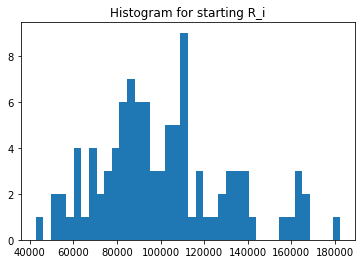

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([234991.00271916, 276757.87719685, 178934.87719685, 178928.87719685,
       260220.0171187 , 162608.0171187 , 284032.48598873, 182932.48598873,
       320850.3506424 , 222612.3506424 , 204435.4790778 , 181932.48598873,
       180900.87719685, 224580.3506424 , 222604.3506424 , 375621.65288638,
       223963.27207922, 322219.27207922, 274891.65288638, 273891.65288638,
       220732.90446659, 225939.27207922, 240104.84224845, 138652.84224845,
       274899.65288638, 318958.90446659, 220727.90446659, 222703.90446659,
       164573.0171187 , 162603.0171187 , 223966.27207922, 367151.85676934,
       270589.85676934, 234283.02547885, 199125.69608793, 197151.69608793,
       295176.69608793, 268610.85676934, 461806.55661147, 268621.85676934,
       362913.55661147, 332611.02547885, 234280.02547885, 197152.69608793,
       204428.4790778 , 206402.4790778 , 153315.30617868, 165515.97942392,
       164515.97942392, 302522.4790778 , 266732.97942392, 182940.48598873,
       254625.30617868, 1

In [24]:
experiments.UNI_Si.unique()

array([10000., 15467., 16003., 15526., 14413., 13664., 14387., 17317.,
       14450., 13668., 14972., 12725., 14197., 14798., 16115., 16608.,
       15408., 14844., 15591., 15254., 17815., 13087., 19353., 17211.,
       14846., 15398., 16001., 13616., 15773., 16201., 13728., 18707.,
       14492., 15218., 14460., 13903., 14646., 14685., 15815., 16355.,
       13560., 15739., 15543., 16417., 18144., 14066., 17486., 13842.,
       15973., 14694., 13552., 16950., 13075., 15950., 17753., 14453.,
       15697., 16152., 19270., 14614., 15756., 16089., 14157., 13016.,
       13867., 13003., 14466., 14562., 15749., 14579., 13622., 15449.,
       15845., 14465., 14019., 15337., 21434., 13059., 13800., 14273.,
       15175., 14884., 15016., 15423., 12990., 15007., 13198., 15929.,
       16994., 14535., 14876., 17913., 18828., 17265., 16624., 17784.,
       13811., 15614., 15144., 19390., 19621., 15338., 16480., 14520.,
       17059., 13584., 16542., 15839., 13709., 13656., 13229., 14510.,
      

In [25]:
experiments.UNI_Qj.unique()

array([126330.07812691, 195352.16996651, 194352.16996651, ...,
       213015.02745761, 191383.69298769, 115223.79081839])

In [26]:
experiments.UNI_Rj.unique()

array([ 63165.03906345, 139464.08498325, 140179.08498325, ...,
       110483.5137288 , 126993.84649385,  82945.39540919])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 63165.03906345,  84923.05324348, 116626.08498325,  75712.47751304,
       132046.10051326,  83208.87345698,  67930.26018656, 103287.49423241,
        79304.65485187,  70835.0546442 ,  86507.80377551,  60451.16988137,
       183238.25473686, 102250.45421452, 157670.46393556,  66740.52171809,
        74439.70910161, 129108.38140364,  63442.84106905, 129273.91133498,
       145655.17633366, 203603.89426884, 123752.39939971,  72504.54004228,
       122517.9231894 , 120984.18084661,  72878.63247634,  61158.05716419,
       107196.4876564 , 110119.84649385, 116603.55162645,  59346.46919369,
       108470.5137288 , 107662.57745148, 152850.35527864, 128888.06274238,
       126081.64059932,  65141.34294745,  66931.17378188,  93003.37329919,
       106176.31014314, 118461.57947979, 108801.62628614, 107830.23309029,
       165383.63001383,  75967.60527887,  77550.68873137,  74197.58905611,
       109980.09712264,  70637.8515887 , 116953.60063319, 111902.14637153,
       130220.87599479,  

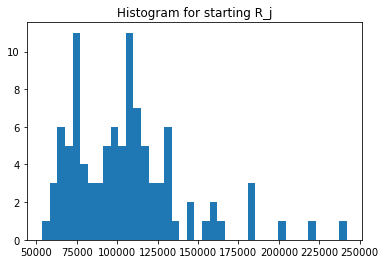

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([117495.50135958,  90450.43859842,  82286.50855935,  90966.24299436,
       112290.1753212 , 103201.2395389 , 136945.82644319, 112969.63603961,
       111351.95223329,  68824.92112422, 135294.92838467, 118128.51273943,
        99562.84804397, 182437.27830573,  76154.65308934,  82257.98971196,
        92933.55858926,  94151.63401275, 102216.11620354,  89910.38007817,
        52458.35073539,  62973.06639424,  79621.8676403 , 160920.31283036,
        69829.86392356, 103666.06970946,  93117.88422135, 137252.89254509,
        83802.88617593,  85595.58086518,  86112.1172684 , 139745.82756865,
        70940.73323924, 134599.42759769,  56424.30268655, 111799.40341522,
        96315.72342097, 111092.75954931, 127086.90640676,  84516.21258366,
       106598.552709  , 105720.10723748,  84970.44067322,  76917.92516885,
        79163.38693247, 140935.80428436,  90688.81949993,  61883.43441018,
       121962.7820952 , 161561.20028609,  84201.59076479,  67282.02216372,
       130603.02513683, 1

In [31]:
experiments.UNI_ji.unique()

array([ 63165.03906345, 116626.08498325, 103287.49423241,  84923.05324348,
        75712.47751304,  86507.80377551, 132046.10051326,  83208.87345698,
        67930.26018656,  72504.54004228,  79304.65485187,  61158.05716419,
        70835.0546442 , 102250.45421452, 183238.25473686,  60451.16988137,
        74439.70910161, 129108.38140364, 157670.46393556,  66740.52171809,
       241801.61985332,  63442.84106905, 107196.4876564 , 129273.91133498,
       145655.17633366, 203603.89426884, 122517.9231894 , 123752.39939971,
       120984.18084661,  72878.63247634,  66931.17378188, 109980.09712264,
       116616.98134039, 116603.55162645, 110119.84649385, 118461.57947979,
        59346.46919369, 108470.5137288 , 107662.57745148, 116953.60063319,
        67063.53371722, 152850.35527864, 126081.64059932,  93003.37329919,
       128888.06274238,  65141.34294745, 106176.31014314, 108801.62628614,
       107830.23309029,  70637.8515887 ,  75967.60527887, 165383.63001383,
        74197.58905611,  

In [32]:
experiments.UNI_Sij.unique()

array([7.42160793e+09, 1.05488805e+10, 8.49916728e+09, 7.72513110e+09,
       8.50176737e+09, 8.92771258e+09, 1.80831624e+10, 9.40007615e+09,
       7.56416709e+09, 4.99011925e+09, 1.07295176e+10, 7.22451033e+09,
       7.05253978e+09, 1.86542946e+10, 1.39544457e+10, 4.97259171e+09,
       6.91794707e+09, 1.21557651e+10, 1.61164625e+10, 6.00066567e+09,
       1.26845142e+10, 3.99519024e+09, 8.53518455e+09, 2.08027983e+10,
       1.01710811e+10, 2.11068155e+10, 1.14086098e+10, 1.69853748e+10,
       1.01388235e+10, 6.23808888e+09, 5.76358509e+09, 1.53692597e+10,
       8.27289416e+09, 1.56947713e+10, 6.21343555e+09, 1.32439339e+10,
       5.71599811e+09, 1.20502887e+10, 1.36825039e+10, 9.88447537e+09,
       7.14887563e+09, 1.61593560e+10, 1.07132126e+10, 7.15362651e+09,
       1.02032156e+10, 9.18074756e+09, 9.62900423e+09, 6.73301830e+09,
       1.31512752e+10, 1.14123361e+10, 6.39659321e+09, 1.11273451e+10,
       9.69042959e+09, 8.29906042e+09, 9.87537959e+09, 8.46150685e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


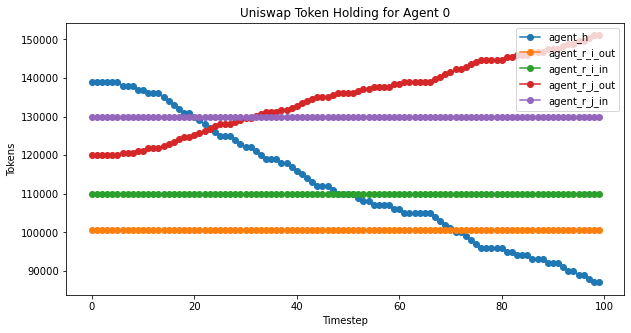

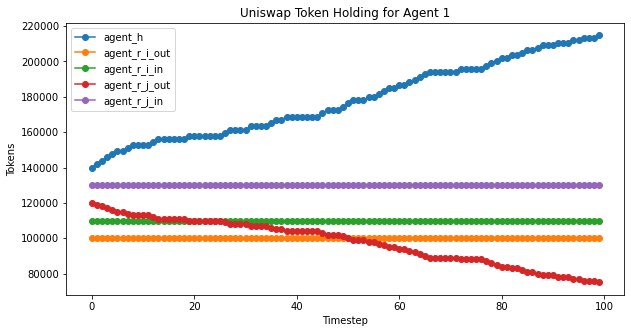

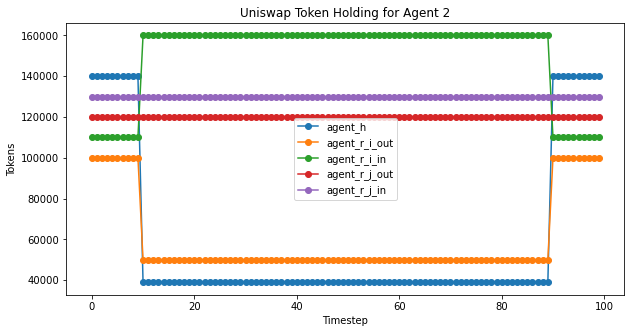

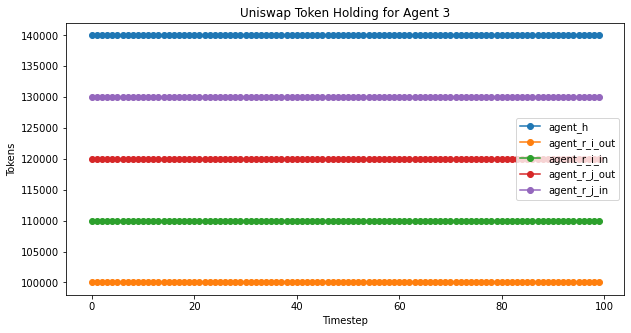

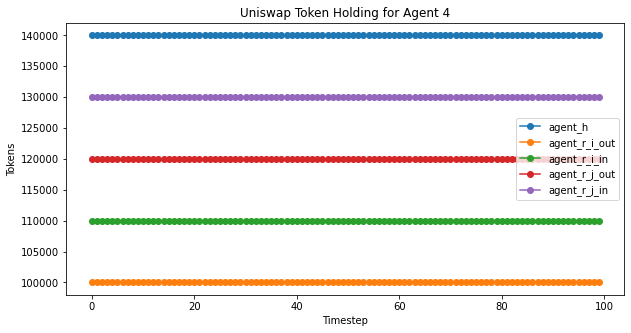

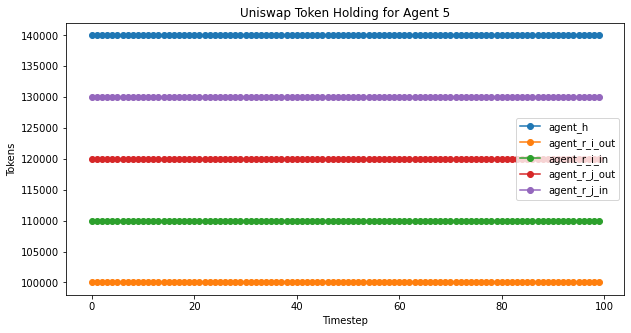

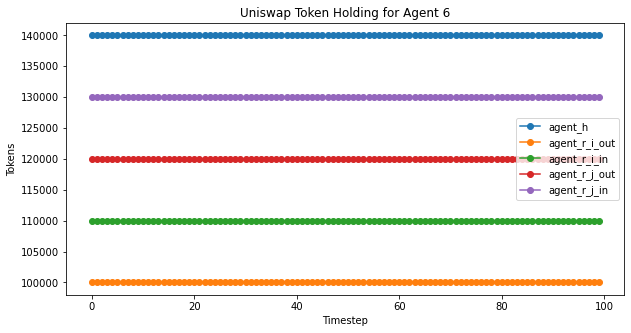

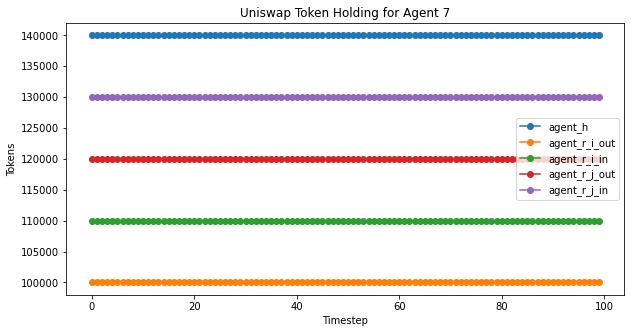

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


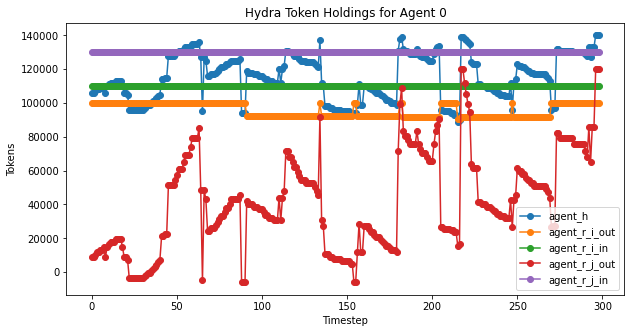

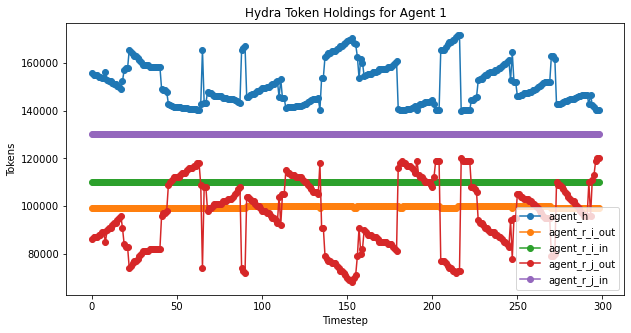

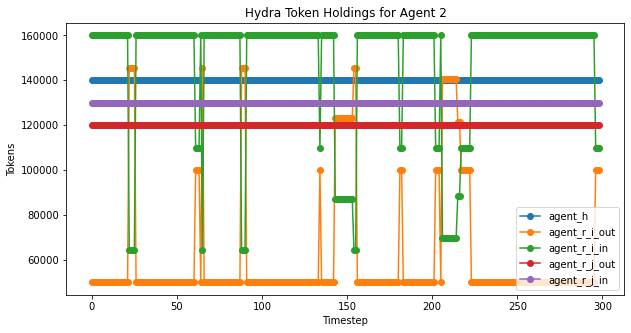

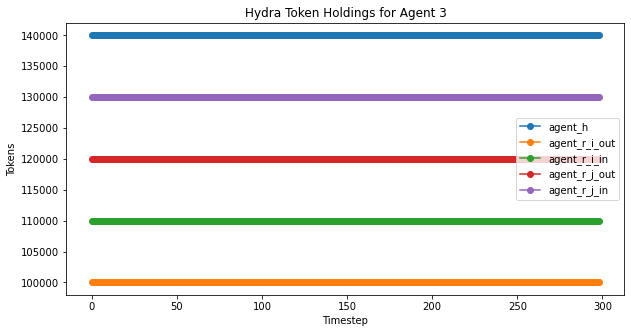

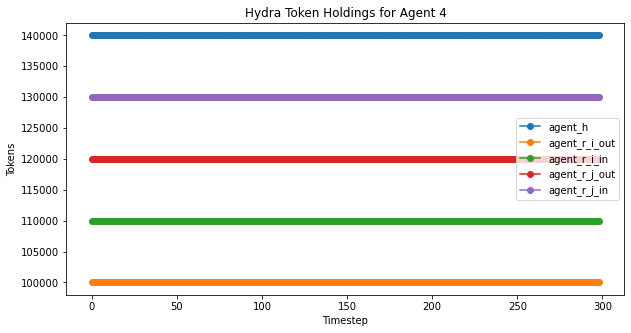

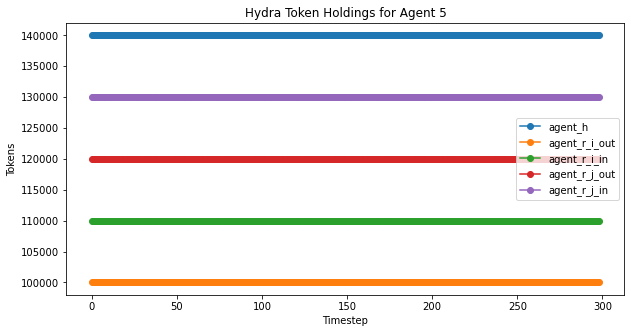

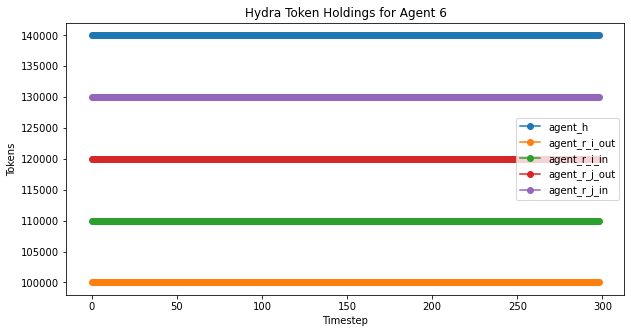

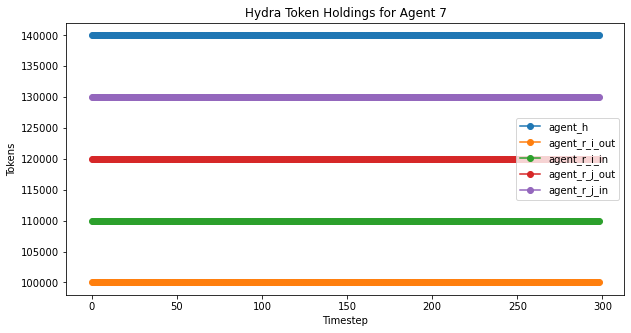

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

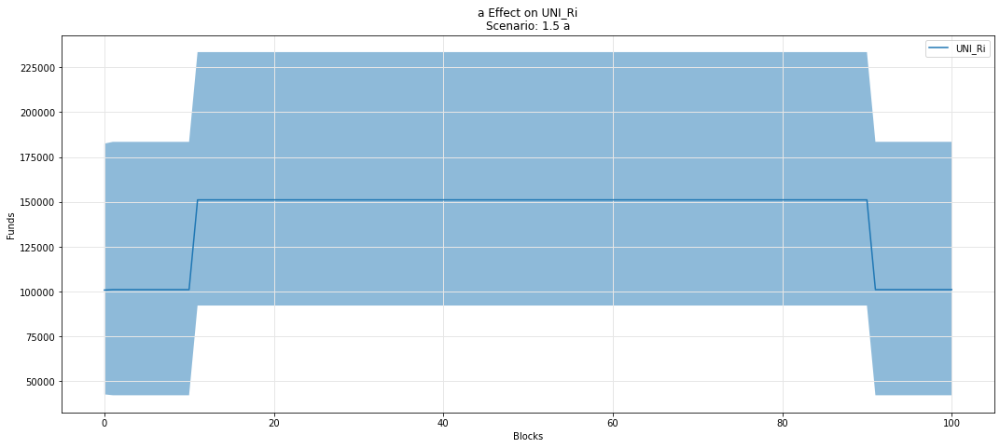

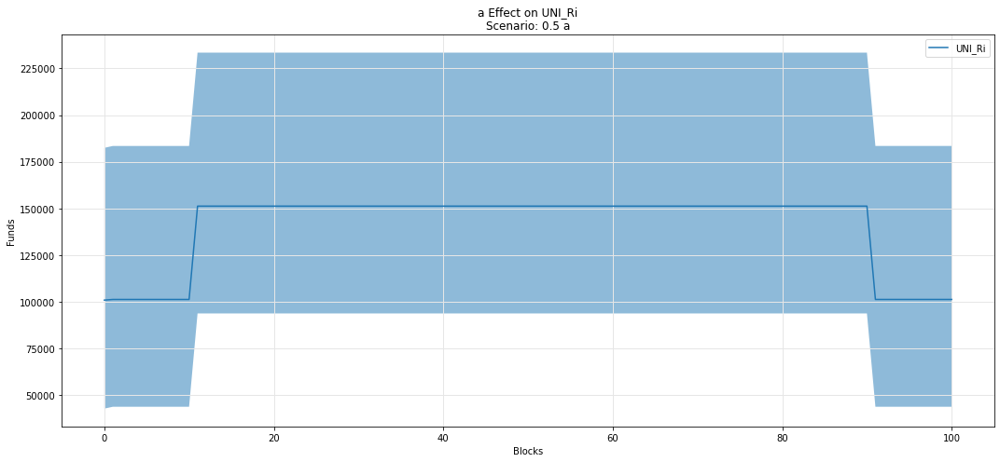

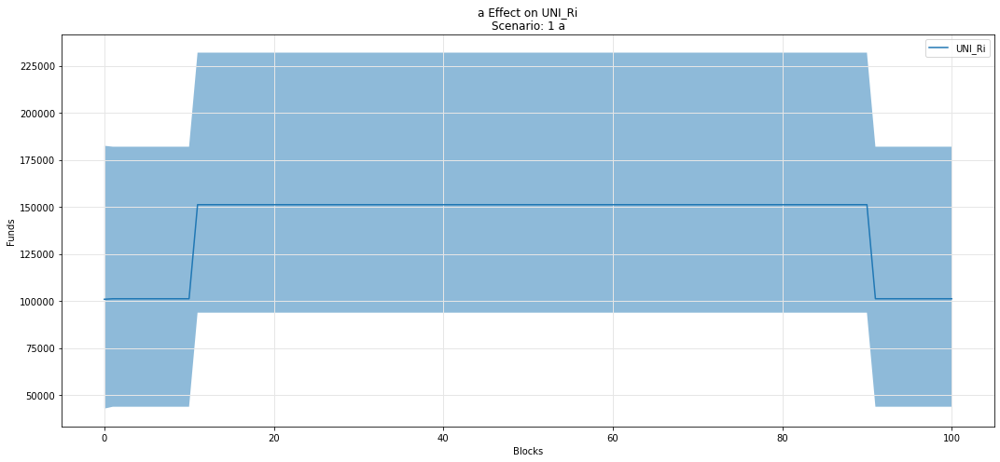

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

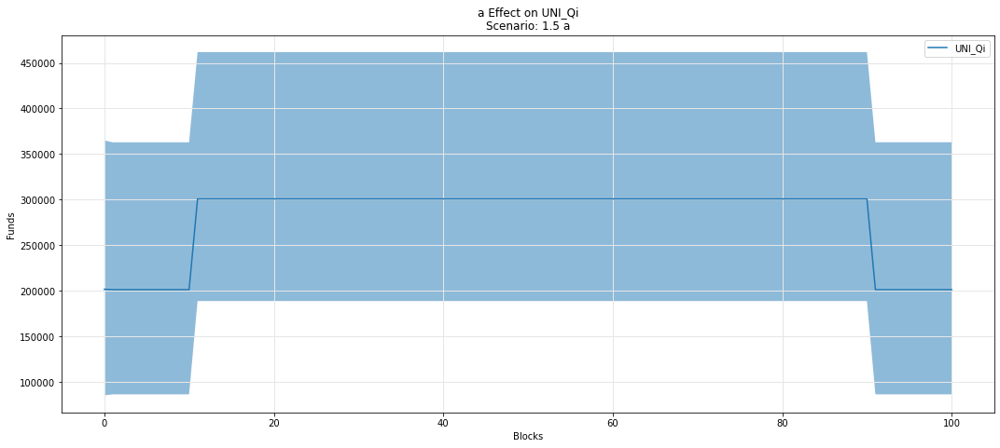

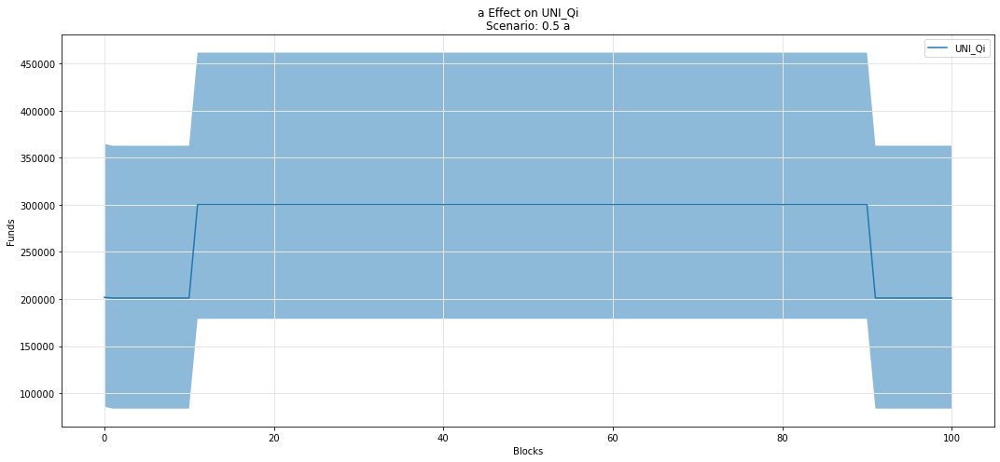

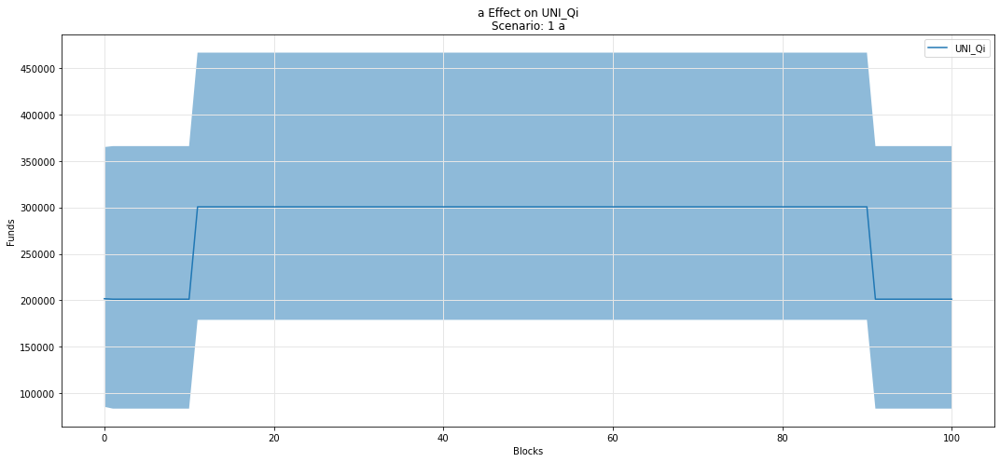

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

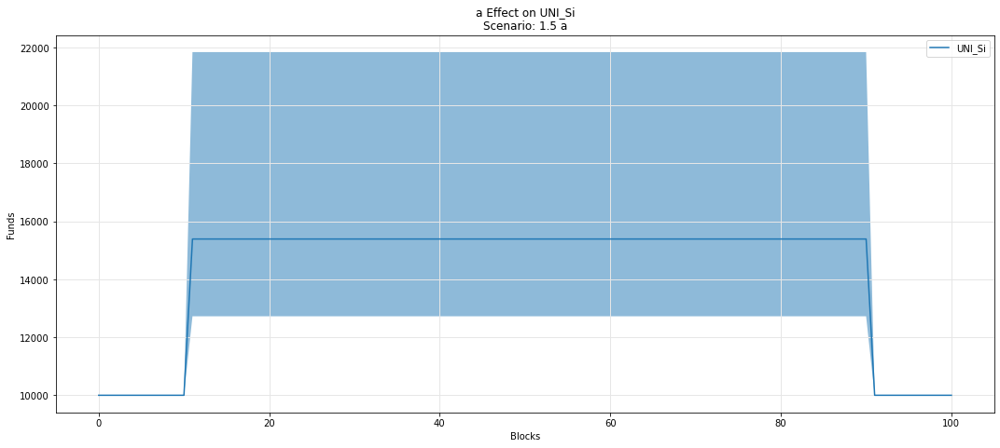

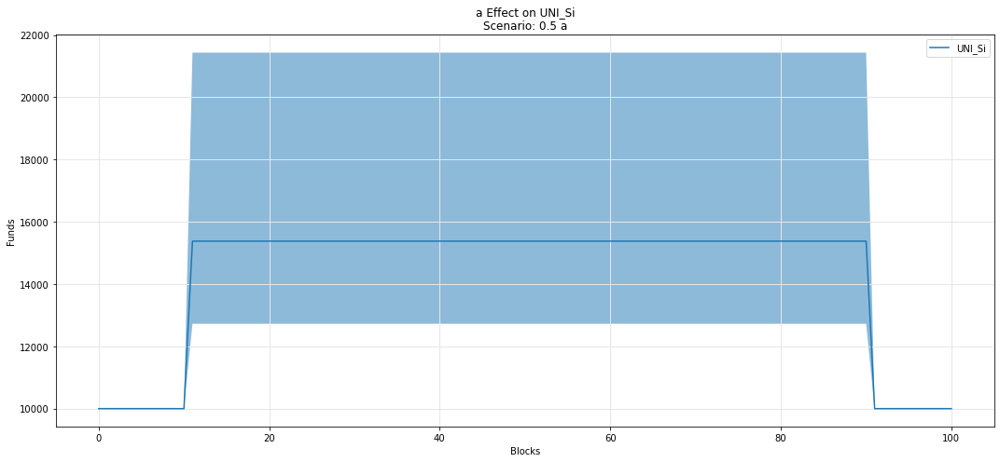

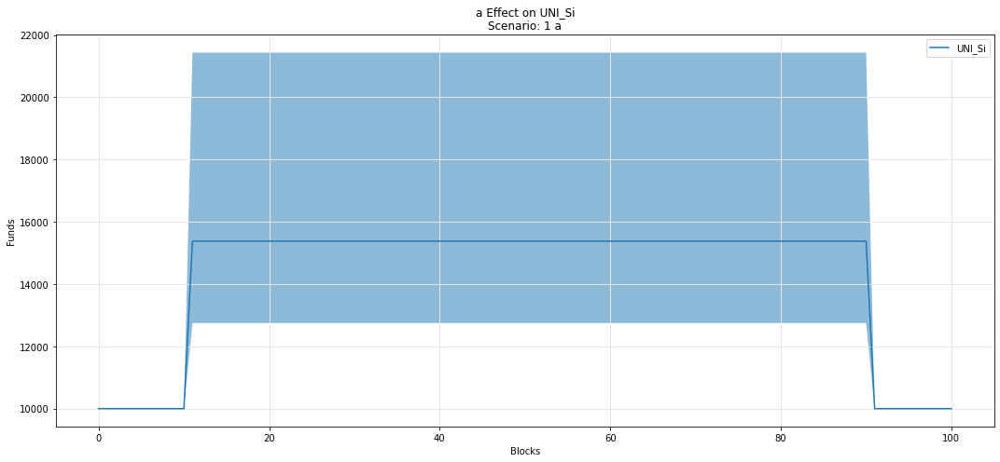

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

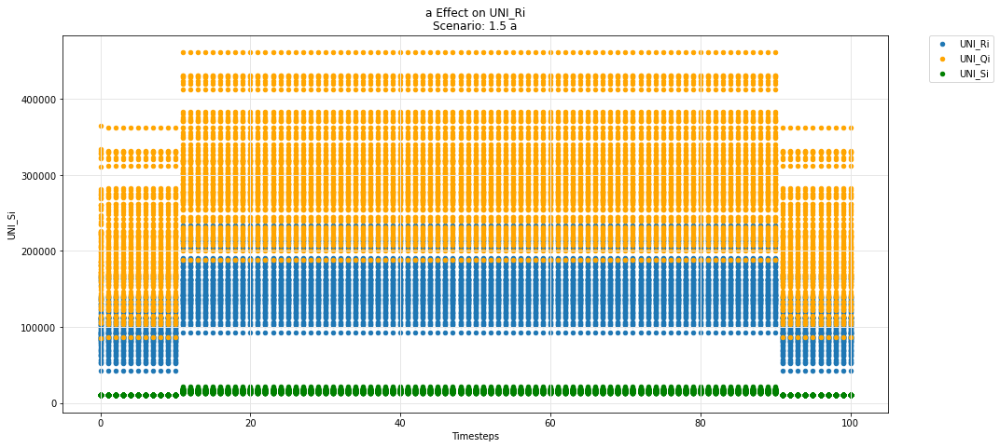

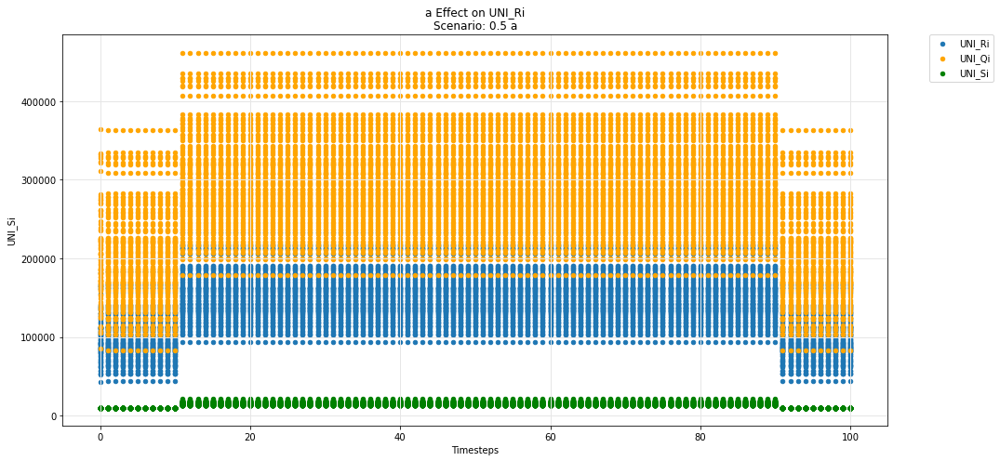

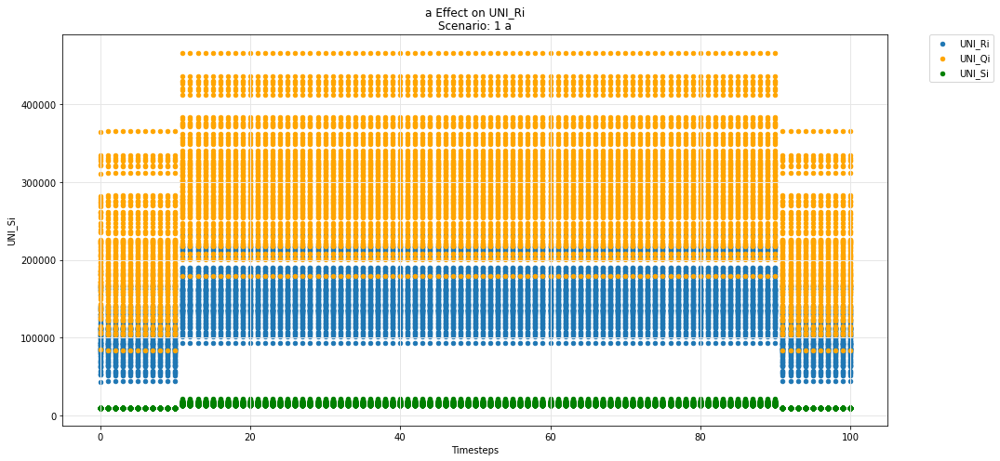

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

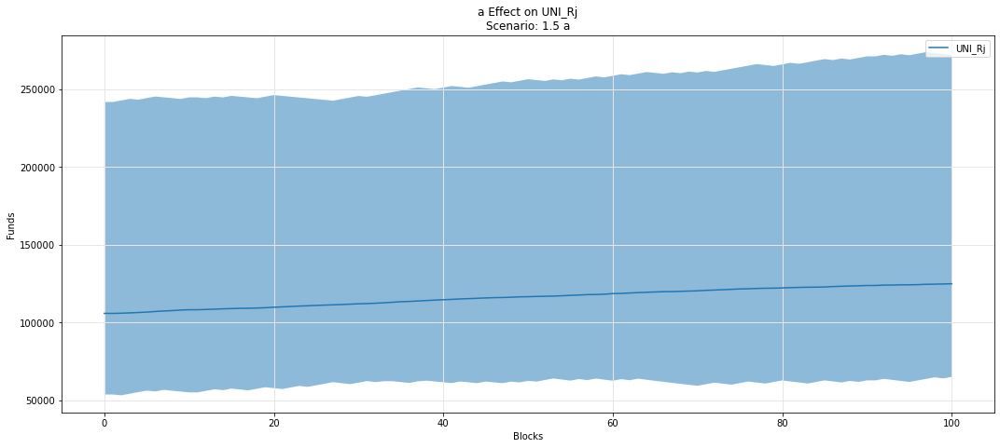

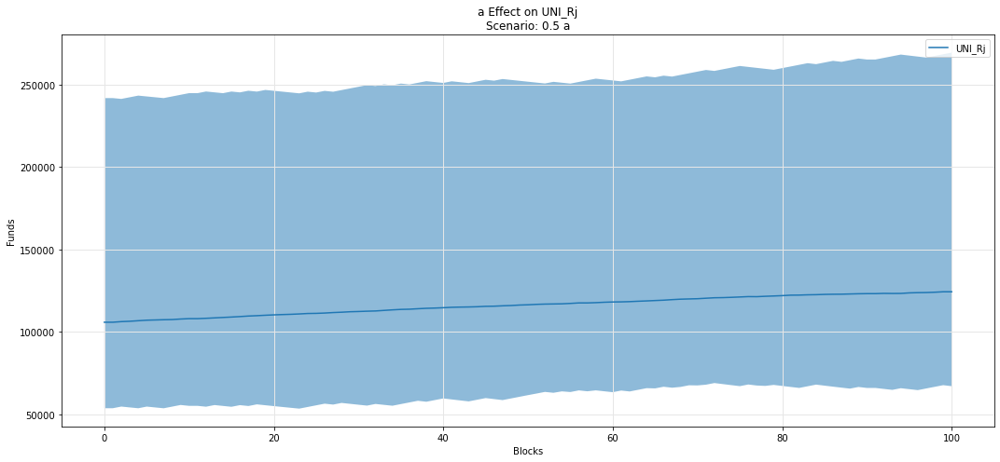

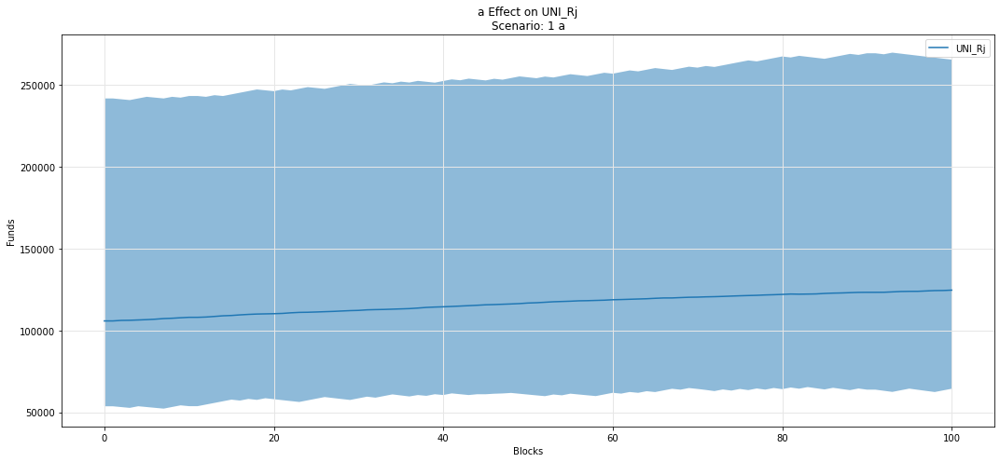

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

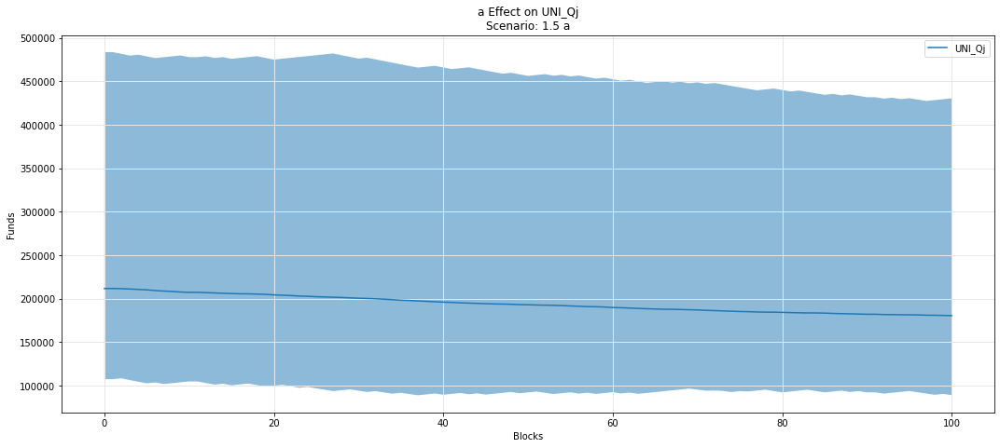

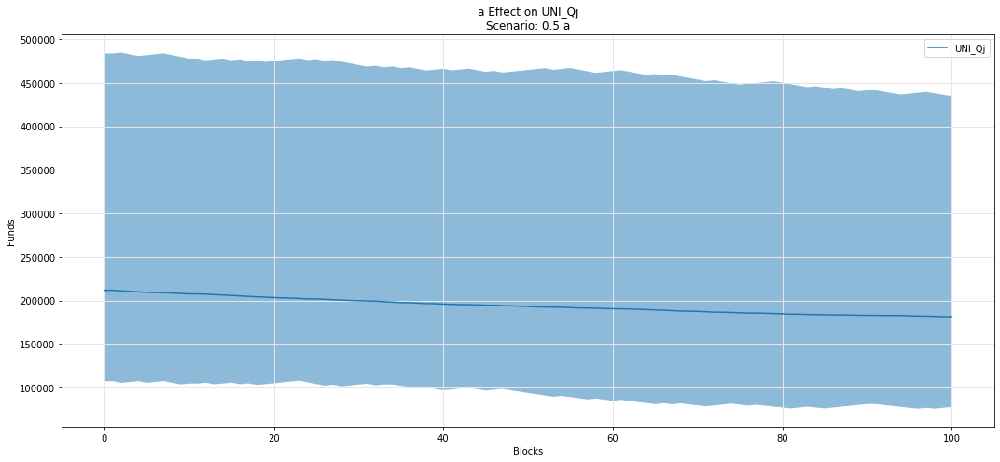

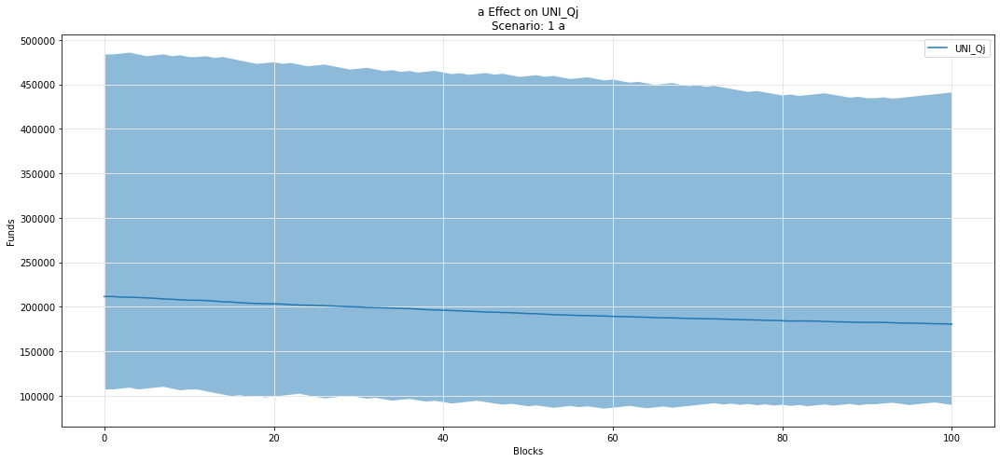

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

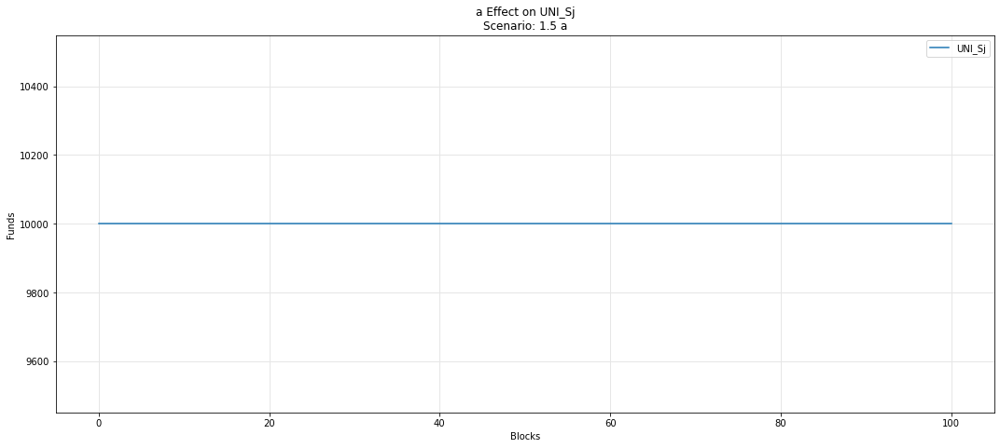

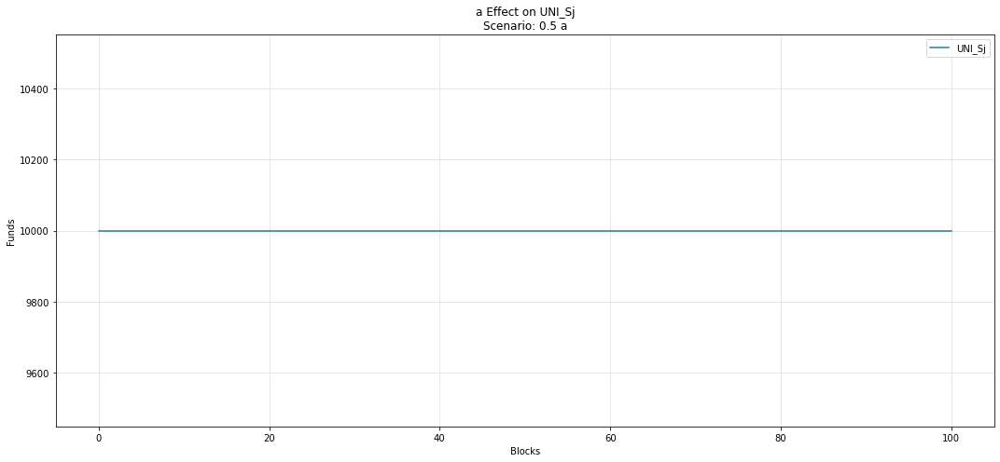

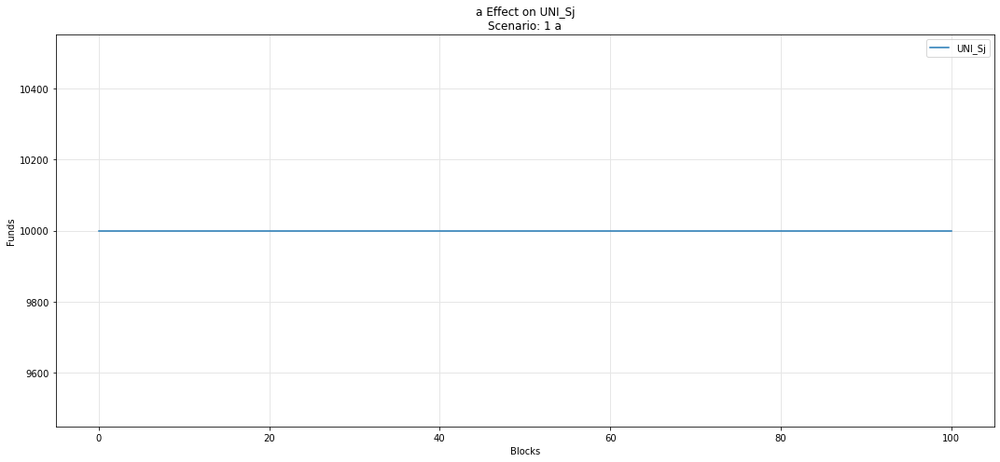

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

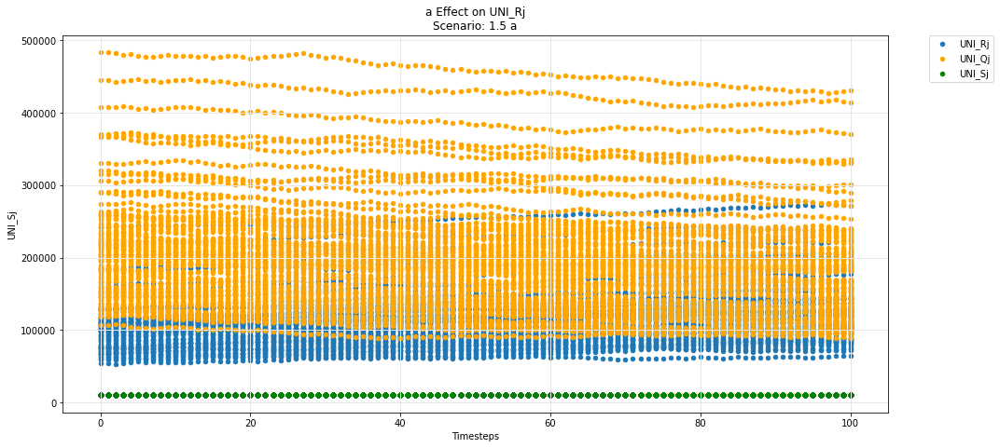

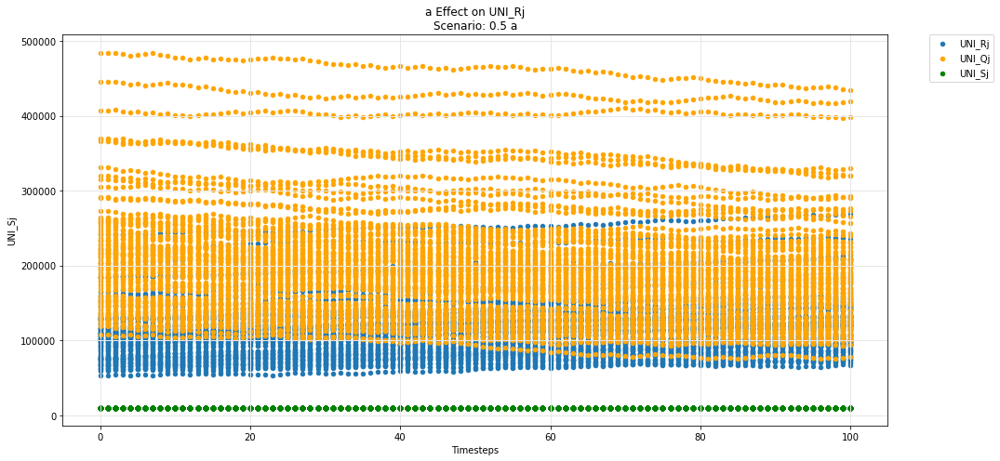

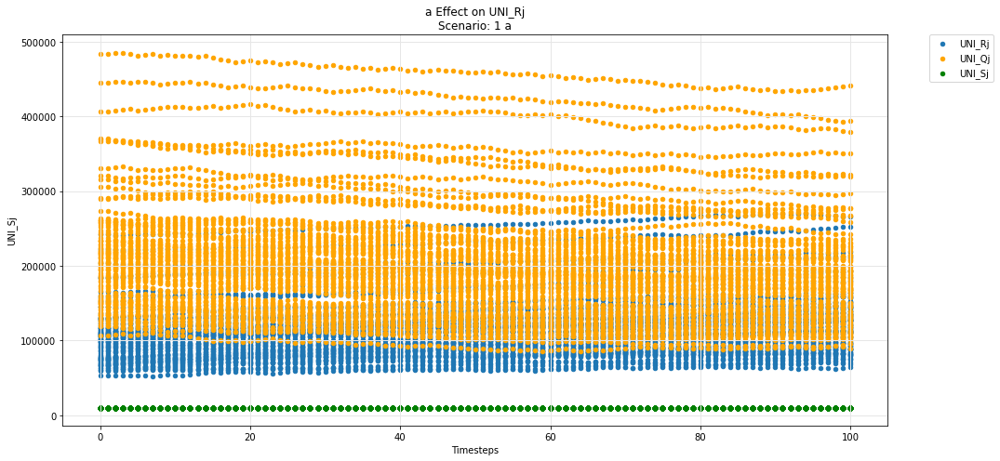

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

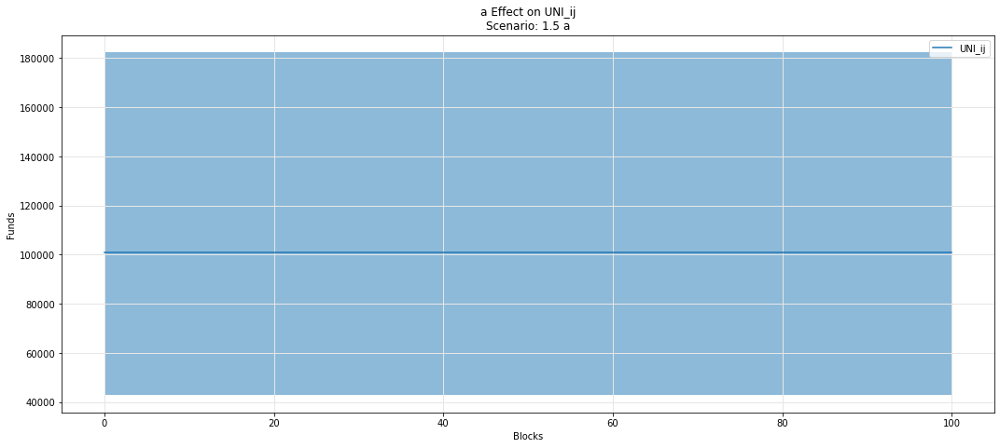

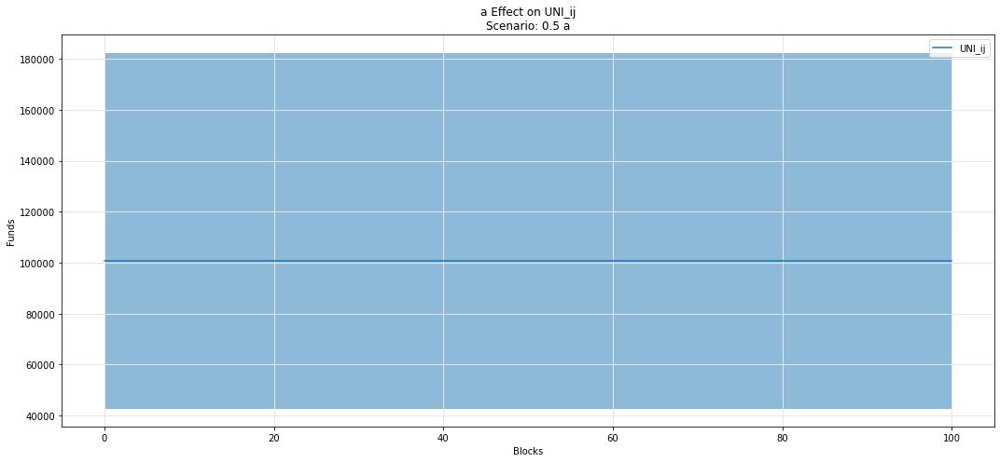

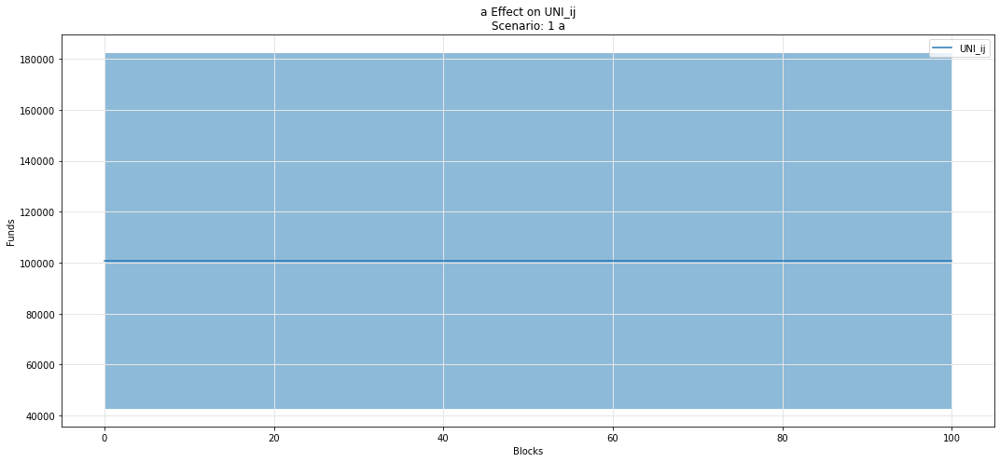

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

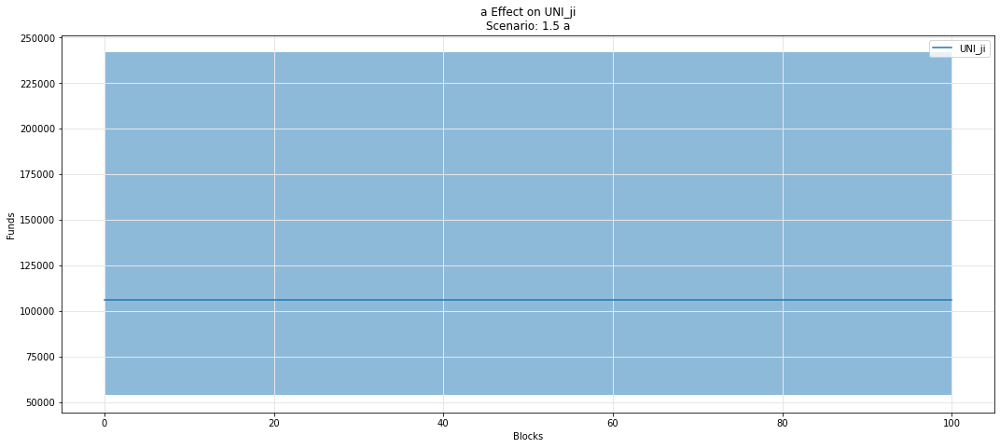

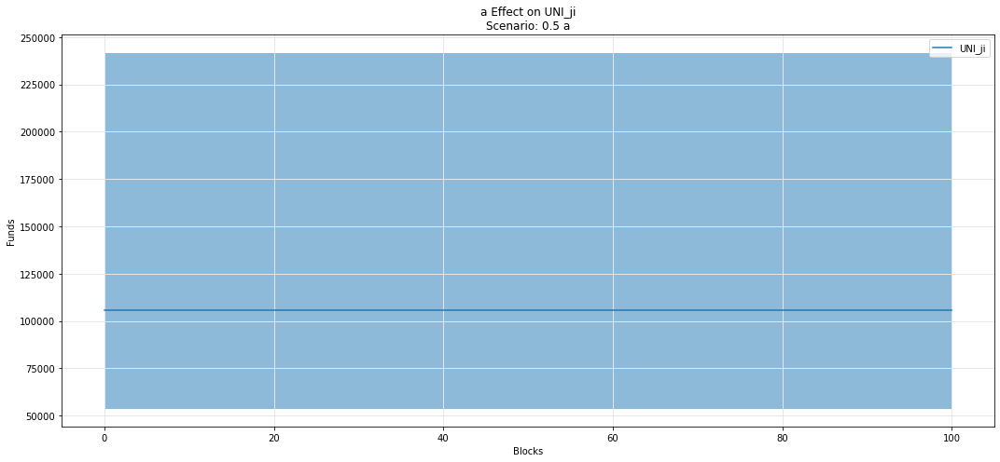

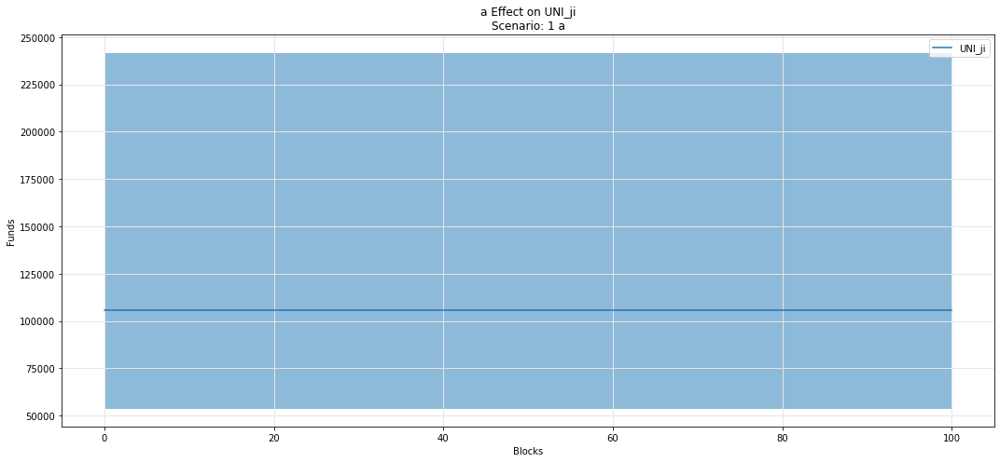

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

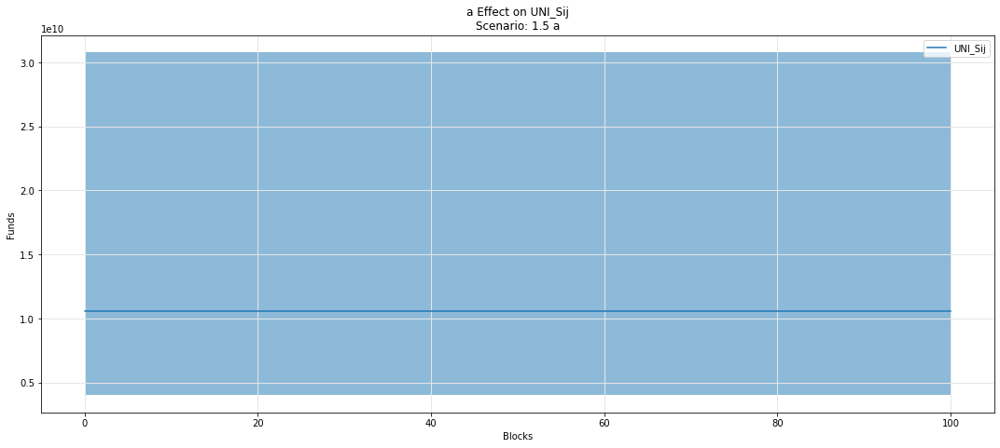

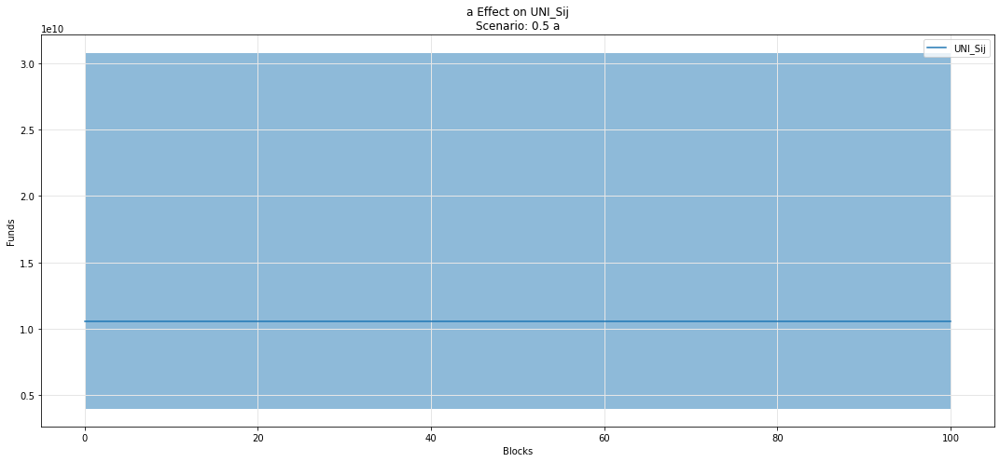

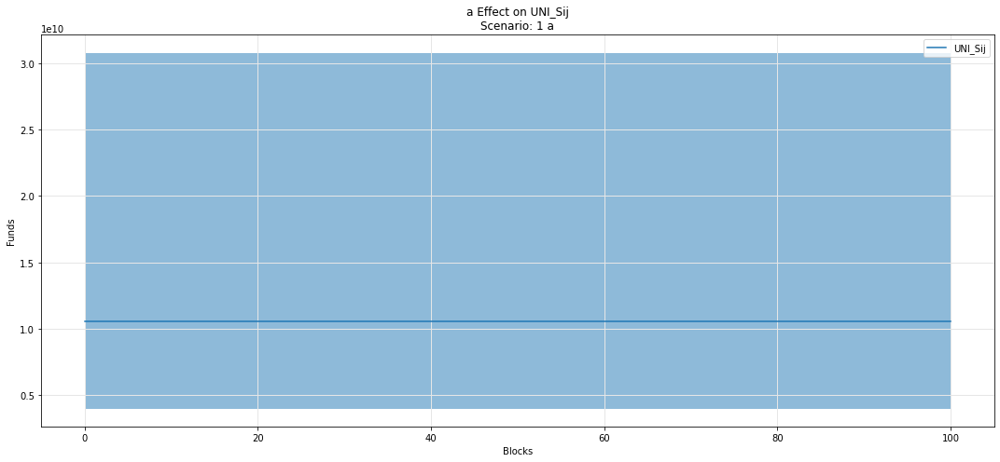

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

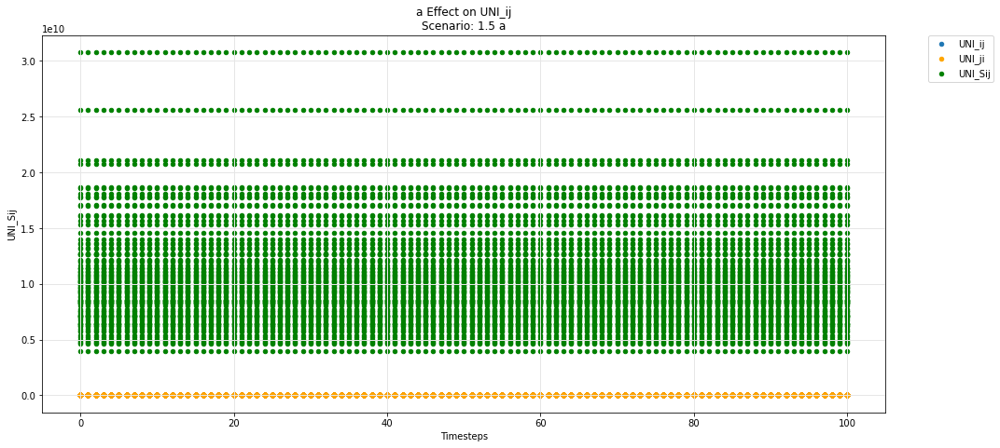

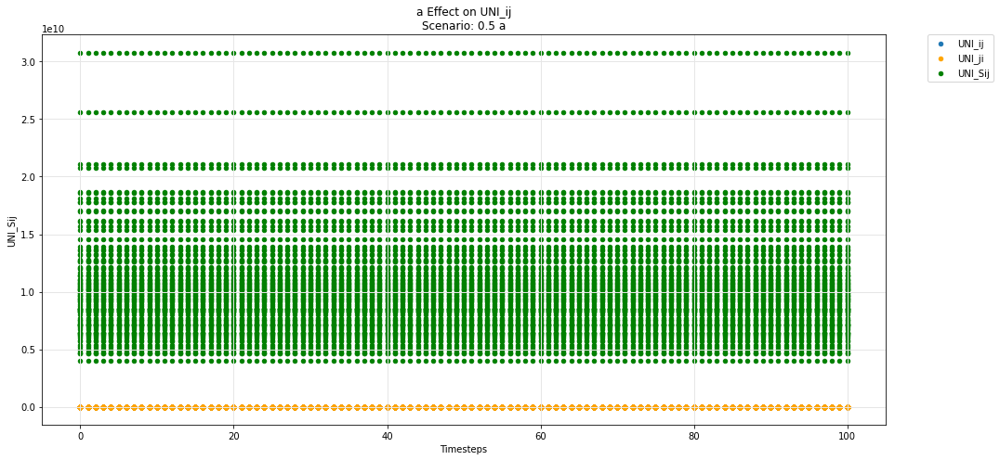

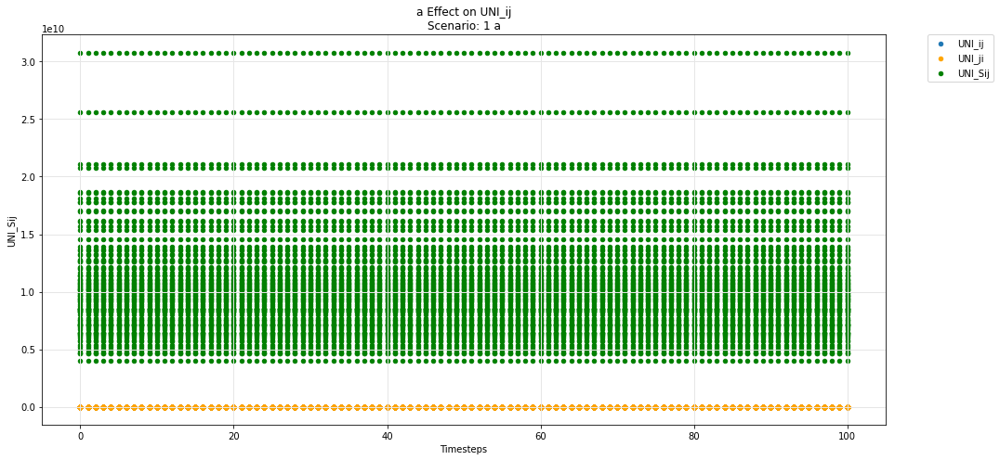

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

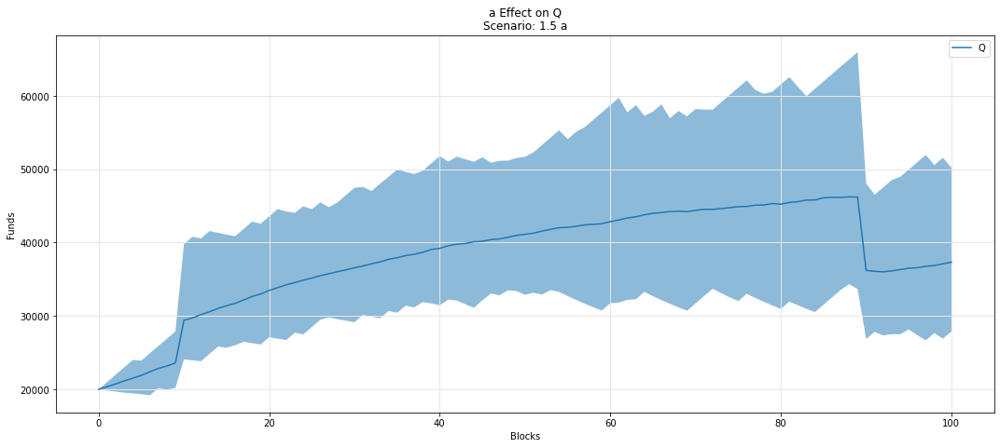

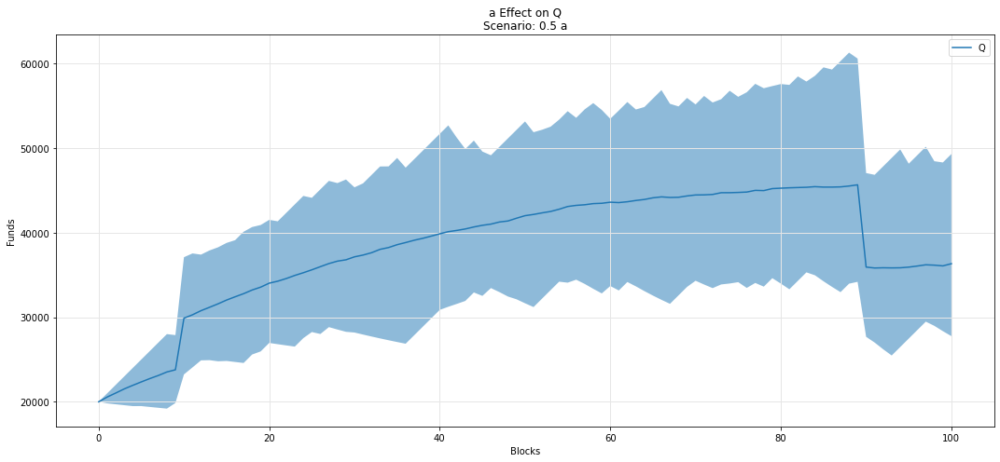

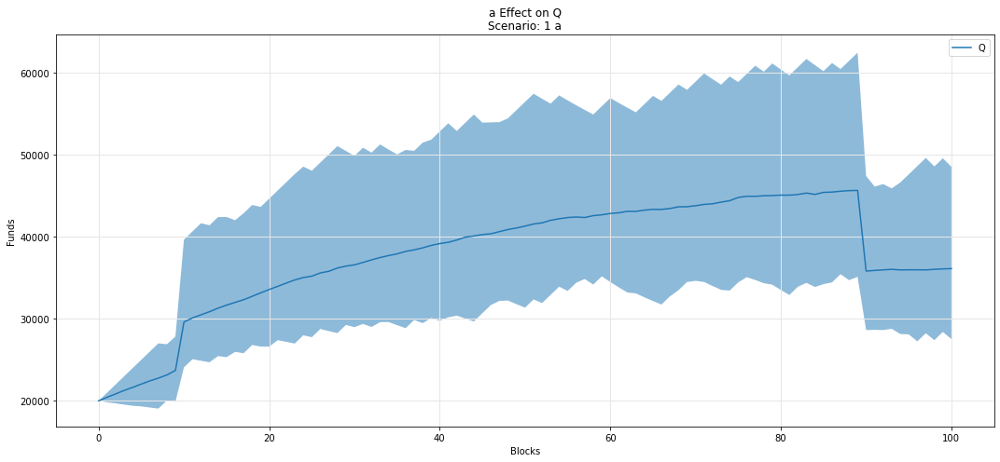

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

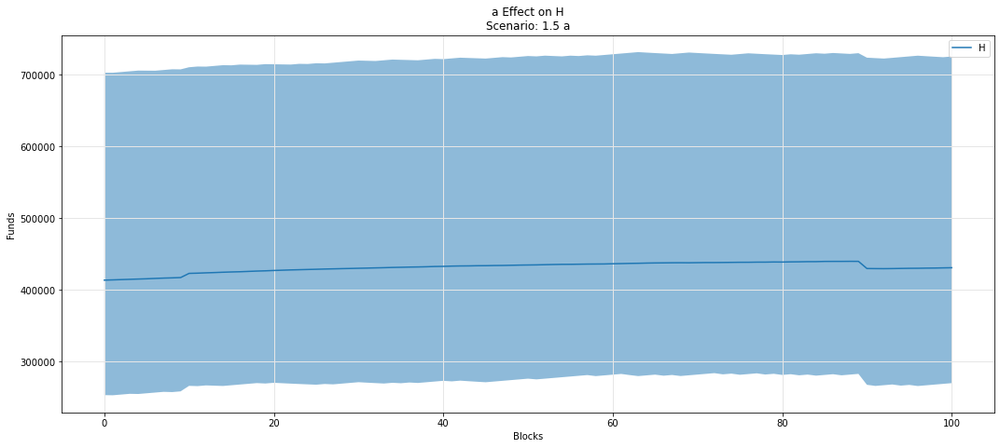

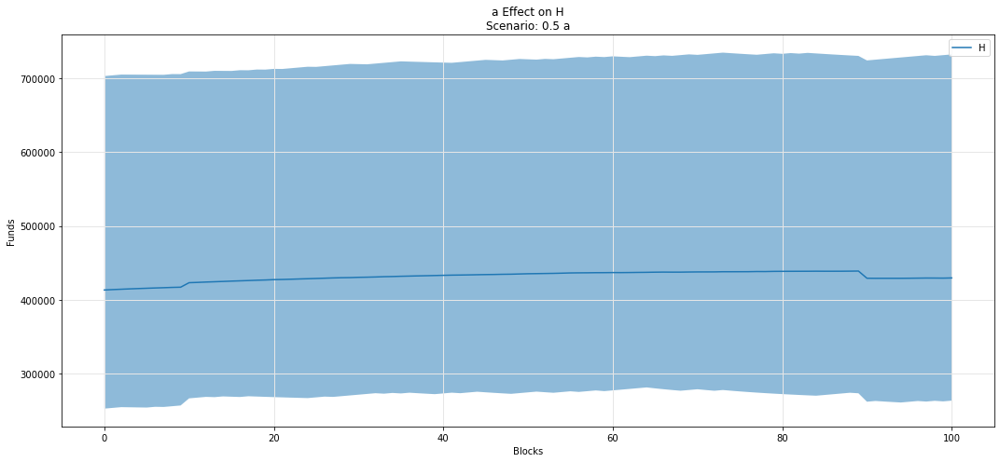

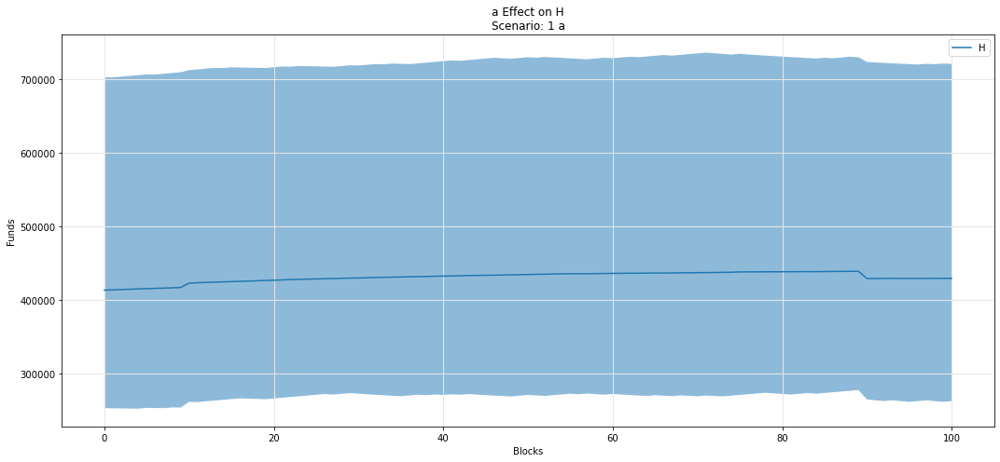

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

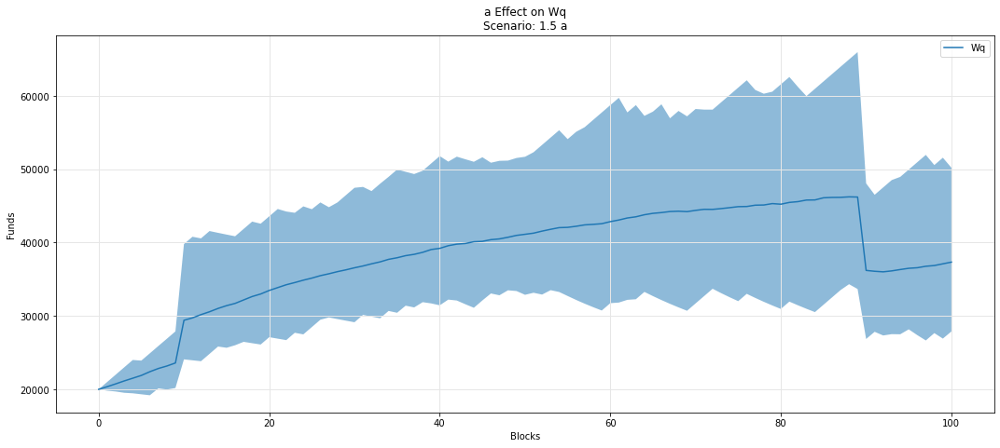

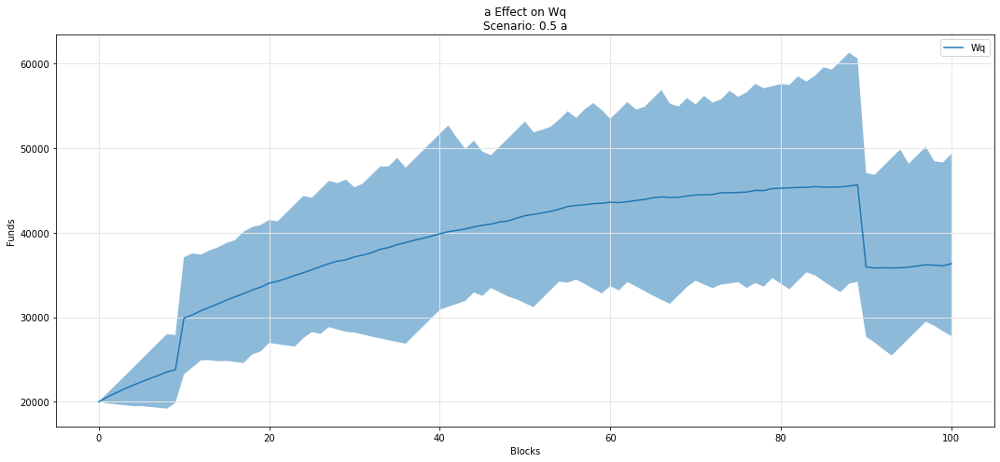

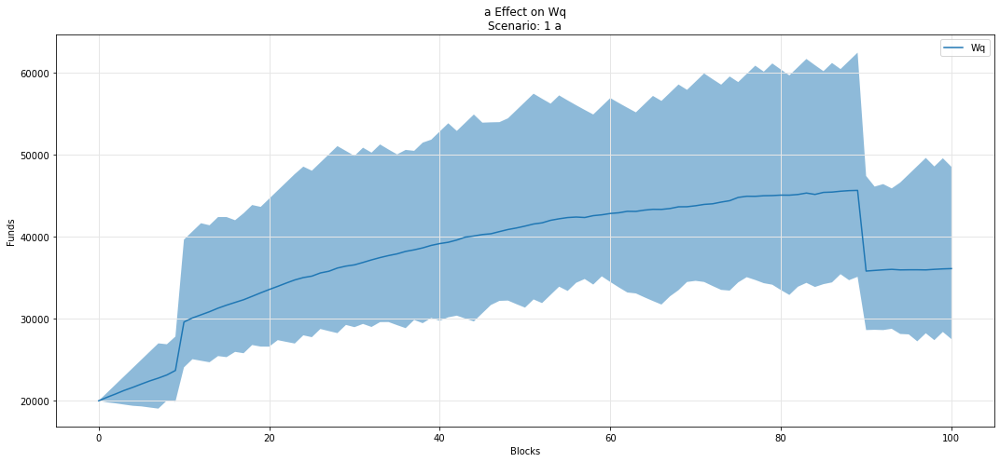

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

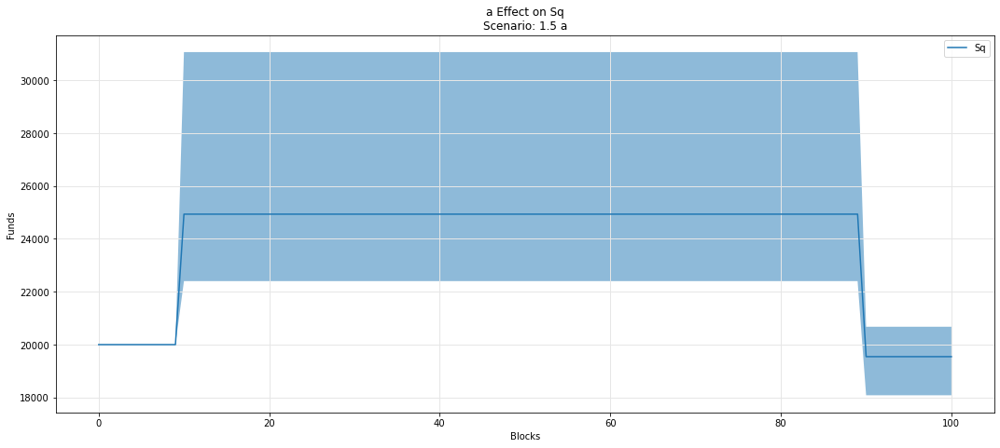

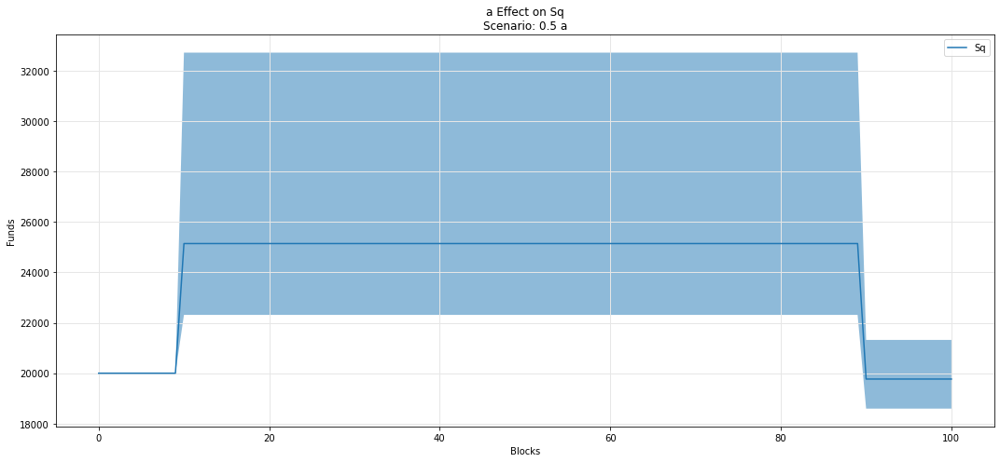

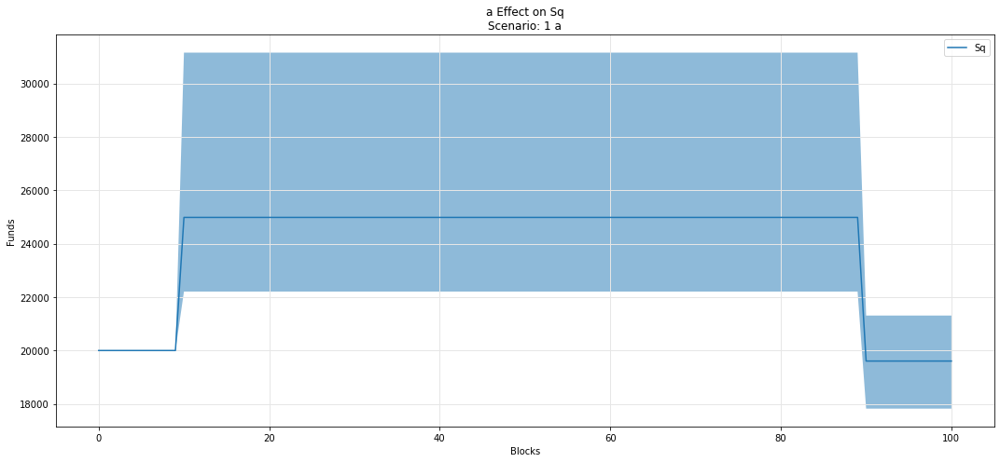

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

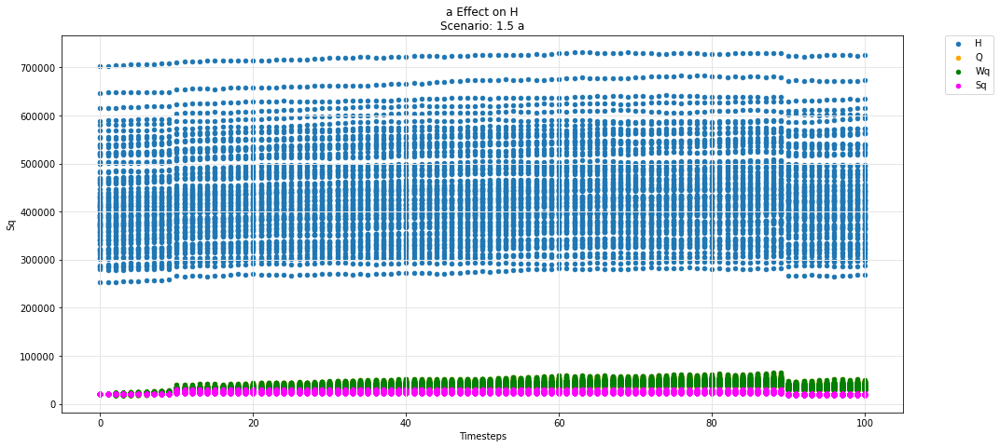

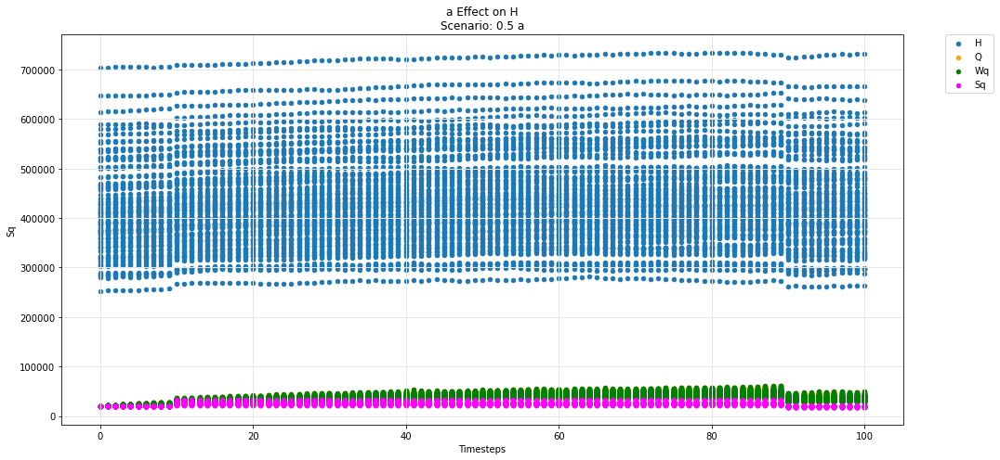

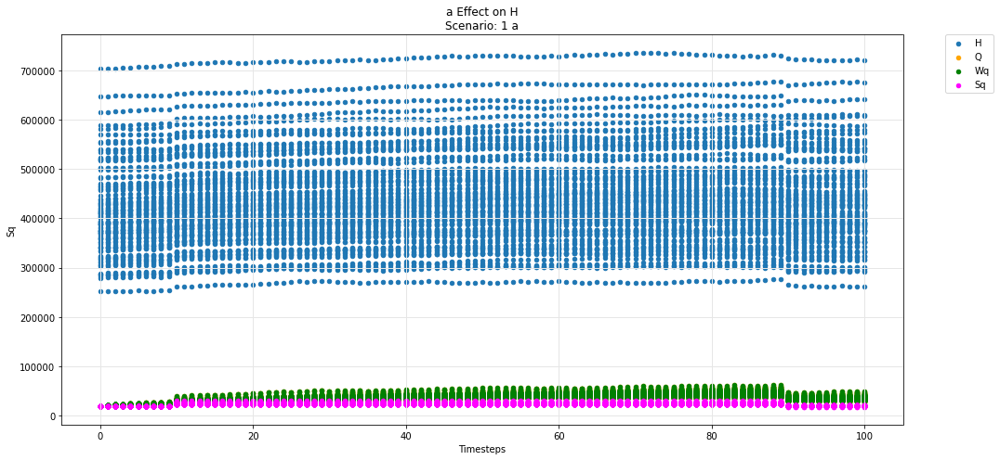

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

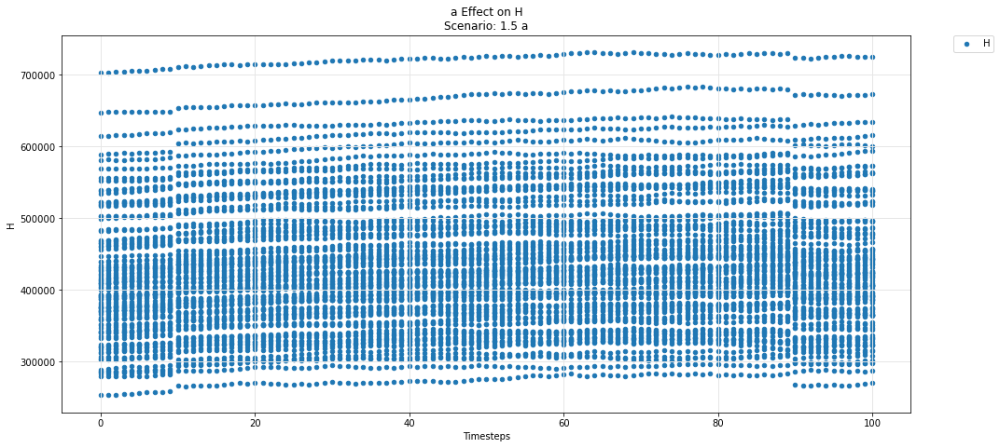

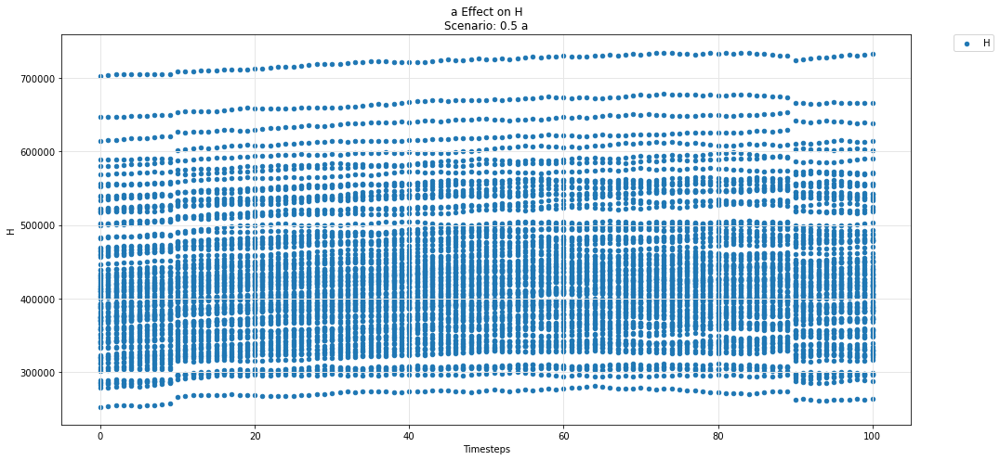

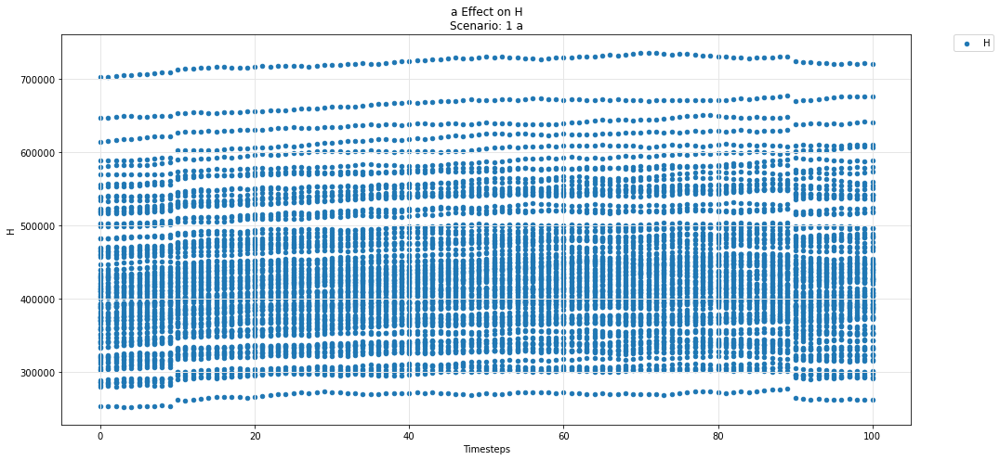

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

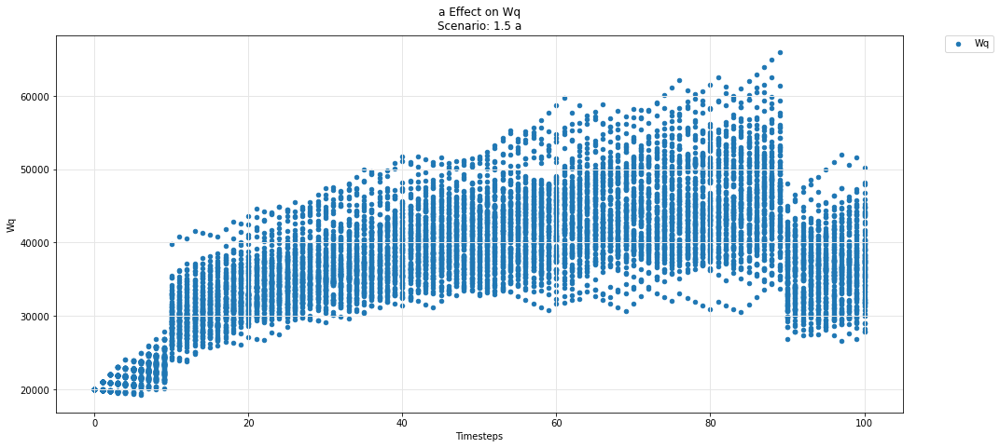

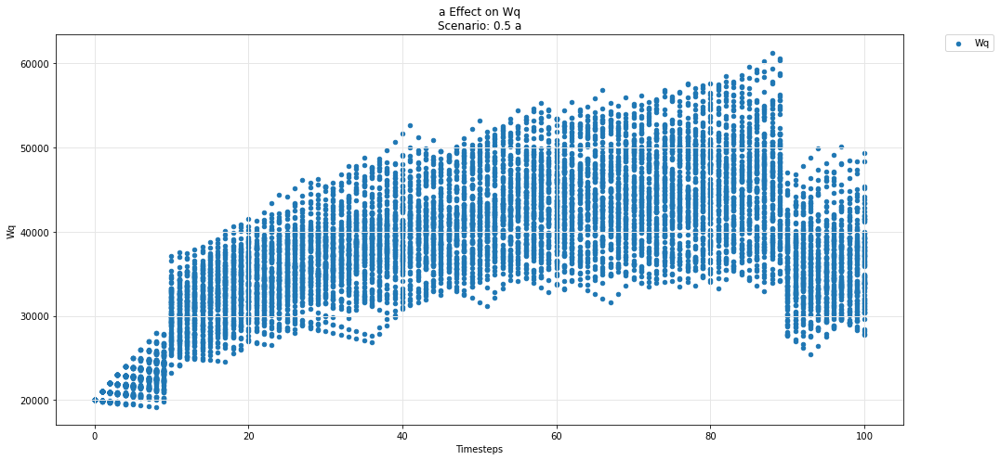

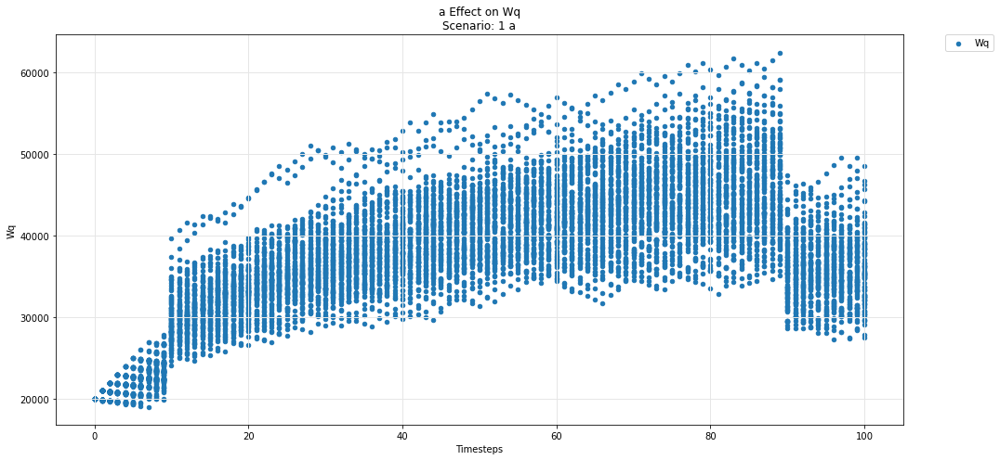

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

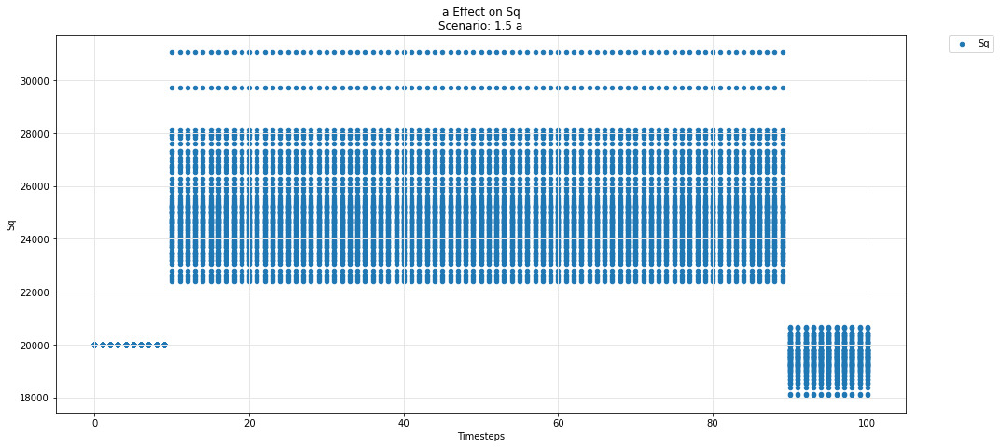

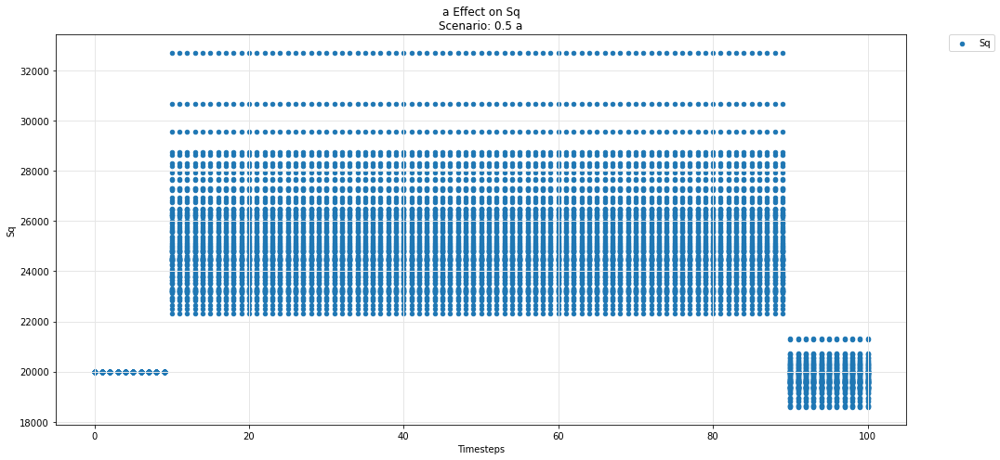

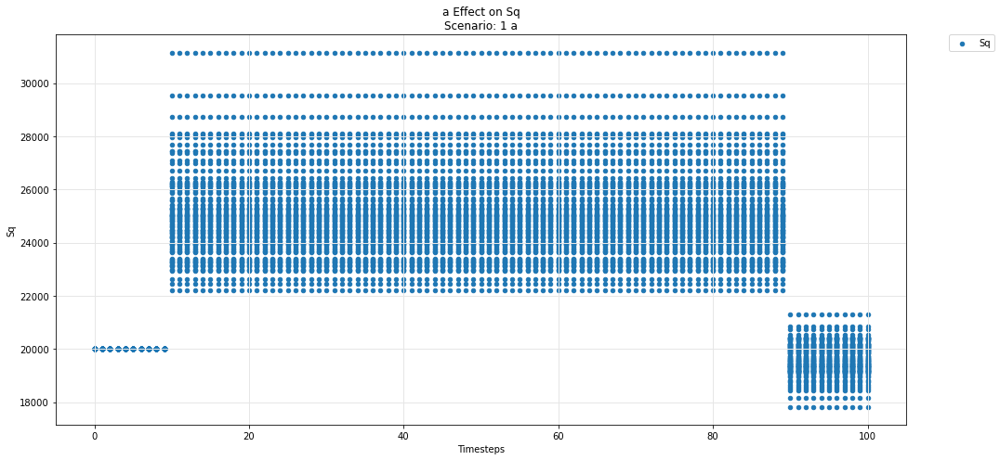

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

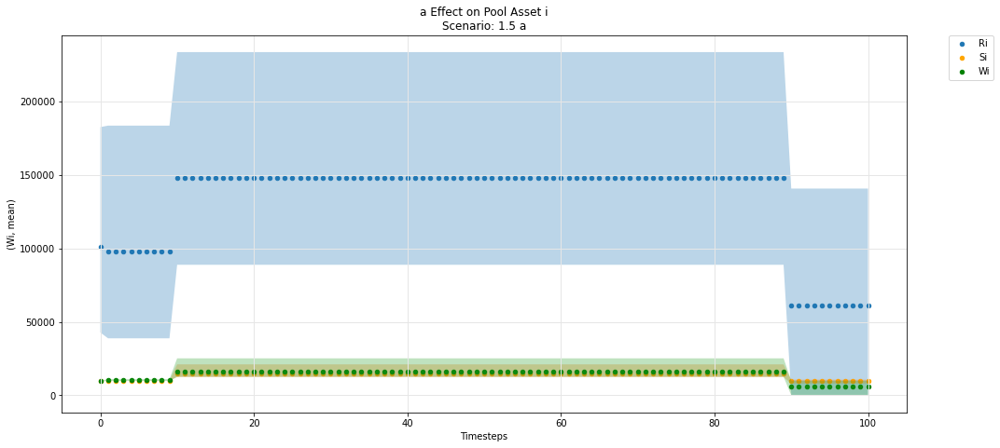

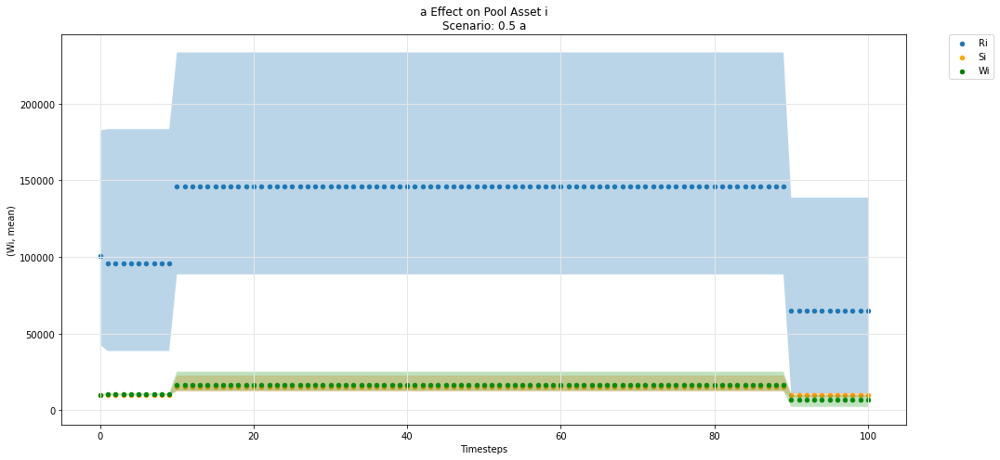

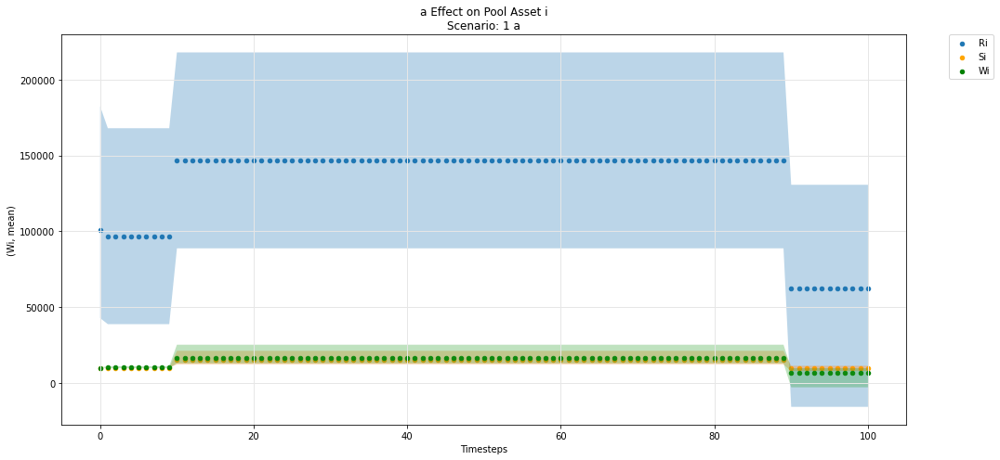

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

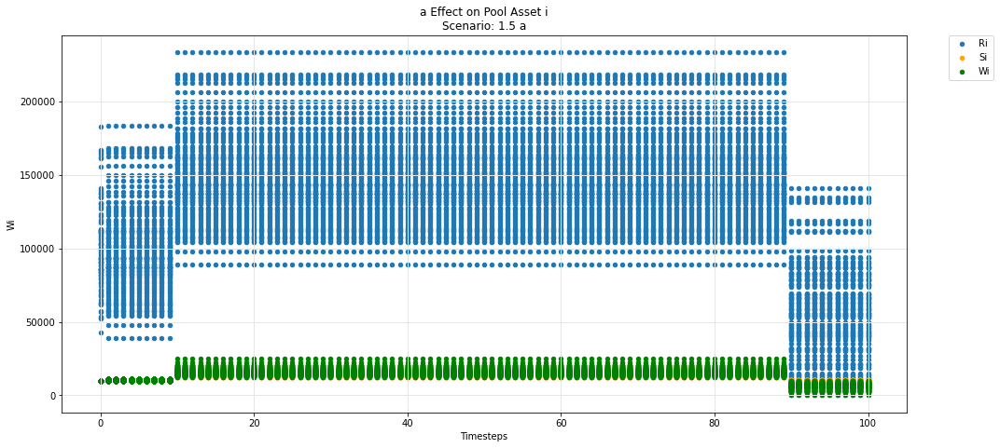

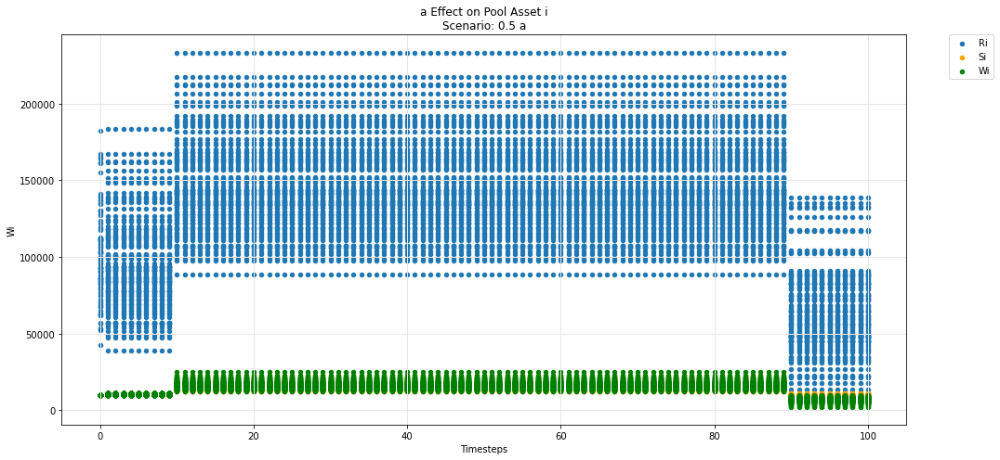

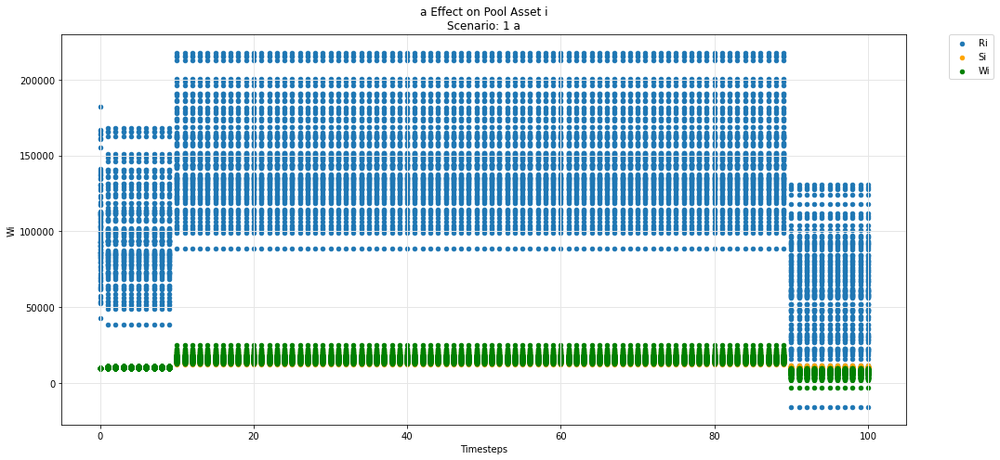

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

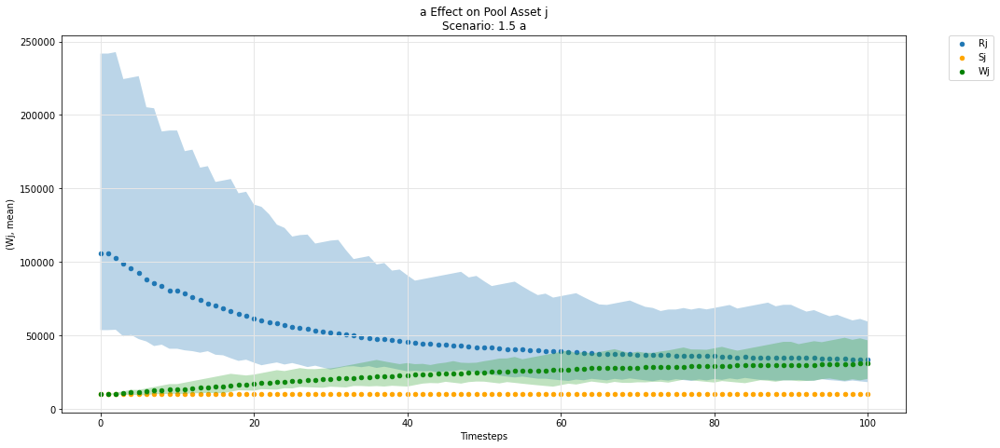

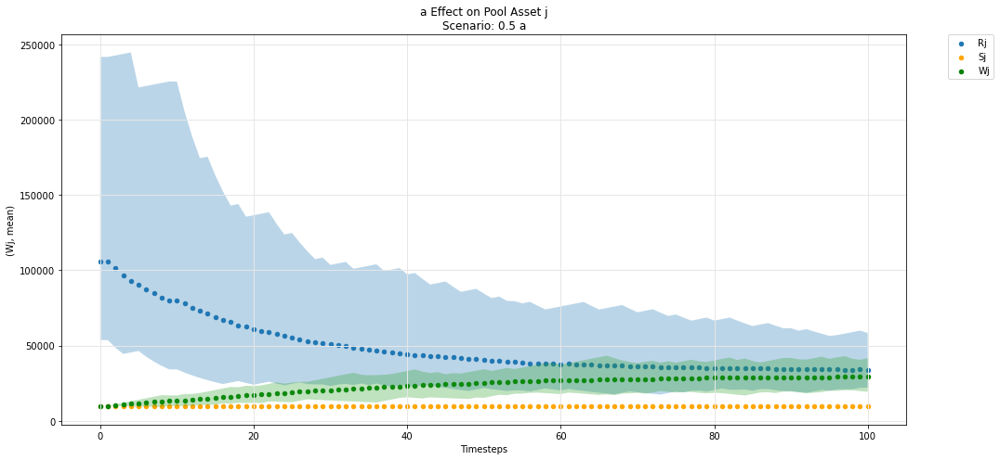

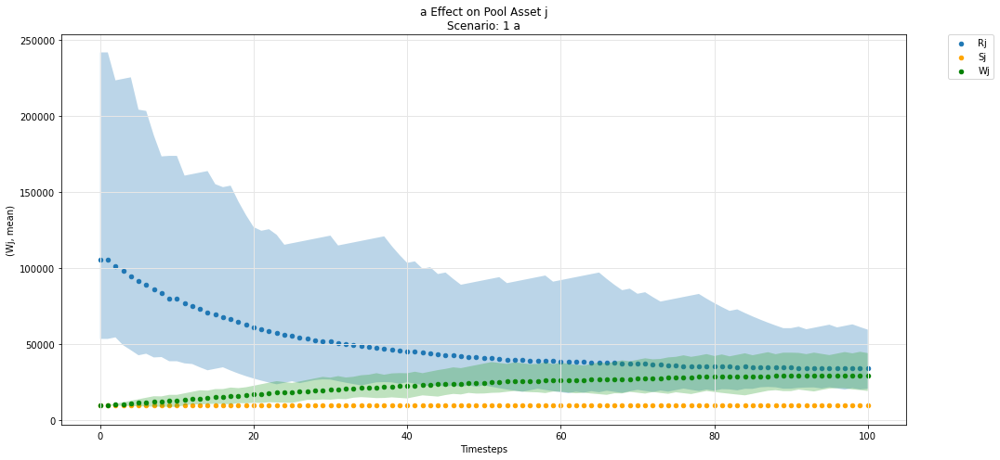

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

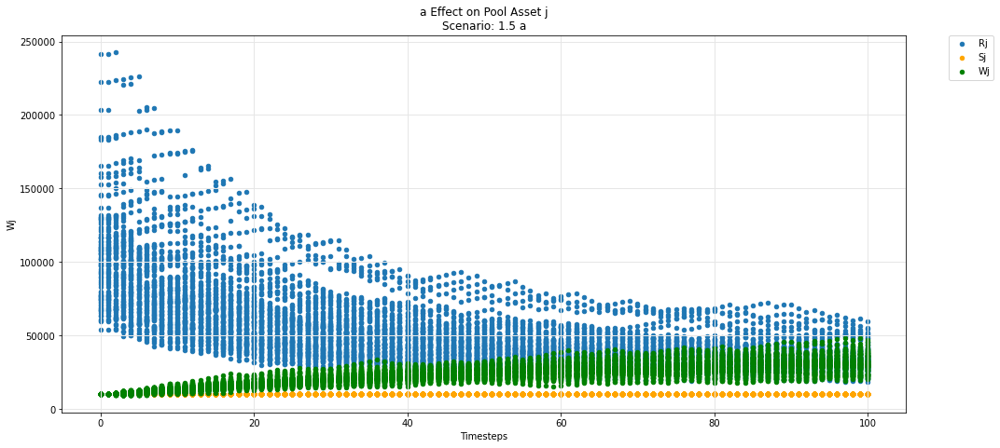

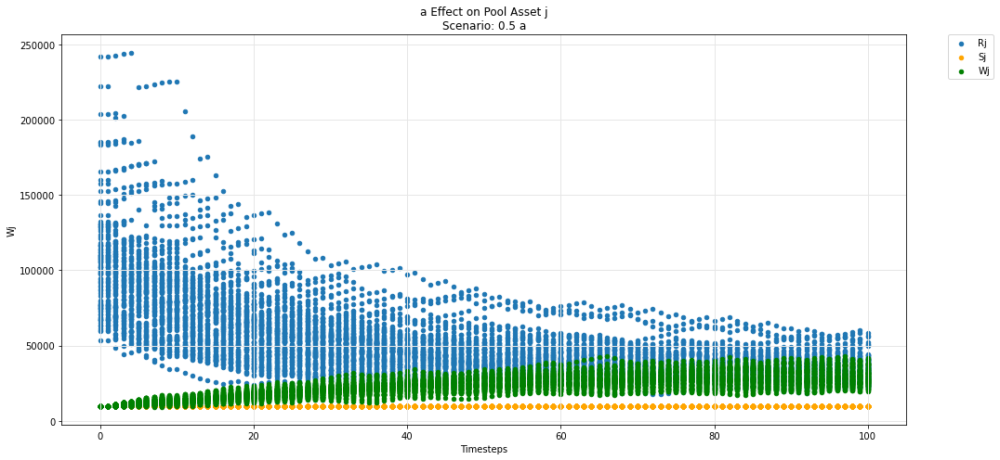

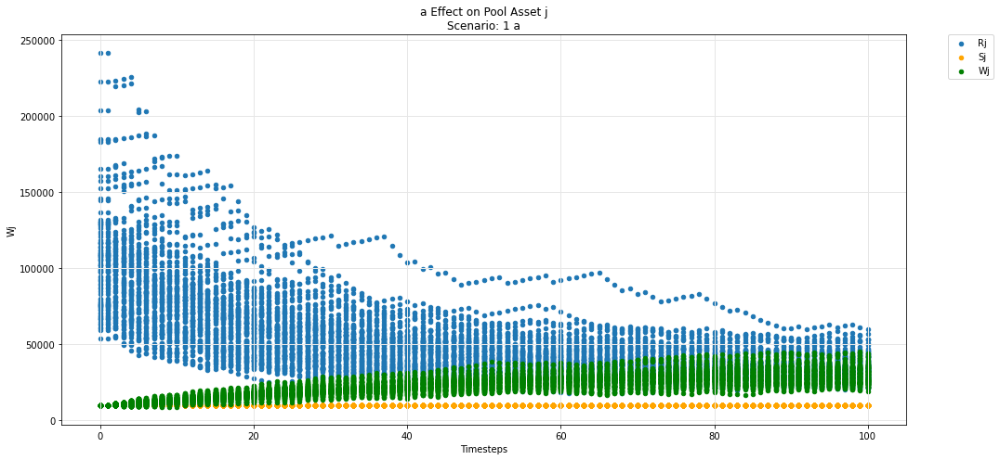

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

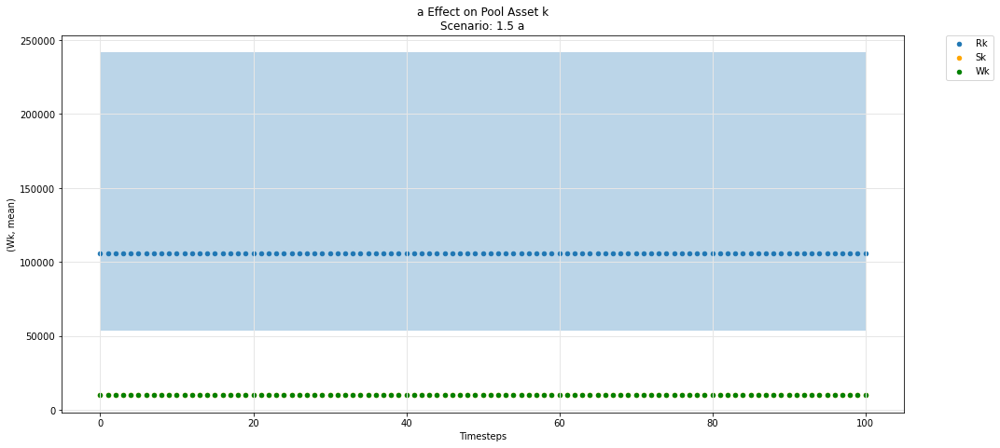

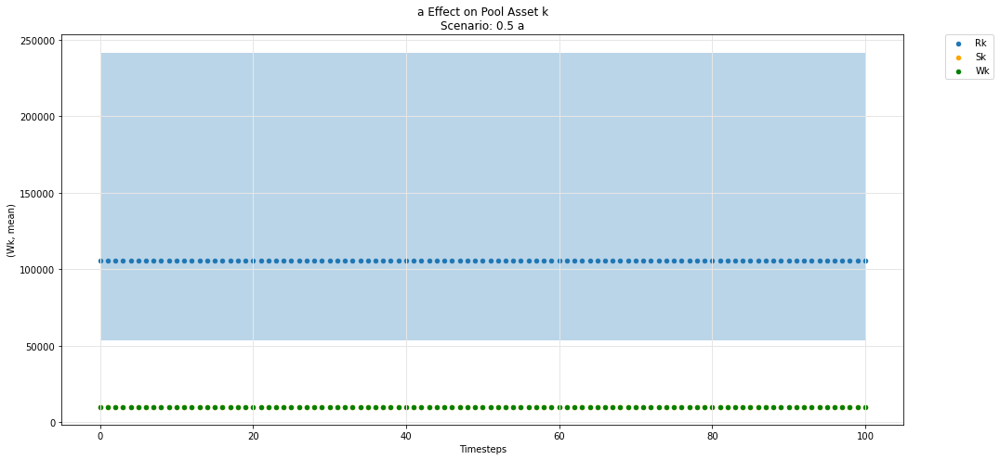

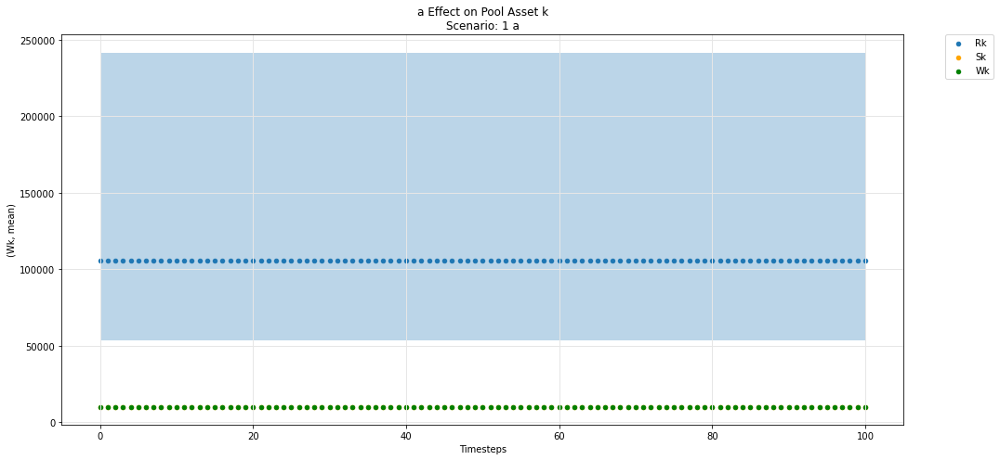

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

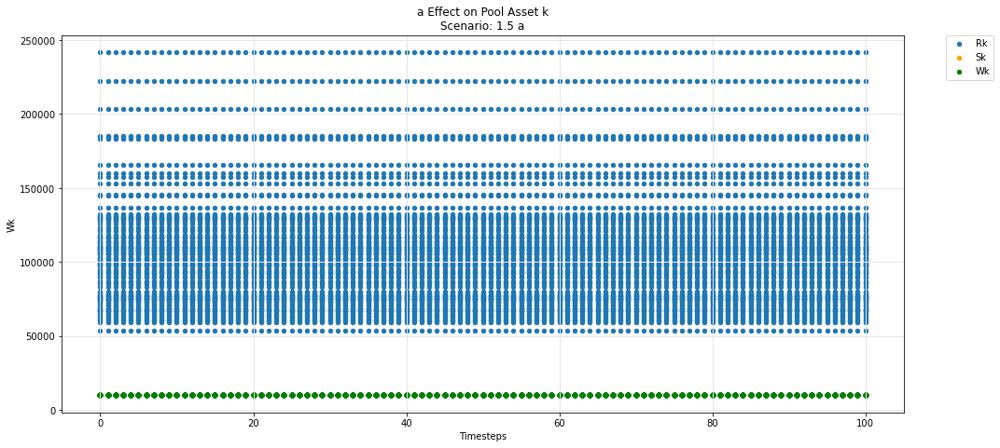

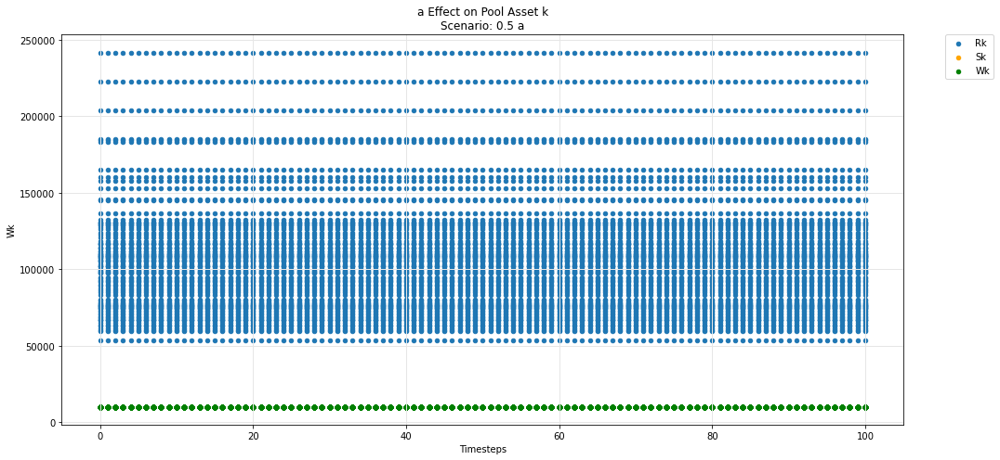

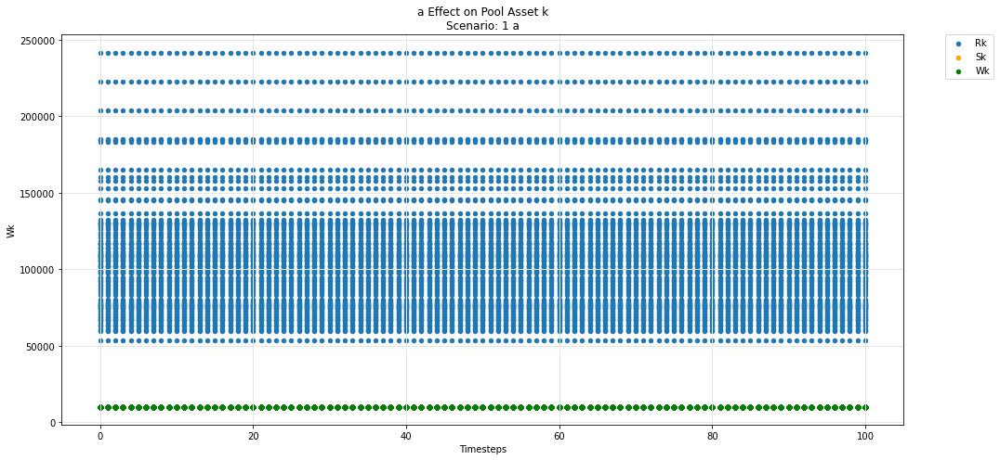

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

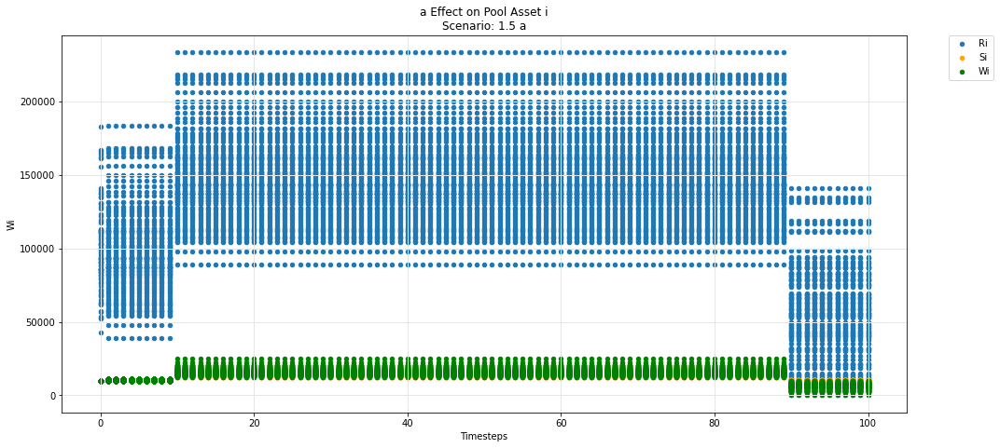

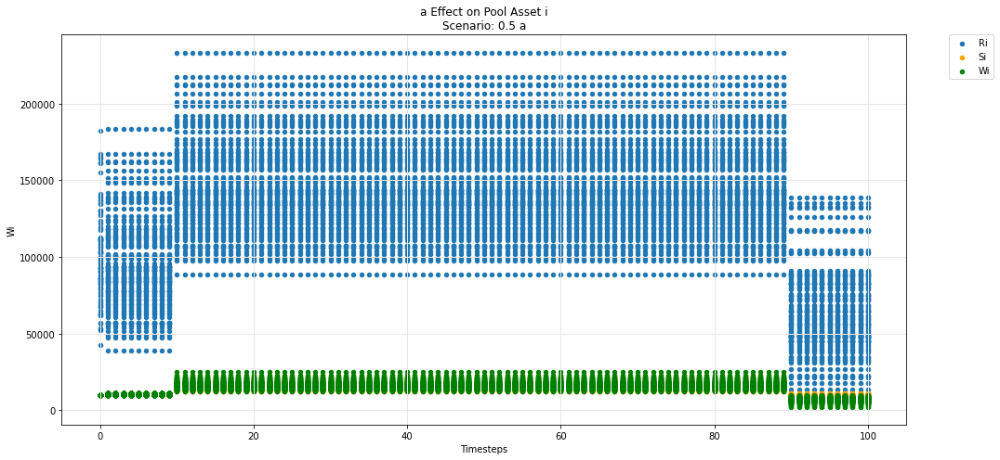

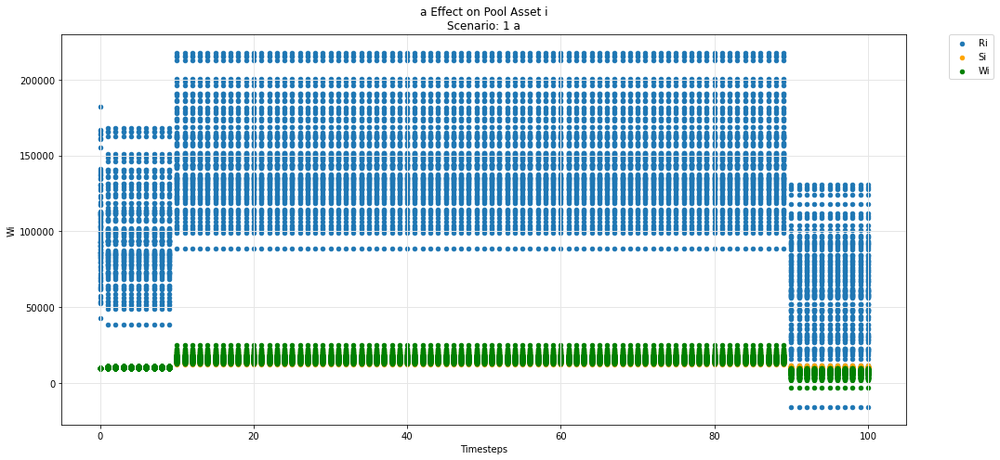

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

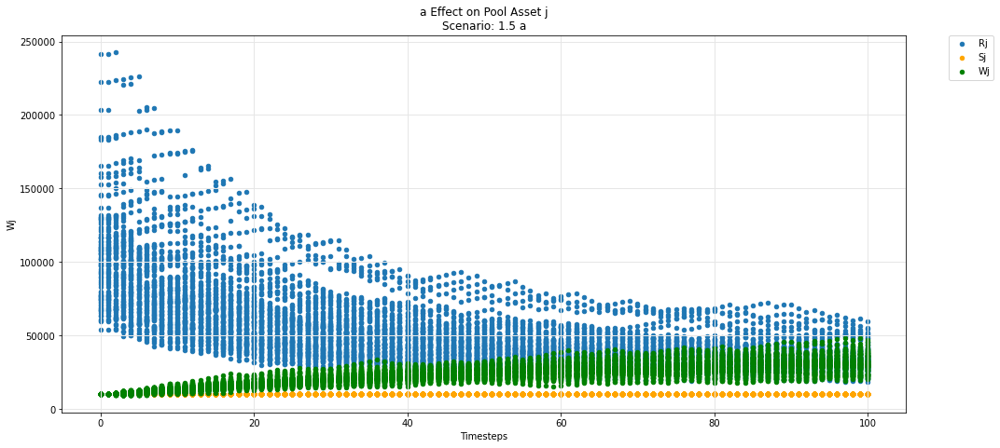

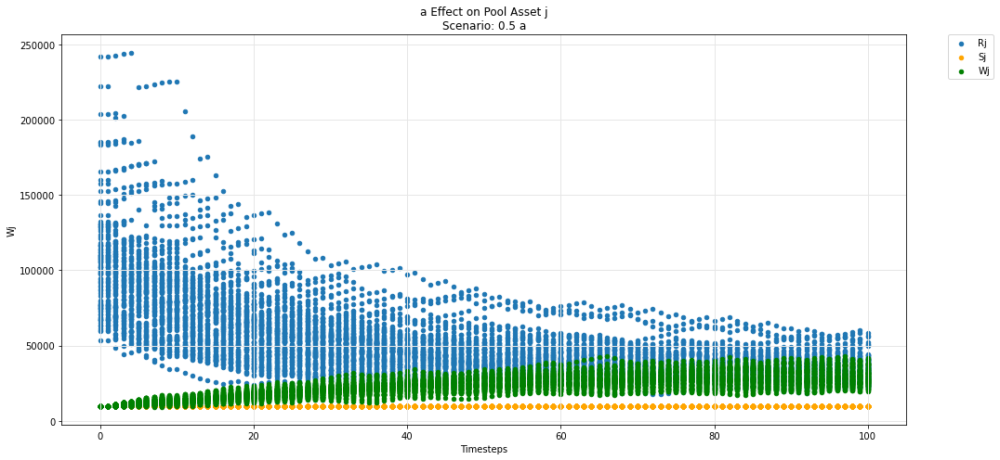

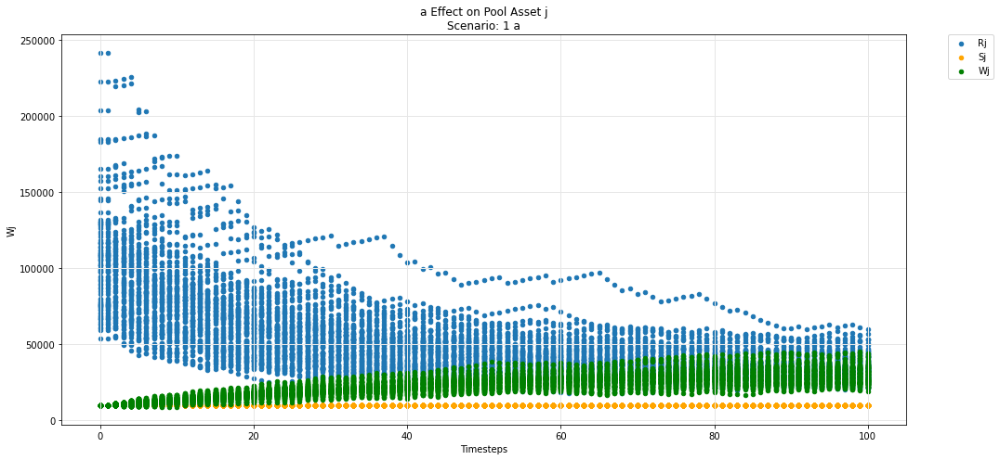

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

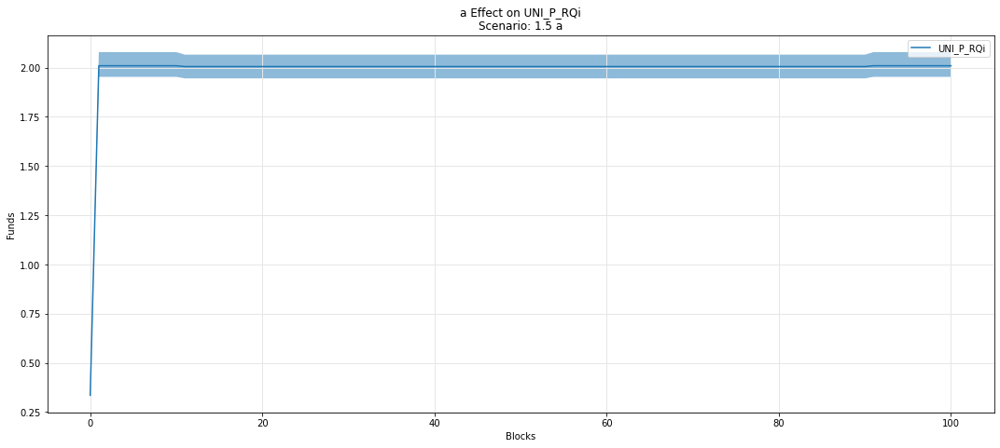

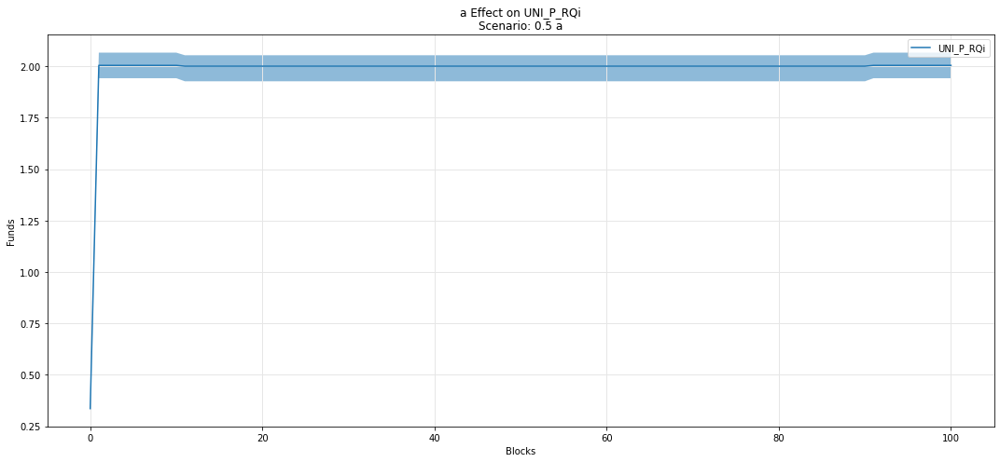

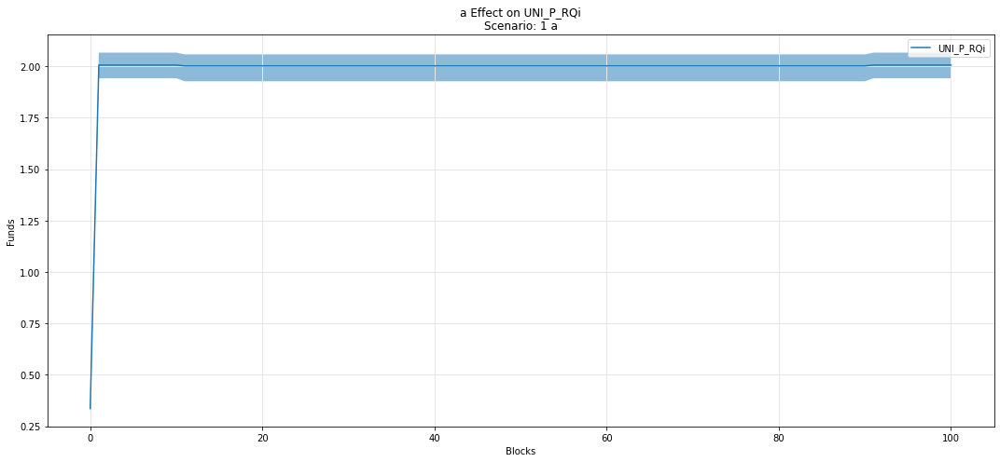

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

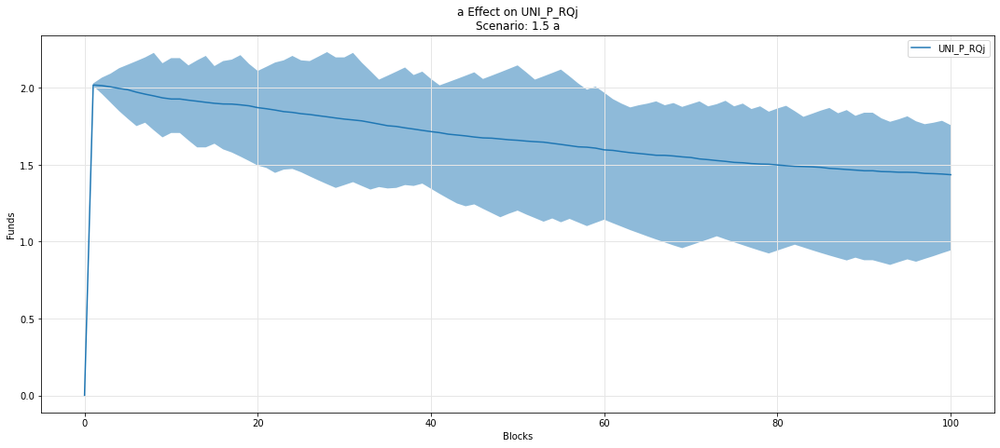

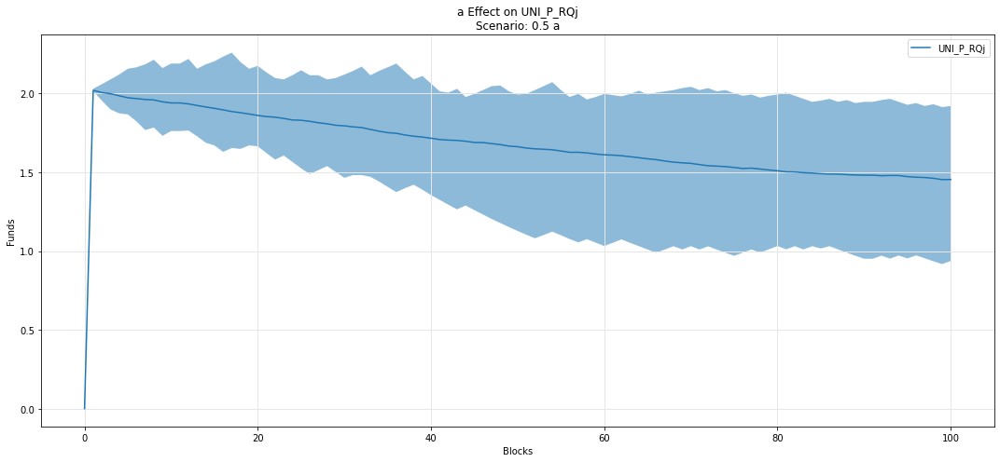

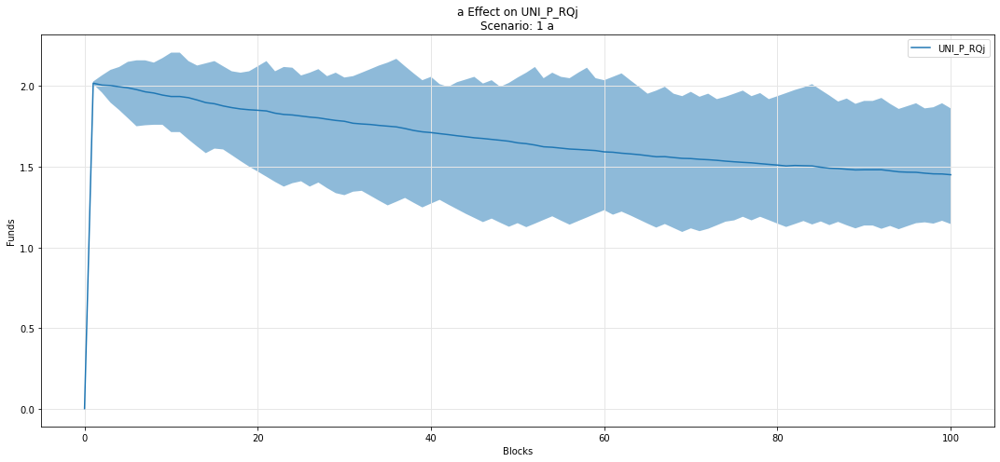

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

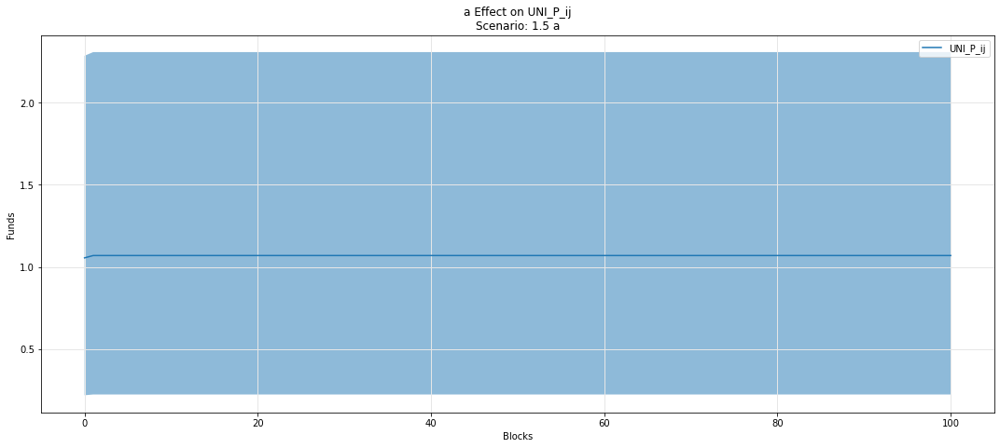

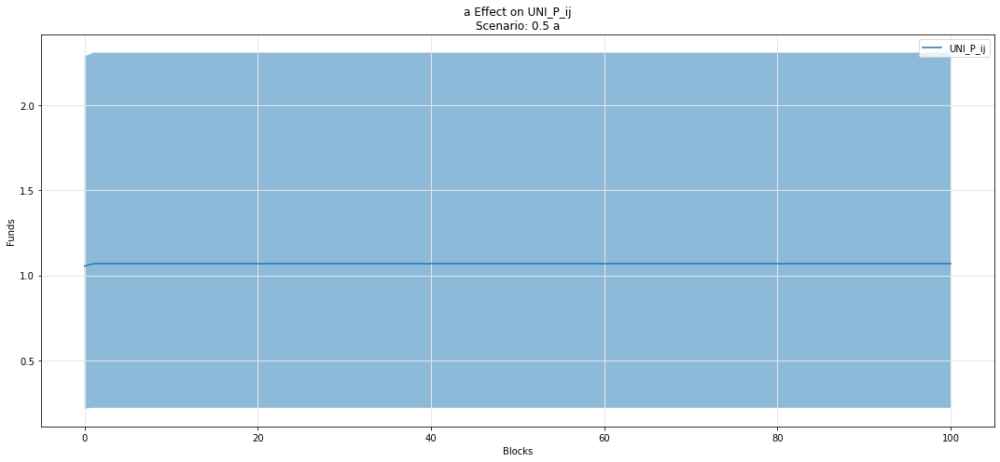

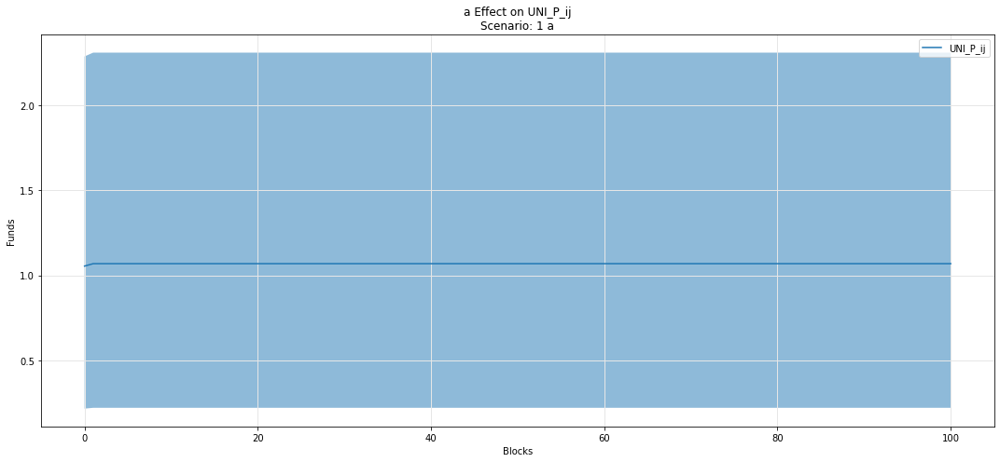

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

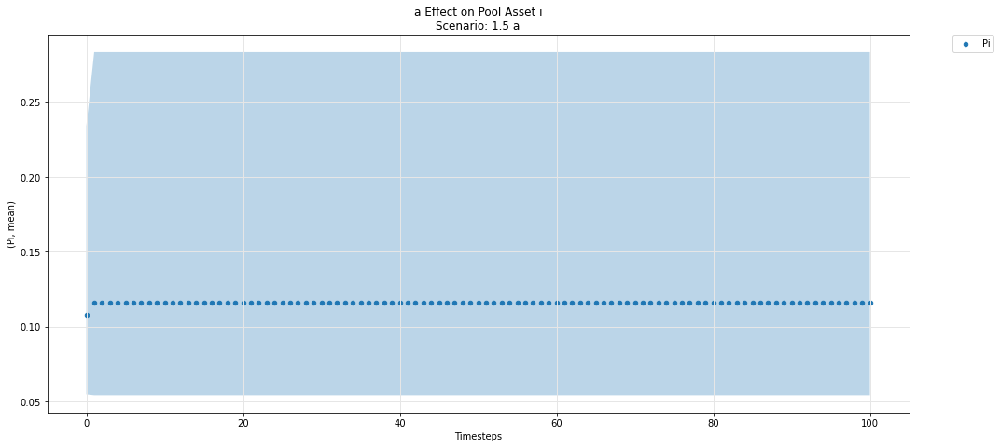

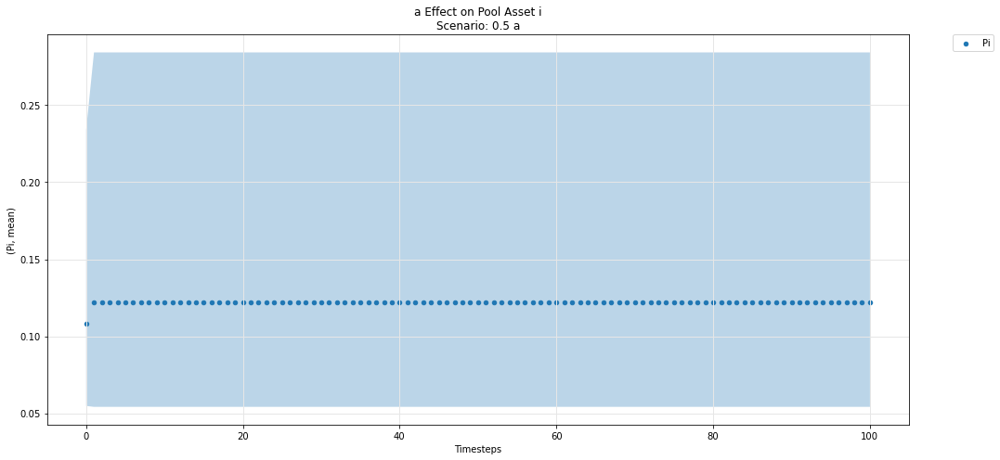

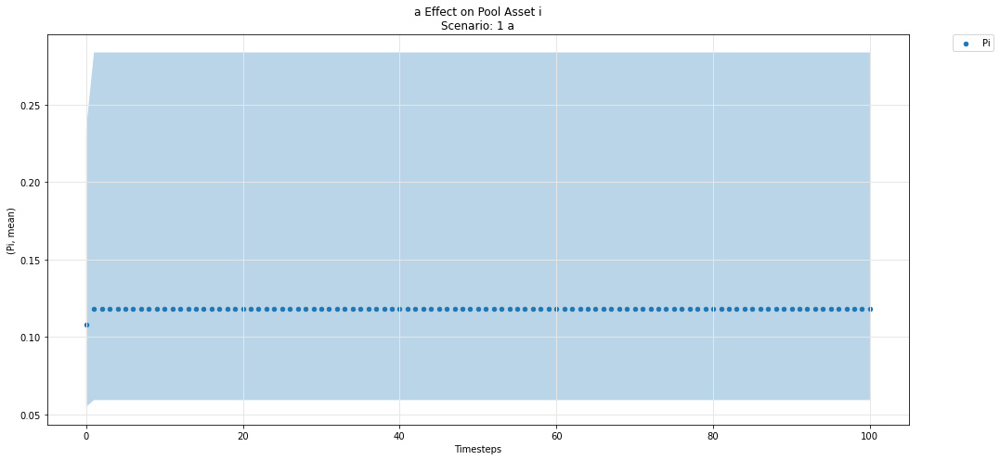

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

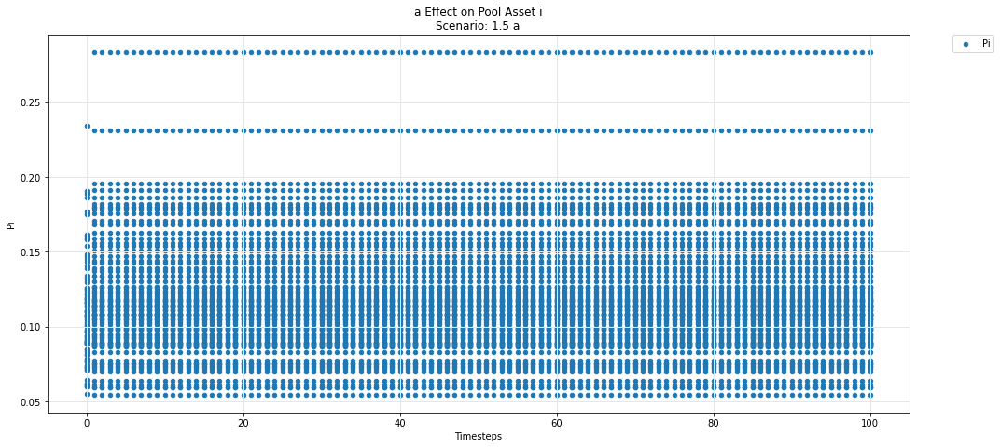

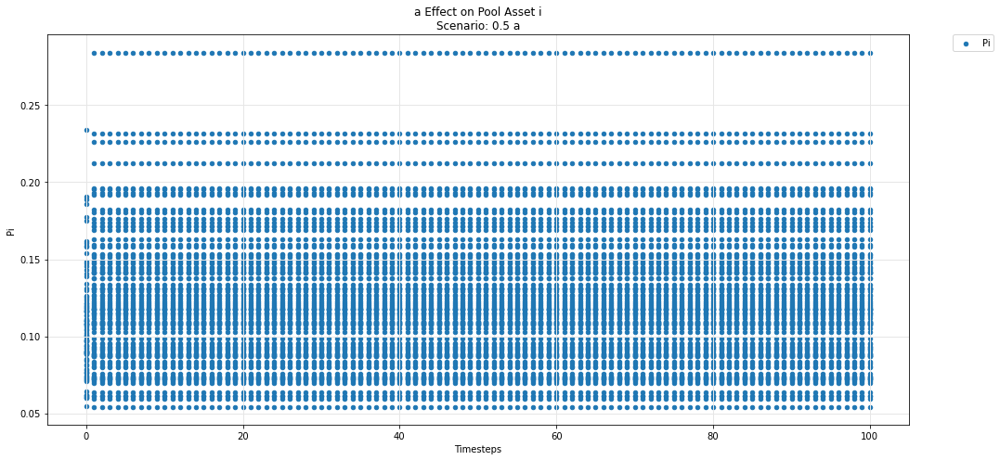

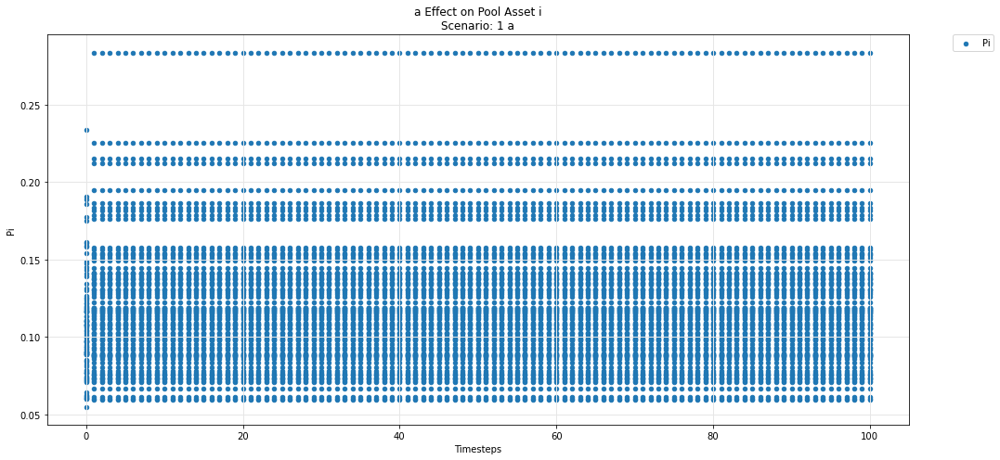

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

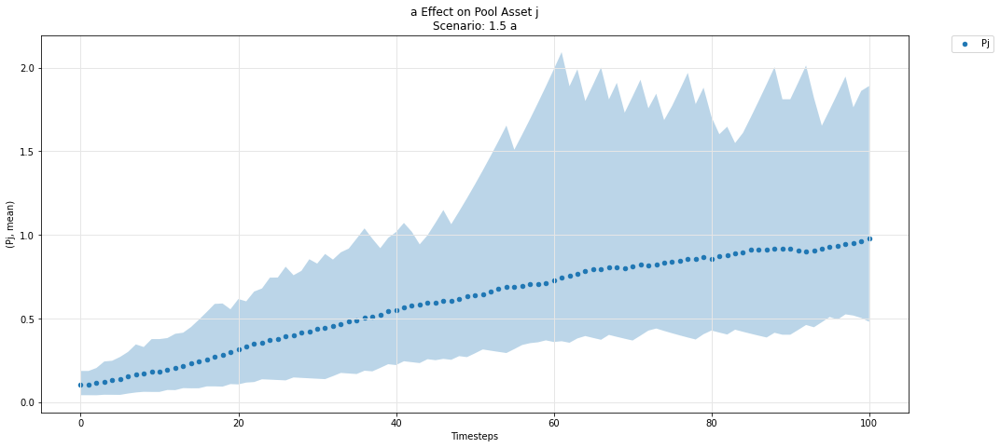

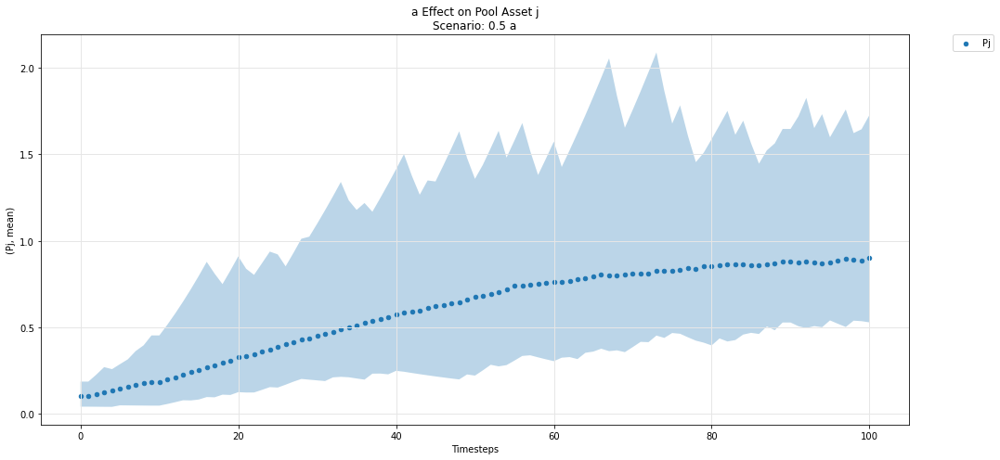

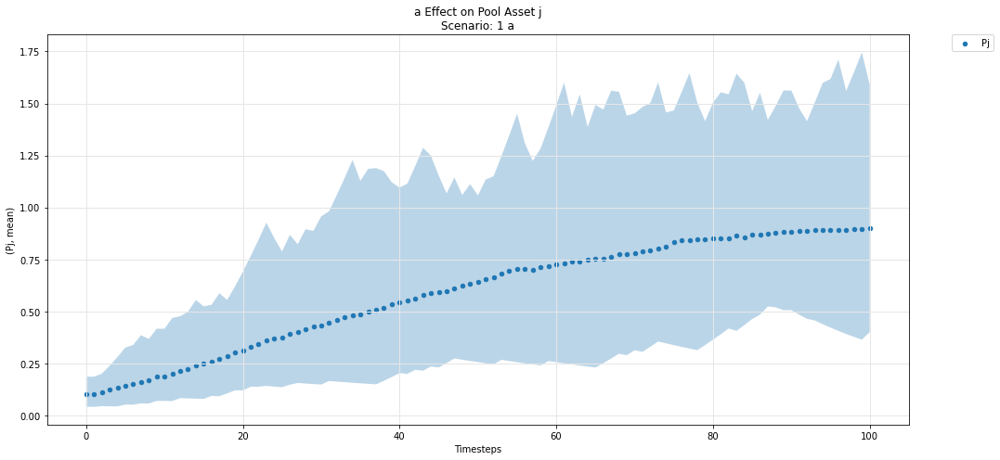

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

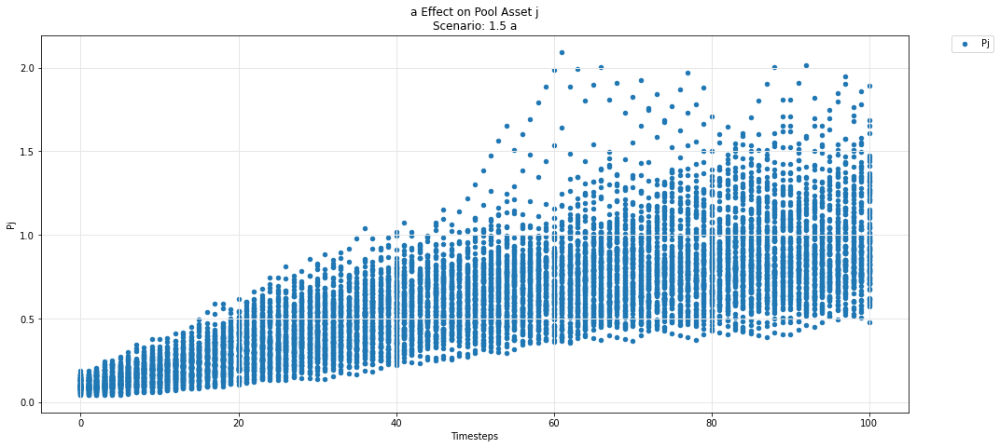

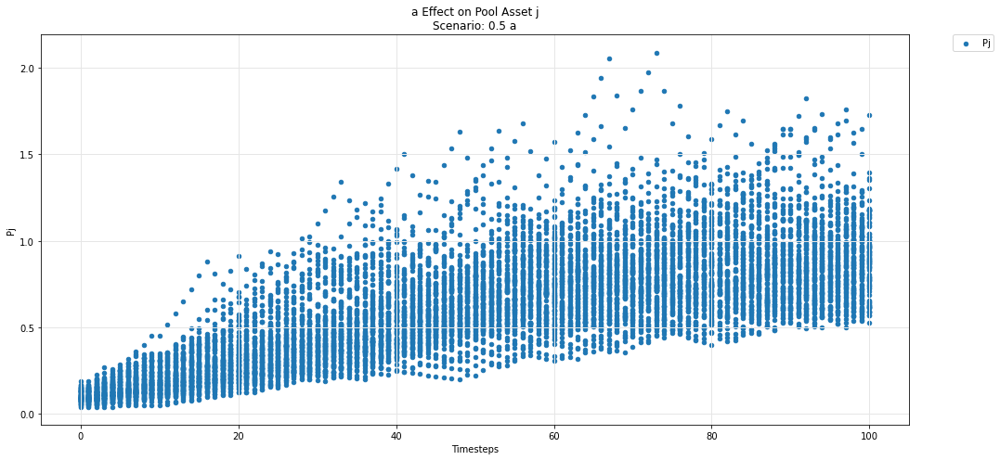

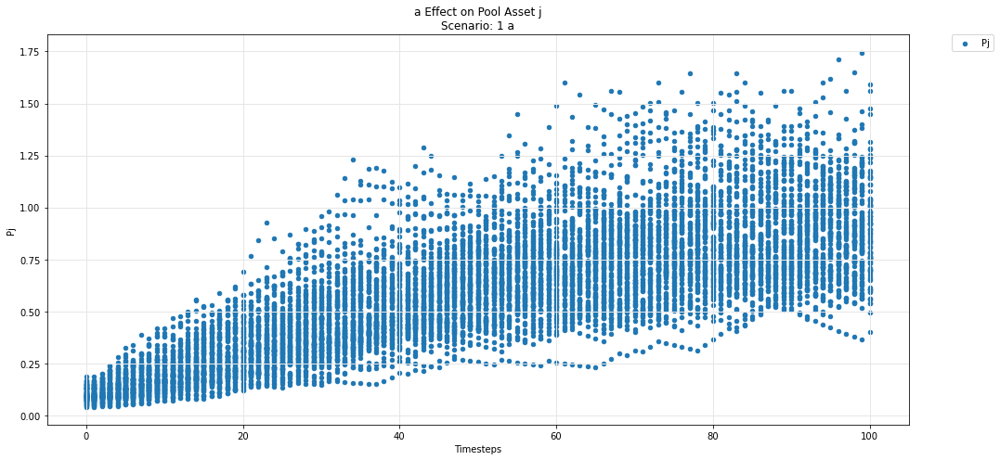

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

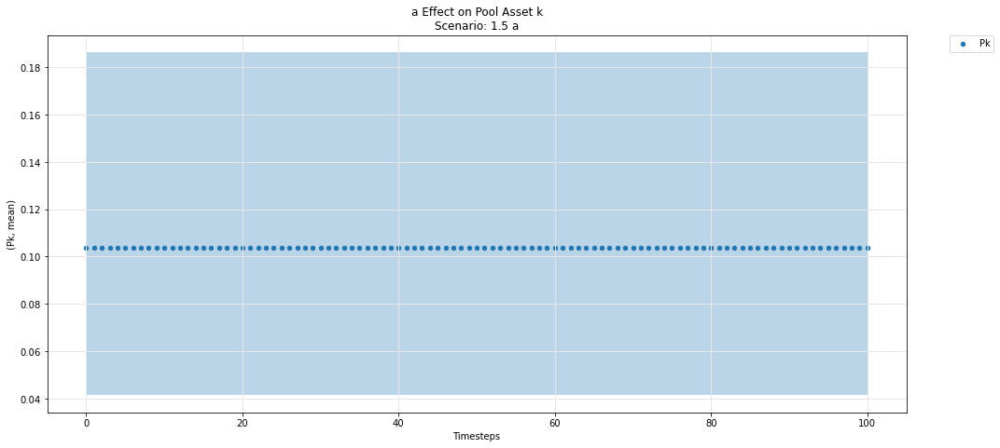

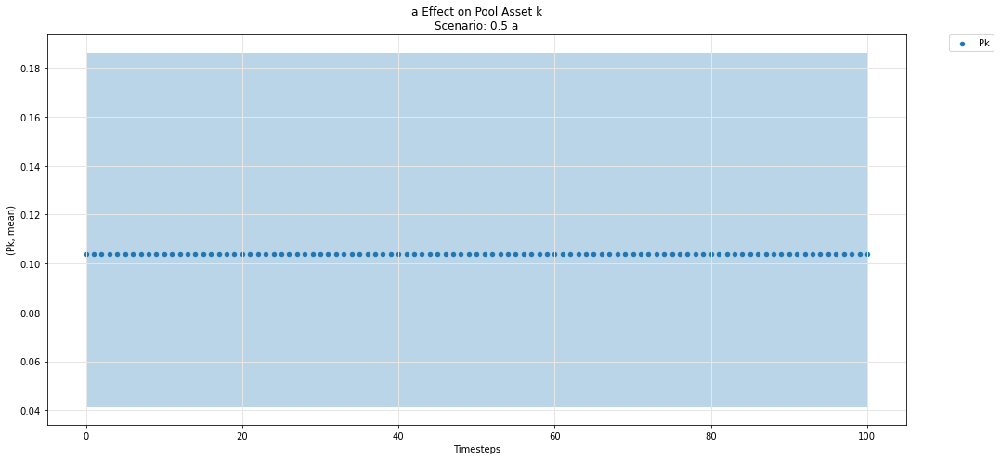

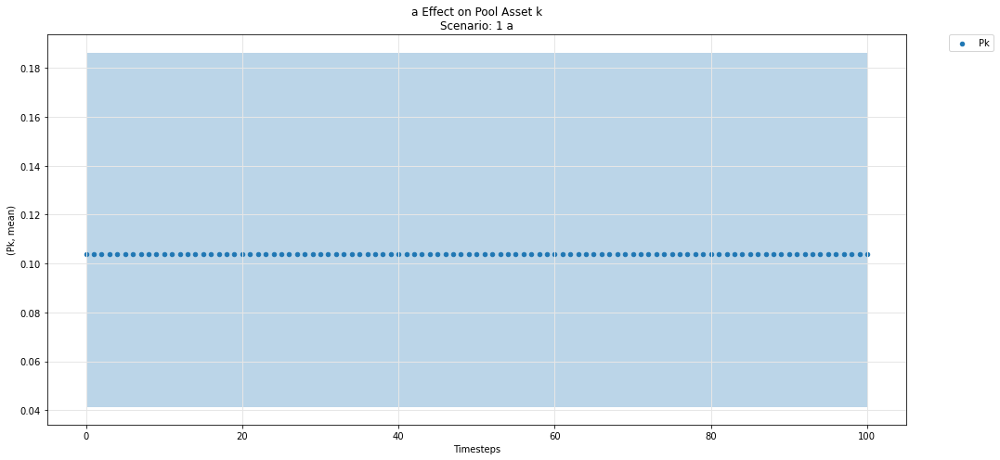

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

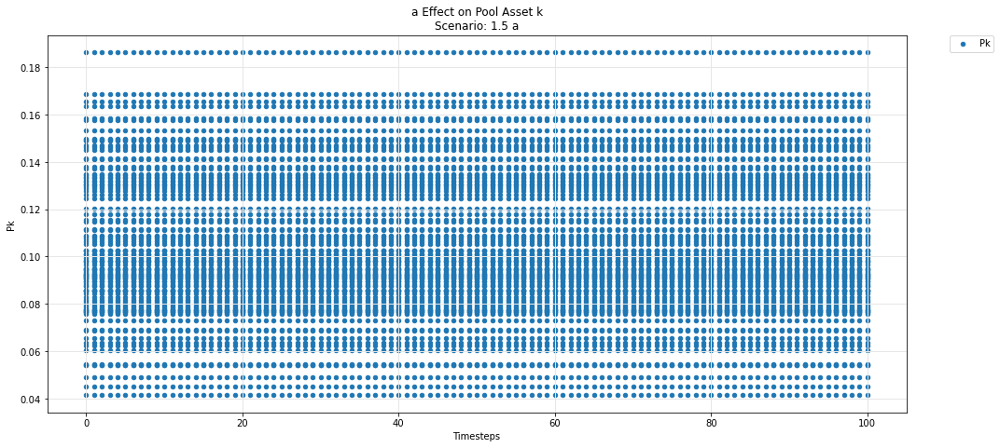

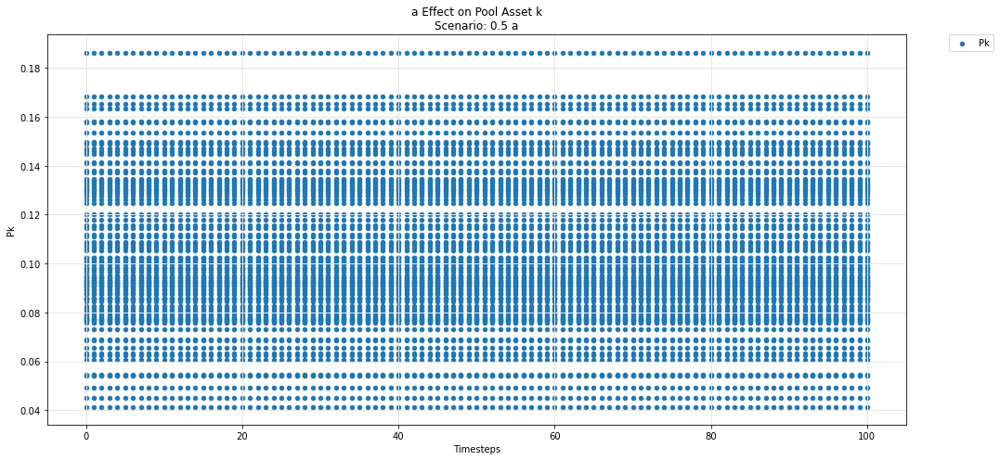

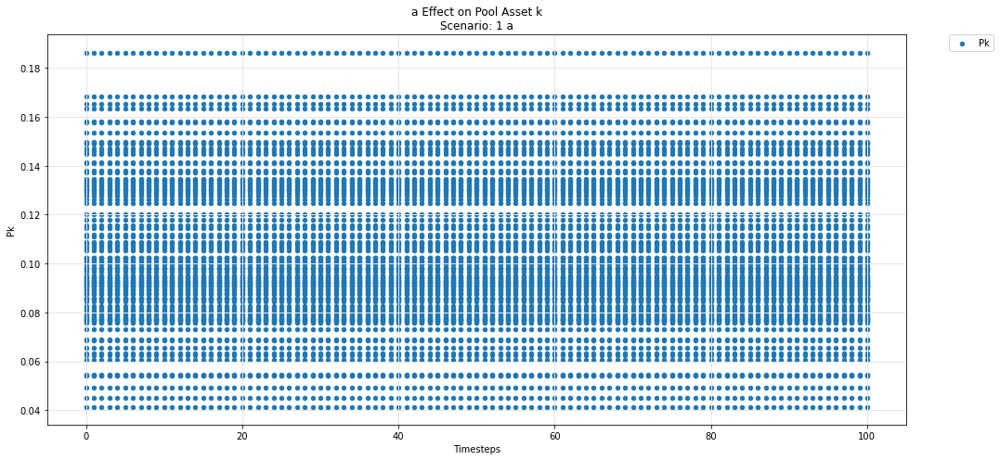

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')